# Práctica 2: Sensado y análisis de video

**Profesor:** Irvin Hussein Lopez Nava


**Estudiante:** Javier R 


**Curso:** CDSI2026



---

# 1. Recolección colectiva de videos

In [1]:
import zipfile
from concurrent.futures import ProcessPoolExecutor
from pathlib import Path


import bagpy
from bagpy import bagreader


from pathlib import Path
import os
import pyrealsense2 as rs

import pyrealsense2 as rs
import cv2
from pathlib import Path
import numpy as np
import pandas as pd
import re



In [ ]:
# BASE DIR = carpeta raíz del proyecto
BASE_DIR = Path.cwd()

ZIP_DIR = BASE_DIR / "zip_data" #en caso de descargar los archivos desde el drive, se guardan aquí
RAW_DIR = BASE_DIR / "raw_data"  #archivos con formato bag

RAW_DIR.mkdir(exist_ok=True)
ZIP_DIR.mkdir(exist_ok=True)

## Obtencion de datos

In [17]:
zip_files = list(ZIP_DIR.glob("*.zip"))
print(f"ZIPs encontrados: {len(zip_files)}")

ZIPs encontrados: 39


In [18]:
def unzip_file(zip_path):
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(RAW_DIR)

with ProcessPoolExecutor() as executor:
    executor.map(unzip_file, zip_files)

In [19]:
#eliminar subfolerderes vacíos de RAW_DIR
for subdir in RAW_DIR.iterdir():
    if subdir.is_dir() and not any(subdir.iterdir()):
        subdir.rmdir()

In [3]:
def check_extracted_files(raw_dir: Path, n_people: int, n_files_per_person: int):
    """
    Cuenta los archivos extraídos y determina si faltan o sobran
    respecto al número esperado.
    """
    extracted_files = [f for f in raw_dir.iterdir() if f.is_file()]
    total_extracted = len(extracted_files)

    expected_files = n_people * n_files_per_person
    difference = total_extracted - expected_files

    missing_files = max(0, -difference)
    extra_files = max(0, difference)

    print(f"Total de archivos: {total_extracted}")
    print(f"Sujetos de prueba: {n_people}")
    print(f"Archivos esperados: {expected_files}")
    print(f"Archivos faltantes: {missing_files}")
    print(f"Archivos sobrantes: {extra_files}")

    return {
        "extracted": total_extracted,
        "expected": expected_files,
        "missing": missing_files,
        "extra": extra_files
    }


In [22]:
stats = check_extracted_files(
    raw_dir=RAW_DIR,
    n_people=13,
    n_files_per_person=4
)

Total de archivos: 63
Sujetos de prueba: 13
Archivos esperados: 52
Archivos faltantes: 0
Archivos sobrantes: 11


### Limpieza de datos manual

Faltaron algunos ids de pruebas erroneas por lo que se hizo una exploracion manual para determinar la lista completa, por facilidad se transformaron a mp4 para verlos mas rapidamente

In [ ]:
MP4_DIR = Path.cwd() / "mp4_preview"

MP4_DIR.mkdir(exist_ok=True)

In [23]:
MP4_DIR = Path.cwd() / "mp4_preview"
MP4_DIR.mkdir(exist_ok=True)

for bag in RAW_DIR.glob("*.bag"):
    print(f"Procesando {bag.name}")

    pipeline = rs.pipeline()
    config = rs.config()
    config.enable_device_from_file(str(bag), repeat_playback=False)
    config.enable_stream(rs.stream.color)

    profile = pipeline.start(config)
    playback = profile.get_device().as_playback()
    playback.set_real_time(False)

    color_profile = profile.get_stream(rs.stream.color)
    color_intrinsics = color_profile.as_video_stream_profile().get_intrinsics()
    width, height = color_intrinsics.width, color_intrinsics.height

    out_path = MP4_DIR / f"{bag.stem}.mp4"
    out = cv2.VideoWriter(
        str(out_path),
        cv2.VideoWriter_fourcc(*"mp4v"),
        30,
        (width, height)
    )

    try:
        while True:
            frames = pipeline.wait_for_frames()
            color_frame = frames.get_color_frame()
            if not color_frame:
                continue

            color_image = cv2.cvtColor(
                np.asanyarray(color_frame.get_data()),
                cv2.COLOR_RGB2BGR
            )
            out.write(color_image)

    except RuntimeError:
        pass  # fin del bag

    finally:
        out.release()
        pipeline.stop()


Procesando grabacion_20260206_145337.bag
Procesando grabacion_20260206_145535.bag
Procesando grabacion_20260206_140722.bag
Procesando grabacion_20260206_141348.bag
Procesando grabacion_20260206_142748.bag
Procesando grabacion_20260206_150917.bag
Procesando grabacion_20260206_142829.bag
Procesando grabacion_20260206_145723.bag
Procesando grabacion_20260206_144604.bag
Procesando grabacion_20260206_144951.bag
Procesando grabacion_20260206_144331.bag
Procesando grabacion_20260206_150845.bag
Procesando grabacion_20260206_141750.bag
Procesando grabacion_20260206_141906.bag
Procesando grabacion_20260206_144055.bag
Procesando grabacion_20260206_141027.bag
Procesando grabacion_20260206_145240.bag
Procesando grabacion_20260206_145607.bag
Procesando grabacion_20260206_141436.bag
Procesando grabacion_20260206_144141.bag
Procesando grabacion_20260206_144015.bag
Procesando grabacion_20260206_150744.bag
Procesando grabacion_20260206_140957.bag
Procesando grabacion_20260206_141536.bag
Procesando graba

Se complemento de la siguiente lista de ids final:

ls
grabacion_20260206_140436.mp4  grabacion_20260206_142829.mp4
grabacion_20260206_141313.mp4  grabacion_20260206_143258.mp4
grabacion_20260206_141906.mp4  grabacion_20260206_143359.mp4
grabacion_20260206_141931.mp4  grabacion_20260206_144055.mp4
grabacion_20260206_141949.mp4  grabacion_20260206_150718.mp4
grabacion_20260206_142719.mp4




In [ ]:
from pathlib import Path
import shutil

MP4_DIR = Path.cwd() / "mp4_preview"
BAD_DIR = Path.cwd() / "mp4_bad"

BAD_DIR.mkdir(exist_ok=True)

bad_ids = {
    "140436",
    "142829",
    "141313",
    "143258",
    "141906",
    "143359",
    "141931",
    "144055",
    "141949",
    "150718",
    "142719"
}

moved = []

for mp4 in MP4_DIR.glob("*.mp4"):
    if any(mp4.name.endswith(f"{bid}.mp4") for bid in bad_ids):
        target = BAD_DIR / mp4.name
        shutil.move(str(mp4), str(target))
        moved.append(mp4.name)

print("MP4 movidos a mp4_bad:")
for f in moved:
    print(" -", f)

print(f"\nTotal movidos: {len(moved)}")


MP4 movidos a mp4_bad:
 - grabacion_20260206_143359.mp4
 - grabacion_20260206_142719.mp4
 - grabacion_20260206_150917.mp4
 - grabacion_20260206_141949.mp4
 - grabacion_20260206_141931.mp4
 - grabacion_20260206_141906.mp4
 - grabacion_20260206_141313.mp4
 - grabacion_20260206_140436.mp4
 - grabacion_20260206_144055.mp4
 - grabacion_20260206_142829.mp4
 - grabacion_20260206_143258.mp4

Total movidos: 11


In [27]:
total_mp4 = len(list(MP4_DIR.glob("*.mp4")))
print(f"Total de archivos MP4 restantes: {total_mp4}")
total_esperado = 13 * 4
print(f"Total de archivos MP4 esperados: {total_esperado}")

Total de archivos MP4 restantes: 52
Total de archivos MP4 esperados: 52


## Eliminación de videos 



In [ ]:
bad_ids = {
    "140436",
    "142829",
    "141313",
    "143258",
    "141906",
    "143359",
    "141931",
    "144055",
    "141949",
    "150718",
    "142719"
}

In [29]:

BAD_DIR = Path.cwd() / "bag_bad"

BAD_DIR.mkdir(exist_ok=True)

moved = []

for bag in RAW_DIR.glob("*.bag"):
    if any(bag.name.endswith(f"_{bid}.bag") for bid in bad_ids):
        shutil.move(str(bag), str(BAD_DIR / bag.name))
        moved.append(bag.name)

print("Archivos movidos a bag_bad:")
for f in moved:
    print(" -", f)

print(f"\nTotal movidos: {len(moved)} archivos")


Archivos movidos a bag_bad:
 - grabacion_20260206_150917.bag
 - grabacion_20260206_142829.bag
 - grabacion_20260206_141906.bag
 - grabacion_20260206_144055.bag
 - grabacion_20260206_141313.bag
 - grabacion_20260206_141949.bag
 - grabacion_20260206_142719.bag
 - grabacion_20260206_143359.bag
 - grabacion_20260206_141931.bag
 - grabacion_20260206_140436.bag
 - grabacion_20260206_143258.bag

Total movidos: 11 archivos


In [15]:
total_bags = len(list(RAW_DIR.glob("*.bag")))
print(f"Total de archivos BAG restantes: {total_bags}")
total_esperado = 13 * 4
print(f"Total de archivos BAG esperados: {total_esperado}")

Total de archivos BAG restantes: 52
Total de archivos BAG esperados: 52


In [18]:
stats = check_extracted_files(
    raw_dir=RAW_DIR,
    n_people=13,
    n_files_per_person=4
)

Total de archivos: 52
Sujetos de prueba: 13
Archivos esperados: 52
Archivos faltantes: 0
Archivos sobrantes: 0


## Etiquetas

In [19]:
subjects = [
    "DIA", "ZAR", "JAV", "ERI", "EDG", "MIN",
    "IAN", "MAR", "JOS", "NOR", "JOA", "TON", "HUS"
]

In [ ]:
DATA_DIR = Path.cwd() / "data"
DATA_DIR.mkdir(exist_ok=True)

pattern = re.compile(r"grabacion_20260206_(\d+)\.bag")

# recolectar y ordenar
bag_files = []
for f in RAW_DIR.glob("*.bag"):
    m = pattern.match(f.name)
    if m:
        bag_files.append((int(m.group(1)), f))

bag_files.sort(key=lambda x: x[0])

expected = len(subjects) * 4
assert len(bag_files) == expected, "Número de archivos incorrecto"

rows = []
idx = 0

for subject in subjects:
    subject_dir = DATA_DIR / subject
    subject_dir.mkdir(exist_ok=True)

    for take in range(1, 5):
        old_file = bag_files[idx][1]

        new_name = f"ID_20260206_{take:02d}.bag"
        new_path = subject_dir / new_name

        old_file.rename(new_path)

        rows.append({
            "archivo_original": old_file.name,
            "archivo_anonimo": new_name,
            "id": "ID_20260206",
            "participante": subject,
            "toma": take
        })

        idx += 1

# CSV final
df = pd.DataFrame(rows)
df.to_csv(DATA_DIR / "etiquetas.csv", index=False)


# 2. Extracción de puntos clave (keypoints)

---


Los landmarks analizados corresponden a las siguientes partes del cuerpo:

0 – Nose (nariz)

11 – Left shoulder (hombro izquierdo)

12 – Right shoulder (hombro derecho)

13 – Left elbow (codo izquierdo)

14 – Right elbow (codo derecho)

15 – Left wrist (muñeca izquierda)

16 – Right wrist (muñeca derecha)

23 – Left hip (cadera izquierda)

24 – Right hip (cadera derecha)

25 – Left knee (rodilla izquierda)

26 – Right knee (rodilla derecha)

27 – Left ankle (tobillo izquierdo)

28 – Right ankle (tobillo derecho)

Estos puntos fueron seleccionados porque representan articulaciones principales del cuerpo, útiles para analizar postura, movimiento y estabilidad general del esqueleto.


---- 


In [22]:
from pathlib import Path
import csv
import numpy as np
import cv2
import pyrealsense2 as rs
import mediapipe as mp
from mediapipe.tasks import python
from mediapipe.tasks.python import vision

# ================= CONFIGURACIÓN =================

RAW_DIR = Path("raw_data")
OUT_DIR = Path("annotations")
OUT_DIR.mkdir(exist_ok=True)

MODEL_PATH = "pose_landmarker_heavy.task"

# Landmarks relevantes para marcha (13 puntos)
LANDMARK_IDS = [
    0,   # Nose
    11, 12,  # Shoulders
    13, 14,  # Elbows
    15, 16,  # Wrists (opcional)
    23, 24,  # Hips
    25, 26,  # Knees
    27, 28   # Ankles
]

# ================= PROCESAMIENTO =================

for bag_path in sorted(RAW_DIR.glob("*.bag")):
    print(f"\n▶ Procesando: {bag_path.name}")

    output_csv = OUT_DIR / bag_path.with_suffix(".csv").name

    # ---------- CREAR LANDMARKER EN MODO IMAGE ----------
    base_options = python.BaseOptions(model_asset_path=MODEL_PATH)
    options = vision.PoseLandmarkerOptions(
        base_options=base_options,
        running_mode=vision.RunningMode.IMAGE,  # modo IMAGE
        num_poses=1
    )
    pose_landmarker = vision.PoseLandmarker.create_from_options(options)

    # ---------- RealSense ----------
    pipeline = rs.pipeline()
    config = rs.config()
    rs.config.enable_device_from_file(config, str(bag_path))
    config.enable_stream(rs.stream.depth)
    config.enable_stream(rs.stream.color)

    profile = pipeline.start(config)
    playback = profile.get_device().as_playback()
    playback.set_real_time(False)

    align = rs.align(rs.stream.color)

    with open(output_csv, "w", newline="") as f:
        writer = csv.writer(f)

        # Header CSV
        header = ["frame"]
        for i in LANDMARK_IDS:
            header += [f"x{i}", f"y{i}", f"z{i}"]
        writer.writerow(header)

        frame_idx = 0

        try:
            while True:
                frames = pipeline.wait_for_frames()
                aligned = align.process(frames)

                depth_frame = aligned.get_depth_frame()
                color_frame = aligned.get_color_frame()
                if not depth_frame or not color_frame:
                    break

                color_img = np.asanyarray(color_frame.get_data())
                rgb = cv2.cvtColor(color_img, cv2.COLOR_BGR2RGB)

                # MediaPipe detect() no usa timestamps
                mp_image = mp.Image(
                    image_format=mp.ImageFormat.SRGB,
                    data=rgb
                )

                result = pose_landmarker.detect(mp_image)  

                if result.pose_landmarks:
                    lmks = result.pose_landmarks[0]
                    row = [frame_idx]

                    h, w, _ = color_img.shape

                    for idx in LANDMARK_IDS:
                        lm = lmks[idx]

                        # Pixel para Depth
                        px = int(lm.x * w)
                        py = int(lm.y * h)

                        # Profundidad real
                        z = depth_frame.get_distance(px, py)

                        row.extend([lm.x, lm.y, z])

                    writer.writerow(row)

                frame_idx += 1

        except RuntimeError:
            pass

    pipeline.stop()
    pose_landmarker.close()

    print(f" CSV guardado: {output_csv}")

print("\n Procesamiento finalizado para todos los .bag")


2026-02-08 18:33:39.538127: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.



▶ Procesando: grabacion_20260206_140603.bag


INFO: Created TensorFlow Lite XNNPACK delegate for CPU.
W0000 00:00:1770604421.966954    7861 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604422.048160    7860 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604422.306635    7862 landmark_projection_calculator.cc:78] Using NORM_RECT without IMAGE_DIMENSIONS is only supported for the square ROI. Provide IMAGE_DIMENSIONS or use PROJECTION_MATRIX.


 CSV guardado: annotations/grabacion_20260206_140603.csv

▶ Procesando: grabacion_20260206_140652.bag


W0000 00:00:1770604432.348906    7897 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604432.403754    7902 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_140652.csv

▶ Procesando: grabacion_20260206_140722.bag


W0000 00:00:1770604438.058694    7927 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604438.114017    7923 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_140722.csv

▶ Procesando: grabacion_20260206_140800.bag


W0000 00:00:1770604447.580950    7953 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604447.635780    7957 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_140800.csv

▶ Procesando: grabacion_20260206_140924.bag


W0000 00:00:1770604451.985768    7986 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604452.040486    7990 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_140924.csv

▶ Procesando: grabacion_20260206_140957.bag


W0000 00:00:1770604460.104497    8012 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604460.153821    8021 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_140957.csv

▶ Procesando: grabacion_20260206_141027.bag


W0000 00:00:1770604466.477186    8045 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604466.524996    8046 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_141027.csv

▶ Procesando: grabacion_20260206_141104.bag


W0000 00:00:1770604470.593261    8069 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604470.619136    8079 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_141104.csv

▶ Procesando: grabacion_20260206_141202.bag


W0000 00:00:1770604476.600923    8102 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604476.649455    8105 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_141202.csv

▶ Procesando: grabacion_20260206_141348.bag


W0000 00:00:1770604488.838591    8133 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604488.881145    8134 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_141348.csv

▶ Procesando: grabacion_20260206_141436.bag


W0000 00:00:1770604491.490973    8165 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604491.526087    8165 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_141436.csv

▶ Procesando: grabacion_20260206_141536.bag


W0000 00:00:1770604493.744773    8193 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604493.794388    8192 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_141536.csv

▶ Procesando: grabacion_20260206_141750.bag


W0000 00:00:1770604503.142442    8221 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604503.188608    8226 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_141750.csv

▶ Procesando: grabacion_20260206_141828.bag


W0000 00:00:1770604516.537271    8253 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604516.571976    8261 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_141828.csv

▶ Procesando: grabacion_20260206_142748.bag


W0000 00:00:1770604529.695376    8281 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604529.746646    8282 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_142748.csv

▶ Procesando: grabacion_20260206_142901.bag


W0000 00:00:1770604545.074723    8312 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604545.106723    8319 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_142901.csv

▶ Procesando: grabacion_20260206_143216.bag


W0000 00:00:1770604559.011384    8345 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604559.057579    8343 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_143216.csv

▶ Procesando: grabacion_20260206_143908.bag


W0000 00:00:1770604576.328986    8381 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604576.375676    8383 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_143908.csv

▶ Procesando: grabacion_20260206_143938.bag


W0000 00:00:1770604587.170374    8411 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604587.216845    8413 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_143938.csv

▶ Procesando: grabacion_20260206_144015.bag


W0000 00:00:1770604595.968418    8445 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604596.015565    8452 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_144015.csv

▶ Procesando: grabacion_20260206_144141.bag


W0000 00:00:1770604605.135329    8478 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604605.186393    8472 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_144141.csv

▶ Procesando: grabacion_20260206_144302.bag


W0000 00:00:1770604612.487165    8499 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604612.513448    8509 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_144302.csv

▶ Procesando: grabacion_20260206_144331.bag


W0000 00:00:1770604618.621854    8532 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604618.647397    8530 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_144331.csv

▶ Procesando: grabacion_20260206_144403.bag


W0000 00:00:1770604624.554221    8557 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604624.580005    8566 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_144403.csv

▶ Procesando: grabacion_20260206_144604.bag


W0000 00:00:1770604631.615026    8786 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604631.662043    8791 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_144604.csv

▶ Procesando: grabacion_20260206_144703.bag


W0000 00:00:1770604638.739640    8812 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604638.787676    8810 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_144703.csv

▶ Procesando: grabacion_20260206_144732.bag


W0000 00:00:1770604644.726961    8841 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604644.773164    8848 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_144732.csv

▶ Procesando: grabacion_20260206_144808.bag


W0000 00:00:1770604651.616034    8873 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604651.650751    8878 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_144808.csv

▶ Procesando: grabacion_20260206_144855.bag


W0000 00:00:1770604658.216939    9087 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604658.263855    9096 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_144855.csv

▶ Procesando: grabacion_20260206_144925.bag


W0000 00:00:1770604663.399069    9116 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604663.445986    9124 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_144925.csv

▶ Procesando: grabacion_20260206_144951.bag


W0000 00:00:1770604668.167692    9145 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604668.217438    9155 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_144951.csv

▶ Procesando: grabacion_20260206_145050.bag


W0000 00:00:1770604673.802506    9178 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604673.844511    9181 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_145050.csv

▶ Procesando: grabacion_20260206_145215.bag


W0000 00:00:1770604679.287770    9202 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604679.343393    9202 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_145215.csv

▶ Procesando: grabacion_20260206_145240.bag


W0000 00:00:1770604689.411512    9247 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604689.437032    9249 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_145240.csv

▶ Procesando: grabacion_20260206_145312.bag


W0000 00:00:1770604699.352377    9277 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604699.378746    9274 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_145312.csv

▶ Procesando: grabacion_20260206_145337.bag


W0000 00:00:1770604709.302540    9309 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604709.337524    9309 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_145337.csv

▶ Procesando: grabacion_20260206_145450.bag


W0000 00:00:1770604719.766707    9334 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604719.821225    9334 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_145450.csv

▶ Procesando: grabacion_20260206_145535.bag


W0000 00:00:1770604727.824448    9368 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604727.850587    9364 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_145535.csv

▶ Procesando: grabacion_20260206_145607.bag


W0000 00:00:1770604736.141813    9387 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604736.173853    9394 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_145607.csv

▶ Procesando: grabacion_20260206_145723.bag


W0000 00:00:1770604744.735977    9422 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604744.782146    9425 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_145723.csv

▶ Procesando: grabacion_20260206_150744.bag


W0000 00:00:1770604750.889647    9454 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604750.924822    9461 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_150744.csv

▶ Procesando: grabacion_20260206_150811.bag


W0000 00:00:1770604760.145889    9480 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604760.171702    9482 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_150811.csv

▶ Procesando: grabacion_20260206_150845.bag


W0000 00:00:1770604767.341416    9509 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604767.384820    9511 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_150845.csv

▶ Procesando: grabacion_20260206_150917.bag


W0000 00:00:1770604773.136746    9537 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604773.182908    9546 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_150917.csv

▶ Procesando: grabacion_20260206_151013.bag


W0000 00:00:1770604780.634877    9570 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604780.681019    9575 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_151013.csv

▶ Procesando: grabacion_20260206_151037.bag


W0000 00:00:1770604792.377080    9599 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604792.427609    9604 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_151037.csv

▶ Procesando: grabacion_20260206_151104.bag


W0000 00:00:1770604801.345320    9671 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604801.382326    9671 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_151104.csv

▶ Procesando: grabacion_20260206_151132.bag


W0000 00:00:1770604813.025784    9842 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604813.063018    9846 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_151132.csv

▶ Procesando: grabacion_20260206_151222.bag


W0000 00:00:1770604826.446329   10010 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604826.492905   10017 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_151222.csv

▶ Procesando: grabacion_20260206_151254.bag


W0000 00:00:1770604834.789417   10139 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604834.821433   10139 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_151254.csv

▶ Procesando: grabacion_20260206_151333.bag


W0000 00:00:1770604844.101607   10391 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604844.133677   10395 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_151333.csv

▶ Procesando: grabacion_20260206_151401.bag


W0000 00:00:1770604853.078820   10656 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770604853.114412   10658 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


 CSV guardado: annotations/grabacion_20260206_151401.csv

 Procesamiento finalizado para todos los .bag


## Análisis Exploratorio de Datos (EDA)

In [8]:
import pandas as pd

df = pd.read_csv("annotations/grabacion_20260206_140603.csv")
df.head()
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 102 entries, 0 to 101
Data columns (total 40 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   frame   102 non-null    int64  
 1   x0      102 non-null    float64
 2   y0      102 non-null    float64
 3   z0      102 non-null    float64
 4   x11     102 non-null    float64
 5   y11     102 non-null    float64
 6   z11     102 non-null    float64
 7   x12     102 non-null    float64
 8   y12     102 non-null    float64
 9   z12     102 non-null    float64
 10  x13     102 non-null    float64
 11  y13     102 non-null    float64
 12  z13     102 non-null    float64
 13  x14     102 non-null    float64
 14  y14     102 non-null    float64
 15  z14     102 non-null    float64
 16  x15     102 non-null    float64
 17  y15     102 non-null    float64
 18  z15     102 non-null    float64
 19  x16     102 non-null    float64
 20  y16     102 non-null    float64
 21  z16     102 non-null    float64
 22  x2

In [ ]:
df.describe()

,frame,x0,y0,z0,x11,y11,z11,x12,y12,z12,...,z25,x26,y26,z26,x27,y27,z27,x28,y28,z28
count,102.000000,102.000000,102.000000,102.000000,102.000000,102.000000,102.000000,102.000000,102.000000,102.000000,...,102.000000,102.000000,102.000000,102.000000,102.000000,102.000000,102.000000,102.000000,102.000000,102.000000
mean,164.107843,0.445863,0.382302,4.376912,0.465175,0.425115,4.862422,0.428946,0.430038,4.659530,...,4.446598,0.445006,0.620294,4.467804,0.461929,0.681938,4.485755,0.448075,0.675258,4.452755
std,54.112810,0.008715,0.053265,2.801397,0.020472,0.065532,3.233600,0.013779,0.067531,3.085584,...,1.954655,0.014324,0.129324,1.853353,0.019419,0.146761,1.679950,0.015687,0.131837,1.867438
min,0.000000,0.396018,0.290130,0.000000,0.411958,0.311843,2.017000,0.381945,0.304722,2.009000,...,0.000000,0.360950,0.389884,2.054000,0.366174,0.426623,2.334000,0.373177,0.423940,0.000000
25%,146.250000,0.442212,0.340118,2.762500,0.459994,0.374951,2.937000,0.422012,0.378072,2.891250,...,3.266500,0.441894,0.515061,2.985250,0.456254,0.577030,3.608250,0.444426,0.566009,2.979250
50%,175.500000,0.446116,0.367548,3.789500,0.467741,0.410537,3.969000,0.426843,0.415691,3.840500,...,3.970000,0.444489,0.589269,4.185000,0.460712,0.636358,4.165000,0.446240,0.651972,4.302000
75%,200.750000,0.450686,0.425687,5.097500,0.477985,0.475354,5.143000,0.431727,0.483597,5.186750,...,5.385000,0.447261,0.733106,5.345500,0.466435,0.739943,5.220500,0.449481,0.834975,5.428750
max,226.000000,0.464975,0.496448,23.263000,0.503415,0.573345,18.874001,0.465142,0.574265,19.614000,...,10.873000,0.515365,0.918241,10.585000,0.544830,0.991299,10.530001,0.533830,0.985432,10.756001


In [2]:
import pandas as pd
from pathlib import Path

labels = pd.read_csv("etiquetas.csv")
labels["csv_name"] = labels["archivo_original"].str.replace(".bag", ".csv")
labels

,archivo_original,etiqueta,csv_name
0,grabacion_20260206_140603.bag,DIA_01,grabacion_20260206_140603.csv
1,grabacion_20260206_140652.bag,DIA_02,grabacion_20260206_140652.csv
2,grabacion_20260206_140722.bag,DIA_03,grabacion_20260206_140722.csv
3,grabacion_20260206_140800.bag,DIA_04,grabacion_20260206_140800.csv
4,grabacion_20260206_140924.bag,ZAR_01,grabacion_20260206_140924.csv
5,grabacion_20260206_140957.bag,ZAR_02,grabacion_20260206_140957.csv
6,grabacion_20260206_141027.bag,ZAR_03,grabacion_20260206_141027.csv
7,grabacion_20260206_141104.bag,ZAR_04,grabacion_20260206_141104.csv
8,grabacion_20260206_141202.bag,JAV_01,grabacion_20260206_141202.csv
9,grabacion_20260206_141348.bag,JAV_02,grabacion_20260206_141348.csv


In [ ]:
import numpy as np

CSV_DIR = Path("annotations")

audit_rows = []

for _, row in labels.iterrows():
    csv_path = CSV_DIR / row["csv_name"]

    if not csv_path.exists():
        audit_rows.append({
            "archivo": row["csv_name"],
            "etiqueta": row["etiqueta"],
            "status": "NO_EXISTE"
        })
        continue

    df = pd.read_csv(csv_path)

    n_frames = len(df)
    n_nan = df.isna().sum().sum()
    n_zero_z = (df.filter(like="z") == 0).sum().sum()

    audit_rows.append({
        "archivo": row["csv_name"],
        "etiqueta": row["etiqueta"],
        "frames": n_frames,
        "nan_total": n_nan,
        "zero_depth": n_zero_z,
        "completo": (n_frames > 100 and n_nan == 0)
    })

audit_df = pd.DataFrame(audit_rows)
audit_df
audit_df.to_csv("data_audit.csv", index=False)

#show the row complete where completo is False
audit_df[audit_df["completo"] == False]

#contar cuántos archivos incompletos hay
incomplete_count = len(audit_df[audit_df["completo"] == False])
print(f"Total de archivos incompletos: {incomplete_count}")


Total de archivos incompletos: 37


## Cargar etiquetas

In [3]:
import pandas as pd
from pathlib import Path

labels = pd.read_csv("etiquetas.csv")
labels["archivo_csv"] = labels["archivo_original"].str.replace(".bag", ".csv")
labels


,archivo_original,etiqueta,archivo_csv
0,grabacion_20260206_140603.bag,DIA_01,grabacion_20260206_140603.csv
1,grabacion_20260206_140652.bag,DIA_02,grabacion_20260206_140652.csv
2,grabacion_20260206_140722.bag,DIA_03,grabacion_20260206_140722.csv
3,grabacion_20260206_140800.bag,DIA_04,grabacion_20260206_140800.csv
4,grabacion_20260206_140924.bag,ZAR_01,grabacion_20260206_140924.csv
5,grabacion_20260206_140957.bag,ZAR_02,grabacion_20260206_140957.csv
6,grabacion_20260206_141027.bag,ZAR_03,grabacion_20260206_141027.csv
7,grabacion_20260206_141104.bag,ZAR_04,grabacion_20260206_141104.csv
8,grabacion_20260206_141202.bag,JAV_01,grabacion_20260206_141202.csv
9,grabacion_20260206_141348.bag,JAV_02,grabacion_20260206_141348.csv


## Verificar existencia y completitud de cada CSV

---

Métricas clave por archivo

Número de frames

% de frames con keypoints completos

% de NaN por landmark

Frames sin detección

In [24]:
import numpy as np

CSV_DIR = Path("annotations")

summary = []

for _, row in labels.iterrows():
    csv_path = CSV_DIR / row["archivo_csv"]

    if not csv_path.exists():
        summary.append({
            "archivo": row["archivo_csv"],
            "etiqueta": row["etiqueta"],
            "status": "NO_EXISTE"
        })
        continue

    df = pd.read_csv(csv_path)

    kp_cols = [c for c in df.columns if c.startswith(("x","y","z"))]

    total_frames = len(df)
    valid_frames = df[kp_cols].notna().all(axis=1).sum()
    nan_ratio = df[kp_cols].isna().mean().mean()

    summary.append({
        "archivo": row["archivo_csv"],
        "etiqueta": row["etiqueta"],
        "frames": total_frames,
        "frames_validos": valid_frames,
        "porcentaje_valido": valid_frames / total_frames,
        "nan_ratio": nan_ratio,
        "frames faltantes": total_frames - valid_frames
    })

qc_df = pd.DataFrame(summary)
qc_df


,archivo,etiqueta,frames,frames_validos,porcentaje_valido,nan_ratio,frames faltantes
0,grabacion_20260206_140603.csv,DIA_01,102,102,1.0,0.0,0
1,grabacion_20260206_140652.csv,DIA_02,47,47,1.0,0.0,0
2,grabacion_20260206_140722.csv,DIA_03,91,91,1.0,0.0,0
3,grabacion_20260206_140800.csv,DIA_04,30,30,1.0,0.0,0
4,grabacion_20260206_140924.csv,ZAR_01,72,72,1.0,0.0,0
5,grabacion_20260206_140957.csv,ZAR_02,56,56,1.0,0.0,0
6,grabacion_20260206_141027.csv,ZAR_03,28,28,1.0,0.0,0
7,grabacion_20260206_141104.csv,ZAR_04,44,44,1.0,0.0,0
8,grabacion_20260206_141202.csv,JAV_01,139,139,1.0,0.0,0
9,grabacion_20260206_141348.csv,JAV_02,19,19,1.0,0.0,0


---

## Oscilaciones de los landmarks corporales

---

En las series temporales obtenidas, cada curva representa la evolución de la coordenada de profundidad (Z) de cada landmark específico del cuerpo humano a lo largo del tiempo. Los landmarks están definidos siguiendo el estándar de MediaPipe Pose, donde cada índice corresponde a una articulación o punto anatómico concreto del cuerpo.

Los landmarks analizados incluyen puntos de la cabeza, extremidades superiores e inferiores, así como el tronco, específicamente:

0–10: puntos faciales (nariz, ojos, orejas y boca)

11–22: extremidades superiores (hombros, codos, muñecas y dedos)

23–32: extremidades inferiores (caderas, rodillas, tobillos, talones y pies)

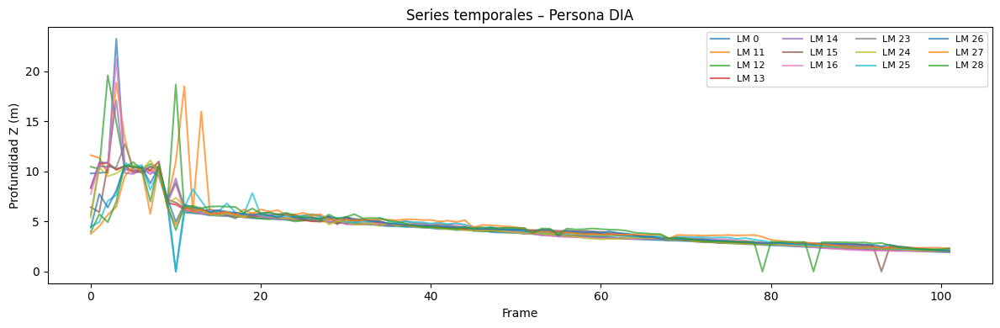

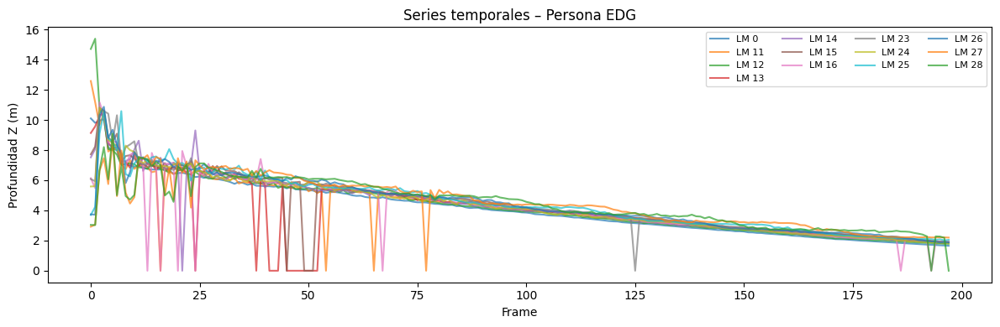

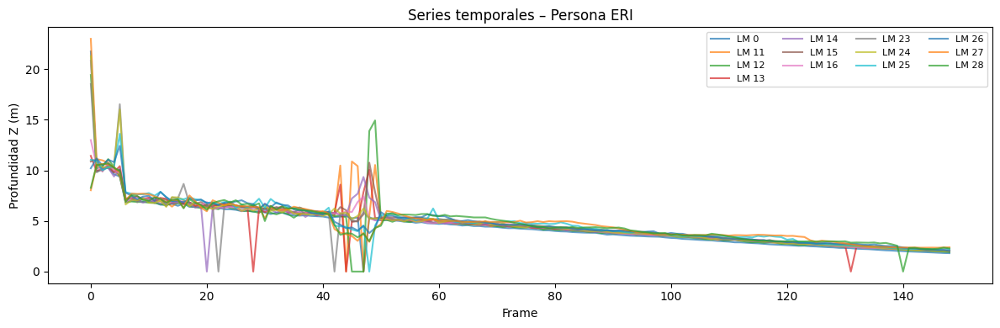

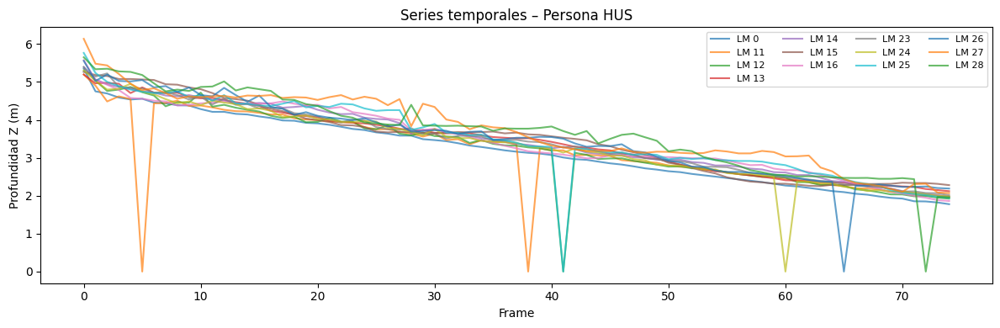

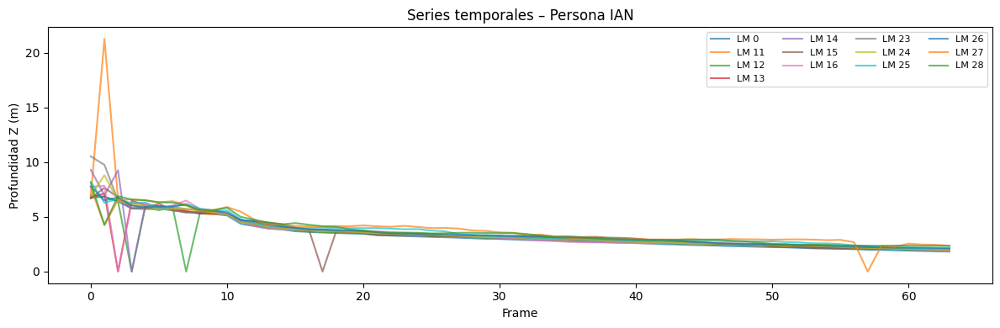

...

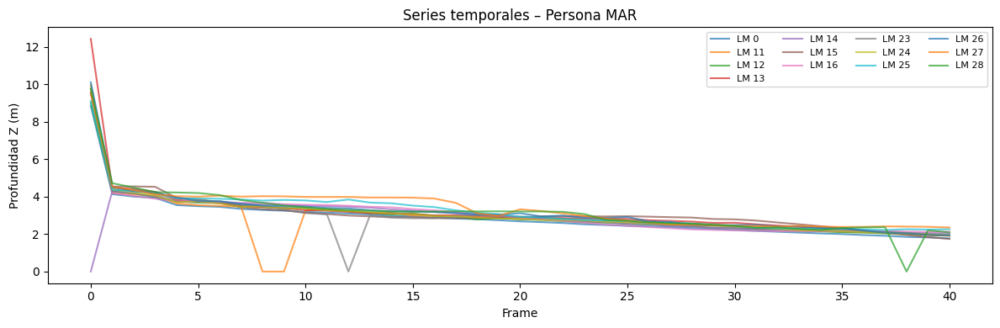

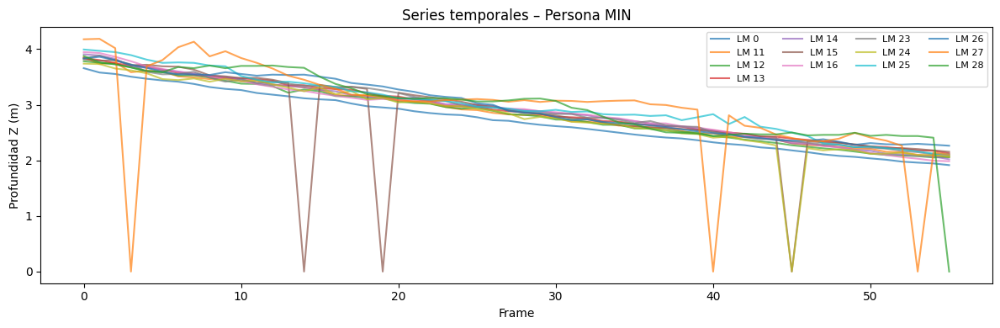

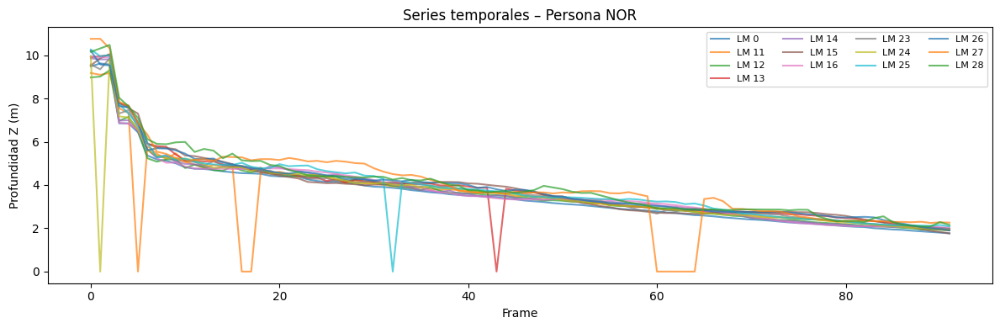

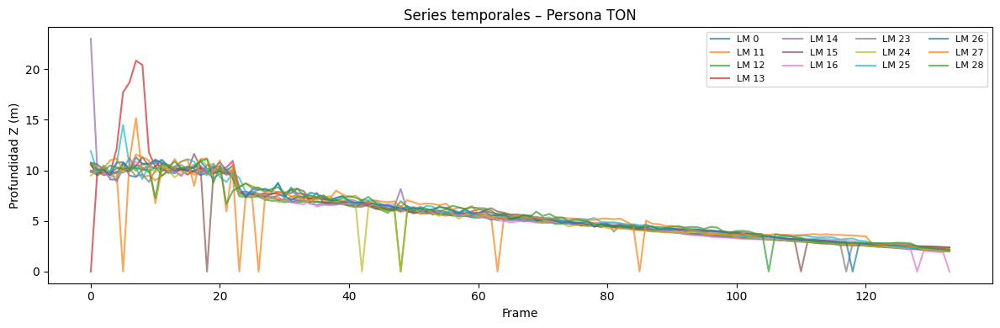

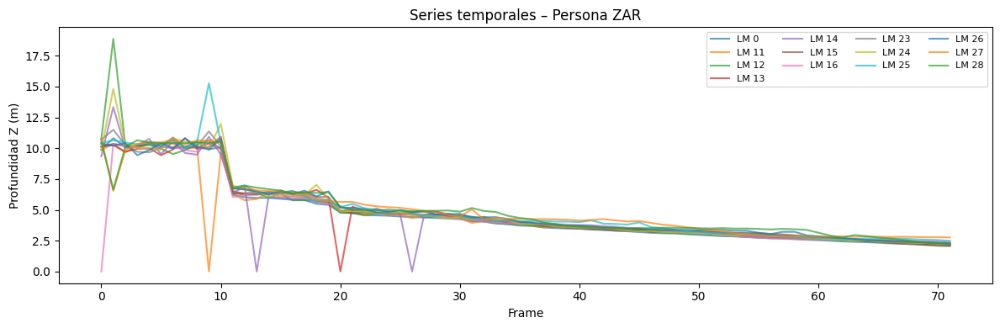

In [23]:
import pandas as pd
import matplotlib.pyplot as plt 

qc_df["persona"] = qc_df["etiqueta"].str.split("_").str[0]
qc_df[["etiqueta", "persona"]].drop_duplicates()


rep_files = (
    qc_df
    .sort_values("archivo")
    .groupby("persona")
    .first()
    .reset_index()
)

rep_files[["persona", "archivo"]]

csv_path = f"annotations/{rep_files.iloc[0]['archivo']}"

LANDMARK_IDS = [0, 11, 12, 13, 14, 15, 16, 23, 24, 25, 26, 27, 28]

for _, row in rep_files.iterrows():
    persona = row["persona"]
    csv_path = f"annotations/{row['archivo']}"

    df = pd.read_csv(csv_path)

    plt.figure(figsize=(12,4))

    for lm in LANDMARK_IDS:
        plt.plot(
            df[f"z{lm}"],
            label=f"LM {lm}",
            alpha=0.7
        )

    plt.title(f"Series temporales – Persona {persona}")
    plt.xlabel("Frame")
    plt.ylabel("Profundidad Z (m)")
    plt.legend(ncol=4, fontsize=8)
    plt.tight_layout()
    plt.show()


---

En general la mayoría de los landmarks siguen una tendencia coherente, manteniendo una relación temporal estable entre sí (por ejemplo, hombros y caderas presentan comportamientos similares), lo cual sugiere que la detección es hasta cierto punto consistente

Sin embargo, también se observan picos pronunciados u oscilaciones abruptas en ciertos instantes y landmarks. 


Estos puede ser:

- Errores de detección del modelo (oclusiones, cambios bruscos).

- Movimientos muy rápidos del cuerpo que el modelo no captura de forma suave.

- Pérdida temporal del landmark, seguida de una corrección en el siguiente frame.

- Ruido inherente al proceso de estimación 3D.

Estos picos pueden considerarse datos anómalos, ya que rompen la continuidad esperada del movimiento corporal.

---

## Boxplots de Z por persona y landmark

---

En este análisis se hace énfasis en la coordenada Z (profundidad) de los landmarks debido a que la cámara RGB-D se mantuvo fija, sin cambios de posición ni de orientación, durante todas las grabaciones. Al conservarse constante el eje de referencia de la cámara, la variación en Z refleja principalmente el movimiento del sujeto con respecto al eje frontal, y no artefactos introducidos por cambios en la adquisición.


Si las cuatro grabaciones de una misma persona presentan boxplots compactos y con rangos similares, esto sugiere que el sujeto caminó de manera consistente y reproducible durante las pruebas. Por el contrario, una alta dispersión o diferencias marcadas entre grabaciones puede indicar variabilidad en el patrón de marcha, cambios en la ejecución del movimiento o posibles problemas en la detección de ciertos puntos clave.


---



/tmp/ipykernel_4724/4056834903.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(


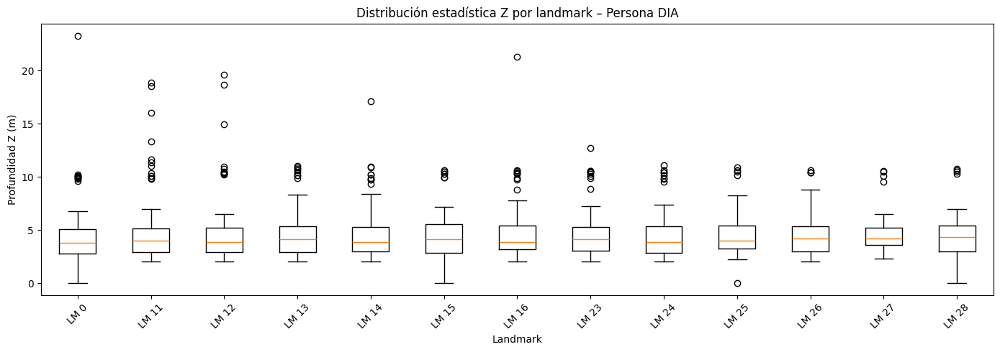

/tmp/ipykernel_4724/4056834903.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(


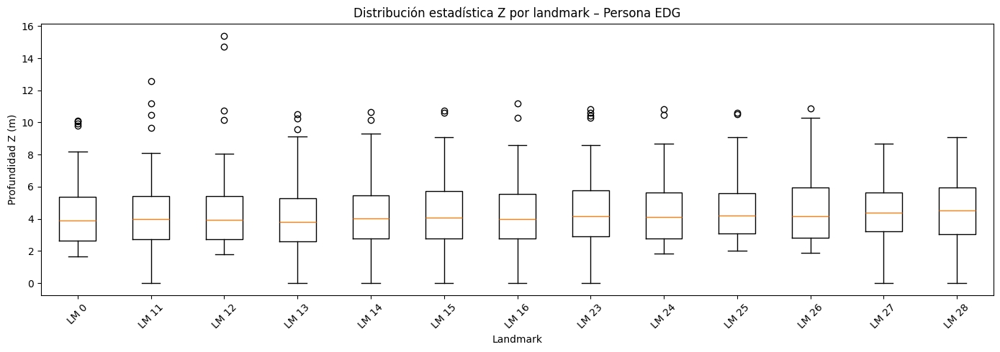

/tmp/ipykernel_4724/4056834903.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(


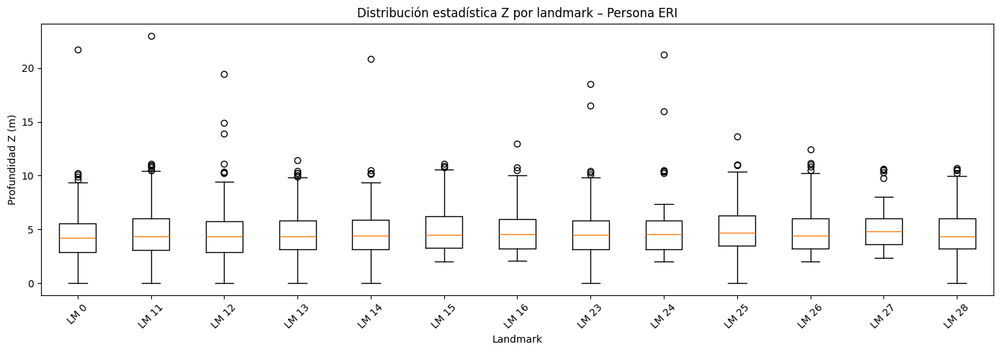

/tmp/ipykernel_4724/4056834903.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(


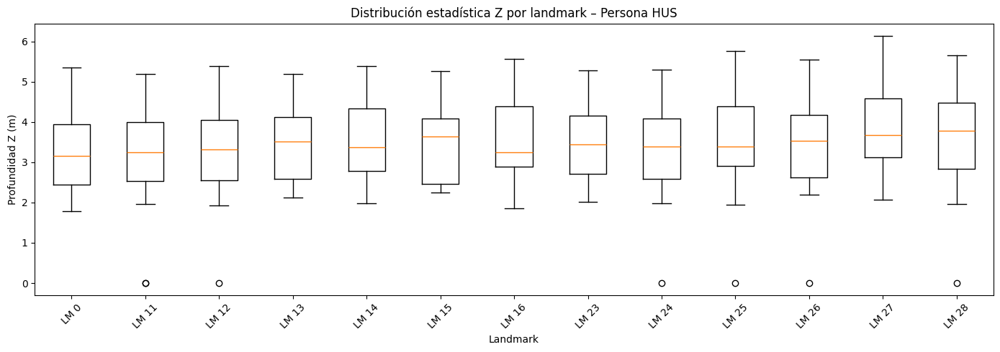

/tmp/ipykernel_4724/4056834903.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(


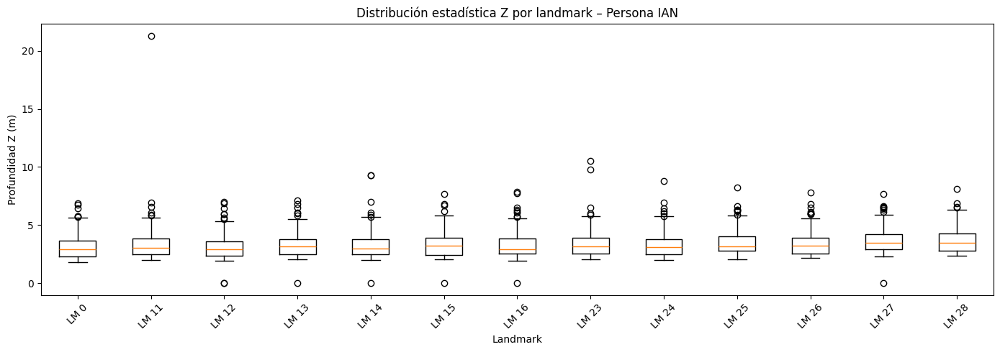

/tmp/ipykernel_4724/4056834903.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(


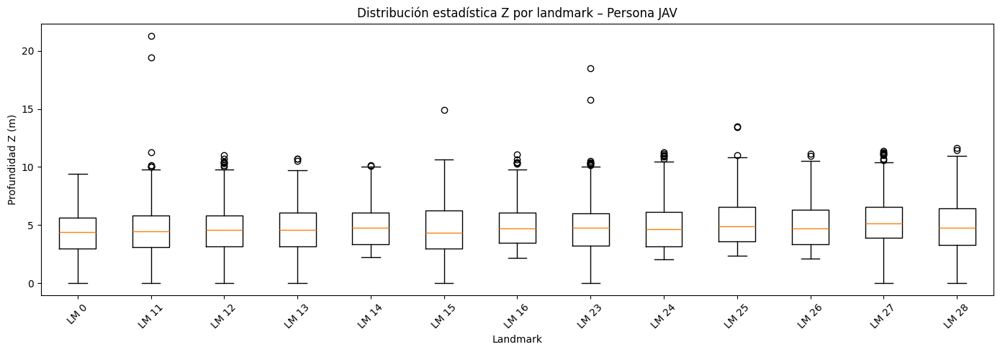

/tmp/ipykernel_4724/4056834903.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(


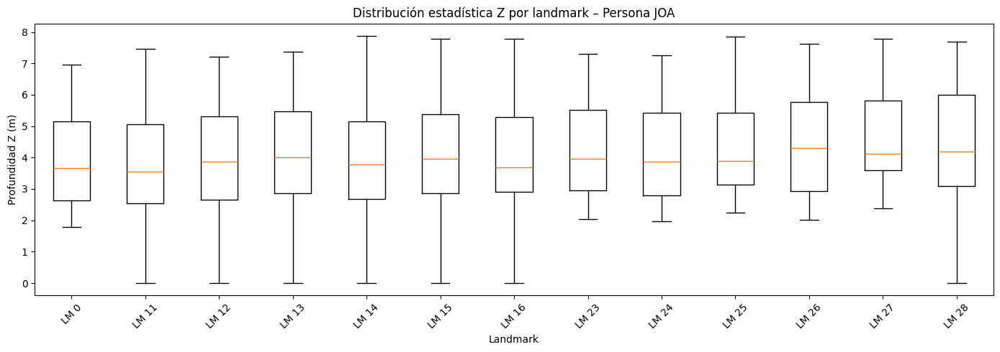

/tmp/ipykernel_4724/4056834903.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(


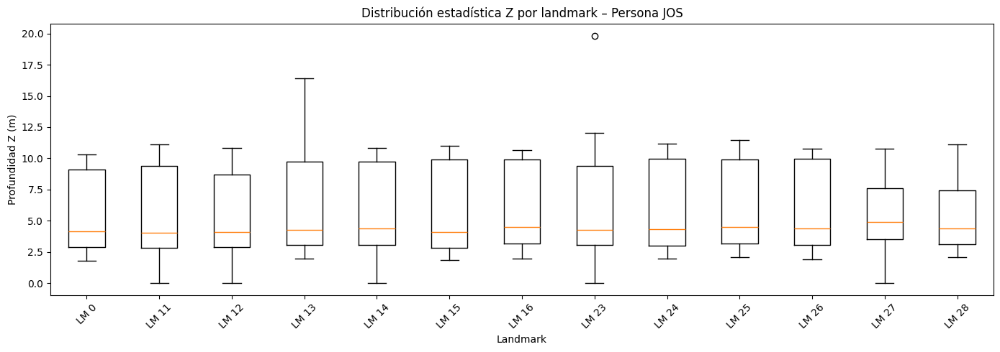

/tmp/ipykernel_4724/4056834903.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(


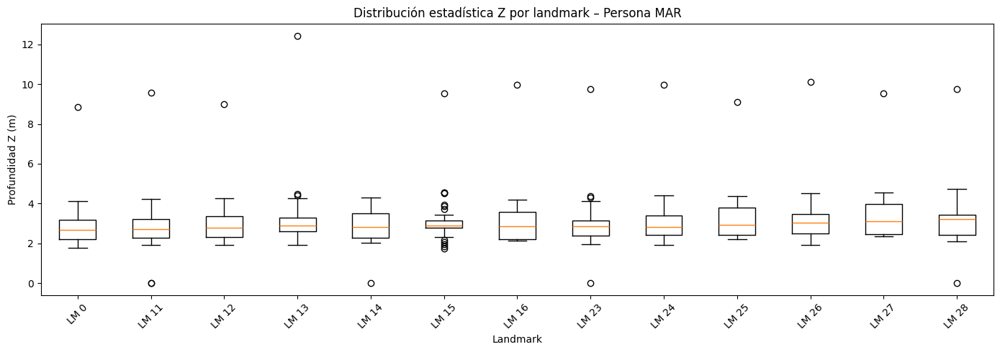

/tmp/ipykernel_4724/4056834903.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(


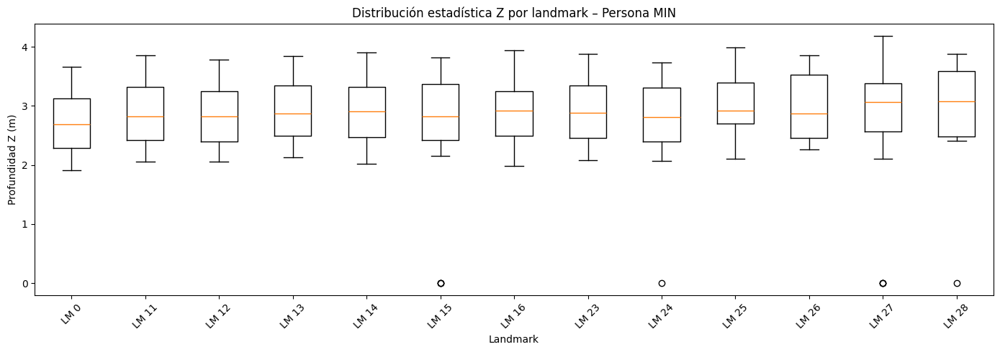

/tmp/ipykernel_4724/4056834903.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(


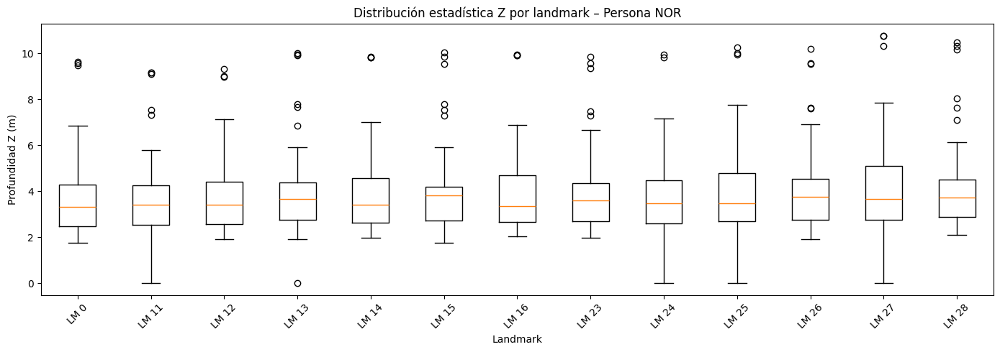

/tmp/ipykernel_4724/4056834903.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(


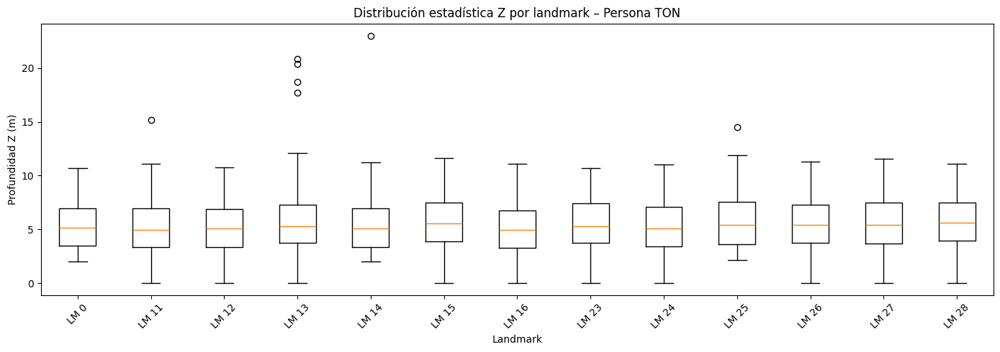

/tmp/ipykernel_4724/4056834903.py:17: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(


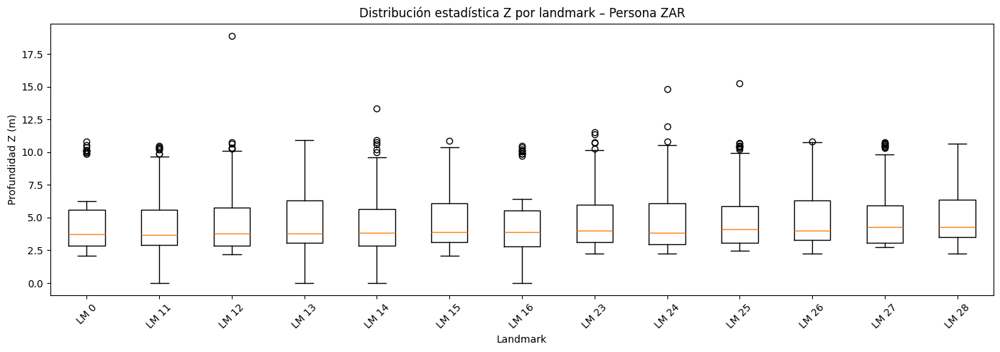

In [25]:
import pandas as pd
import matplotlib.pyplot as plt

LANDMARK_IDS = [0, 11, 12, 13, 14, 15, 16, 23, 24, 25, 26, 27, 28]

for _, row in rep_files.iterrows():
    persona = row["persona"]
    csv_path = f"annotations/{row['archivo']}"
    
    df = pd.read_csv(csv_path)

    # Extraer solo las columnas Z de los landmarks
    z_data = [df[f"z{lm}"].dropna() for lm in LANDMARK_IDS]

    plt.figure(figsize=(14, 5))
    
    plt.boxplot(
        z_data,
        labels=[f"LM {lm}" for lm in LANDMARK_IDS],
        showfliers=True
    )

    plt.title(f"Distribución estadística Z por landmark – Persona {persona}")
    plt.xlabel("Landmark")
    plt.ylabel("Profundidad Z (m)")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


### Limpieza y Filtrado de Señales

Si algún frame tiene valores faltantes en un landmark, se rellenan mediante interpolación lineal. Esto mantiene la continuidad de la serie temporal y evita saltos bruscos que puedan afectar análisis posteriores

Se utiliza el filtro de Savitzky-Golay, que preserva la forma de la señal mientras reduce el ruido de alta frecuencia. Esto corrige oscilaciones erráticas debidas a detecciones incorrectas momentáneas.



In [27]:
import os
import pandas as pd
import numpy as np
from scipy.signal import savgol_filter
from pathlib import Path

# ---------------- CONFIGURACIÓN ----------------
RAW_DIR = Path("annotations")       # CSV originales
PROCESSED_DIR = Path("annotations_processed")
PROCESSED_DIR.mkdir(exist_ok=True)

# Landmarks seleccionados
LANDMARK_IDS = [0, 11, 12, 13, 14, 15, 16, 23, 24, 25, 26, 27, 28]

# ---------------- FUNCIÓN DE FILTRADO ----------------
def smooth_and_interpolate(df, lm_ids, window_length=11, polyorder=2):
    """
    Aplica suavizado temporal (Savitzky-Golay) y 
    rellena valores faltantes (interpolación lineal) a los landmarks.
    """
    df_proc = df.copy()
    
    for lm in lm_ids:
        for axis in ["x", "y", "z"]:
            col = f"{axis}{lm}"
            # Interpolación lineal de valores faltantes
            df_proc[col] = df_proc[col].interpolate(method="linear", limit_direction="both")
            # Suavizado temporal
            df_proc[col] = savgol_filter(df_proc[col], window_length=window_length, polyorder=polyorder)
    return df_proc

# ---------------- PROCESAMIENTO ----------------
for csv_file in RAW_DIR.glob("*.csv"):
    df = pd.read_csv(csv_file)
    
    # Aplicar suavizado e interpolación
    df_processed = smooth_and_interpolate(df, LANDMARK_IDS)
    
    # Guardar CSV procesado en carpeta separada
    out_file = PROCESSED_DIR / csv_file.name
    df_processed.to_csv(out_file, index=False)

print(f"Procesamiento completo. Archivos guardados en: {PROCESSED_DIR}")


Procesamiento completo. Archivos guardados en: annotations_processed


---


Raw: Contiene los datos originales extraídos de MediaPipe. Puede incluir ruido, saltos de detección o frames faltantes.

Procesado: Aplicamos interpolación lineal y suavizado Savitzky-Golay para corregir valores faltantes y suavizar oscilaciones abruptas.

---

### Persona: DIA ###
Archivo: grabacion_20260206_140603.csv (RAW)


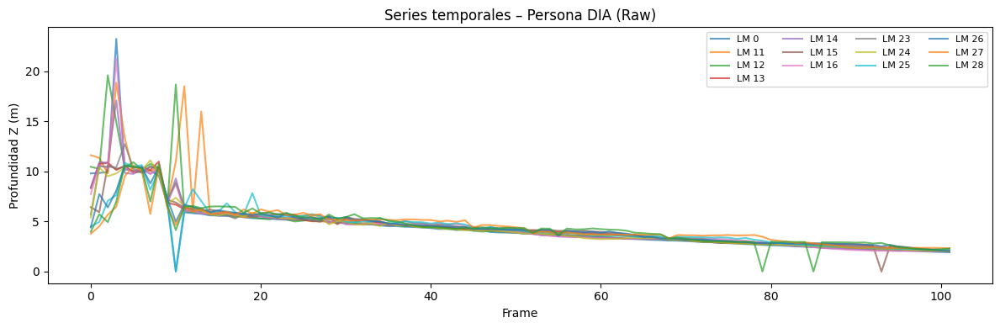

Archivo: grabacion_20260206_140603.csv (Procesado)


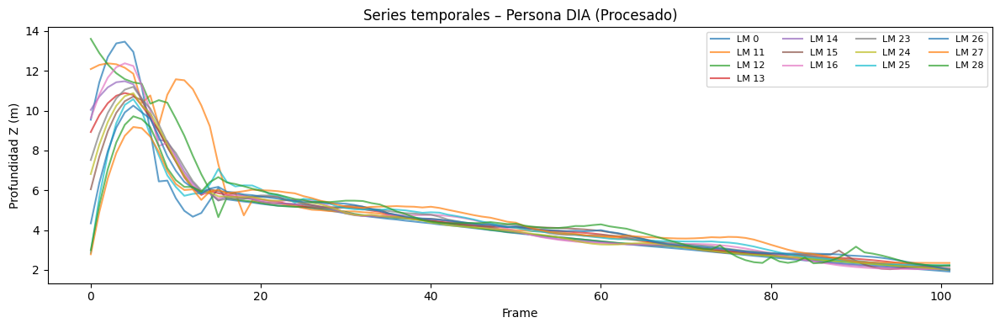

Archivo: grabacion_20260206_140652.csv (RAW)


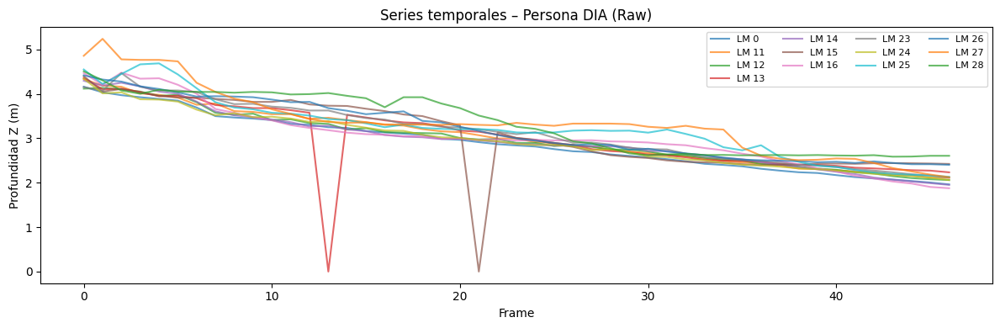

Archivo: grabacion_20260206_140652.csv (Procesado)


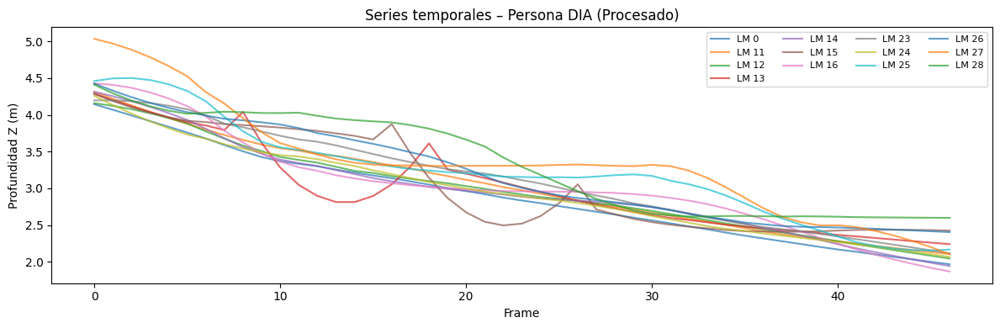

Archivo: grabacion_20260206_140722.csv (RAW)


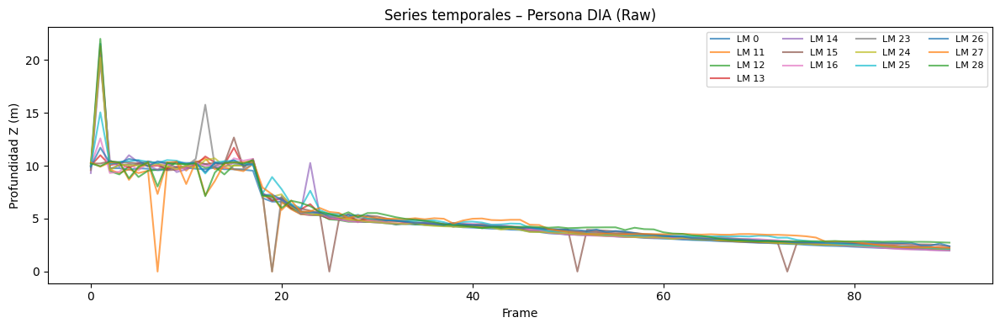

Archivo: grabacion_20260206_140722.csv (Procesado)


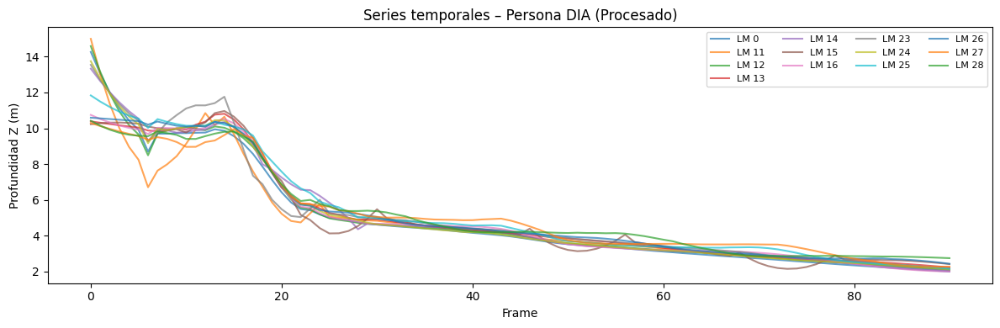

Archivo: grabacion_20260206_140800.csv (RAW)


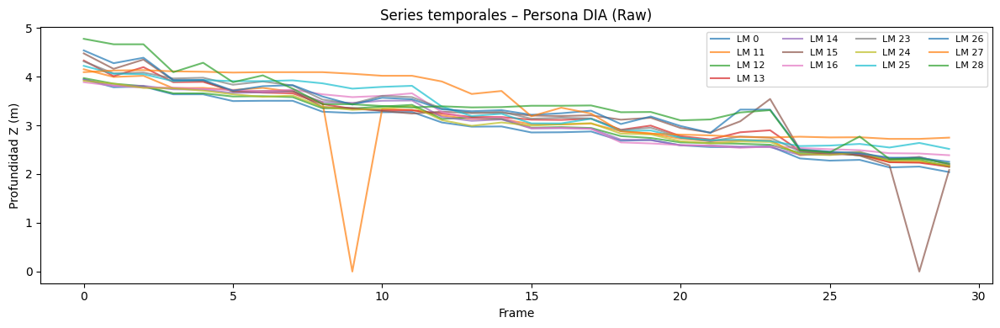

Archivo: grabacion_20260206_140800.csv (Procesado)


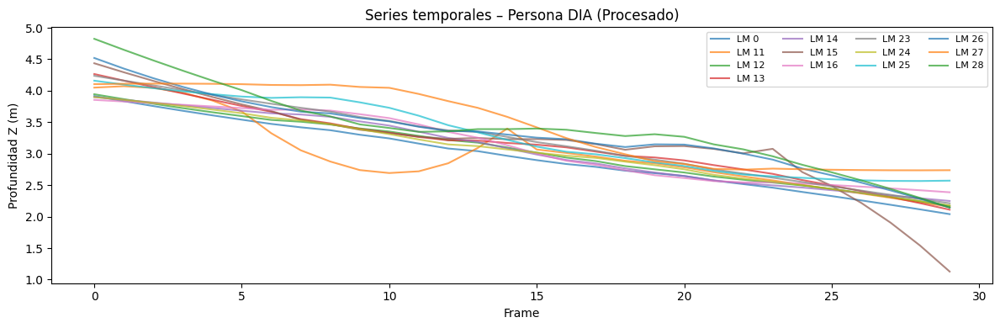

### Persona: EDG ###
Archivo: grabacion_20260206_143216.csv (RAW)


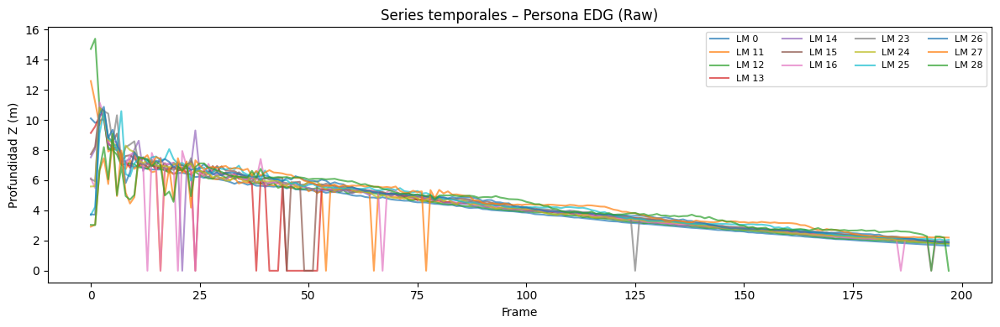

Archivo: grabacion_20260206_143216.csv (Procesado)


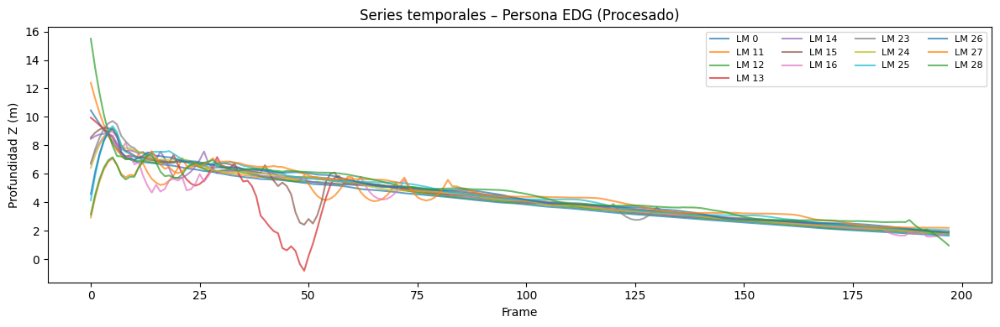

Archivo: grabacion_20260206_143908.csv (RAW)


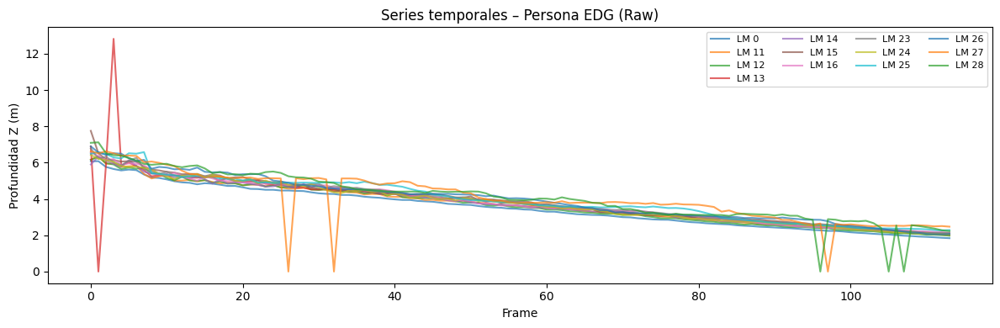

Archivo: grabacion_20260206_143908.csv (Procesado)


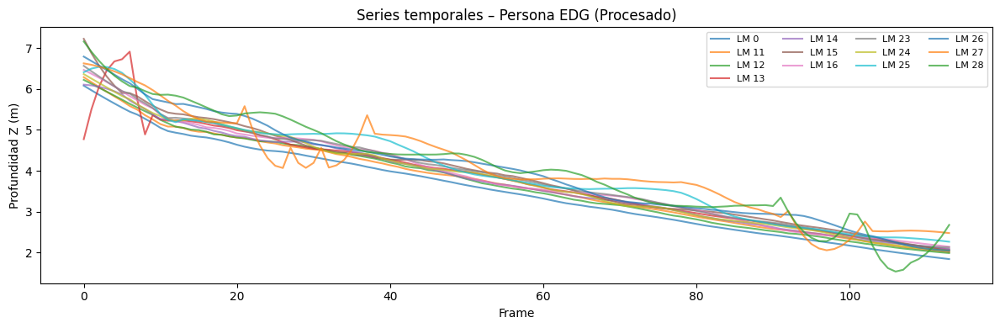

Archivo: grabacion_20260206_143938.csv (RAW)


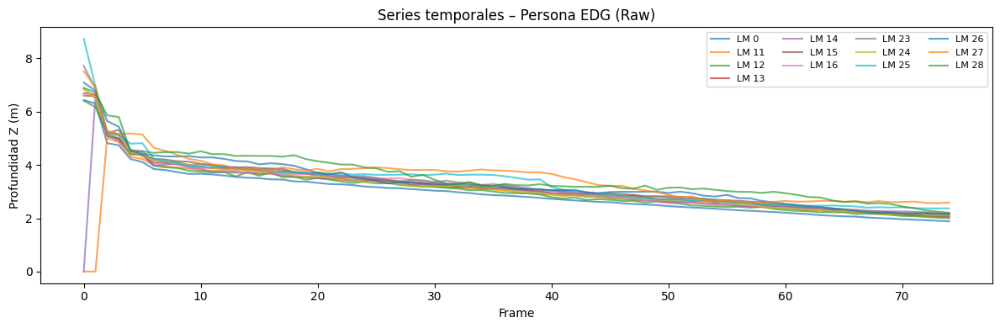

Archivo: grabacion_20260206_143938.csv (Procesado)


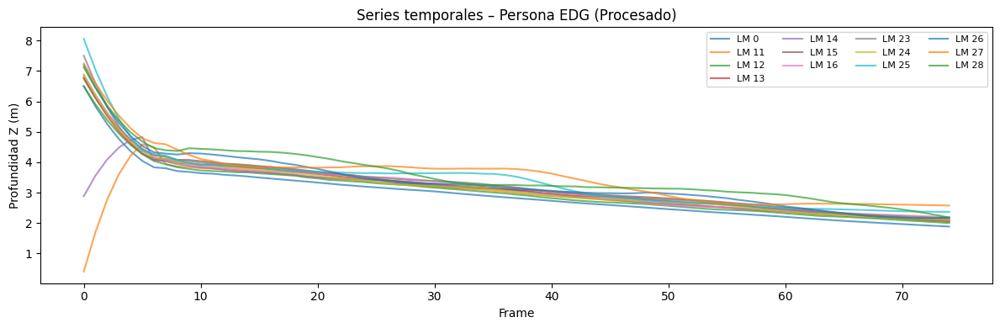

Archivo: grabacion_20260206_144015.csv (RAW)


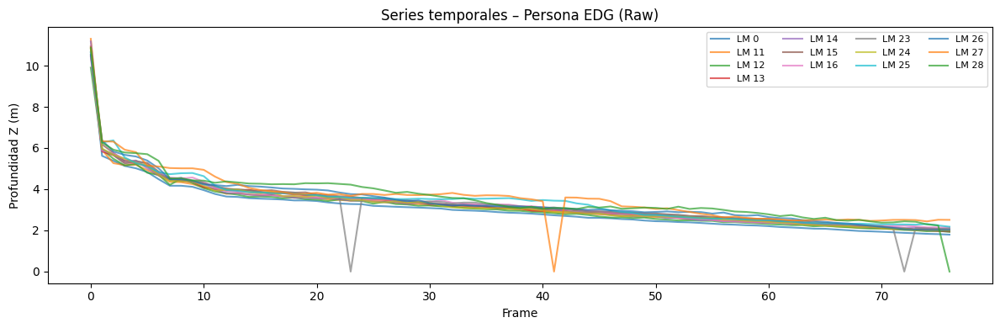

Archivo: grabacion_20260206_144015.csv (Procesado)


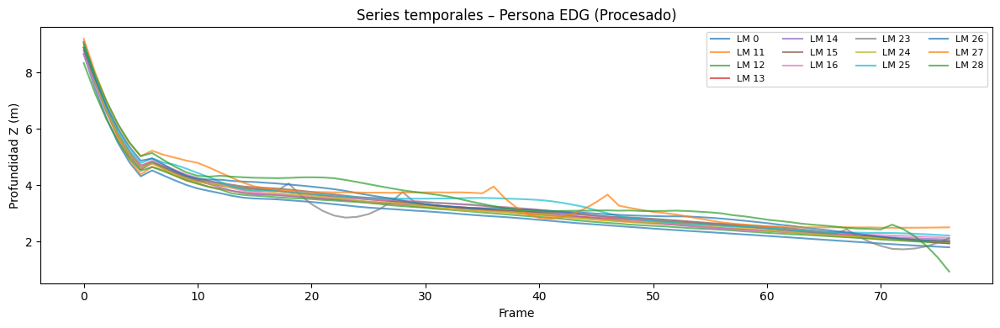

### Persona: ERI ###
Archivo: grabacion_20260206_141750.csv (RAW)


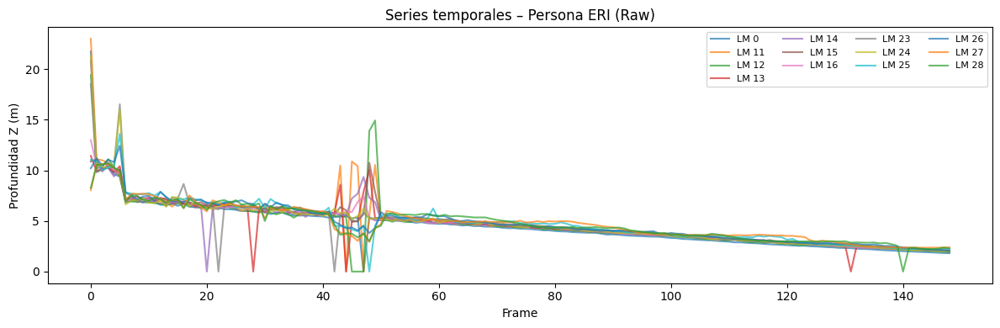

Archivo: grabacion_20260206_141750.csv (Procesado)


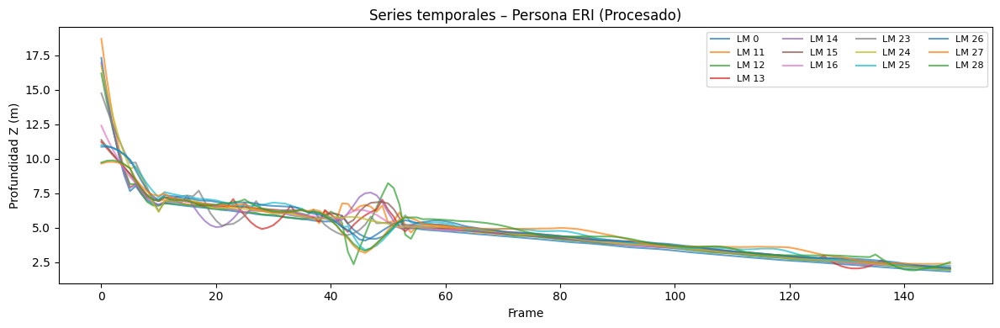

Archivo: grabacion_20260206_141828.csv (RAW)


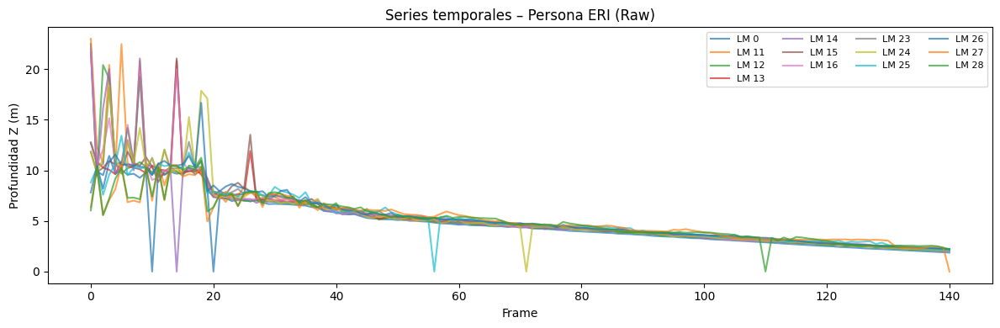

Archivo: grabacion_20260206_141828.csv (Procesado)


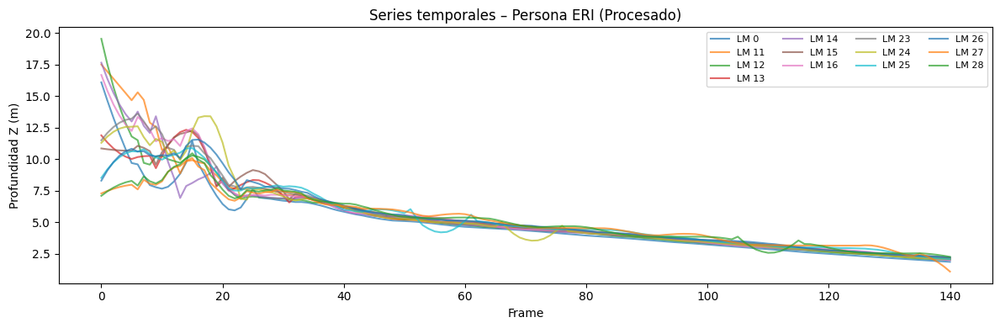

Archivo: grabacion_20260206_142748.csv (RAW)


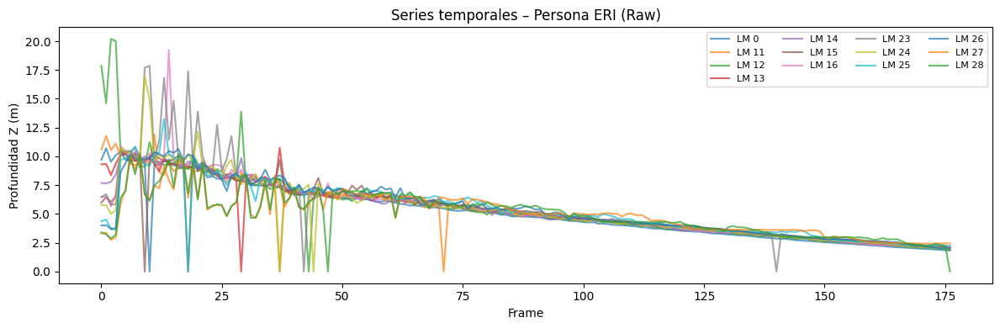

Archivo: grabacion_20260206_142748.csv (Procesado)


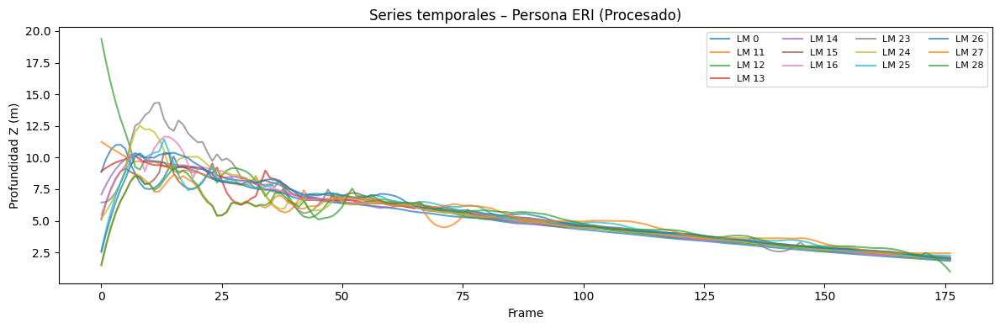

Archivo: grabacion_20260206_142901.csv (RAW)


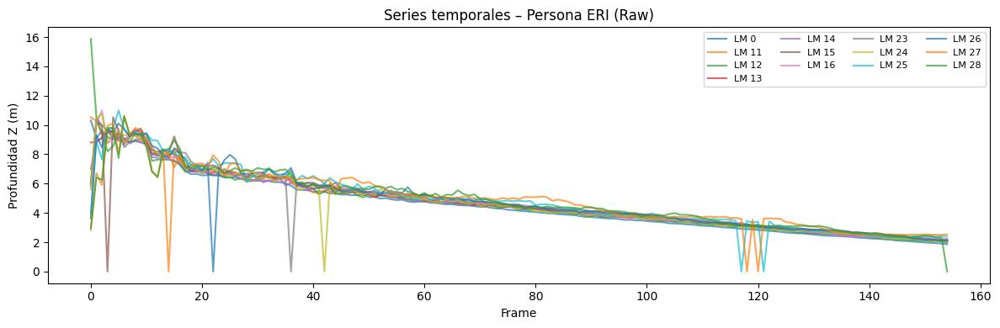

Archivo: grabacion_20260206_142901.csv (Procesado)


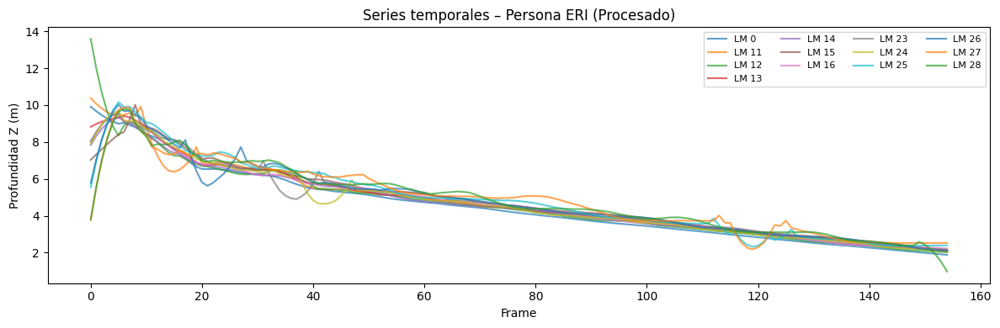

### Persona: HUS ###
Archivo: grabacion_20260206_151222.csv (RAW)


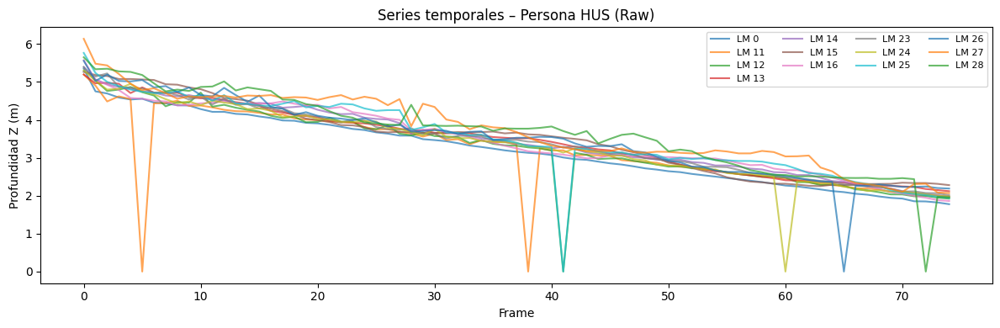

Archivo: grabacion_20260206_151222.csv (Procesado)


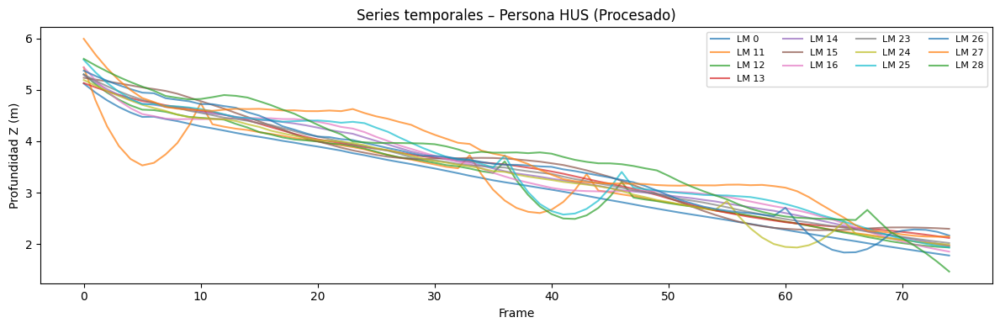

Archivo: grabacion_20260206_151254.csv (RAW)


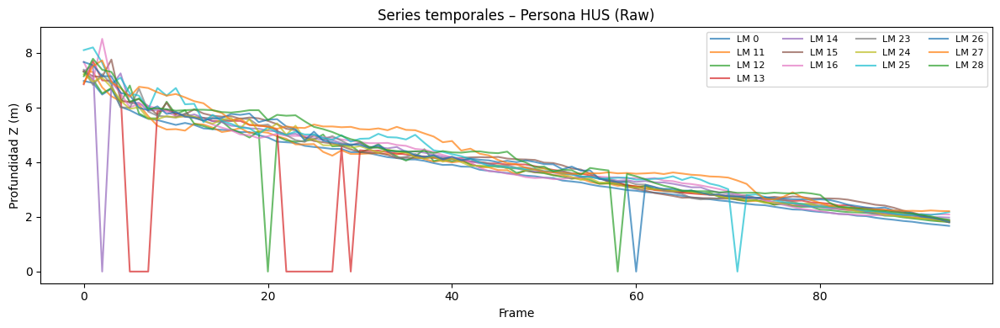

Archivo: grabacion_20260206_151254.csv (Procesado)


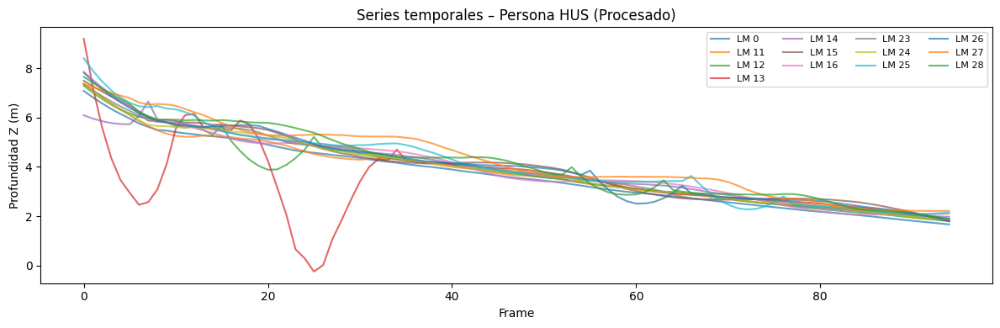

Archivo: grabacion_20260206_151333.csv (RAW)


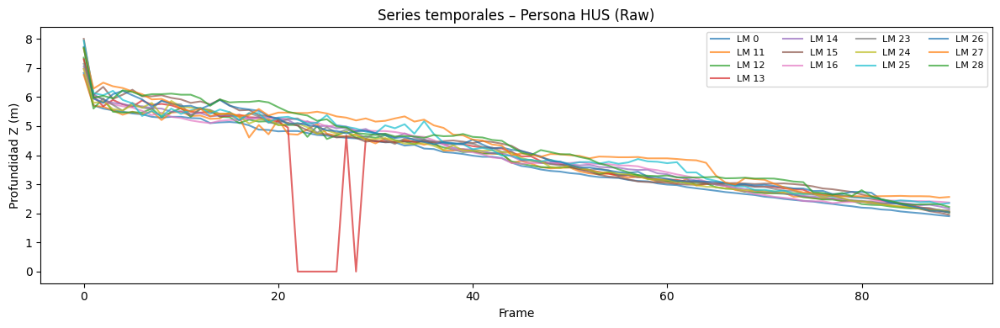

Archivo: grabacion_20260206_151333.csv (Procesado)


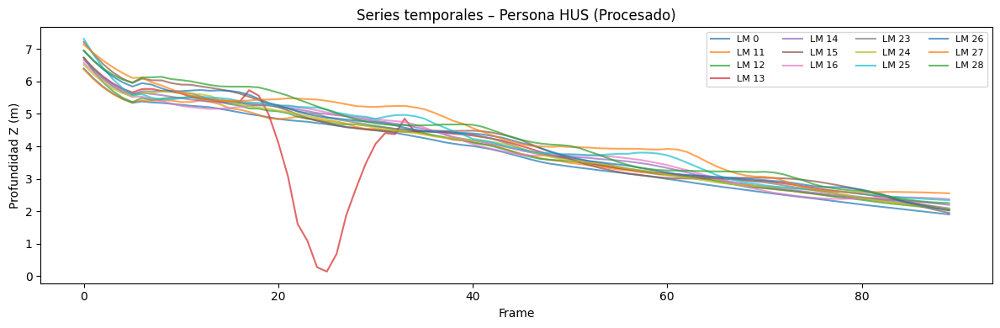

Archivo: grabacion_20260206_151401.csv (RAW)


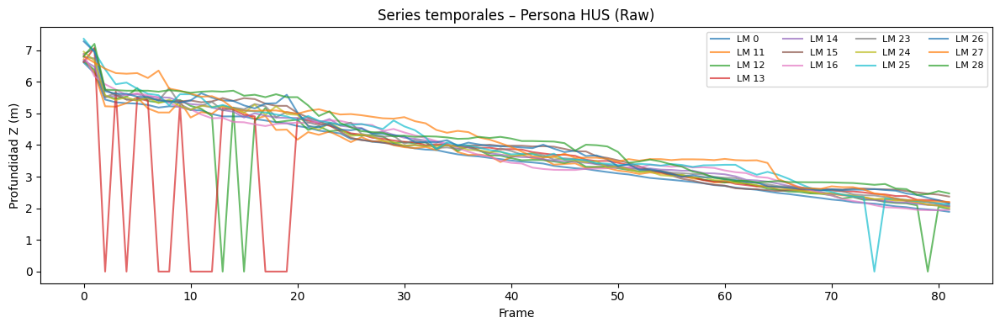

Archivo: grabacion_20260206_151401.csv (Procesado)


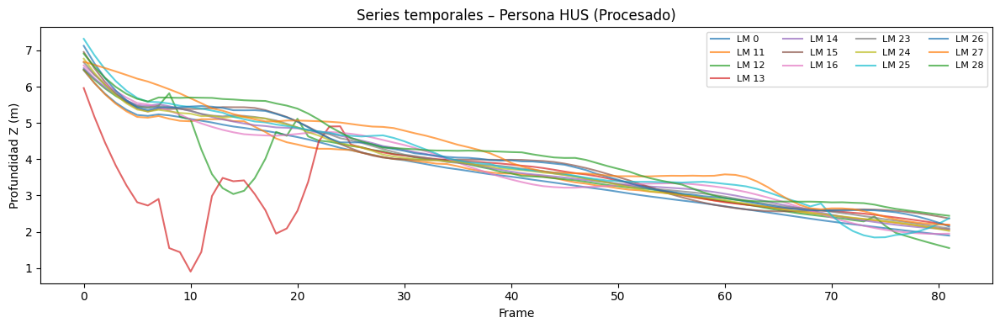

### Persona: IAN ###
Archivo: grabacion_20260206_144604.csv (RAW)


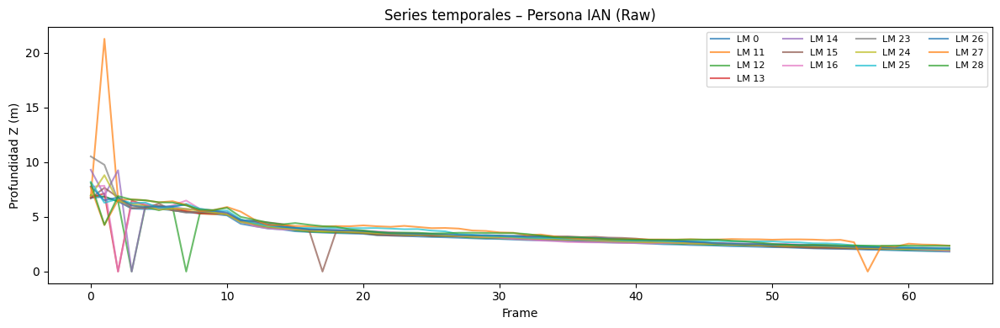

Archivo: grabacion_20260206_144604.csv (Procesado)


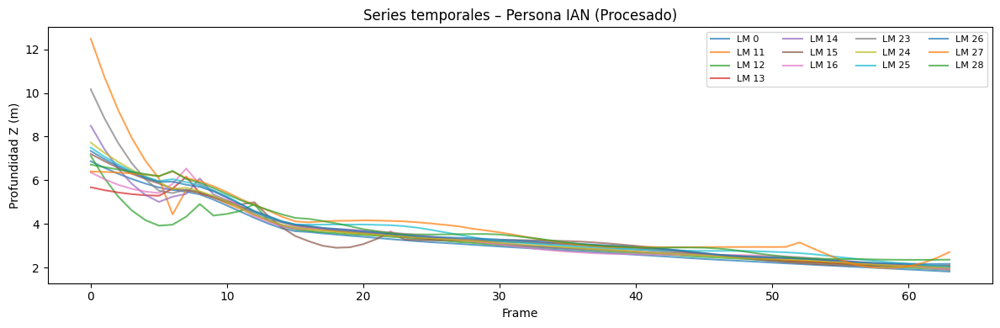

Archivo: grabacion_20260206_144703.csv (RAW)


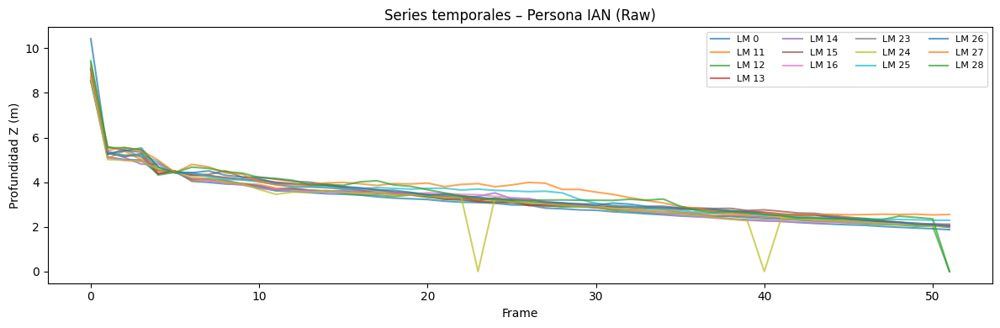

Archivo: grabacion_20260206_144703.csv (Procesado)


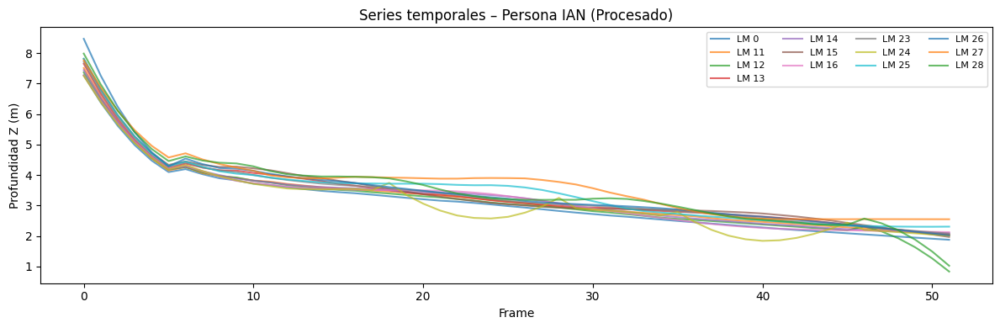

Archivo: grabacion_20260206_144732.csv (RAW)


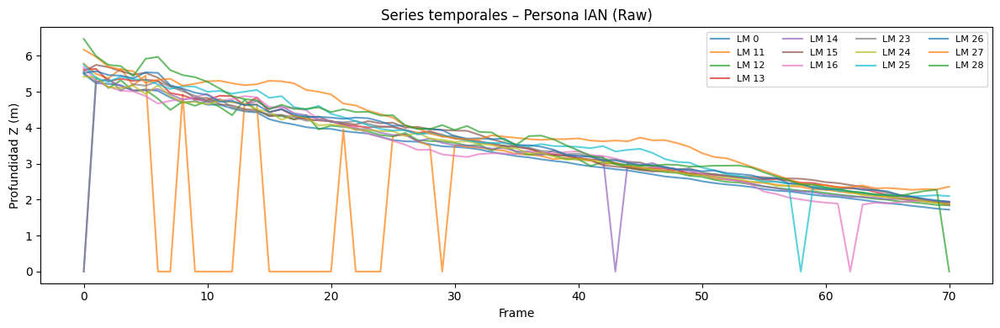

Archivo: grabacion_20260206_144732.csv (Procesado)


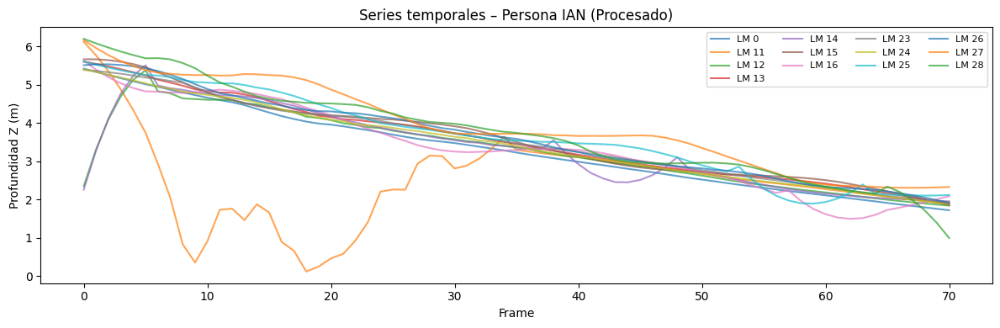

Archivo: grabacion_20260206_144808.csv (RAW)


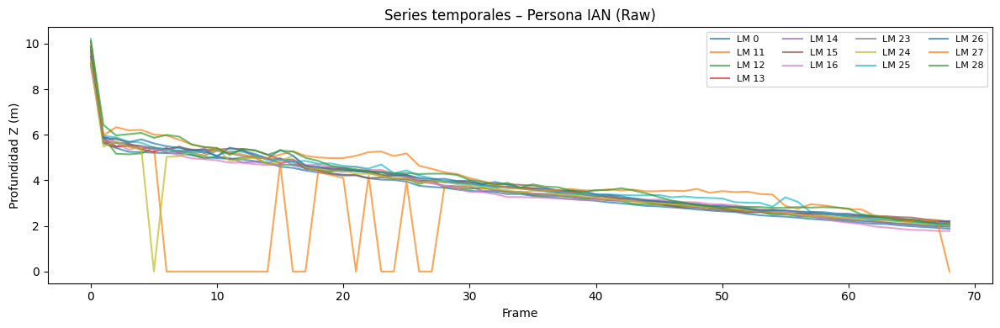

Archivo: grabacion_20260206_144808.csv (Procesado)


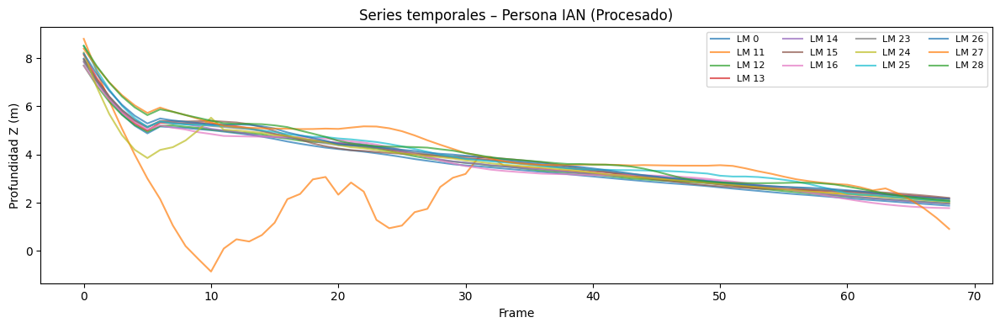

### Persona: JAV ###
Archivo: grabacion_20260206_141202.csv (RAW)


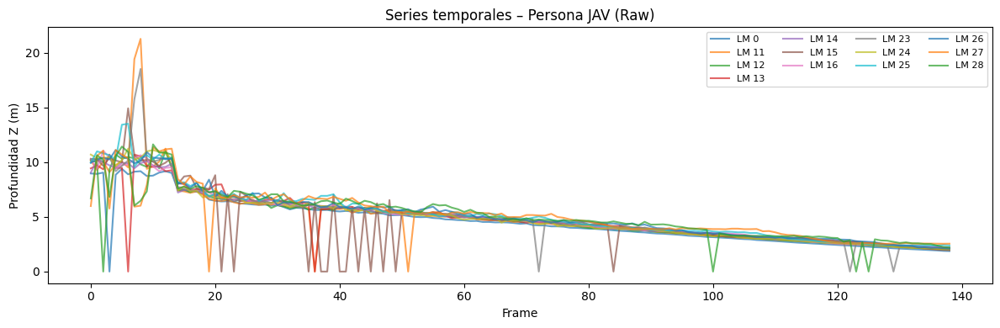

Archivo: grabacion_20260206_141202.csv (Procesado)


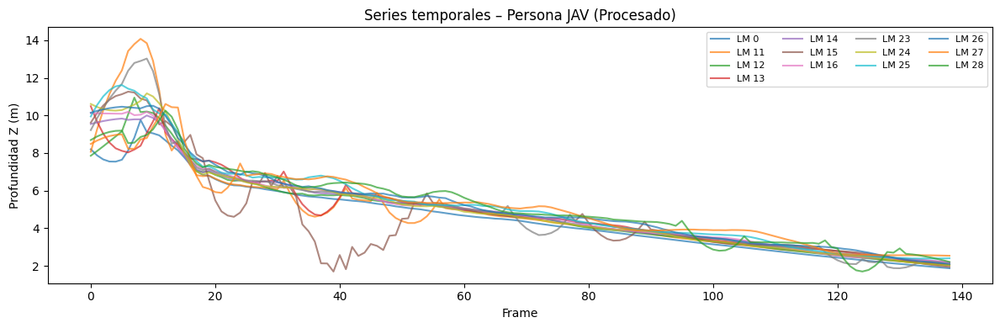

Archivo: grabacion_20260206_141348.csv (RAW)


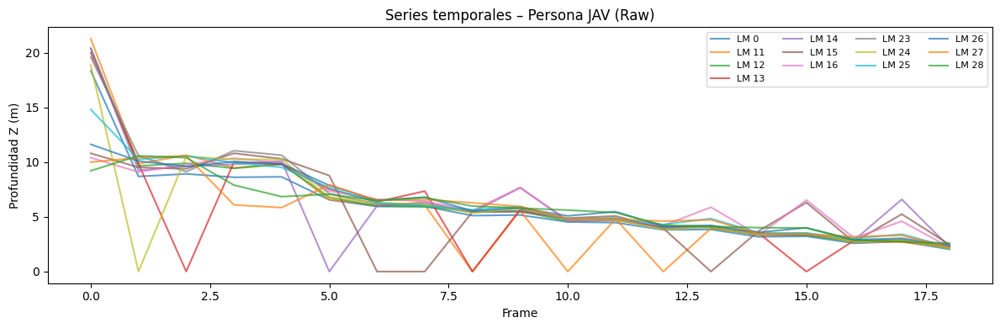

Archivo: grabacion_20260206_141348.csv (Procesado)


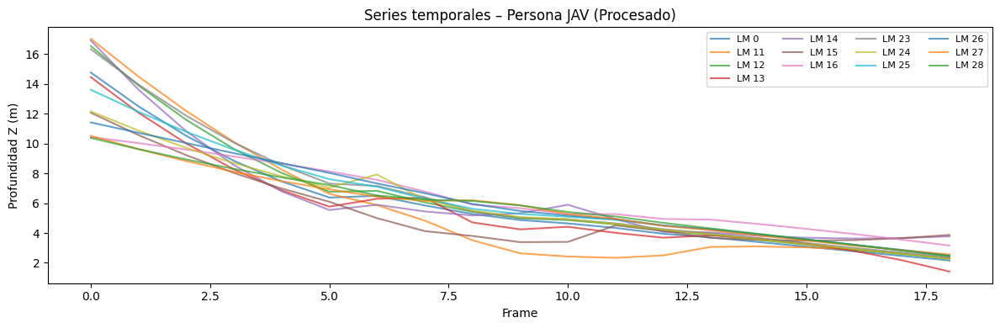

Archivo: grabacion_20260206_141436.csv (RAW)


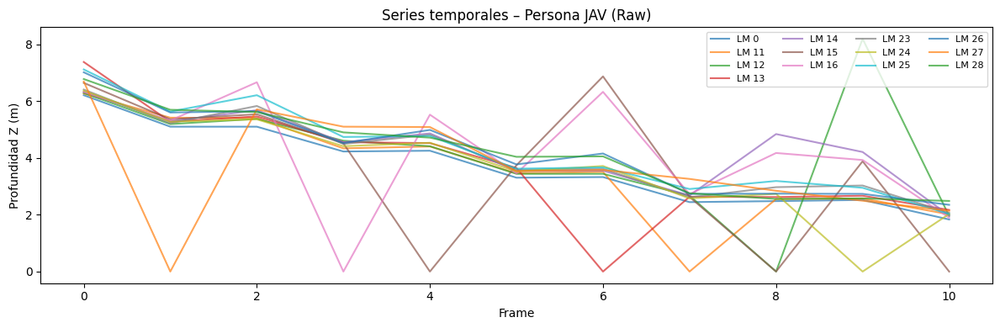

Archivo: grabacion_20260206_141436.csv (Procesado)


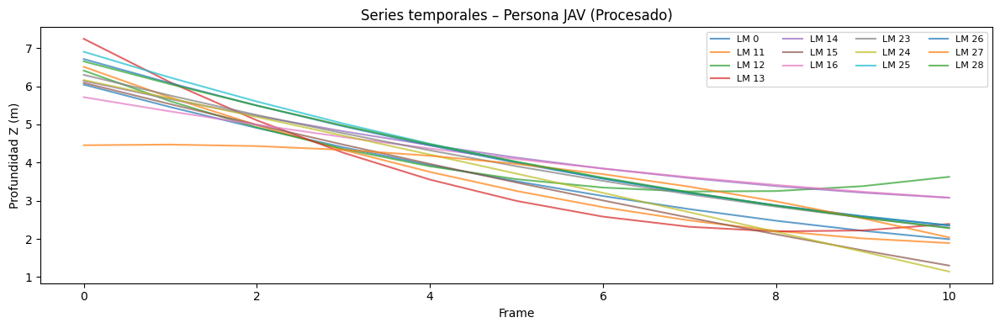

Archivo: grabacion_20260206_141536.csv (RAW)


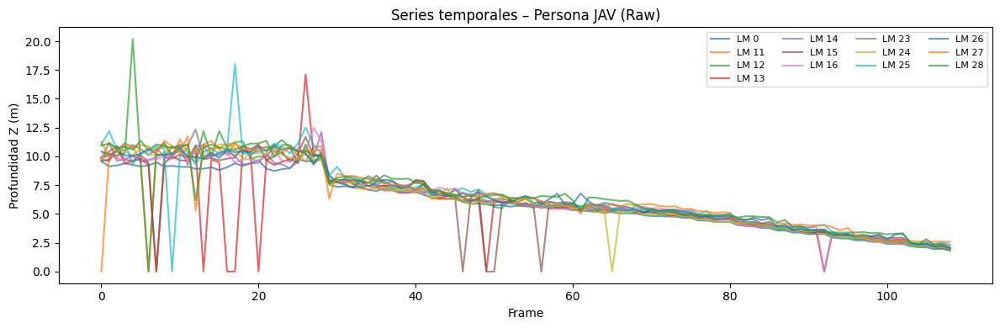

Archivo: grabacion_20260206_141536.csv (Procesado)


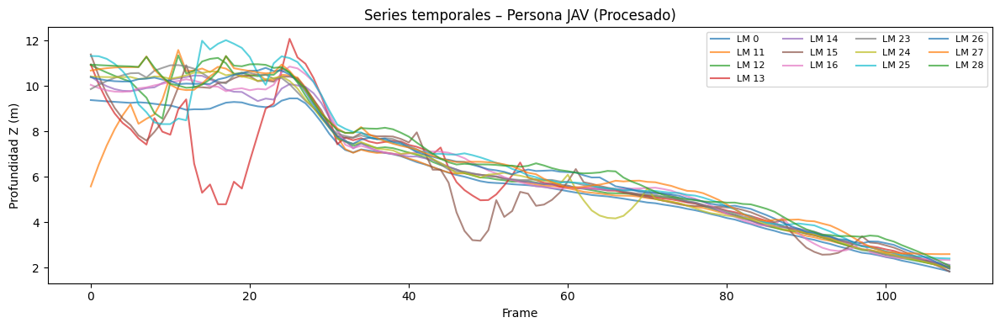

### Persona: JOA ###
Archivo: grabacion_20260206_150744.csv (RAW)


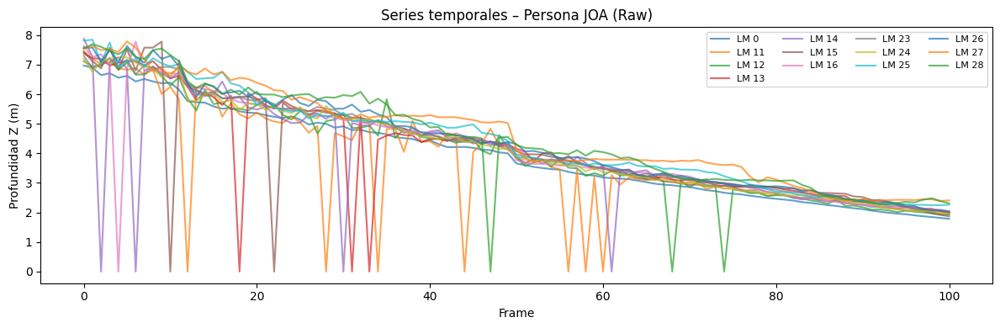

Archivo: grabacion_20260206_150744.csv (Procesado)


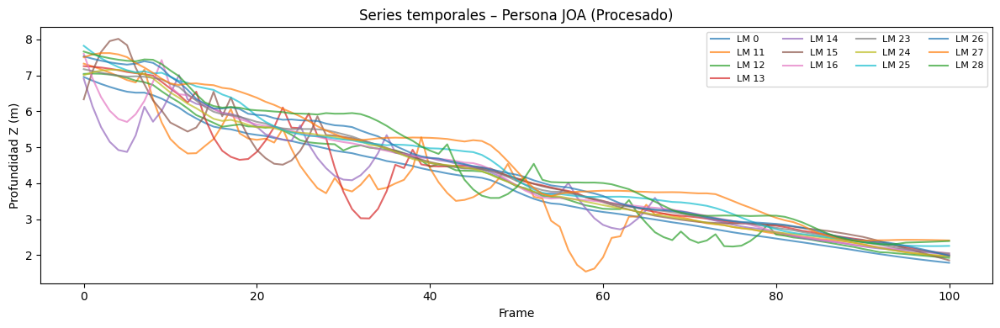

Archivo: grabacion_20260206_150811.csv (RAW)


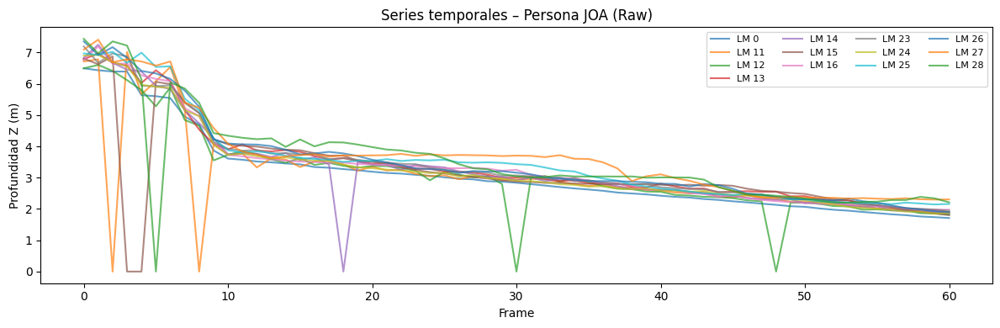

Archivo: grabacion_20260206_150811.csv (Procesado)


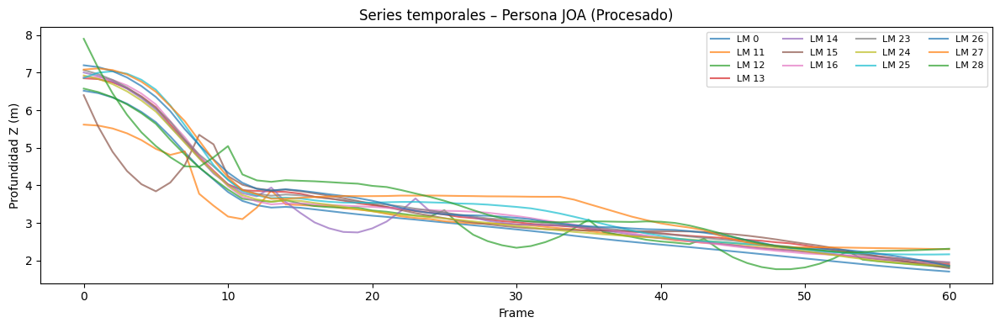

Archivo: grabacion_20260206_150845.csv (RAW)


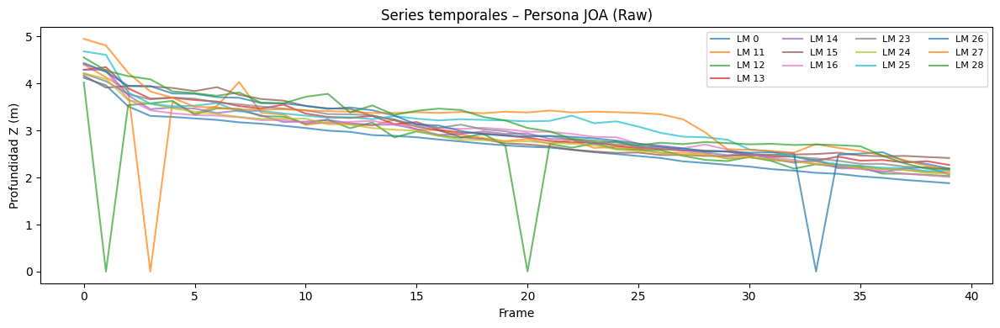

Archivo: grabacion_20260206_150845.csv (Procesado)


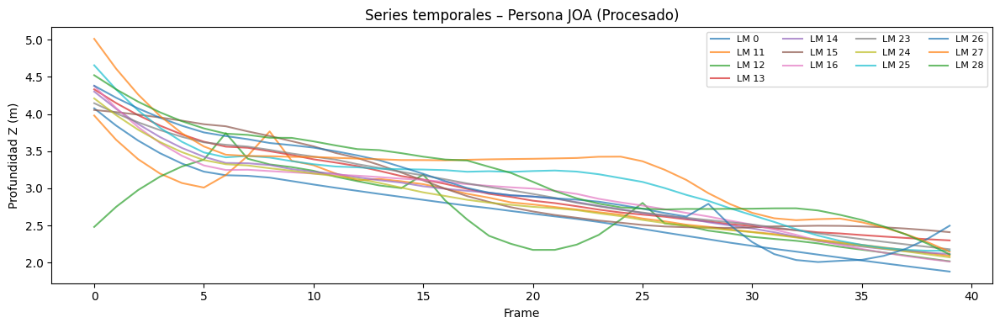

Archivo: grabacion_20260206_150917.csv (RAW)


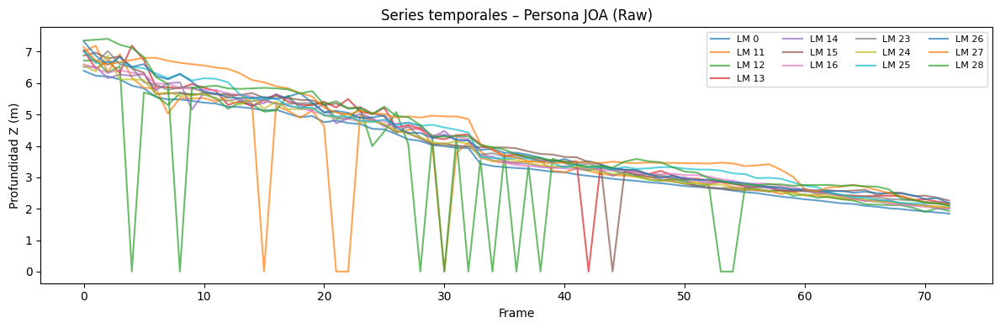

Archivo: grabacion_20260206_150917.csv (Procesado)


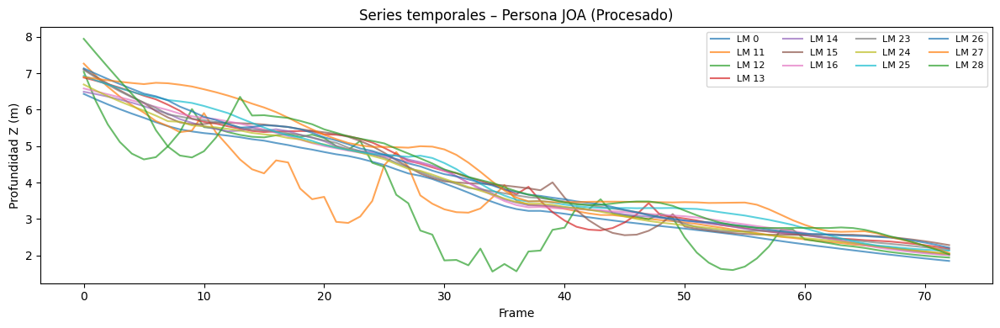

### Persona: JOS ###
Archivo: grabacion_20260206_145215.csv (RAW)


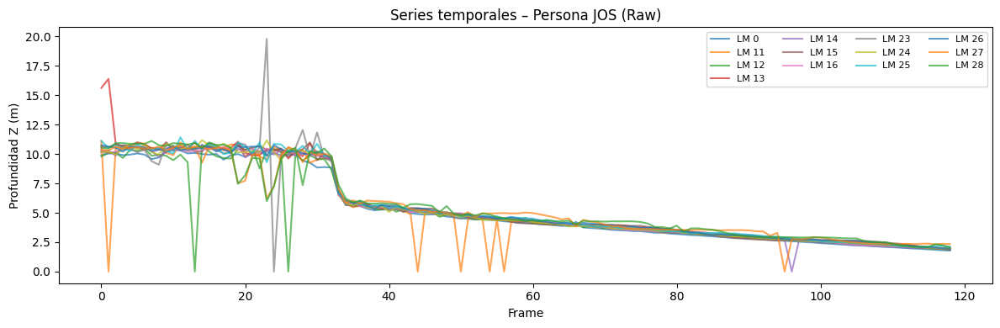

Archivo: grabacion_20260206_145215.csv (Procesado)


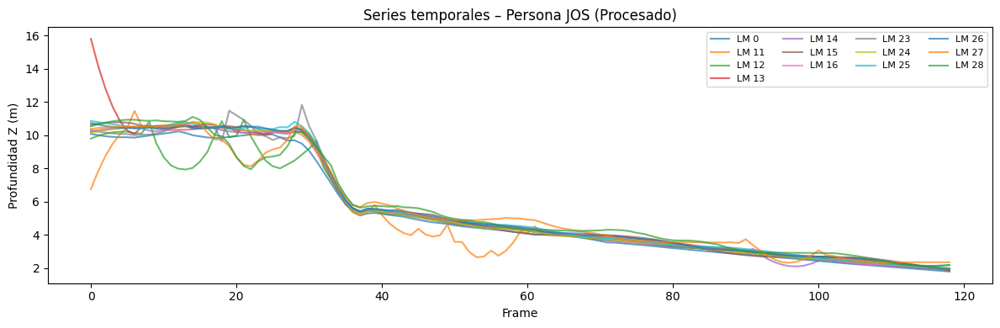

Archivo: grabacion_20260206_145240.csv (RAW)


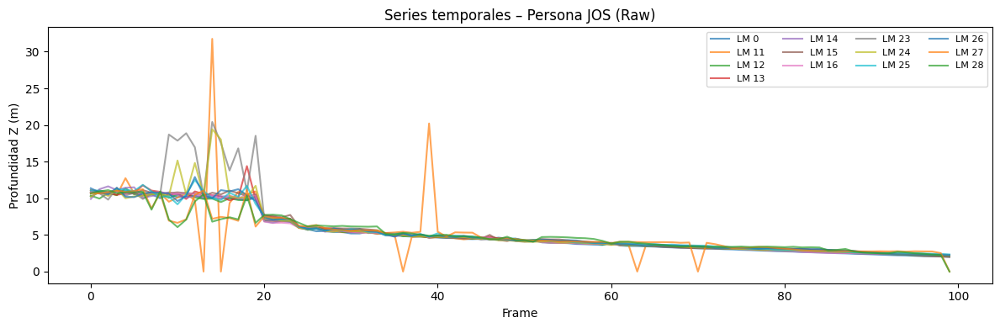

Archivo: grabacion_20260206_145240.csv (Procesado)


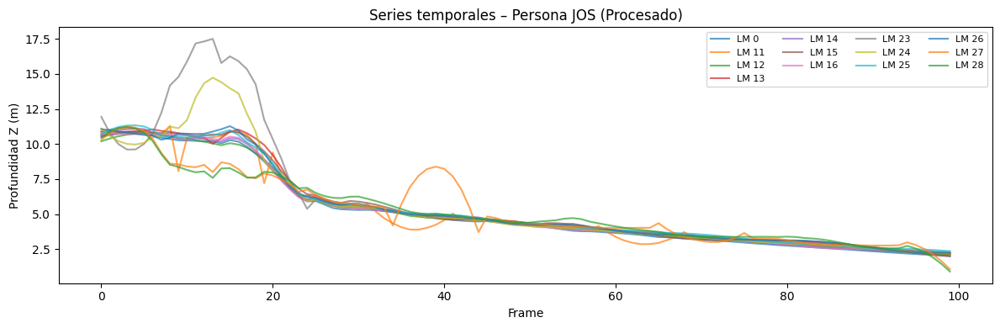

Archivo: grabacion_20260206_145312.csv (RAW)


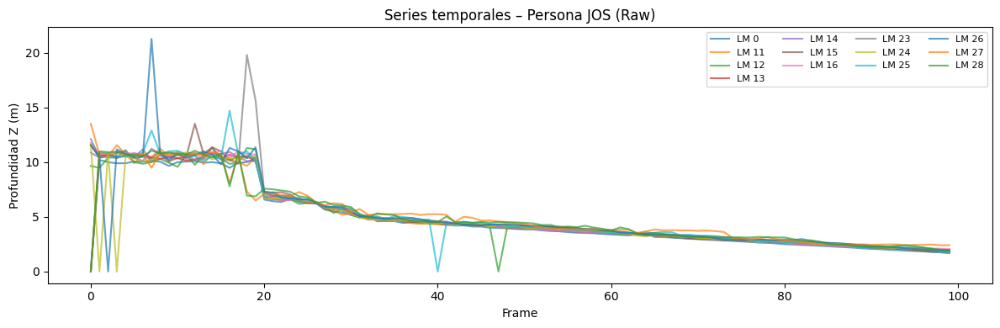

Archivo: grabacion_20260206_145312.csv (Procesado)


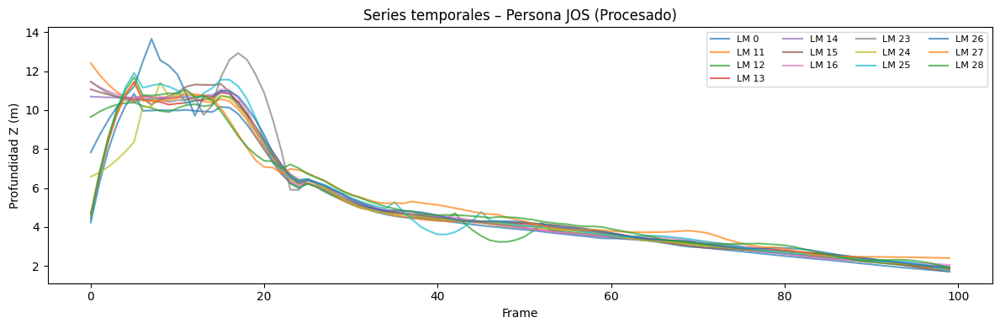

Archivo: grabacion_20260206_145337.csv (RAW)


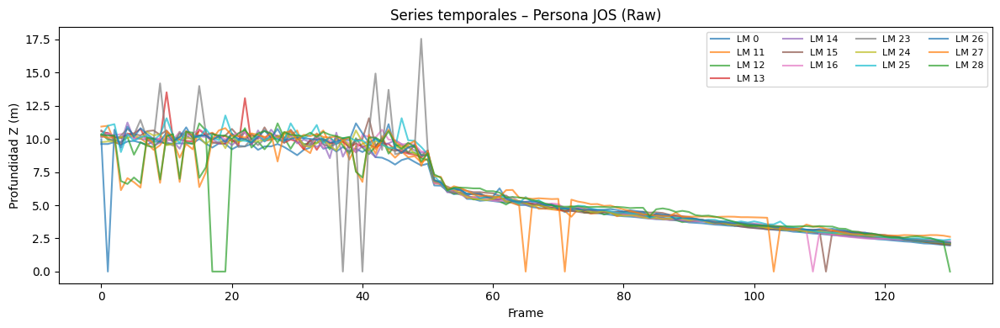

Archivo: grabacion_20260206_145337.csv (Procesado)


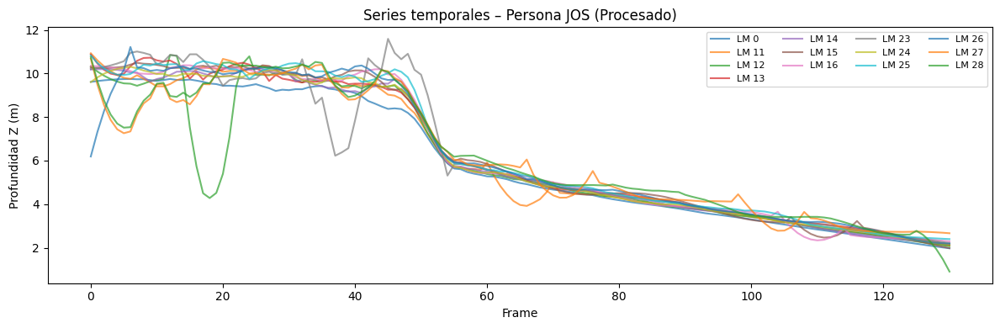

### Persona: MAR ###
Archivo: grabacion_20260206_144855.csv (RAW)


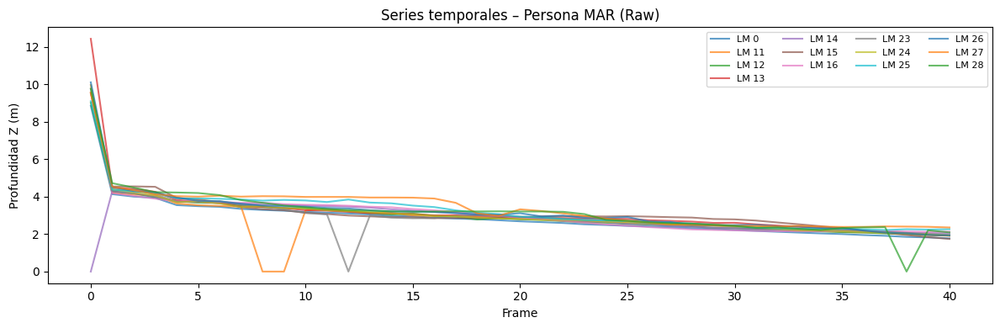

Archivo: grabacion_20260206_144855.csv (Procesado)


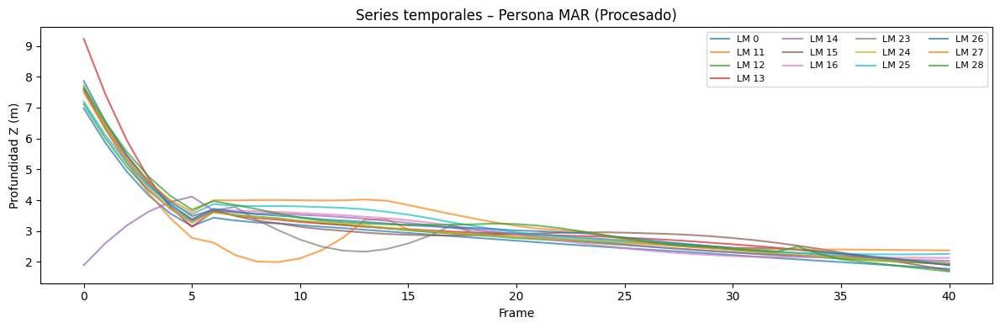

Archivo: grabacion_20260206_144925.csv (RAW)


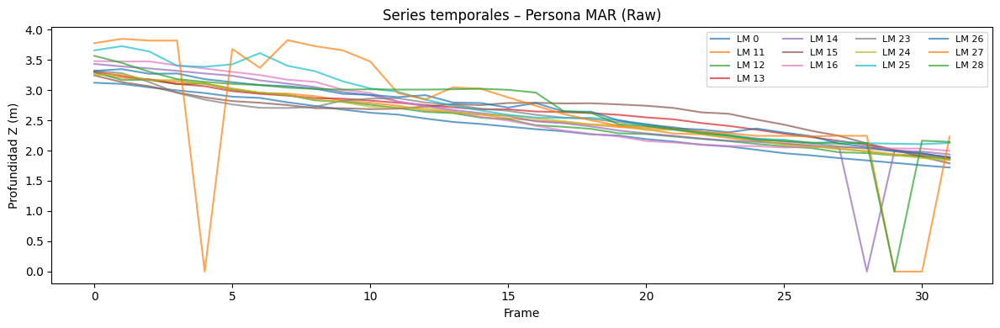

Archivo: grabacion_20260206_144925.csv (Procesado)


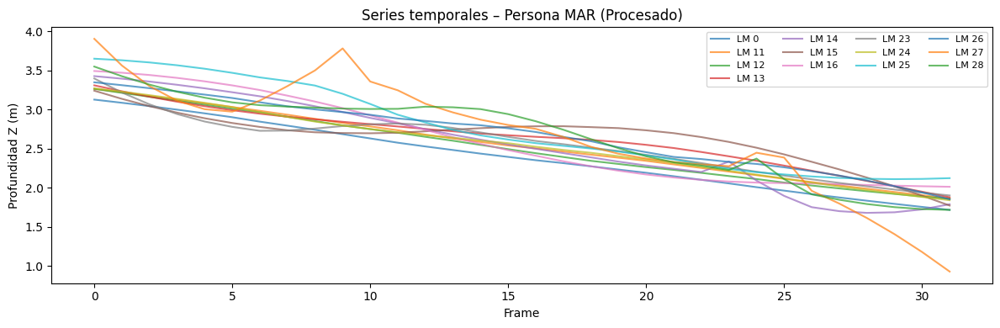

Archivo: grabacion_20260206_144951.csv (RAW)


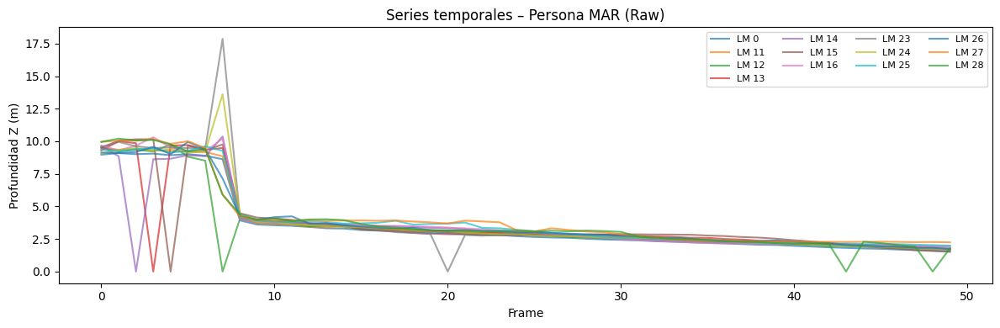

Archivo: grabacion_20260206_144951.csv (Procesado)


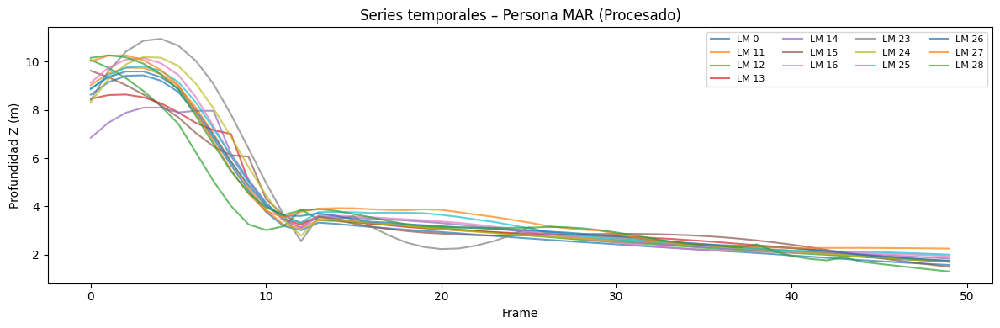

Archivo: grabacion_20260206_145050.csv (RAW)


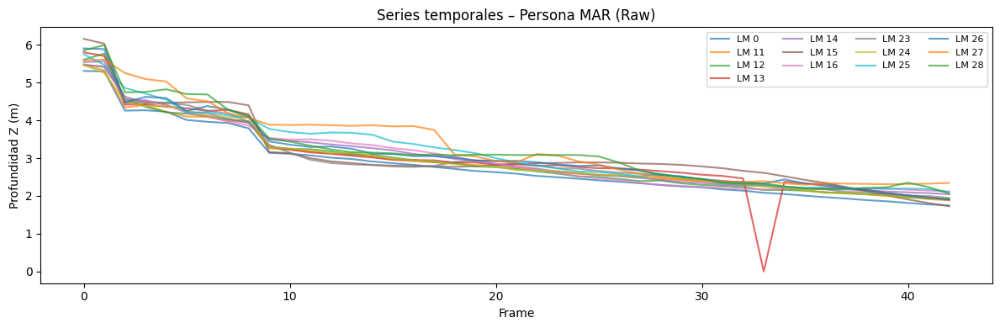

Archivo: grabacion_20260206_145050.csv (Procesado)


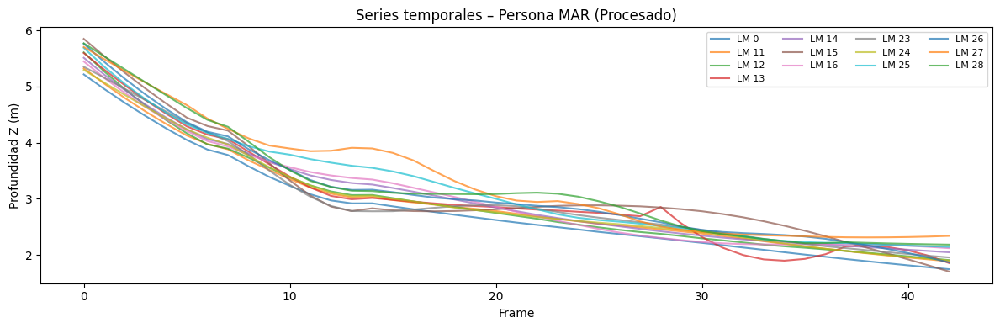

### Persona: MIN ###
Archivo: grabacion_20260206_144141.csv (RAW)


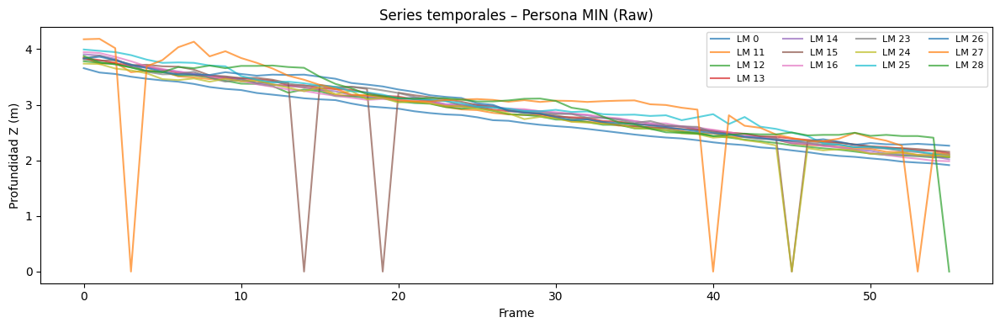

Archivo: grabacion_20260206_144141.csv (Procesado)


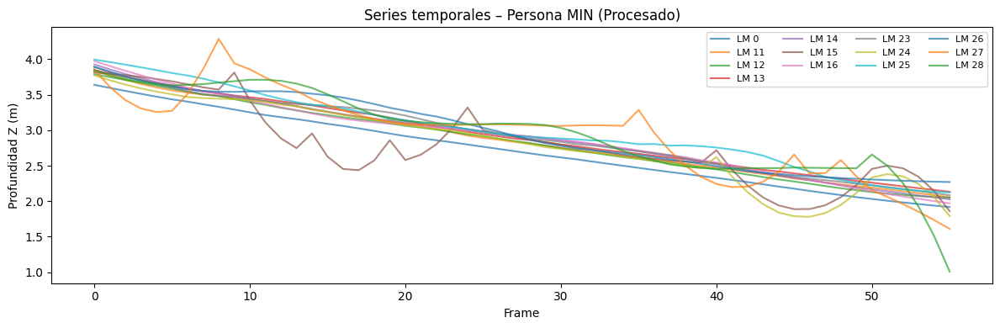

Archivo: grabacion_20260206_144302.csv (RAW)


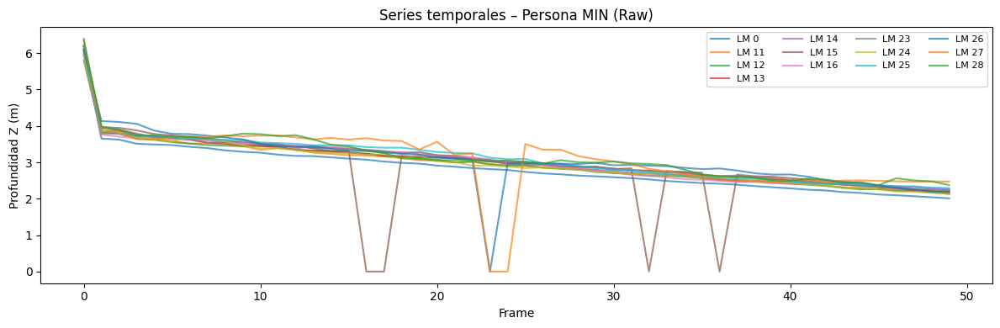

Archivo: grabacion_20260206_144302.csv (Procesado)


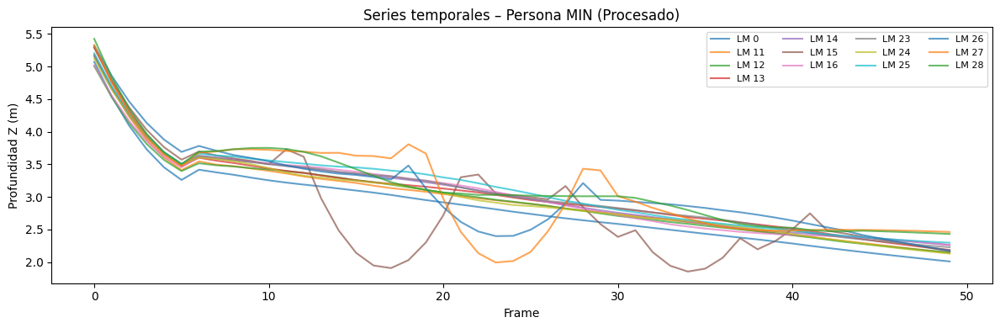

Archivo: grabacion_20260206_144331.csv (RAW)


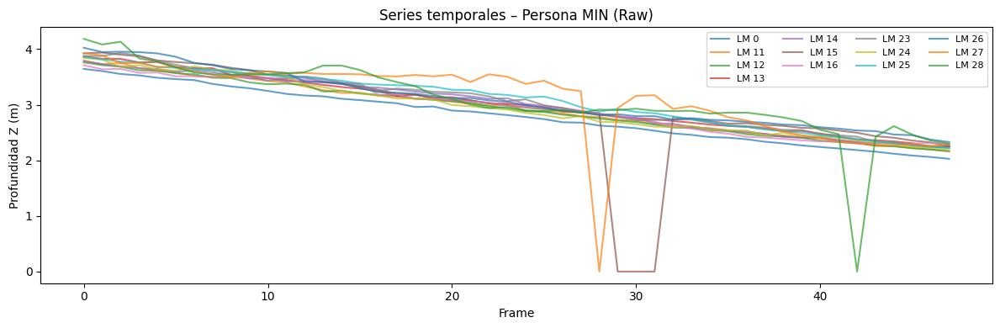

Archivo: grabacion_20260206_144331.csv (Procesado)


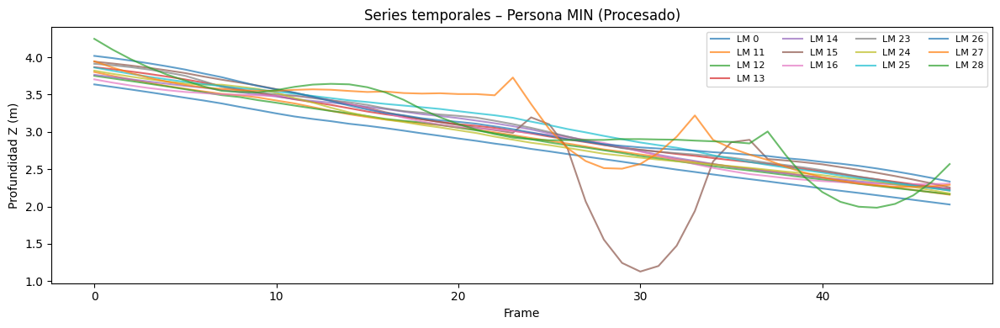

Archivo: grabacion_20260206_144403.csv (RAW)


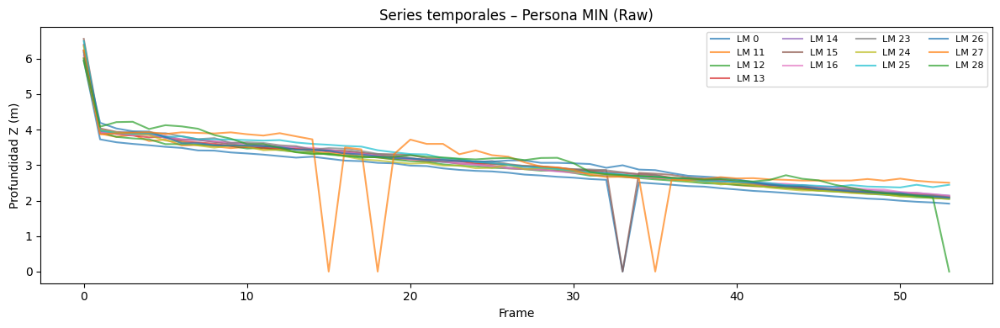

Archivo: grabacion_20260206_144403.csv (Procesado)


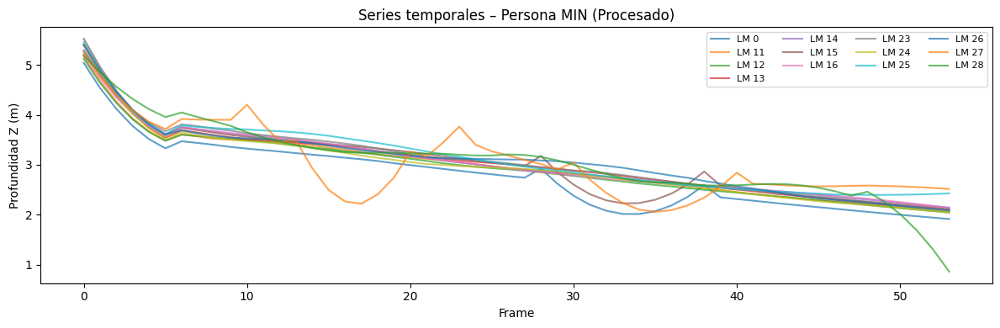

### Persona: NOR ###
Archivo: grabacion_20260206_145450.csv (RAW)


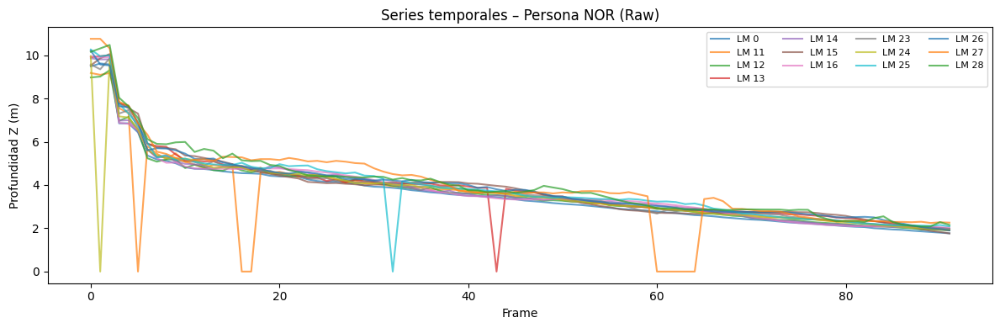

Archivo: grabacion_20260206_145450.csv (Procesado)


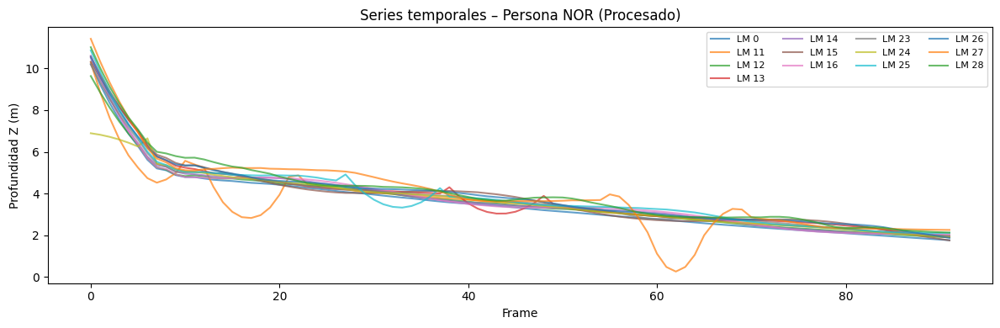

Archivo: grabacion_20260206_145535.csv (RAW)


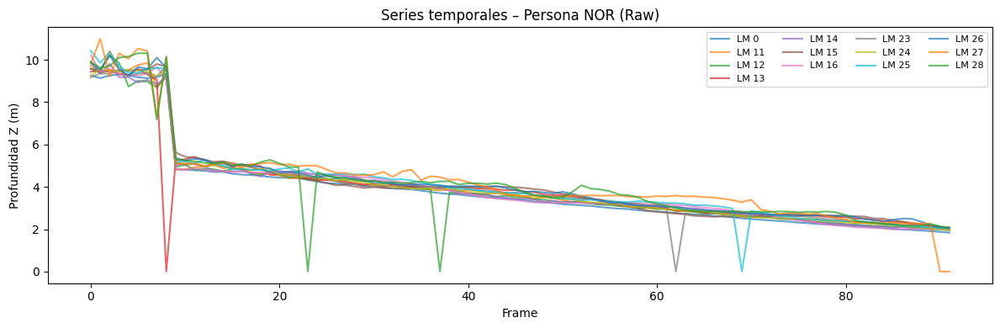

Archivo: grabacion_20260206_145535.csv (Procesado)


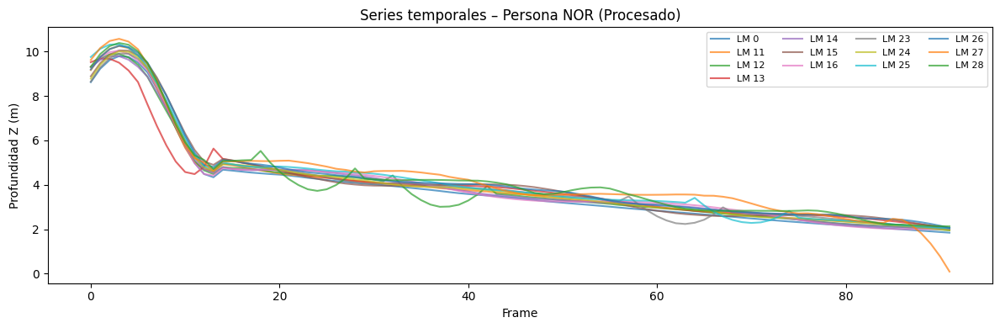

Archivo: grabacion_20260206_145607.csv (RAW)


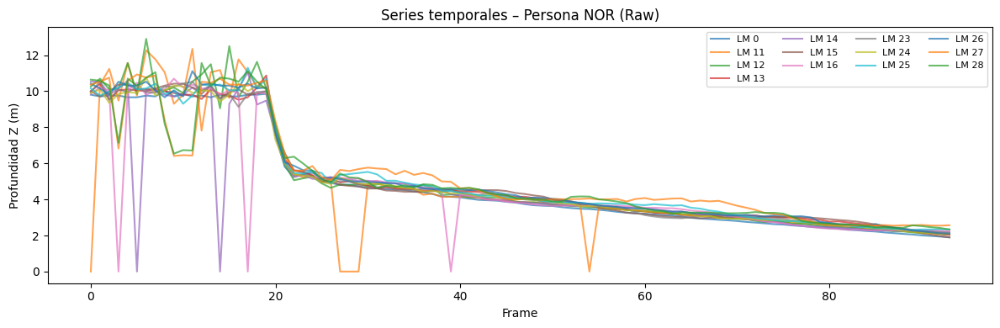

Archivo: grabacion_20260206_145607.csv (Procesado)


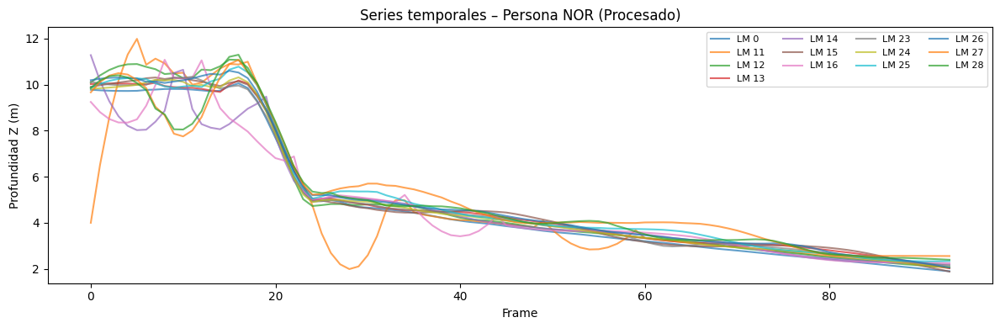

Archivo: grabacion_20260206_145723.csv (RAW)


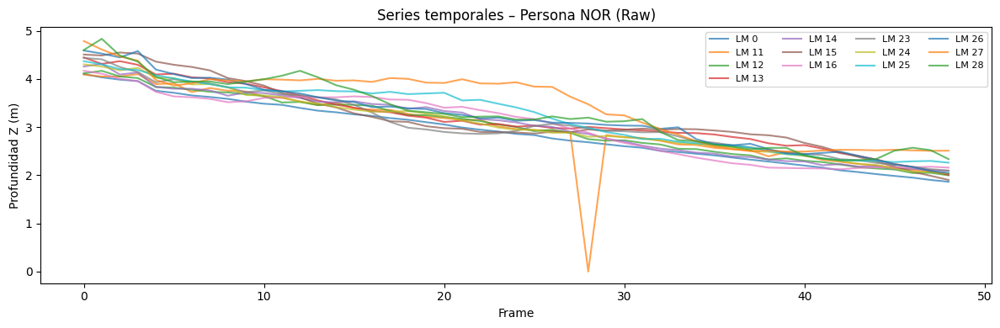

Archivo: grabacion_20260206_145723.csv (Procesado)


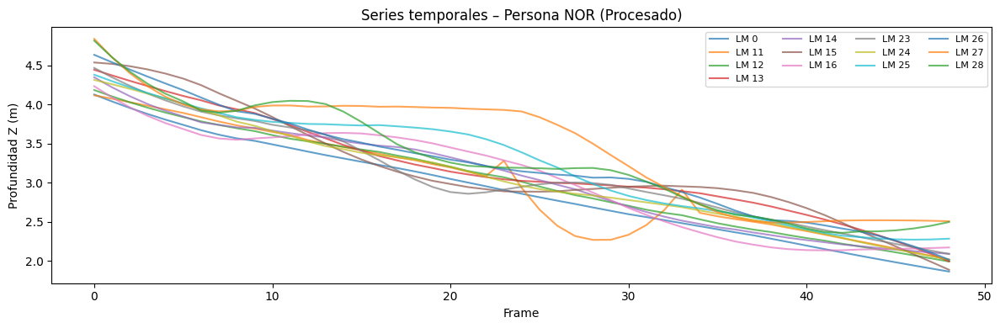

### Persona: TON ###
Archivo: grabacion_20260206_151013.csv (RAW)


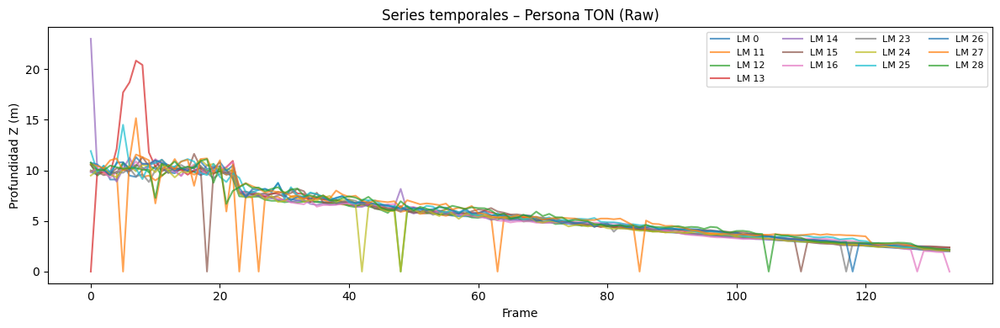

Archivo: grabacion_20260206_151013.csv (Procesado)


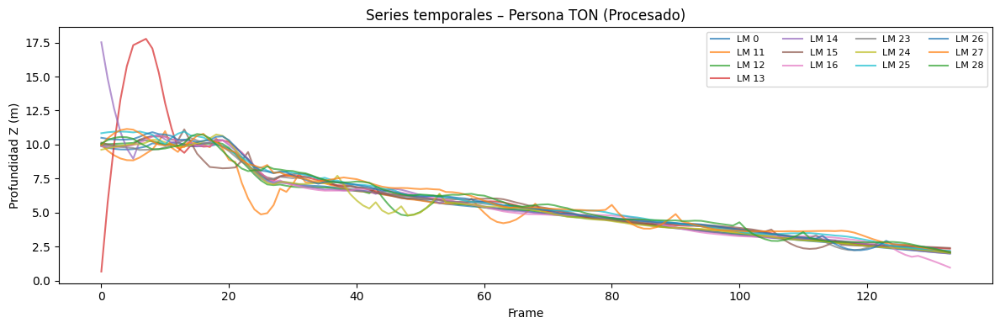

Archivo: grabacion_20260206_151037.csv (RAW)


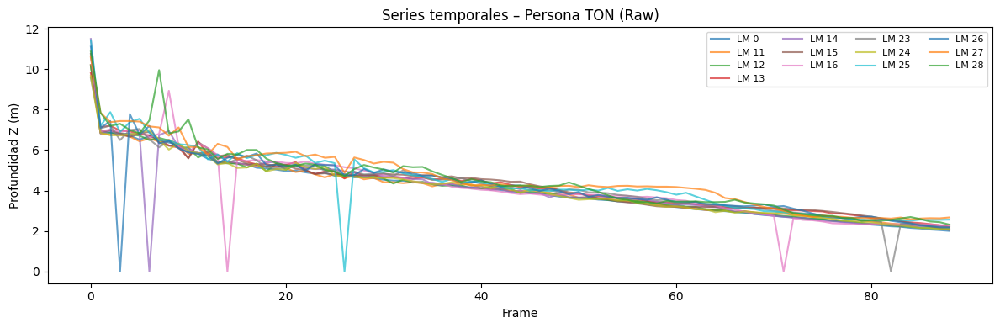

Archivo: grabacion_20260206_151037.csv (Procesado)


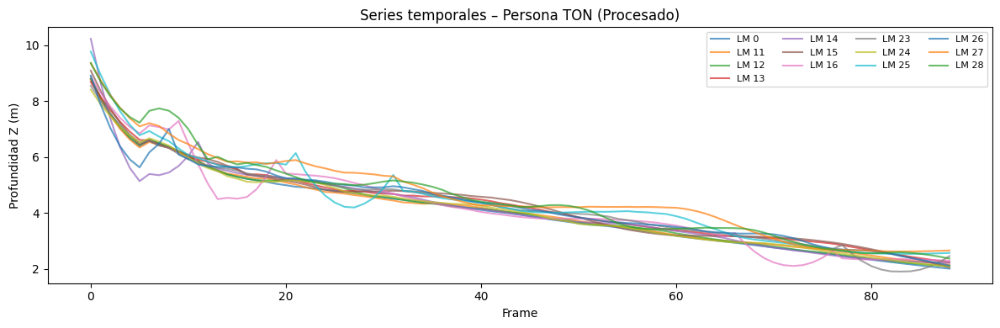

Archivo: grabacion_20260206_151104.csv (RAW)


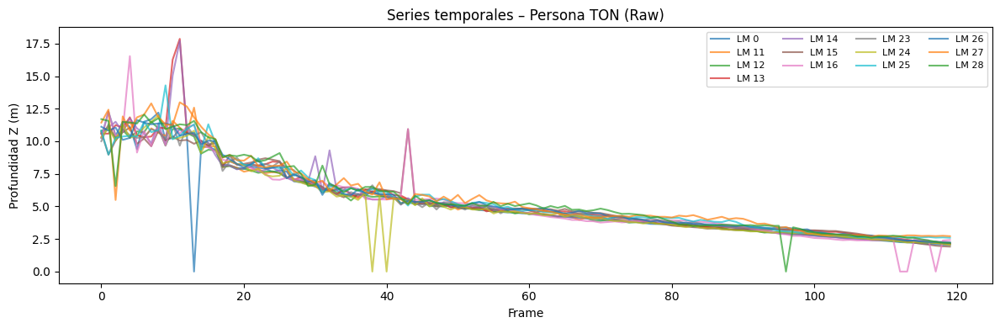

Archivo: grabacion_20260206_151104.csv (Procesado)


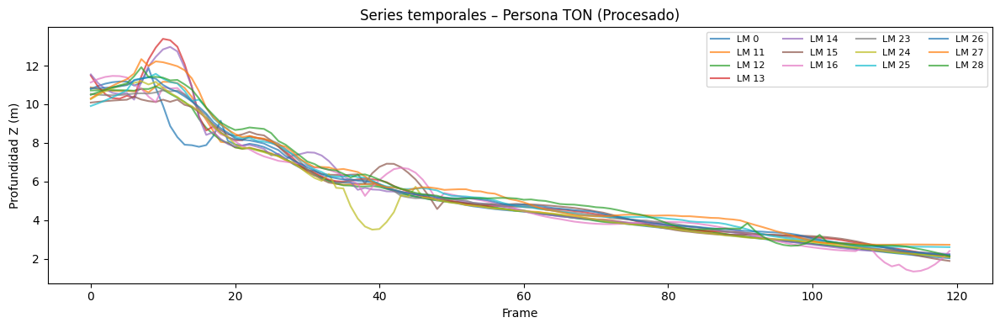

Archivo: grabacion_20260206_151132.csv (RAW)


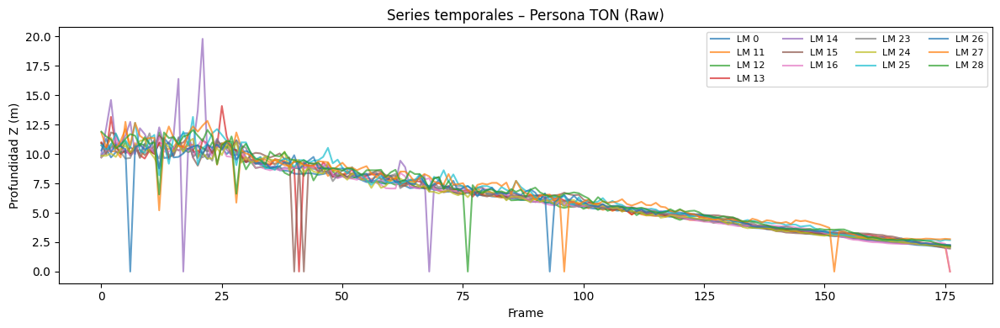

Archivo: grabacion_20260206_151132.csv (Procesado)


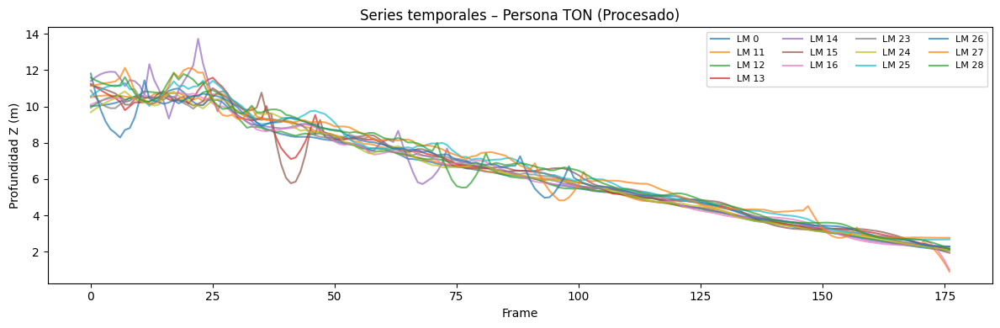

### Persona: ZAR ###
Archivo: grabacion_20260206_140924.csv (RAW)


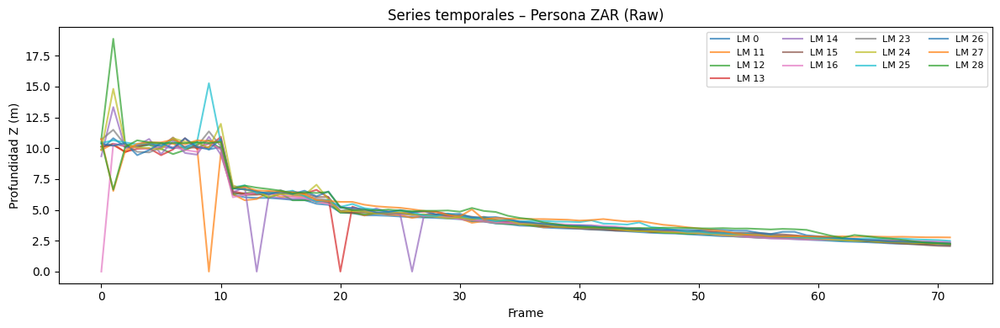

Archivo: grabacion_20260206_140924.csv (Procesado)


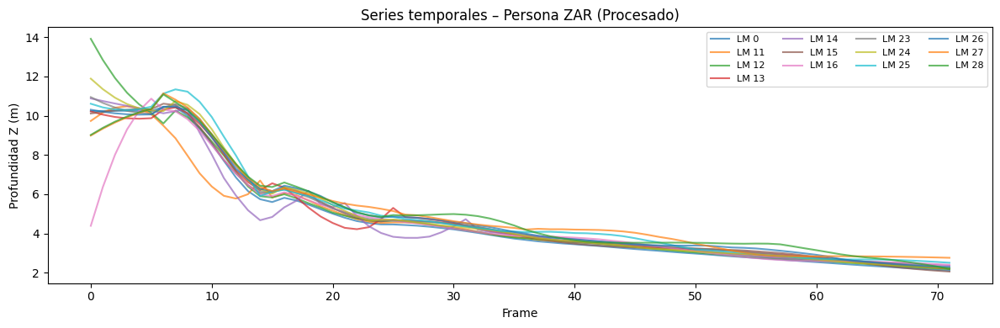

Archivo: grabacion_20260206_140957.csv (RAW)


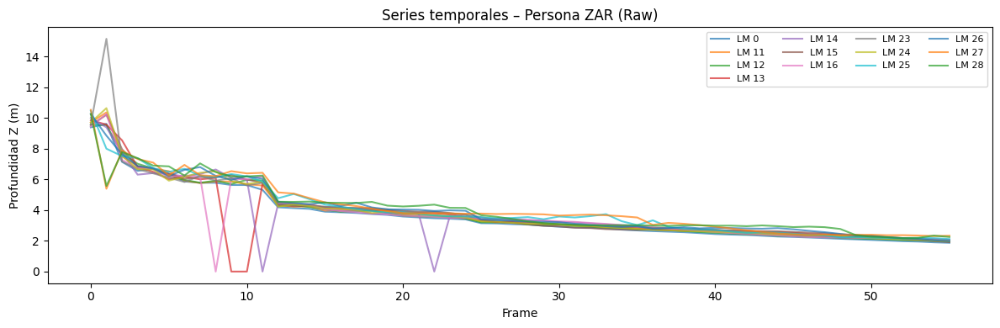

Archivo: grabacion_20260206_140957.csv (Procesado)


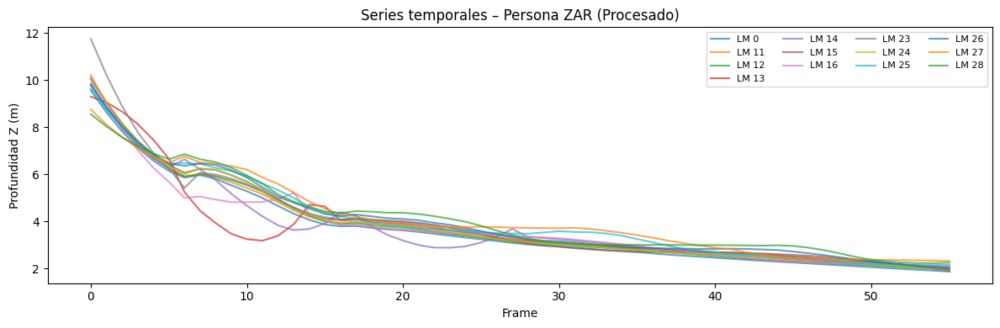

Archivo: grabacion_20260206_141027.csv (RAW)


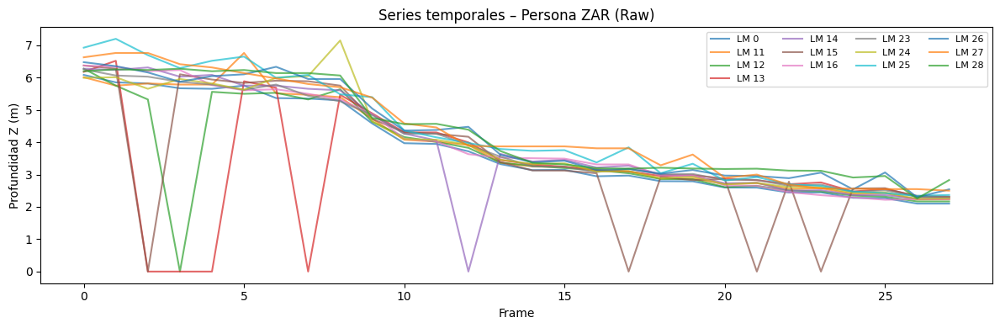

Archivo: grabacion_20260206_141027.csv (Procesado)


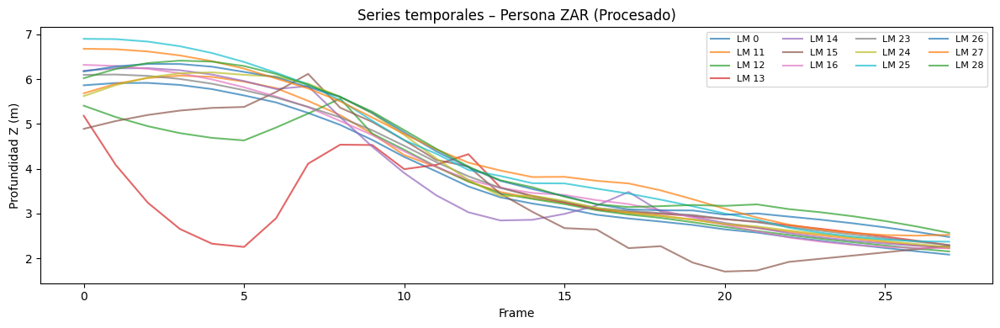

Archivo: grabacion_20260206_141104.csv (RAW)


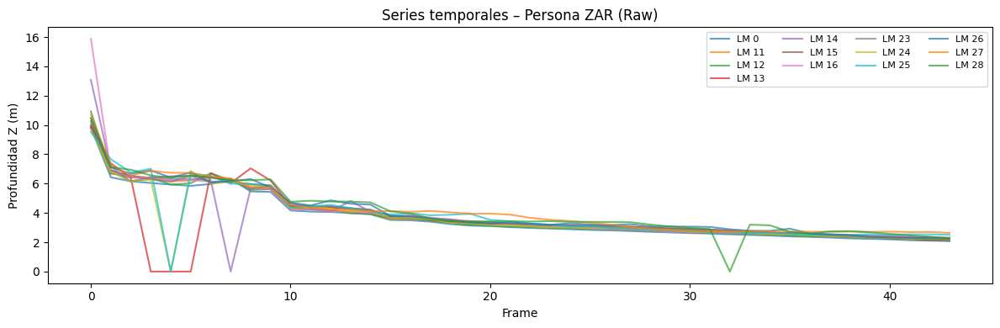

Archivo: grabacion_20260206_141104.csv (Procesado)


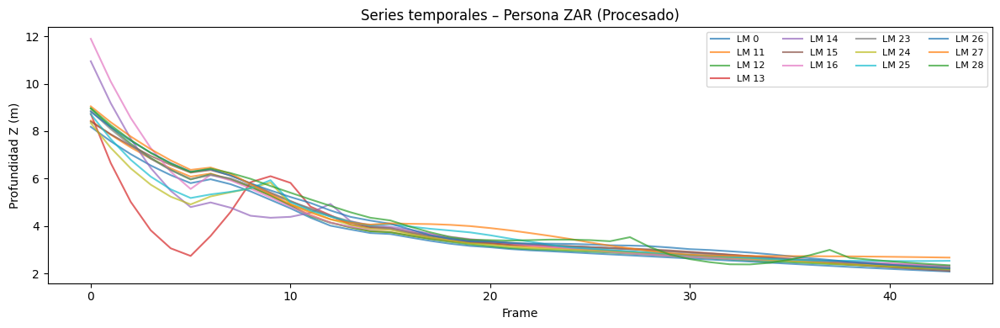

In [29]:
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

# ---------------- CONFIGURACIÓN ----------------
RAW_DIR = Path("annotations")             # CSV originales
PROCESSED_DIR = Path("annotations_processed")  # CSV filtrados
LANDMARK_IDS = [0, 11, 12, 13, 14, 15, 16, 23, 24, 25, 26, 27, 28]

# ---------------- AGRUPAR POR PERSONA ----------------
qc_df["persona"] = qc_df["etiqueta"].str.split("_").str[0]

# Tomamos el primer archivo por persona para identificar IDs
rep_files = (
    qc_df
    .sort_values("archivo")
    .groupby("persona")
    .first()
    .reset_index()
)

# ---------------- FUNCIONES DE PLOTEO ----------------
def plot_landmarks(df, persona, title_suffix="(Raw)"):
    plt.figure(figsize=(12,4))
    for lm in LANDMARK_IDS:
        plt.plot(df[f"z{lm}"], label=f"LM {lm}", alpha=0.7)
    plt.title(f"Series temporales – Persona {persona} {title_suffix}")
    plt.xlabel("Frame")
    plt.ylabel("Profundidad Z (m)")
    plt.legend(ncol=4, fontsize=8)
    plt.tight_layout()
    plt.show()

# ---------------- ITERAR POR PERSONA ----------------
for persona in rep_files["persona"]:
    print(f"### Persona: {persona} ###")

    # Obtenemos los 4 archivos correspondientes
    archivos_persona = qc_df[qc_df["persona"] == persona]["archivo"]

    for archivo in archivos_persona:
        # Paths
        raw_path = RAW_DIR / archivo
        proc_path = PROCESSED_DIR / archivo

        # Leer CSV original
        df_raw = pd.read_csv(raw_path)
        # Leer CSV procesado
        df_proc = pd.read_csv(proc_path)

        # ---------------- PLOTEO ----------------
        print(f"Archivo: {archivo} (RAW)")
        plot_landmarks(df_raw, persona, "(Raw)")

        print(f"Archivo: {archivo} (Procesado)")
        plot_landmarks(df_proc, persona, "(Procesado)")



==== Persona: DIA ====

### Estadísticas Raw – Persona DIA ###
LM 0 -> Media: 4.377, Mediana: 3.790, Std: 2.788
LM 11 -> Media: 4.862, Mediana: 3.969, Std: 3.218
LM 12 -> Media: 4.660, Mediana: 3.841, Std: 3.070
LM 13 -> Media: 4.532, Mediana: 4.100, Std: 2.137
LM 14 -> Media: 4.474, Mediana: 3.871, Std: 2.448
LM 15 -> Media: 4.495, Mediana: 4.151, Std: 2.035
LM 16 -> Media: 4.567, Mediana: 3.890, Std: 2.671
LM 23 -> Media: 4.573, Mediana: 4.138, Std: 2.194
LM 24 -> Media: 4.383, Mediana: 3.874, Std: 2.117
LM 25 -> Media: 4.447, Mediana: 3.970, Std: 1.945
LM 26 -> Media: 4.468, Mediana: 4.185, Std: 1.844
LM 27 -> Media: 4.486, Mediana: 4.165, Std: 1.672
LM 28 -> Media: 4.453, Mediana: 4.302, Std: 1.858

### Estadísticas Procesado – Persona DIA ###
LM 0 -> Media: 4.375, Mediana: 3.825, Std: 2.461
LM 11 -> Media: 4.851, Mediana: 3.987, Std: 2.856
LM 12 -> Media: 4.633, Mediana: 3.857, Std: 2.692
LM 13 -> Media: 4.533, Mediana: 4.111, Std: 2.115
LM 14 -> Media: 4.464, Mediana: 3.867, Std

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


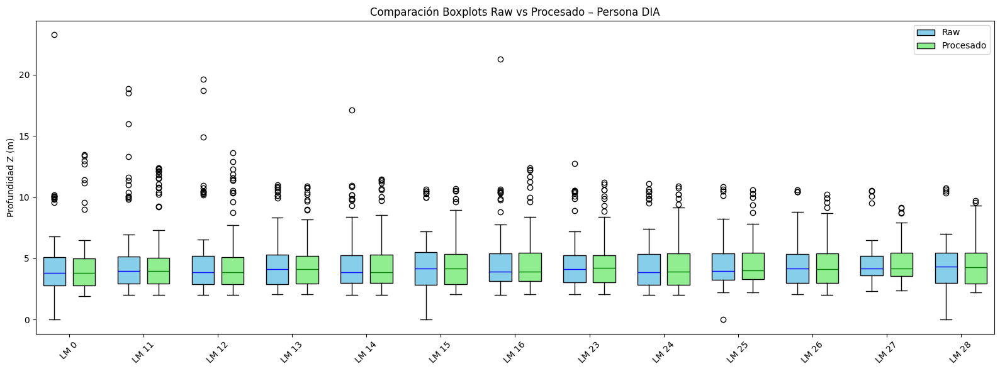


### Estadísticas Raw – Persona DIA ###
LM 0 -> Media: 2.892, Mediana: 2.838, Std: 0.611
LM 11 -> Media: 3.027, Mediana: 2.995, Std: 0.626
LM 12 -> Media: 2.980, Mediana: 2.895, Std: 0.598
LM 13 -> Media: 3.004, Mediana: 2.959, Std: 0.758
LM 14 -> Media: 2.973, Mediana: 2.874, Std: 0.631
LM 15 -> Media: 3.064, Mediana: 2.968, Std: 0.790
LM 16 -> Media: 3.035, Mediana: 2.964, Std: 0.672
LM 23 -> Media: 3.123, Mediana: 3.136, Std: 0.650
LM 24 -> Media: 2.955, Mediana: 2.870, Std: 0.593
LM 25 -> Media: 3.223, Mediana: 3.186, Std: 0.674
LM 26 -> Media: 3.187, Mediana: 2.995, Std: 0.643
LM 27 -> Media: 3.356, Mediana: 3.307, Std: 0.743
LM 28 -> Media: 3.325, Mediana: 3.258, Std: 0.653

### Estadísticas Procesado – Persona DIA ###
LM 0 -> Media: 2.892, Mediana: 2.834, Std: 0.610
LM 11 -> Media: 3.027, Mediana: 2.974, Std: 0.626
LM 12 -> Media: 2.980, Mediana: 2.917, Std: 0.596
LM 13 -> Media: 3.005, Mediana: 2.894, Std: 0.602
LM 14 -> Media: 2.972, Mediana: 2.886, Std: 0.628
LM 15 -> Media: 

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


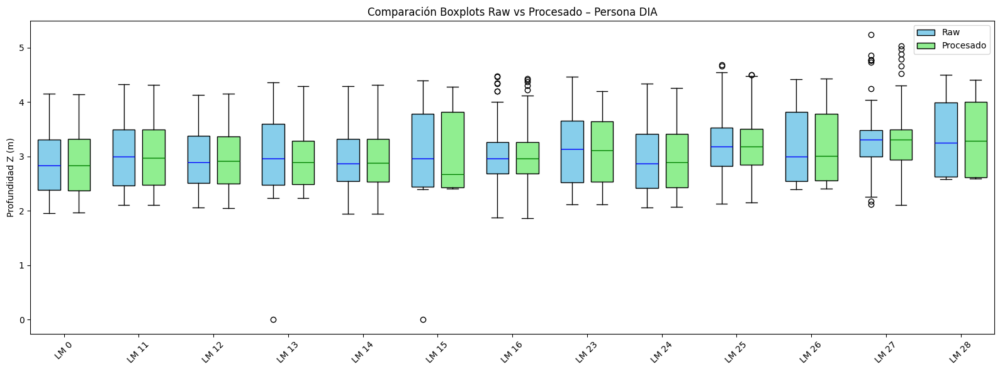


### Estadísticas Raw – Persona DIA ###
LM 0 -> Media: 4.923, Mediana: 3.938, Std: 3.134
LM 11 -> Media: 4.865, Mediana: 3.818, Std: 3.139
LM 12 -> Media: 5.012, Mediana: 4.025, Std: 3.168
LM 13 -> Media: 5.072, Mediana: 4.116, Std: 2.778
LM 14 -> Media: 5.100, Mediana: 4.066, Std: 3.171
LM 15 -> Media: 5.006, Mediana: 4.066, Std: 2.926
LM 16 -> Media: 5.002, Mediana: 4.221, Std: 2.803
LM 23 -> Media: 5.183, Mediana: 4.108, Std: 3.286
LM 24 -> Media: 5.050, Mediana: 3.946, Std: 3.143
LM 25 -> Media: 5.280, Mediana: 4.368, Std: 2.929
LM 26 -> Media: 5.169, Mediana: 4.151, Std: 2.755
LM 27 -> Media: 5.171, Mediana: 4.537, Std: 2.514
LM 28 -> Media: 5.193, Mediana: 4.203, Std: 2.546

### Estadísticas Procesado – Persona DIA ###
LM 0 -> Media: 4.919, Mediana: 3.884, Std: 2.943
LM 11 -> Media: 4.851, Mediana: 4.004, Std: 2.716
LM 12 -> Media: 5.009, Mediana: 3.990, Std: 2.958
LM 13 -> Media: 5.071, Mediana: 4.104, Std: 2.759
LM 14 -> Media: 5.095, Mediana: 4.025, Std: 2.991
LM 15 -> Media: 

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


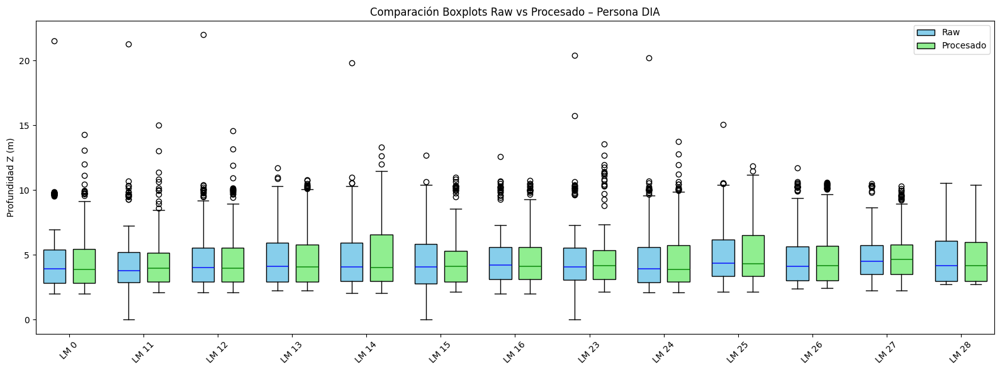


### Estadísticas Raw – Persona DIA ###
LM 0 -> Media: 2.962, Mediana: 2.924, Std: 0.542
LM 11 -> Media: 2.997, Mediana: 3.029, Std: 0.794
LM 12 -> Media: 3.051, Mediana: 3.048, Std: 0.523
LM 13 -> Media: 3.158, Mediana: 3.154, Std: 0.580
LM 14 -> Media: 3.067, Mediana: 3.017, Std: 0.549
LM 15 -> Media: 3.163, Mediana: 3.248, Std: 0.822
LM 16 -> Media: 3.112, Mediana: 3.044, Std: 0.542
LM 23 -> Media: 3.213, Mediana: 3.207, Std: 0.606
LM 24 -> Media: 3.058, Mediana: 3.034, Std: 0.520
LM 25 -> Media: 3.274, Mediana: 3.164, Std: 0.576
LM 26 -> Media: 3.307, Mediana: 3.318, Std: 0.601
LM 27 -> Media: 3.445, Mediana: 3.503, Std: 0.599
LM 28 -> Media: 3.400, Mediana: 3.383, Std: 0.664

### Estadísticas Procesado – Persona DIA ###
LM 0 -> Media: 2.962, Mediana: 2.932, Std: 0.540
LM 11 -> Media: 2.996, Mediana: 2.862, Std: 0.555
LM 12 -> Media: 3.051, Mediana: 3.057, Std: 0.520
LM 13 -> Media: 3.160, Mediana: 3.157, Std: 0.574
LM 14 -> Media: 3.067, Mediana: 3.037, Std: 0.547
LM 15 -> Media: 

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


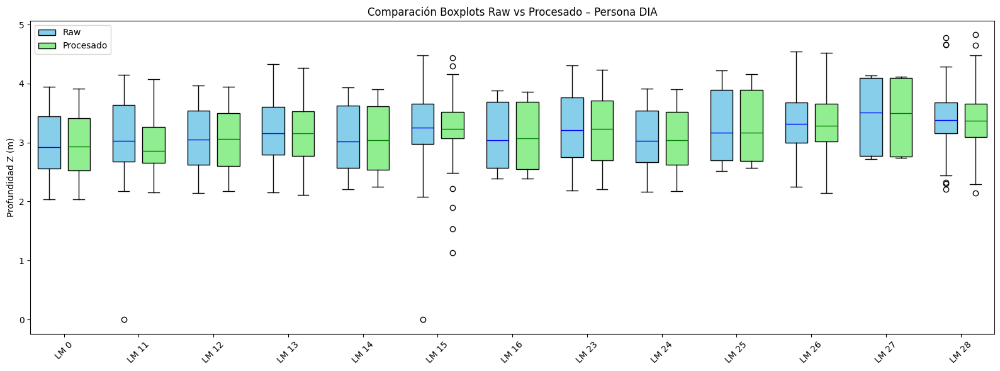


==== Persona: EDG ====

### Estadísticas Raw – Persona EDG ###
LM 0 -> Media: 4.130, Mediana: 3.889, Std: 1.807
LM 11 -> Media: 4.215, Mediana: 3.970, Std: 1.903
LM 12 -> Media: 4.302, Mediana: 3.946, Std: 2.057
LM 13 -> Media: 4.015, Mediana: 3.815, Std: 2.051
LM 14 -> Media: 4.307, Mediana: 4.013, Std: 1.863
LM 15 -> Media: 4.371, Mediana: 4.092, Std: 1.910
LM 16 -> Media: 4.219, Mediana: 3.985, Std: 1.952
LM 23 -> Media: 4.444, Mediana: 4.177, Std: 1.878
LM 24 -> Media: 4.342, Mediana: 4.125, Std: 1.811
LM 25 -> Media: 4.510, Mediana: 4.221, Std: 1.793
LM 26 -> Media: 4.493, Mediana: 4.160, Std: 1.791
LM 27 -> Media: 4.504, Mediana: 4.378, Std: 1.607
LM 28 -> Media: 4.489, Mediana: 4.537, Std: 1.570

### Estadísticas Procesado – Persona EDG ###
LM 0 -> Media: 4.128, Mediana: 3.890, Std: 1.801
LM 11 -> Media: 4.215, Mediana: 4.035, Std: 1.793
LM 12 -> Media: 4.302, Mediana: 3.943, Std: 2.048
LM 13 -> Media: 4.012, Mediana: 3.763, Std: 1.890
LM 14 -> Media: 4.303, Mediana: 4.020, Std

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


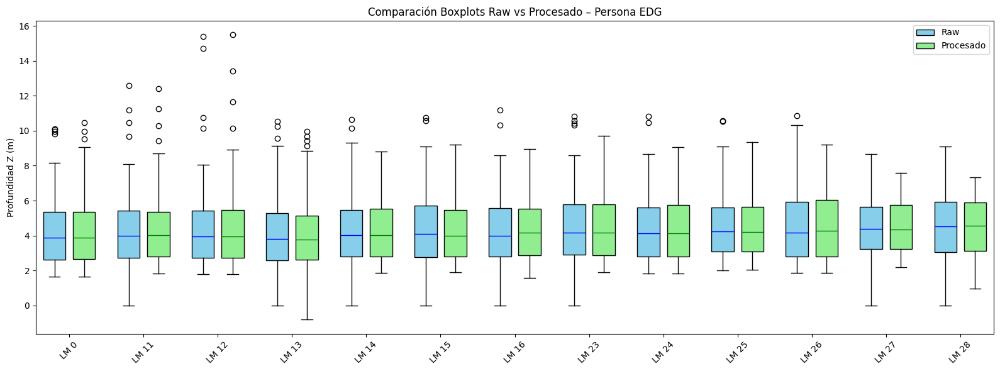


### Estadísticas Raw – Persona EDG ###
LM 0 -> Media: 3.527, Mediana: 3.441, Std: 1.106
LM 11 -> Media: 3.693, Mediana: 3.621, Std: 1.104
LM 12 -> Media: 3.675, Mediana: 3.541, Std: 1.137
LM 13 -> Media: 3.807, Mediana: 3.705, Std: 1.421
LM 14 -> Media: 3.750, Mediana: 3.628, Std: 1.122
LM 15 -> Media: 3.883, Mediana: 3.870, Std: 1.191
LM 16 -> Media: 3.821, Mediana: 3.621, Std: 1.146
LM 23 -> Media: 3.870, Mediana: 3.814, Std: 1.155
LM 24 -> Media: 3.791, Mediana: 3.750, Std: 1.153
LM 25 -> Media: 3.981, Mediana: 3.754, Std: 1.181
LM 26 -> Media: 3.994, Mediana: 4.029, Std: 1.219
LM 27 -> Media: 4.062, Mediana: 3.822, Std: 1.330
LM 28 -> Media: 4.075, Mediana: 4.021, Std: 1.347

### Estadísticas Procesado – Persona EDG ###
LM 0 -> Media: 3.527, Mediana: 3.437, Std: 1.106
LM 11 -> Media: 3.692, Mediana: 3.609, Std: 1.102
LM 12 -> Media: 3.676, Mediana: 3.552, Std: 1.137
LM 13 -> Media: 3.803, Mediana: 3.739, Std: 1.143
LM 14 -> Media: 3.750, Mediana: 3.617, Std: 1.119
LM 15 -> Media: 

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


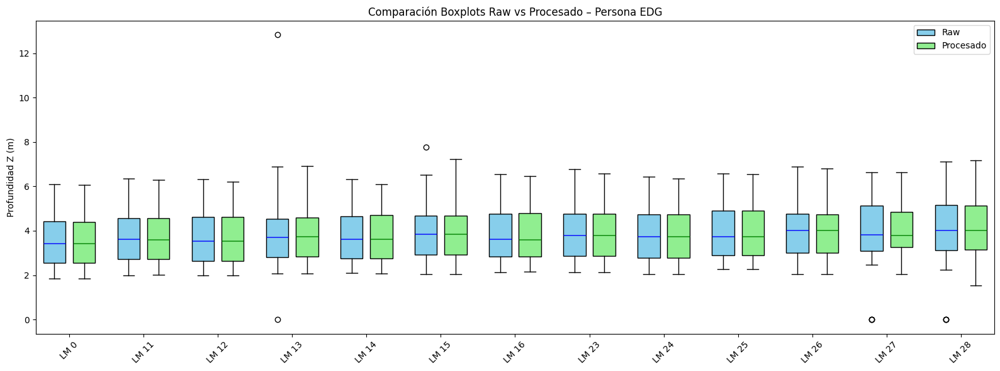


### Estadísticas Raw – Persona EDG ###
LM 0 -> Media: 2.958, Mediana: 2.826, Std: 0.875
LM 11 -> Media: 2.948, Mediana: 2.895, Std: 0.825
LM 12 -> Media: 3.080, Mediana: 2.942, Std: 0.874
LM 13 -> Media: 3.212, Mediana: 3.097, Std: 0.890
LM 14 -> Media: 3.076, Mediana: 3.045, Std: 0.860
LM 15 -> Media: 3.262, Mediana: 3.092, Std: 0.902
LM 16 -> Media: 3.232, Mediana: 3.181, Std: 0.907
LM 23 -> Media: 3.283, Mediana: 3.176, Std: 0.964
LM 24 -> Media: 3.180, Mediana: 3.013, Std: 0.911
LM 25 -> Media: 3.393, Mediana: 3.516, Std: 1.028
LM 26 -> Media: 3.357, Mediana: 3.107, Std: 0.964
LM 27 -> Media: 3.564, Mediana: 3.753, Std: 0.934
LM 28 -> Media: 3.576, Mediana: 3.232, Std: 0.929

### Estadísticas Procesado – Persona EDG ###
LM 0 -> Media: 2.959, Mediana: 2.821, Std: 0.872
LM 11 -> Media: 2.939, Mediana: 2.889, Std: 0.696
LM 12 -> Media: 3.080, Mediana: 2.938, Std: 0.872
LM 13 -> Media: 3.214, Mediana: 3.080, Std: 0.886
LM 14 -> Media: 3.065, Mediana: 3.029, Std: 0.652
LM 15 -> Media: 

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


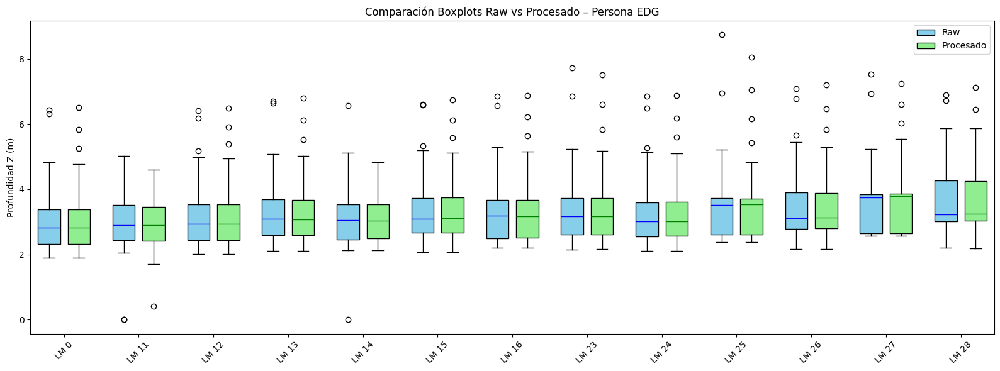


### Estadísticas Raw – Persona EDG ###
LM 0 -> Media: 3.049, Mediana: 2.842, Std: 1.233
LM 11 -> Media: 3.221, Mediana: 2.999, Std: 1.265
LM 12 -> Media: 3.159, Mediana: 2.951, Std: 1.172
LM 13 -> Media: 3.299, Mediana: 3.068, Std: 1.242
LM 14 -> Media: 3.269, Mediana: 3.073, Std: 1.268
LM 15 -> Media: 3.348, Mediana: 3.073, Std: 1.224
LM 16 -> Media: 3.324, Mediana: 3.176, Std: 1.209
LM 23 -> Media: 3.279, Mediana: 3.116, Std: 1.336
LM 24 -> Media: 3.265, Mediana: 3.050, Std: 1.251
LM 25 -> Media: 3.456, Mediana: 3.510, Std: 1.245
LM 26 -> Media: 3.444, Mediana: 3.161, Std: 1.243
LM 27 -> Media: 3.603, Mediana: 3.598, Std: 1.320
LM 28 -> Media: 3.607, Mediana: 3.151, Std: 1.308

### Estadísticas Procesado – Persona EDG ###
LM 0 -> Media: 3.057, Mediana: 2.837, Std: 1.190
LM 11 -> Media: 3.230, Mediana: 3.002, Std: 1.210
LM 12 -> Media: 3.166, Mediana: 2.934, Std: 1.145
LM 13 -> Media: 3.308, Mediana: 3.046, Std: 1.197
LM 14 -> Media: 3.278, Mediana: 3.085, Std: 1.221
LM 15 -> Media: 

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


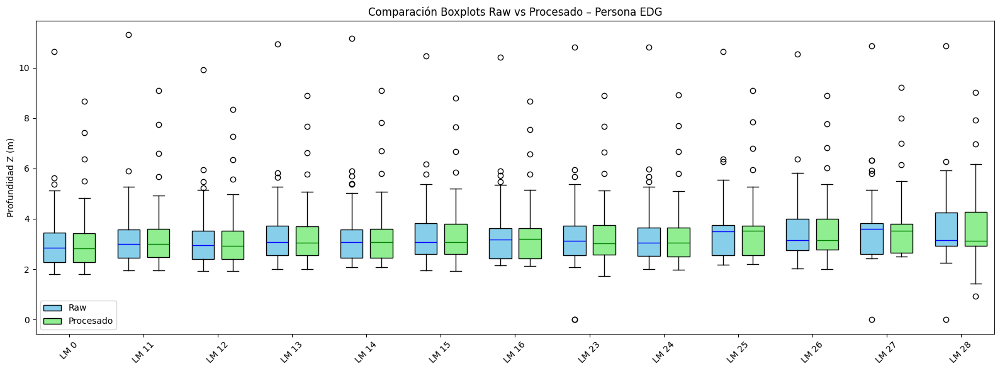


==== Persona: ERI ====

### Estadísticas Raw – Persona ERI ###
LM 0 -> Media: 4.462, Mediana: 4.212, Std: 2.310
LM 11 -> Media: 4.782, Mediana: 4.321, Std: 2.622
LM 12 -> Media: 4.619, Mediana: 4.340, Std: 2.533
LM 13 -> Media: 4.654, Mediana: 4.340, Std: 2.063
LM 14 -> Media: 4.700, Mediana: 4.407, Std: 2.319
LM 15 -> Media: 4.835, Mediana: 4.506, Std: 1.962
LM 16 -> Media: 4.718, Mediana: 4.568, Std: 1.945
LM 23 -> Media: 4.747, Mediana: 4.496, Std: 2.363
LM 24 -> Media: 4.771, Mediana: 4.526, Std: 2.415
LM 25 -> Media: 4.843, Mediana: 4.696, Std: 2.065
LM 26 -> Media: 4.818, Mediana: 4.436, Std: 2.000
LM 27 -> Media: 4.815, Mediana: 4.844, Std: 1.802
LM 28 -> Media: 4.777, Mediana: 4.378, Std: 1.858

### Estadísticas Procesado – Persona ERI ###
LM 0 -> Media: 4.469, Mediana: 4.194, Std: 2.209
LM 11 -> Media: 4.790, Mediana: 4.428, Std: 2.357
LM 12 -> Media: 4.623, Mediana: 4.251, Std: 2.197
LM 13 -> Media: 4.652, Mediana: 4.451, Std: 1.883
LM 14 -> Media: 4.707, Mediana: 4.457, Std

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


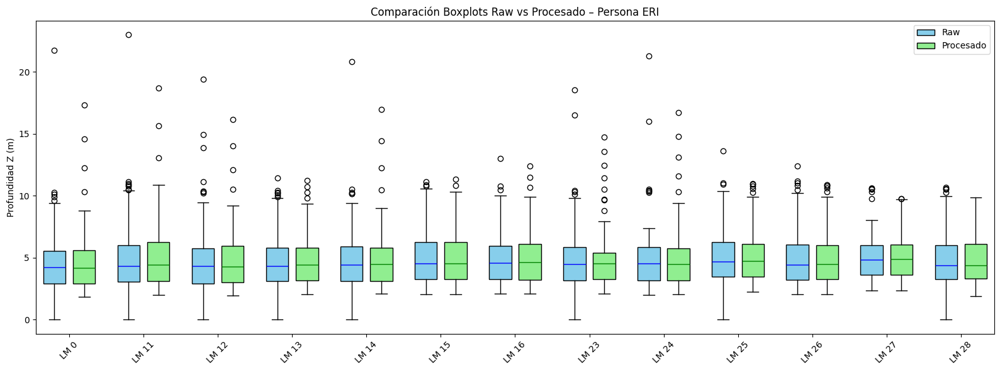


### Estadísticas Raw – Persona ERI ###
LM 0 -> Media: 4.912, Mediana: 4.257, Std: 2.838
LM 11 -> Media: 5.520, Mediana: 4.516, Std: 3.645
LM 12 -> Media: 5.334, Mediana: 4.496, Std: 3.259
LM 13 -> Media: 5.352, Mediana: 4.610, Std: 2.837
LM 14 -> Media: 5.333, Mediana: 4.436, Std: 3.399
LM 15 -> Media: 5.481, Mediana: 4.763, Std: 2.905
LM 16 -> Media: 5.523, Mediana: 4.426, Std: 3.404
LM 23 -> Media: 5.518, Mediana: 4.663, Std: 3.094
LM 24 -> Media: 5.453, Mediana: 4.456, Std: 3.295
LM 25 -> Media: 5.362, Mediana: 4.642, Std: 2.545
LM 26 -> Media: 5.442, Mediana: 4.741, Std: 2.679
LM 27 -> Media: 5.188, Mediana: 4.631, Std: 2.071
LM 28 -> Media: 5.179, Mediana: 4.763, Std: 2.169

### Estadísticas Procesado – Persona ERI ###
LM 0 -> Media: 4.933, Mediana: 4.361, Std: 2.598
LM 11 -> Media: 5.533, Mediana: 4.508, Std: 3.391
LM 12 -> Media: 5.333, Mediana: 4.486, Std: 3.109
LM 13 -> Media: 5.355, Mediana: 4.602, Std: 2.694
LM 14 -> Media: 5.342, Mediana: 4.423, Std: 3.103
LM 15 -> Media: 

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


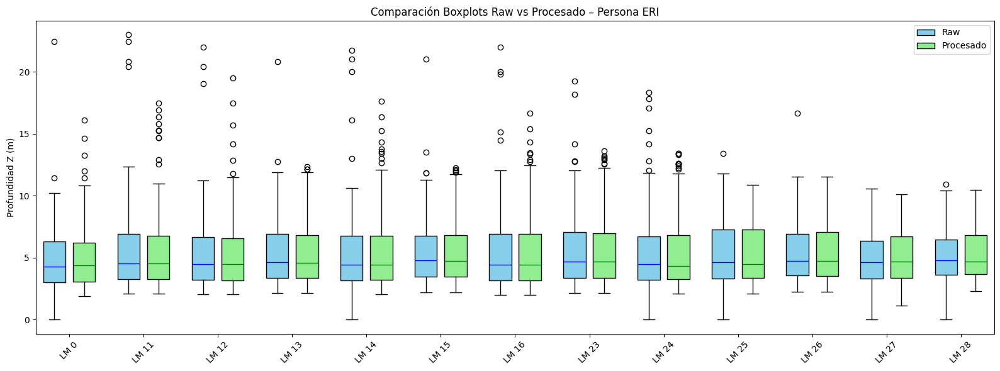


### Estadísticas Raw – Persona ERI ###
LM 0 -> Media: 5.099, Mediana: 4.752, Std: 2.373
LM 11 -> Media: 5.258, Mediana: 4.903, Std: 2.425
LM 12 -> Media: 5.461, Mediana: 4.832, Std: 3.087
LM 13 -> Media: 5.358, Mediana: 4.952, Std: 2.340
LM 14 -> Media: 5.284, Mediana: 4.832, Std: 2.329
LM 15 -> Media: 5.354, Mediana: 5.210, Std: 2.315
LM 16 -> Media: 5.378, Mediana: 4.868, Std: 2.513
LM 23 -> Media: 5.650, Mediana: 5.104, Std: 3.127
LM 24 -> Media: 5.328, Mediana: 4.844, Std: 2.656
LM 25 -> Media: 5.427, Mediana: 4.989, Std: 2.346
LM 26 -> Media: 5.441, Mediana: 5.143, Std: 2.329
LM 27 -> Media: 5.104, Mediana: 5.014, Std: 1.794
LM 28 -> Media: 5.043, Mediana: 5.039, Std: 1.918

### Estadísticas Procesado – Persona ERI ###
LM 0 -> Media: 5.106, Mediana: 4.770, Std: 2.304
LM 11 -> Media: 5.256, Mediana: 4.759, Std: 2.328
LM 12 -> Media: 5.453, Mediana: 4.923, Std: 2.938
LM 13 -> Media: 5.359, Mediana: 5.002, Std: 2.265
LM 14 -> Media: 5.285, Mediana: 4.858, Std: 2.323
LM 15 -> Media: 

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


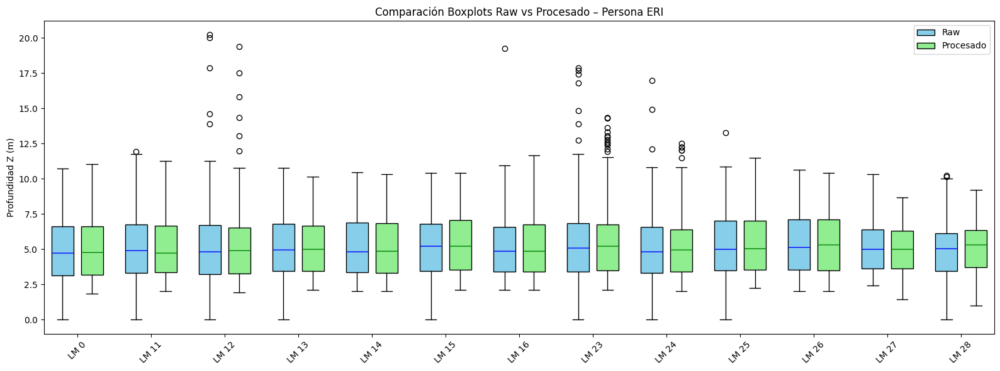


### Estadísticas Raw – Persona ERI ###
LM 0 -> Media: 4.534, Mediana: 4.151, Std: 1.976
LM 11 -> Media: 4.707, Mediana: 4.275, Std: 2.070
LM 12 -> Media: 4.667, Mediana: 4.284, Std: 2.106
LM 13 -> Media: 4.765, Mediana: 4.349, Std: 1.923
LM 14 -> Media: 4.643, Mediana: 4.349, Std: 1.876
LM 15 -> Media: 4.824, Mediana: 4.466, Std: 1.991
LM 16 -> Media: 4.752, Mediana: 4.547, Std: 1.936
LM 23 -> Media: 4.781, Mediana: 4.466, Std: 1.991
LM 24 -> Media: 4.686, Mediana: 4.302, Std: 2.021
LM 25 -> Media: 4.904, Mediana: 4.798, Std: 2.078
LM 26 -> Media: 4.832, Mediana: 4.426, Std: 2.028
LM 27 -> Media: 4.935, Mediana: 5.002, Std: 1.913
LM 28 -> Media: 4.885, Mediana: 4.426, Std: 1.903

### Estadísticas Procesado – Persona ERI ###
LM 0 -> Media: 4.534, Mediana: 4.155, Std: 1.975
LM 11 -> Media: 4.708, Mediana: 4.365, Std: 1.984
LM 12 -> Media: 4.673, Mediana: 4.302, Std: 2.089
LM 13 -> Media: 4.765, Mediana: 4.362, Std: 1.919
LM 14 -> Media: 4.641, Mediana: 4.347, Std: 1.866
LM 15 -> Media: 

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


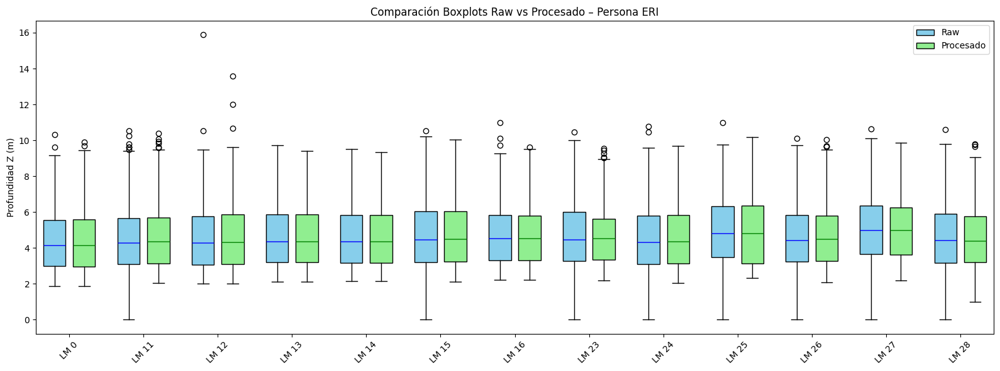


==== Persona: HUS ====

### Estadísticas Raw – Persona HUS ###
LM 0 -> Media: 3.212, Mediana: 3.161, Std: 0.891
LM 11 -> Media: 3.223, Mediana: 3.248, Std: 0.985
LM 12 -> Media: 3.306, Mediana: 3.318, Std: 0.971
LM 13 -> Media: 3.456, Mediana: 3.516, Std: 0.880
LM 14 -> Media: 3.485, Mediana: 3.368, Std: 0.897
LM 15 -> Media: 3.501, Mediana: 3.644, Std: 0.940
LM 16 -> Media: 3.473, Mediana: 3.248, Std: 0.889
LM 23 -> Media: 3.452, Mediana: 3.449, Std: 0.895
LM 24 -> Media: 3.355, Mediana: 3.391, Std: 0.966
LM 25 -> Media: 3.520, Mediana: 3.397, Std: 1.001
LM 26 -> Media: 3.503, Mediana: 3.528, Std: 1.003
LM 27 -> Media: 3.734, Mediana: 3.678, Std: 0.943
LM 28 -> Media: 3.681, Mediana: 3.775, Std: 1.027

### Estadísticas Procesado – Persona HUS ###
LM 0 -> Media: 3.213, Mediana: 3.169, Std: 0.891
LM 11 -> Media: 3.225, Mediana: 3.053, Std: 0.801
LM 12 -> Media: 3.306, Mediana: 3.239, Std: 0.914
LM 13 -> Media: 3.457, Mediana: 3.520, Std: 0.880
LM 14 -> Media: 3.486, Mediana: 3.374, Std

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


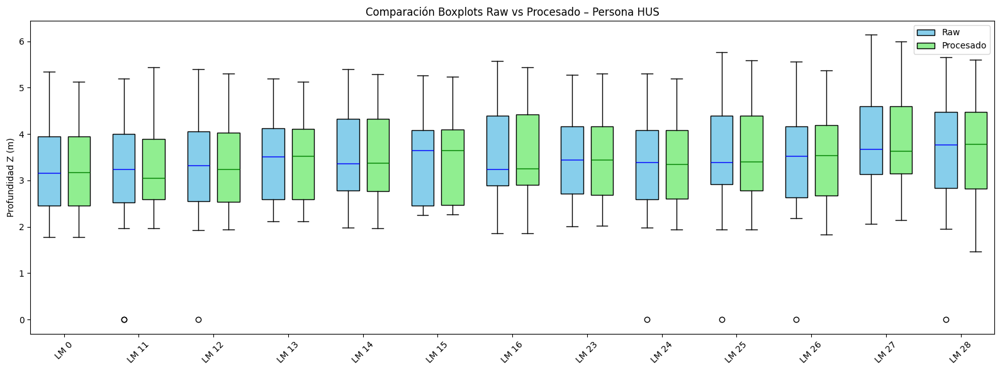


### Estadísticas Raw – Persona HUS ###
LM 0 -> Media: 3.690, Mediana: 3.553, Std: 1.345
LM 11 -> Media: 3.798, Mediana: 3.705, Std: 1.316
LM 12 -> Media: 3.793, Mediana: 3.637, Std: 1.424
LM 13 -> Media: 3.411, Mediana: 3.318, Std: 1.747
LM 14 -> Media: 3.903, Mediana: 3.712, Std: 1.427
LM 15 -> Media: 4.022, Mediana: 4.108, Std: 1.411
LM 16 -> Media: 3.960, Mediana: 3.541, Std: 1.427
LM 23 -> Media: 3.942, Mediana: 3.811, Std: 1.391
LM 24 -> Media: 3.890, Mediana: 3.768, Std: 1.374
LM 25 -> Media: 4.100, Mediana: 3.782, Std: 1.553
LM 26 -> Media: 4.014, Mediana: 4.009, Std: 1.472
LM 27 -> Media: 4.298, Mediana: 3.923, Std: 1.463
LM 28 -> Media: 4.134, Mediana: 4.108, Std: 1.516

### Estadísticas Procesado – Persona HUS ###
LM 0 -> Media: 3.690, Mediana: 3.555, Std: 1.343
LM 11 -> Media: 3.798, Mediana: 3.658, Std: 1.314
LM 12 -> Media: 3.793, Mediana: 3.722, Std: 1.344
LM 13 -> Media: 3.399, Mediana: 3.170, Std: 1.457
LM 14 -> Media: 3.910, Mediana: 3.760, Std: 1.274
LM 15 -> Media: 

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


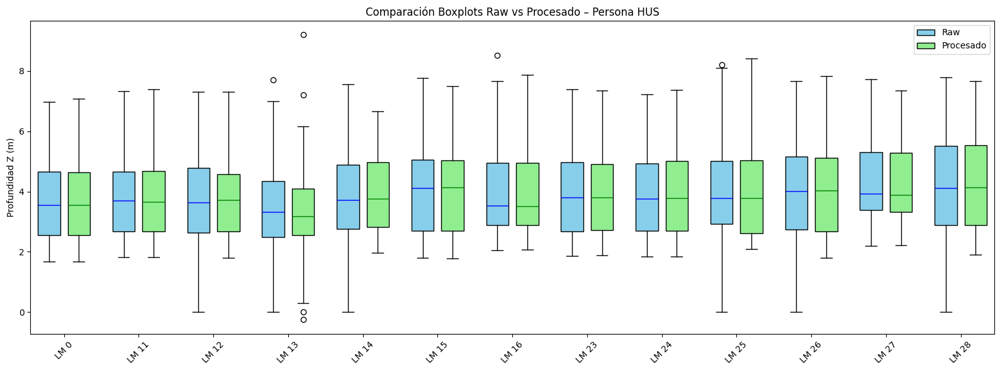


### Estadísticas Raw – Persona HUS ###
LM 0 -> Media: 3.765, Mediana: 3.689, Std: 1.184
LM 11 -> Media: 3.873, Mediana: 3.771, Std: 1.148
LM 12 -> Media: 3.907, Mediana: 3.747, Std: 1.197
LM 13 -> Media: 3.690, Mediana: 3.576, Std: 1.530
LM 14 -> Media: 4.027, Mediana: 3.890, Std: 1.198
LM 15 -> Media: 4.100, Mediana: 4.232, Std: 1.291
LM 16 -> Media: 4.002, Mediana: 3.750, Std: 1.169
LM 23 -> Media: 4.016, Mediana: 3.978, Std: 1.212
LM 24 -> Media: 3.954, Mediana: 3.991, Std: 1.204
LM 25 -> Media: 4.152, Mediana: 3.928, Std: 1.213
LM 26 -> Media: 4.115, Mediana: 4.168, Std: 1.251
LM 27 -> Media: 4.354, Mediana: 4.050, Std: 1.235
LM 28 -> Media: 4.271, Mediana: 4.231, Std: 1.286

### Estadísticas Procesado – Persona HUS ###
LM 0 -> Media: 3.766, Mediana: 3.717, Std: 1.183
LM 11 -> Media: 3.875, Mediana: 3.816, Std: 1.144
LM 12 -> Media: 3.909, Mediana: 3.794, Std: 1.193
LM 13 -> Media: 3.693, Mediana: 3.448, Std: 1.393
LM 14 -> Media: 4.028, Mediana: 3.907, Std: 1.198
LM 15 -> Media: 

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


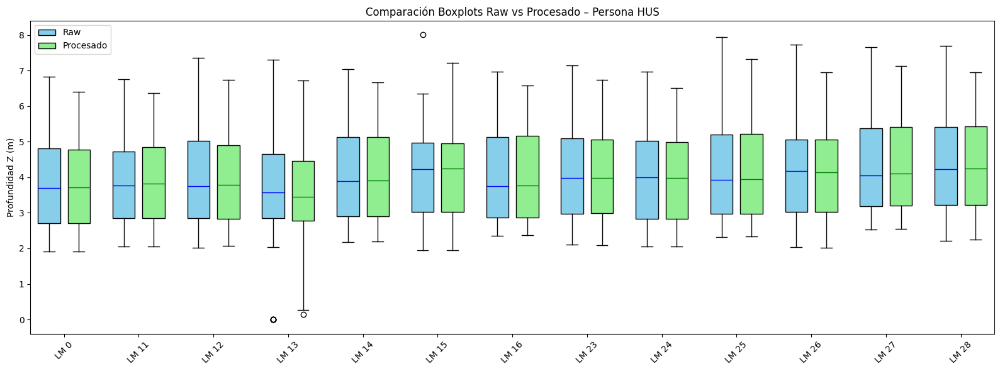


### Estadísticas Raw – Persona HUS ###
LM 0 -> Media: 3.623, Mediana: 3.492, Std: 1.141
LM 11 -> Media: 3.689, Mediana: 3.599, Std: 1.074
LM 12 -> Media: 3.608, Mediana: 3.519, Std: 1.318
LM 13 -> Media: 3.216, Mediana: 3.403, Std: 1.559
LM 14 -> Media: 3.848, Mediana: 3.631, Std: 1.140
LM 15 -> Media: 3.923, Mediana: 3.969, Std: 1.162
LM 16 -> Media: 3.795, Mediana: 3.426, Std: 1.149
LM 23 -> Media: 3.865, Mediana: 3.743, Std: 1.147
LM 24 -> Media: 3.806, Mediana: 3.709, Std: 1.157
LM 25 -> Media: 3.962, Mediana: 3.723, Std: 1.259
LM 26 -> Media: 3.961, Mediana: 3.954, Std: 1.176
LM 27 -> Media: 4.165, Mediana: 3.864, Std: 1.219
LM 28 -> Media: 4.151, Mediana: 4.160, Std: 1.179

### Estadísticas Procesado – Persona HUS ###
LM 0 -> Media: 3.625, Mediana: 3.499, Std: 1.141
LM 11 -> Media: 3.691, Mediana: 3.590, Std: 1.070
LM 12 -> Media: 3.612, Mediana: 3.473, Std: 1.130
LM 13 -> Media: 3.224, Mediana: 3.181, Std: 0.887
LM 14 -> Media: 3.850, Mediana: 3.636, Std: 1.140
LM 15 -> Media: 

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


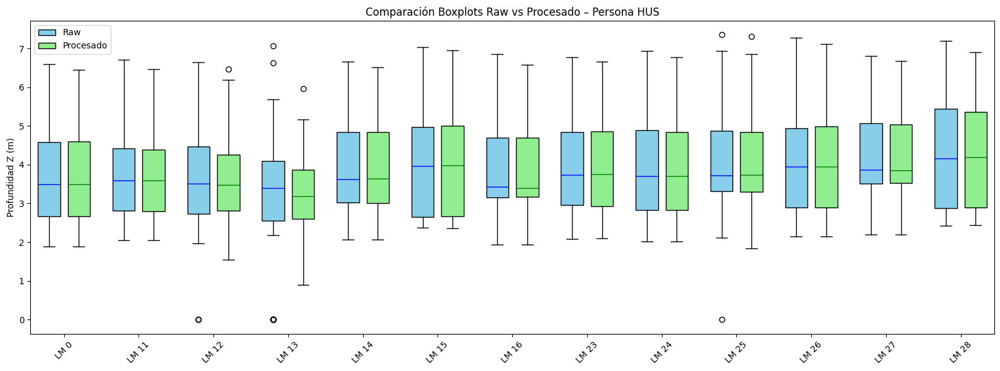


==== Persona: IAN ====

### Estadísticas Raw – Persona IAN ###
LM 0 -> Media: 3.292, Mediana: 2.906, Std: 1.310
LM 11 -> Media: 3.660, Mediana: 3.045, Std: 2.535
LM 12 -> Media: 3.208, Mediana: 2.925, Std: 1.378
LM 13 -> Media: 3.405, Mediana: 3.139, Std: 1.335
LM 14 -> Media: 3.460, Mediana: 2.995, Std: 1.596
LM 15 -> Media: 3.452, Mediana: 3.230, Std: 1.406
LM 16 -> Media: 3.410, Mediana: 2.880, Std: 1.460
LM 23 -> Media: 3.600, Mediana: 3.156, Std: 1.621
LM 24 -> Media: 3.479, Mediana: 3.078, Std: 1.411
LM 25 -> Media: 3.664, Mediana: 3.139, Std: 1.351
LM 26 -> Media: 3.585, Mediana: 3.238, Std: 1.337
LM 27 -> Media: 3.797, Mediana: 3.466, Std: 1.350
LM 28 -> Media: 3.710, Mediana: 3.459, Std: 1.349

### Estadísticas Procesado – Persona IAN ###
LM 0 -> Media: 3.292, Mediana: 2.912, Std: 1.308
LM 11 -> Media: 3.653, Mediana: 3.018, Std: 2.000
LM 12 -> Media: 3.210, Mediana: 2.982, Std: 1.042
LM 13 -> Media: 3.414, Mediana: 3.165, Std: 1.123
LM 14 -> Media: 3.472, Mediana: 3.031, Std

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


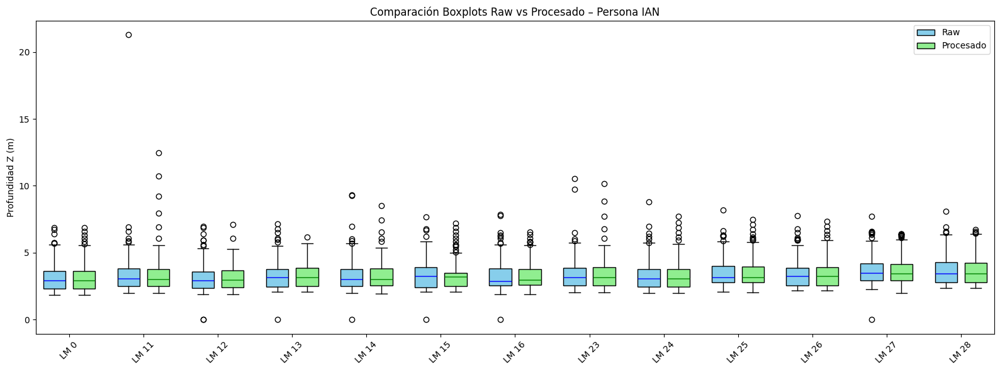


### Estadísticas Raw – Persona IAN ###
LM 0 -> Media: 3.141, Mediana: 2.980, Std: 1.125
LM 11 -> Media: 3.289, Mediana: 3.122, Std: 1.117
LM 12 -> Media: 3.190, Mediana: 3.039, Std: 1.192
LM 13 -> Media: 3.388, Mediana: 3.092, Std: 1.135
LM 14 -> Media: 3.303, Mediana: 3.261, Std: 1.115
LM 15 -> Media: 3.431, Mediana: 3.038, Std: 1.166
LM 16 -> Media: 3.267, Mediana: 3.288, Std: 1.117
LM 23 -> Media: 3.395, Mediana: 3.114, Std: 1.147
LM 24 -> Media: 3.138, Mediana: 3.055, Std: 1.264
LM 25 -> Media: 3.490, Mediana: 3.605, Std: 1.164
LM 26 -> Media: 3.474, Mediana: 3.204, Std: 1.293
LM 27 -> Media: 3.694, Mediana: 3.829, Std: 1.139
LM 28 -> Media: 3.508, Mediana: 3.243, Std: 1.286

### Estadísticas Procesado – Persona IAN ###
LM 0 -> Media: 3.149, Mediana: 2.960, Std: 1.095
LM 11 -> Media: 3.297, Mediana: 3.107, Std: 1.081
LM 12 -> Media: 3.193, Mediana: 3.035, Std: 1.157
LM 13 -> Media: 3.397, Mediana: 3.101, Std: 1.096
LM 14 -> Media: 3.311, Mediana: 3.271, Std: 1.086
LM 15 -> Media: 

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


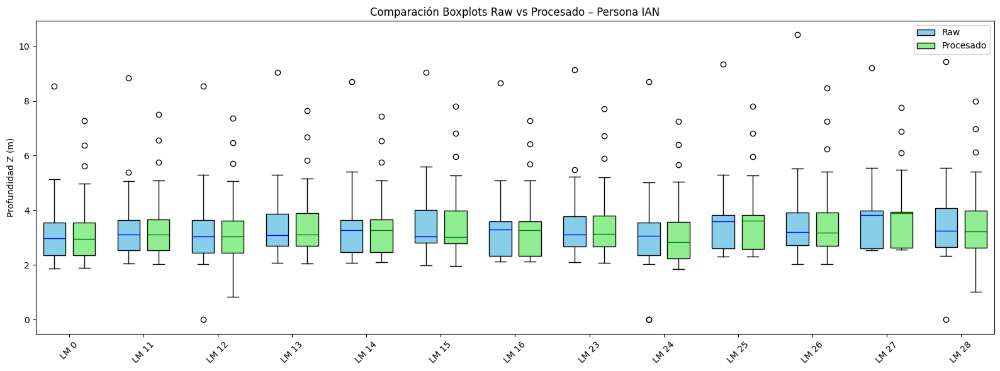


### Estadísticas Raw – Persona IAN ###
LM 0 -> Media: 3.317, Mediana: 3.211, Std: 1.052
LM 11 -> Media: 2.475, Mediana: 2.585, Std: 1.626
LM 12 -> Media: 3.317, Mediana: 3.274, Std: 1.070
LM 13 -> Media: 3.549, Mediana: 3.473, Std: 1.048
LM 14 -> Media: 3.343, Mediana: 3.346, Std: 1.164
LM 15 -> Media: 3.583, Mediana: 3.479, Std: 1.067
LM 16 -> Media: 3.374, Mediana: 3.285, Std: 1.139
LM 23 -> Media: 3.528, Mediana: 3.461, Std: 1.022
LM 24 -> Media: 3.455, Mediana: 3.426, Std: 1.013
LM 25 -> Media: 3.631, Mediana: 3.547, Std: 1.148
LM 26 -> Media: 3.610, Mediana: 3.516, Std: 1.067
LM 27 -> Media: 3.916, Mediana: 3.705, Std: 1.115
LM 28 -> Media: 3.741, Mediana: 3.768, Std: 1.242

### Estadísticas Procesado – Persona IAN ###
LM 0 -> Media: 3.317, Mediana: 3.224, Std: 1.052
LM 11 -> Media: 2.470, Mediana: 2.452, Std: 1.155
LM 12 -> Media: 3.306, Mediana: 3.309, Std: 0.948
LM 13 -> Media: 3.549, Mediana: 3.449, Std: 1.046
LM 14 -> Media: 3.333, Mediana: 3.338, Std: 1.009
LM 15 -> Media: 

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


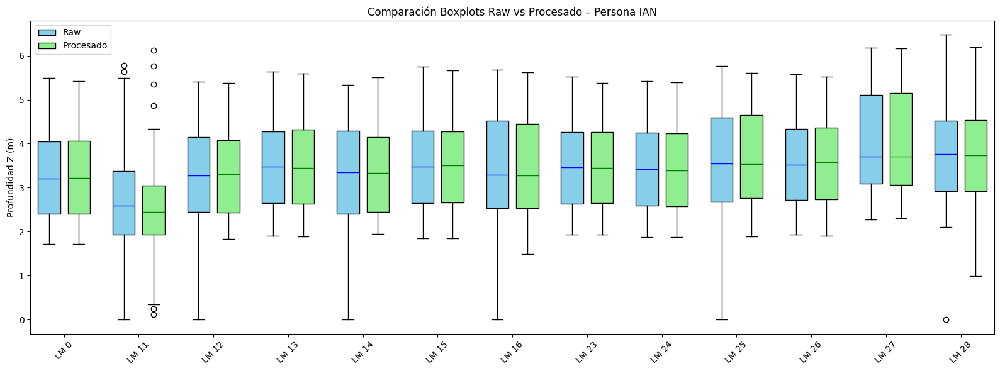


### Estadísticas Raw – Persona IAN ###
LM 0 -> Media: 3.589, Mediana: 3.397, Std: 1.304
LM 11 -> Media: 2.625, Mediana: 2.814, Std: 1.836
LM 12 -> Media: 3.670, Mediana: 3.443, Std: 1.261
LM 13 -> Media: 3.814, Mediana: 3.678, Std: 1.291
LM 14 -> Media: 3.736, Mediana: 3.491, Std: 1.280
LM 15 -> Media: 3.821, Mediana: 3.803, Std: 1.284
LM 16 -> Media: 3.672, Mediana: 3.269, Std: 1.282
LM 23 -> Media: 3.806, Mediana: 3.644, Std: 1.264
LM 24 -> Media: 3.654, Mediana: 3.541, Std: 1.309
LM 25 -> Media: 3.931, Mediana: 3.651, Std: 1.312
LM 26 -> Media: 3.894, Mediana: 3.684, Std: 1.321
LM 27 -> Media: 4.158, Mediana: 3.631, Std: 1.417
LM 28 -> Media: 4.030, Mediana: 3.803, Std: 1.383

### Estadísticas Procesado – Persona IAN ###
LM 0 -> Media: 3.598, Mediana: 3.372, Std: 1.273
LM 11 -> Media: 2.620, Mediana: 2.648, Std: 1.500
LM 12 -> Media: 3.678, Mediana: 3.457, Std: 1.236
LM 13 -> Media: 3.823, Mediana: 3.665, Std: 1.255
LM 14 -> Media: 3.743, Mediana: 3.458, Std: 1.262
LM 15 -> Media: 

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


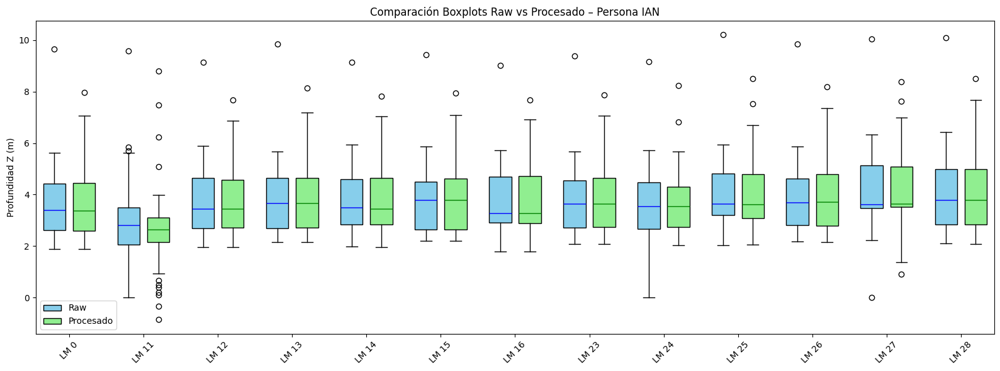


==== Persona: JAV ====

### Estadísticas Raw – Persona JAV ###
LM 0 -> Media: 4.588, Mediana: 4.368, Std: 2.025
LM 11 -> Media: 4.935, Mediana: 4.476, Std: 2.847
LM 12 -> Media: 4.849, Mediana: 4.599, Std: 2.230
LM 13 -> Media: 4.918, Mediana: 4.557, Std: 2.214
LM 14 -> Media: 4.966, Mediana: 4.752, Std: 2.128
LM 15 -> Media: 4.655, Mediana: 4.312, Std: 2.779
LM 16 -> Media: 5.004, Mediana: 4.685, Std: 2.187
LM 23 -> Media: 5.072, Mediana: 4.775, Std: 2.672
LM 24 -> Media: 4.997, Mediana: 4.631, Std: 2.350
LM 25 -> Media: 5.275, Mediana: 4.916, Std: 2.427
LM 26 -> Media: 5.223, Mediana: 4.718, Std: 2.283
LM 27 -> Media: 5.208, Mediana: 5.130, Std: 2.191
LM 28 -> Media: 5.194, Mediana: 4.786, Std: 2.225

### Estadísticas Procesado – Persona JAV ###
LM 0 -> Media: 4.596, Mediana: 4.394, Std: 1.910
LM 11 -> Media: 4.952, Mediana: 4.389, Std: 2.631
LM 12 -> Media: 4.856, Mediana: 4.655, Std: 2.096
LM 13 -> Media: 4.915, Mediana: 4.614, Std: 2.012
LM 14 -> Media: 4.965, Mediana: 4.725, Std

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


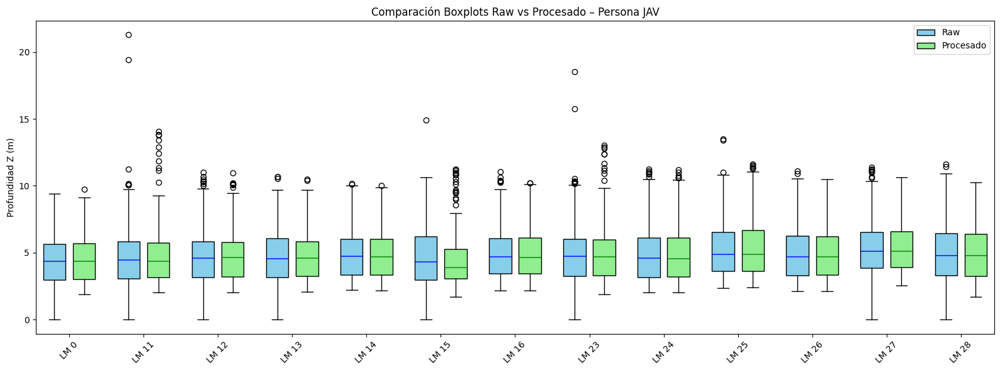


### Estadísticas Raw – Persona JAV ###
LM 0 -> Media: 5.921, Mediana: 5.117, Std: 3.638
LM 11 -> Media: 5.719, Mediana: 4.809, Std: 4.919
LM 12 -> Media: 6.358, Mediana: 5.511, Std: 4.117
LM 13 -> Media: 5.562, Mediana: 4.752, Std: 4.595
LM 14 -> Media: 6.346, Mediana: 5.407, Std: 4.286
LM 15 -> Media: 5.523, Mediana: 5.251, Std: 3.526
LM 16 -> Media: 6.449, Mediana: 6.433, Std: 2.502
LM 23 -> Media: 6.538, Mediana: 5.407, Std: 4.078
LM 24 -> Media: 5.916, Mediana: 4.821, Std: 4.101
LM 25 -> Media: 6.381, Mediana: 5.651, Std: 3.196
LM 26 -> Media: 6.245, Mediana: 5.542, Std: 2.765
LM 27 -> Media: 5.831, Mediana: 5.850, Std: 2.400
LM 28 -> Media: 5.930, Mediana: 5.799, Std: 2.343

### Estadísticas Procesado – Persona JAV ###
LM 0 -> Media: 5.973, Mediana: 4.871, Std: 3.395
LM 11 -> Media: 5.782, Mediana: 3.099, Std: 4.422
LM 12 -> Media: 6.411, Mediana: 4.987, Std: 3.850
LM 13 -> Media: 5.702, Mediana: 4.419, Std: 3.317
LM 14 -> Media: 6.401, Mediana: 5.326, Std: 3.563
LM 15 -> Media: 

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


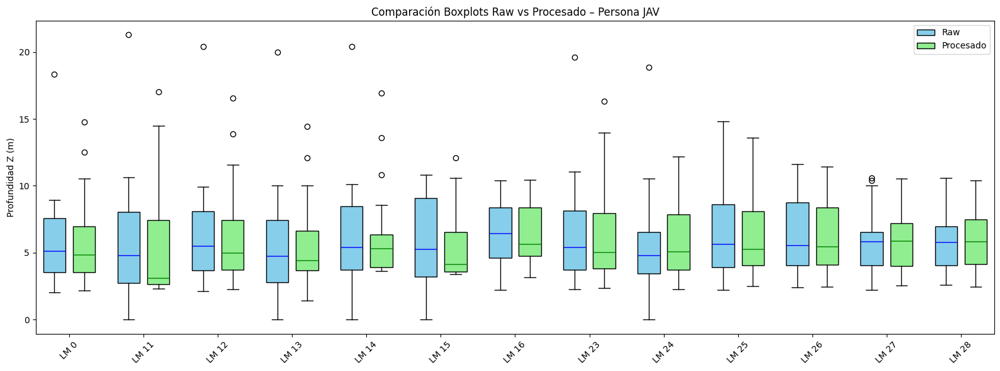


### Estadísticas Raw – Persona JAV ###
LM 0 -> Media: 3.712, Mediana: 3.329, Std: 1.316
LM 11 -> Media: 3.633, Mediana: 3.510, Std: 1.720
LM 12 -> Media: 4.146, Mediana: 4.416, Std: 2.112
LM 13 -> Media: 3.724, Mediana: 3.651, Std: 1.906
LM 14 -> Media: 4.322, Mediana: 4.557, Std: 1.239
LM 15 -> Media: 3.564, Mediana: 3.885, Std: 2.480
LM 16 -> Media: 4.215, Mediana: 4.177, Std: 1.999
LM 23 -> Media: 4.062, Mediana: 3.618, Std: 1.332
LM 24 -> Media: 3.687, Mediana: 3.719, Std: 1.714
LM 25 -> Media: 4.260, Mediana: 3.671, Std: 1.502
LM 26 -> Media: 4.208, Mediana: 4.159, Std: 1.438
LM 27 -> Media: 3.678, Mediana: 3.535, Std: 1.795
LM 28 -> Media: 4.201, Mediana: 4.058, Std: 1.417

### Estadísticas Procesado – Persona JAV ###
LM 0 -> Media: 3.712, Mediana: 3.508, Std: 1.294
LM 11 -> Media: 3.633, Mediana: 3.255, Std: 1.498
LM 12 -> Media: 4.146, Mediana: 3.626, Std: 1.019
LM 13 -> Media: 3.724, Mediana: 2.995, Std: 1.664
LM 14 -> Media: 4.322, Mediana: 4.130, Std: 0.983
LM 15 -> Media: 

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


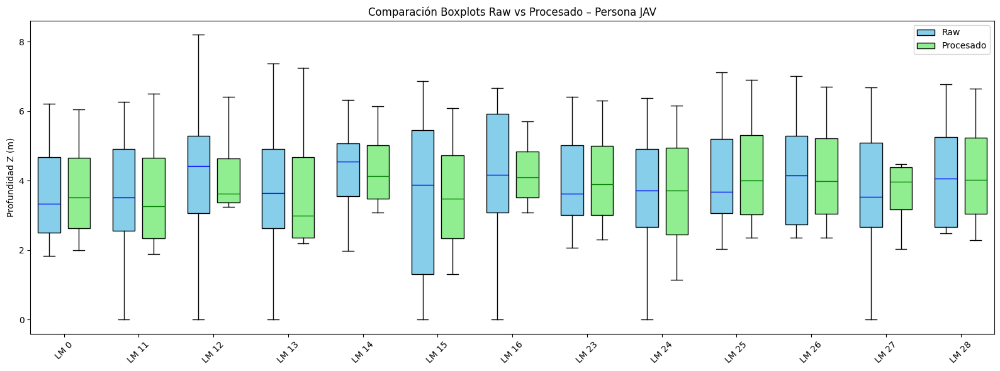


### Estadísticas Raw – Persona JAV ###
LM 0 -> Media: 5.956, Mediana: 5.636, Std: 2.408
LM 11 -> Media: 6.198, Mediana: 5.700, Std: 2.906
LM 12 -> Media: 6.427, Mediana: 5.667, Std: 3.134
LM 13 -> Media: 5.926, Mediana: 5.511, Std: 2.980
LM 14 -> Media: 6.353, Mediana: 5.833, Std: 2.633
LM 15 -> Media: 6.139, Mediana: 5.850, Std: 3.007
LM 16 -> Media: 6.417, Mediana: 5.833, Std: 2.713
LM 23 -> Media: 6.508, Mediana: 5.902, Std: 2.762
LM 24 -> Media: 6.360, Mediana: 5.902, Std: 2.839
LM 25 -> Media: 6.700, Mediana: 6.008, Std: 3.035
LM 26 -> Media: 6.621, Mediana: 6.291, Std: 2.649
LM 27 -> Media: 6.744, Mediana: 6.331, Std: 2.756
LM 28 -> Media: 6.844, Mediana: 6.454, Std: 2.752

### Estadísticas Procesado – Persona JAV ###
LM 0 -> Media: 5.957, Mediana: 5.648, Std: 2.399
LM 11 -> Media: 6.178, Mediana: 5.722, Std: 2.610
LM 12 -> Media: 6.415, Mediana: 5.790, Std: 2.790
LM 13 -> Media: 5.916, Mediana: 5.489, Std: 2.287
LM 14 -> Media: 6.352, Mediana: 5.804, Std: 2.601
LM 15 -> Media: 

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


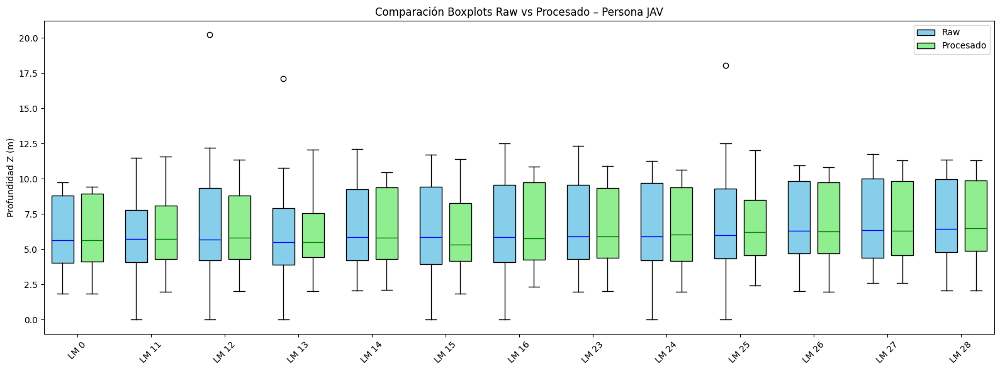


==== Persona: JOA ====

### Estadísticas Raw – Persona JOA ###
LM 0 -> Media: 3.950, Mediana: 3.657, Std: 1.488
LM 11 -> Media: 3.773, Mediana: 3.547, Std: 1.794
LM 12 -> Media: 4.054, Mediana: 3.862, Std: 1.635
LM 13 -> Media: 4.107, Mediana: 4.001, Std: 1.682
LM 14 -> Media: 3.995, Mediana: 3.789, Std: 1.709
LM 15 -> Media: 4.186, Mediana: 3.969, Std: 1.689
LM 16 -> Media: 4.180, Mediana: 3.684, Std: 1.605
LM 23 -> Media: 4.274, Mediana: 3.962, Std: 1.545
LM 24 -> Media: 4.185, Mediana: 3.862, Std: 1.560
LM 25 -> Media: 4.429, Mediana: 3.885, Std: 1.612
LM 26 -> Media: 4.414, Mediana: 4.302, Std: 1.630
LM 27 -> Media: 4.631, Mediana: 4.133, Std: 1.612
LM 28 -> Media: 4.532, Mediana: 4.185, Std: 1.703

### Estadísticas Procesado – Persona JOA ###
LM 0 -> Media: 3.950, Mediana: 3.766, Std: 1.487
LM 11 -> Media: 3.773, Mediana: 3.613, Std: 1.481
LM 12 -> Media: 4.054, Mediana: 3.917, Std: 1.583
LM 13 -> Media: 4.108, Mediana: 3.785, Std: 1.494
LM 14 -> Media: 3.998, Mediana: 4.010, Std

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


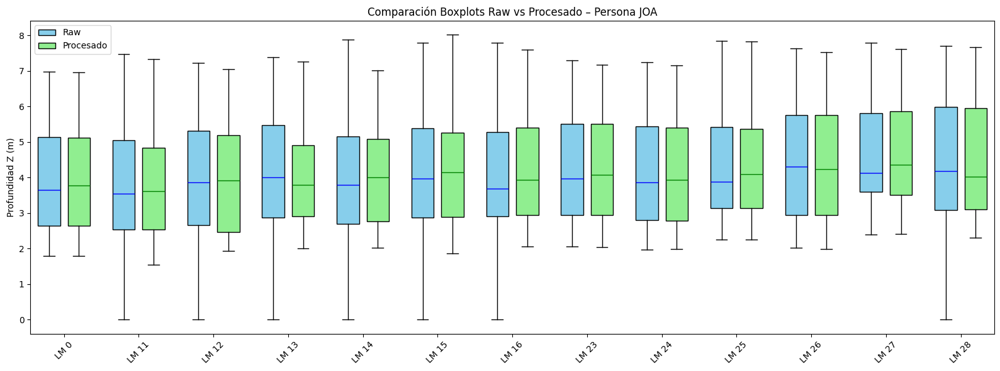


### Estadísticas Raw – Persona JOA ###
LM 0 -> Media: 3.119, Mediana: 2.838, Std: 1.260
LM 11 -> Media: 3.097, Mediana: 2.929, Std: 1.368
LM 12 -> Media: 3.133, Mediana: 2.990, Std: 1.348
LM 13 -> Media: 3.406, Mediana: 3.008, Std: 1.298
LM 14 -> Media: 3.283, Mediana: 2.959, Std: 1.393
LM 15 -> Media: 3.210, Mediana: 2.834, Std: 1.321
LM 16 -> Media: 3.365, Mediana: 3.222, Std: 1.331
LM 23 -> Media: 3.418, Mediana: 3.059, Std: 1.320
LM 24 -> Media: 3.291, Mediana: 2.904, Std: 1.312
LM 25 -> Media: 3.522, Mediana: 3.432, Std: 1.380
LM 26 -> Media: 3.505, Mediana: 3.151, Std: 1.387
LM 27 -> Media: 3.687, Mediana: 3.678, Std: 1.341
LM 28 -> Media: 3.553, Mediana: 3.040, Std: 1.421

### Estadísticas Procesado – Persona JOA ###
LM 0 -> Media: 3.119, Mediana: 2.829, Std: 1.256
LM 11 -> Media: 3.101, Mediana: 2.963, Std: 0.974
LM 12 -> Media: 3.133, Mediana: 2.691, Std: 1.270
LM 13 -> Media: 3.405, Mediana: 3.021, Std: 1.288
LM 14 -> Media: 3.283, Mediana: 2.902, Std: 1.328
LM 15 -> Media: 

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


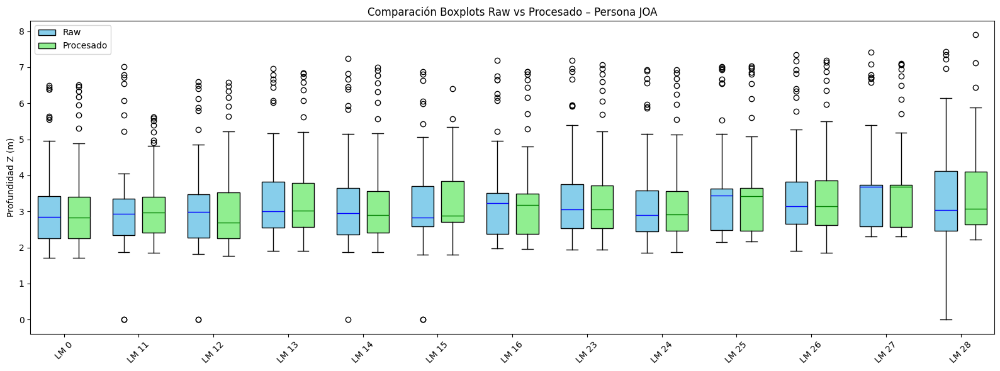


### Estadísticas Raw – Persona JOA ###
LM 0 -> Media: 2.700, Mediana: 2.671, Std: 0.539
LM 11 -> Media: 2.818, Mediana: 2.787, Std: 0.729
LM 12 -> Media: 2.661, Mediana: 2.699, Std: 0.790
LM 13 -> Media: 2.991, Mediana: 2.871, Std: 0.554
LM 14 -> Media: 2.905, Mediana: 2.919, Std: 0.539
LM 15 -> Media: 3.010, Mediana: 2.717, Std: 0.586
LM 16 -> Media: 2.922, Mediana: 3.002, Std: 0.535
LM 23 -> Media: 2.992, Mediana: 2.941, Std: 0.543
LM 24 -> Media: 2.846, Mediana: 2.767, Std: 0.525
LM 25 -> Media: 3.097, Mediana: 3.216, Std: 0.577
LM 26 -> Media: 3.008, Mediana: 2.893, Std: 0.745
LM 27 -> Media: 3.254, Mediana: 3.385, Std: 0.593
LM 28 -> Media: 3.184, Mediana: 3.135, Std: 0.592

### Estadísticas Procesado – Persona JOA ###
LM 0 -> Media: 2.702, Mediana: 2.676, Std: 0.538
LM 11 -> Media: 2.832, Mediana: 2.797, Std: 0.471
LM 12 -> Media: 2.666, Mediana: 2.512, Std: 0.466
LM 13 -> Media: 2.992, Mediana: 2.859, Std: 0.553
LM 14 -> Media: 2.907, Mediana: 2.897, Std: 0.535
LM 15 -> Media: 

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


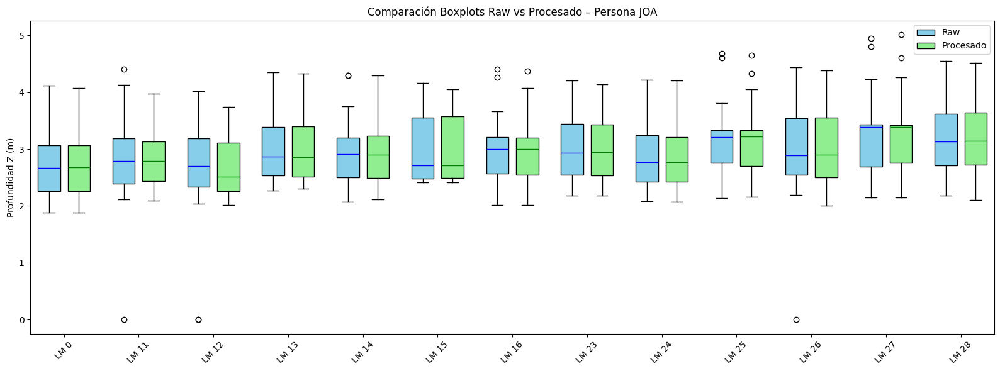


### Estadísticas Raw – Persona JOA ###
LM 0 -> Media: 3.725, Mediana: 3.296, Std: 1.344
LM 11 -> Media: 3.633, Mediana: 3.211, Std: 1.624
LM 12 -> Media: 3.412, Mediana: 3.222, Std: 1.851
LM 13 -> Media: 4.047, Mediana: 3.684, Std: 1.497
LM 14 -> Media: 3.960, Mediana: 3.449, Std: 1.371
LM 15 -> Media: 4.029, Mediana: 3.923, Std: 1.480
LM 16 -> Media: 3.986, Mediana: 3.397, Std: 1.381
LM 23 -> Media: 4.007, Mediana: 3.651, Std: 1.401
LM 24 -> Media: 3.895, Mediana: 3.516, Std: 1.363
LM 25 -> Media: 4.138, Mediana: 3.598, Std: 1.416
LM 26 -> Media: 4.119, Mediana: 3.782, Std: 1.423
LM 27 -> Media: 4.380, Mediana: 3.631, Std: 1.486
LM 28 -> Media: 4.179, Mediana: 3.657, Std: 1.565

### Estadísticas Procesado – Persona JOA ###
LM 0 -> Media: 3.724, Mediana: 3.272, Std: 1.342
LM 11 -> Media: 3.631, Mediana: 3.214, Std: 1.298
LM 12 -> Media: 3.415, Mediana: 2.990, Std: 1.492
LM 13 -> Media: 4.046, Mediana: 3.817, Std: 1.445
LM 14 -> Media: 3.960, Mediana: 3.450, Std: 1.366
LM 15 -> Media: 

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


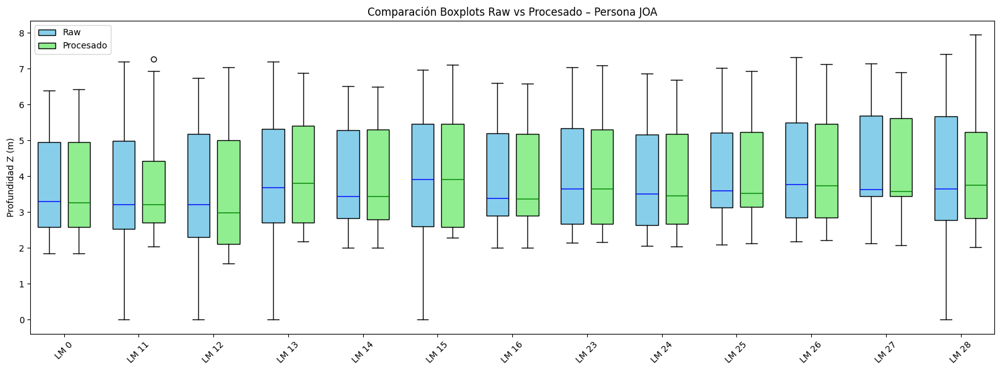


==== Persona: JOS ====

### Estadísticas Raw – Persona JOS ###
LM 0 -> Media: 5.269, Mediana: 4.142, Std: 3.000
LM 11 -> Media: 5.220, Mediana: 4.025, Std: 3.297
LM 12 -> Media: 5.204, Mediana: 4.100, Std: 3.019
LM 13 -> Media: 5.677, Mediana: 4.284, Std: 3.353
LM 14 -> Media: 5.444, Mediana: 4.397, Std: 3.154
LM 15 -> Media: 5.584, Mediana: 4.108, Std: 3.170
LM 16 -> Media: 5.524, Mediana: 4.486, Std: 3.108
LM 23 -> Media: 5.521, Mediana: 4.275, Std: 3.378
LM 24 -> Media: 5.511, Mediana: 4.340, Std: 3.171
LM 25 -> Media: 5.624, Mediana: 4.506, Std: 3.176
LM 26 -> Media: 5.612, Mediana: 4.397, Std: 3.121
LM 27 -> Media: 5.593, Mediana: 4.868, Std: 2.959
LM 28 -> Media: 5.640, Mediana: 4.378, Std: 2.996

### Estadísticas Procesado – Persona JOS ###
LM 0 -> Media: 5.268, Mediana: 4.132, Std: 2.992
LM 11 -> Media: 5.223, Mediana: 3.881, Std: 3.097
LM 12 -> Media: 5.205, Mediana: 4.302, Std: 2.774
LM 13 -> Media: 5.682, Mediana: 4.284, Std: 3.334
LM 14 -> Media: 5.443, Mediana: 4.369, Std

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


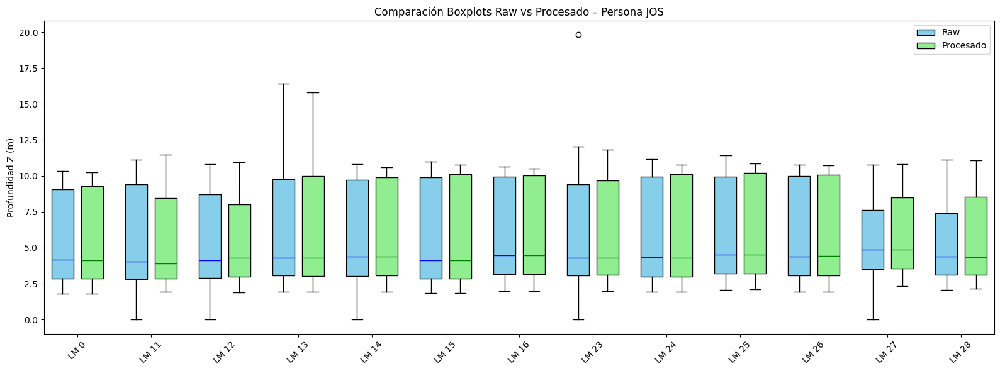


### Estadísticas Raw – Persona JOS ###
LM 0 -> Media: 5.138, Mediana: 4.360, Std: 2.838
LM 11 -> Media: 5.182, Mediana: 4.076, Std: 3.957
LM 12 -> Media: 5.203, Mediana: 4.321, Std: 2.797
LM 13 -> Media: 5.408, Mediana: 4.355, Std: 2.943
LM 14 -> Media: 5.248, Mediana: 4.181, Std: 2.876
LM 15 -> Media: 5.398, Mediana: 4.387, Std: 2.931
LM 16 -> Media: 5.280, Mediana: 4.217, Std: 2.850
LM 23 -> Media: 5.966, Mediana: 4.266, Std: 4.403
LM 24 -> Media: 5.516, Mediana: 4.155, Std: 3.535
LM 25 -> Media: 5.412, Mediana: 4.364, Std: 2.906
LM 26 -> Media: 5.388, Mediana: 4.345, Std: 2.905
LM 27 -> Media: 5.327, Mediana: 4.350, Std: 2.936
LM 28 -> Media: 5.205, Mediana: 4.653, Std: 2.453

### Estadísticas Procesado – Persona JOS ###
LM 0 -> Media: 5.136, Mediana: 4.362, Std: 2.824
LM 11 -> Media: 5.182, Mediana: 4.090, Std: 2.934
LM 12 -> Media: 5.202, Mediana: 4.295, Std: 2.783
LM 13 -> Media: 5.410, Mediana: 4.377, Std: 2.905
LM 14 -> Media: 5.244, Mediana: 4.255, Std: 2.855
LM 15 -> Media: 

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


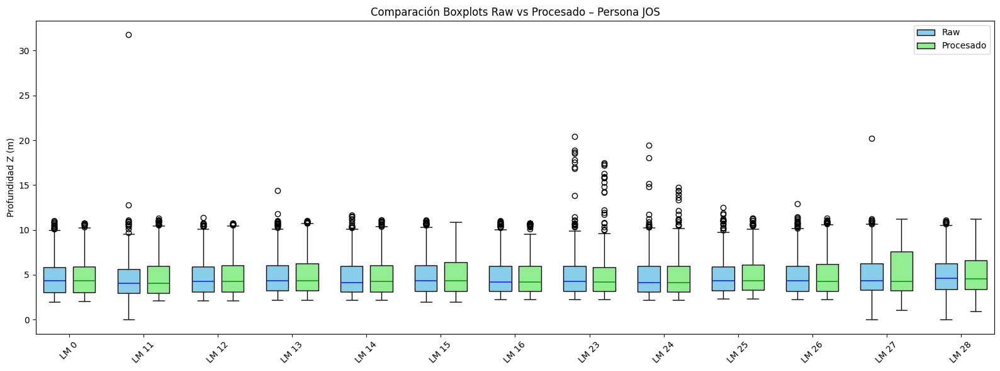


### Estadísticas Raw – Persona JOS ###
LM 0 -> Media: 4.780, Mediana: 3.851, Std: 2.804
LM 11 -> Media: 5.088, Mediana: 3.977, Std: 3.038
LM 12 -> Media: 4.985, Mediana: 3.942, Std: 2.914
LM 13 -> Media: 5.055, Mediana: 4.143, Std: 2.918
LM 14 -> Media: 5.123, Mediana: 3.994, Std: 2.995
LM 15 -> Media: 5.214, Mediana: 4.217, Std: 3.061
LM 16 -> Media: 5.196, Mediana: 3.985, Std: 3.029
LM 23 -> Media: 5.300, Mediana: 4.058, Std: 3.383
LM 24 -> Media: 4.912, Mediana: 3.981, Std: 2.956
LM 25 -> Media: 5.131, Mediana: 4.034, Std: 3.162
LM 26 -> Media: 5.251, Mediana: 4.208, Std: 3.353
LM 27 -> Media: 5.213, Mediana: 4.258, Std: 2.769
LM 28 -> Media: 5.158, Mediana: 4.432, Std: 2.853

### Estadísticas Procesado – Persona JOS ###
LM 0 -> Media: 4.766, Mediana: 3.883, Std: 2.676
LM 11 -> Media: 5.091, Mediana: 3.978, Std: 3.024
LM 12 -> Media: 4.983, Mediana: 3.728, Std: 2.862
LM 13 -> Media: 5.040, Mediana: 4.172, Std: 2.786
LM 14 -> Media: 5.123, Mediana: 3.981, Std: 2.983
LM 15 -> Media: 

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


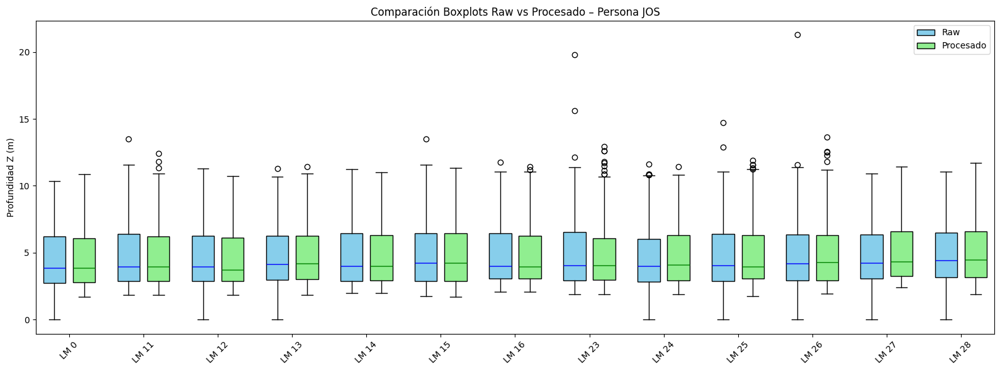


### Estadísticas Raw – Persona JOS ###
LM 0 -> Media: 5.935, Mediana: 5.014, Std: 2.844
LM 11 -> Media: 6.138, Mediana: 4.989, Std: 3.071
LM 12 -> Media: 5.933, Mediana: 5.014, Std: 3.073
LM 13 -> Media: 6.320, Mediana: 5.143, Std: 3.047
LM 14 -> Media: 6.213, Mediana: 5.196, Std: 3.010
LM 15 -> Media: 6.353, Mediana: 5.156, Std: 3.136
LM 16 -> Media: 6.305, Mediana: 5.251, Std: 3.128
LM 23 -> Media: 6.339, Mediana: 4.977, Std: 3.447
LM 24 -> Media: 6.226, Mediana: 5.156, Std: 3.004
LM 25 -> Media: 6.442, Mediana: 5.378, Std: 3.113
LM 26 -> Media: 6.325, Mediana: 5.251, Std: 3.099
LM 27 -> Media: 6.223, Mediana: 5.542, Std: 2.891
LM 28 -> Media: 6.297, Mediana: 5.511, Std: 2.882

### Estadísticas Procesado – Persona JOS ###
LM 0 -> Media: 5.935, Mediana: 4.967, Std: 2.840
LM 11 -> Media: 6.138, Mediana: 4.518, Std: 3.031
LM 12 -> Media: 5.933, Mediana: 4.954, Std: 2.865
LM 13 -> Media: 6.316, Mediana: 5.217, Std: 3.014
LM 14 -> Media: 6.213, Mediana: 5.166, Std: 2.995
LM 15 -> Media: 

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


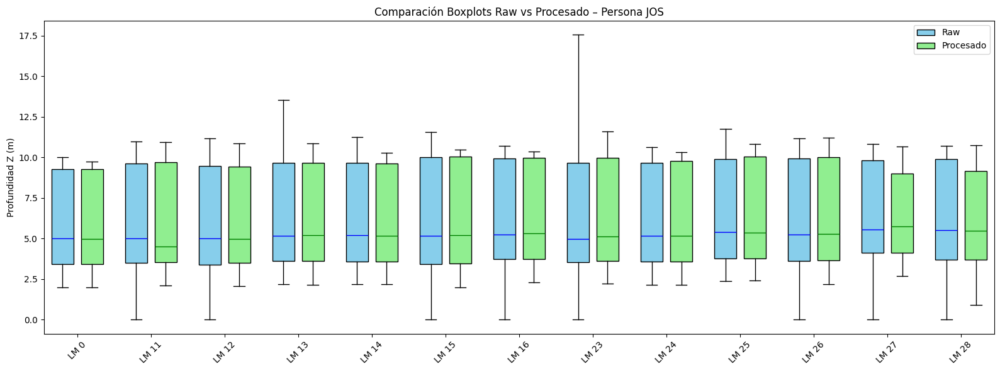


==== Persona: MAR ====

### Estadísticas Raw – Persona MAR ###
LM 0 -> Media: 2.869, Mediana: 2.682, Std: 1.129
LM 11 -> Media: 2.844, Mediana: 2.707, Std: 1.357
LM 12 -> Media: 2.989, Mediana: 2.782, Std: 1.142
LM 13 -> Media: 3.184, Mediana: 2.879, Std: 1.584
LM 14 -> Media: 2.853, Mediana: 2.814, Std: 0.790
LM 15 -> Media: 3.131, Mediana: 2.908, Std: 1.195
LM 16 -> Media: 3.083, Mediana: 2.850, Std: 1.274
LM 23 -> Media: 2.982, Mediana: 2.846, Std: 1.308
LM 24 -> Media: 3.051, Mediana: 2.814, Std: 1.256
LM 25 -> Media: 3.229, Mediana: 2.929, Std: 1.152
LM 26 -> Media: 3.176, Mediana: 3.036, Std: 1.269
LM 27 -> Media: 3.386, Mediana: 3.107, Std: 1.212
LM 28 -> Media: 3.187, Mediana: 3.206, Std: 1.327

### Estadísticas Procesado – Persona MAR ###
LM 0 -> Media: 2.884, Mediana: 2.686, Std: 1.033
LM 11 -> Media: 2.851, Mediana: 2.616, Std: 1.127
LM 12 -> Media: 3.004, Mediana: 2.772, Std: 1.046
LM 13 -> Media: 3.210, Mediana: 2.894, Std: 1.372
LM 14 -> Media: 2.838, Mediana: 2.757, Std

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


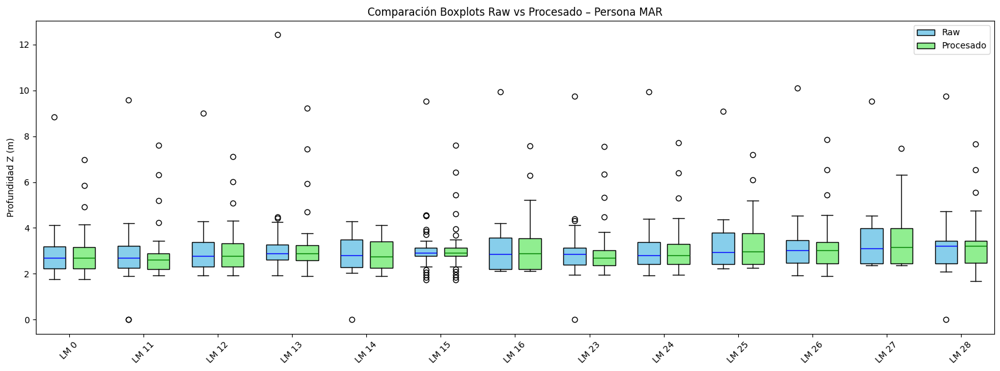


### Estadísticas Raw – Persona MAR ###
LM 0 -> Media: 2.400, Mediana: 2.375, Std: 0.425
LM 11 -> Media: 2.546, Mediana: 2.515, Std: 0.419
LM 12 -> Media: 2.509, Mediana: 2.468, Std: 0.429
LM 13 -> Media: 2.632, Mediana: 2.664, Std: 0.371
LM 14 -> Media: 2.546, Mediana: 2.527, Std: 0.660
LM 15 -> Media: 2.643, Mediana: 2.735, Std: 0.328
LM 16 -> Media: 2.604, Mediana: 2.453, Std: 0.536
LM 23 -> Media: 2.555, Mediana: 2.624, Std: 0.376
LM 24 -> Media: 2.546, Mediana: 2.557, Std: 0.420
LM 25 -> Media: 2.752, Mediana: 2.568, Std: 0.547
LM 26 -> Media: 2.674, Mediana: 2.749, Std: 0.430
LM 27 -> Media: 2.648, Mediana: 2.673, Std: 1.035
LM 28 -> Media: 2.654, Mediana: 2.982, Std: 0.647

### Estadísticas Procesado – Persona MAR ###
LM 0 -> Media: 2.400, Mediana: 2.375, Std: 0.425
LM 11 -> Media: 2.546, Mediana: 2.524, Std: 0.418
LM 12 -> Media: 2.509, Mediana: 2.469, Std: 0.429
LM 13 -> Media: 2.632, Mediana: 2.663, Std: 0.371
LM 14 -> Media: 2.553, Mediana: 2.528, Std: 0.566
LM 15 -> Media: 

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


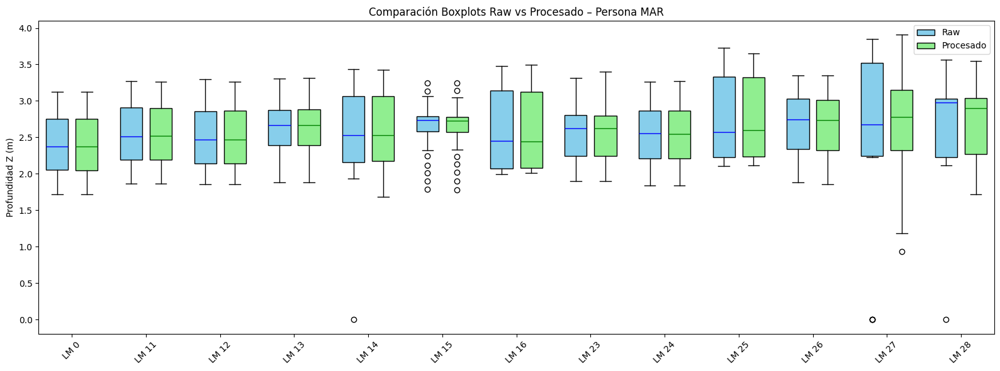


### Estadísticas Raw – Persona MAR ###
LM 0 -> Media: 3.571, Mediana: 2.686, Std: 2.417
LM 11 -> Media: 3.734, Mediana: 2.836, Std: 2.469
LM 12 -> Media: 3.531, Mediana: 2.774, Std: 2.397
LM 13 -> Media: 3.693, Mediana: 2.852, Std: 2.493
LM 14 -> Media: 3.613, Mediana: 2.890, Std: 2.348
LM 15 -> Media: 3.729, Mediana: 2.848, Std: 2.556
LM 16 -> Media: 3.876, Mediana: 3.020, Std: 2.596
LM 23 -> Media: 3.934, Mediana: 2.822, Std: 3.192
LM 24 -> Media: 3.845, Mediana: 2.826, Std: 2.731
LM 25 -> Media: 3.947, Mediana: 3.157, Std: 2.439
LM 26 -> Media: 3.834, Mediana: 3.013, Std: 2.386
LM 27 -> Media: 4.084, Mediana: 3.257, Std: 2.481
LM 28 -> Media: 3.850, Mediana: 3.131, Std: 2.589

### Estadísticas Procesado – Persona MAR ###
LM 0 -> Media: 3.571, Mediana: 2.698, Std: 2.365
LM 11 -> Media: 3.735, Mediana: 2.833, Std: 2.417
LM 12 -> Media: 3.512, Mediana: 2.831, Std: 2.179
LM 13 -> Media: 3.713, Mediana: 2.888, Std: 2.112
LM 14 -> Media: 3.639, Mediana: 2.964, Std: 1.982
LM 15 -> Media: 

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


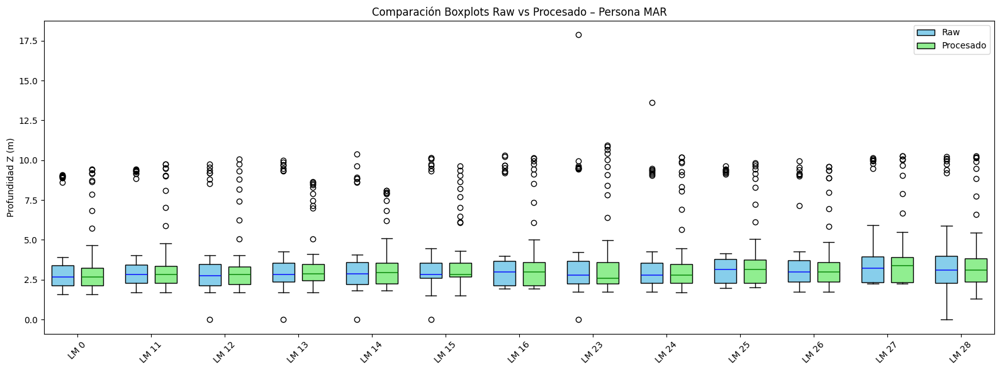


### Estadísticas Raw – Persona MAR ###
LM 0 -> Media: 2.817, Mediana: 2.588, Std: 0.901
LM 11 -> Media: 2.948, Mediana: 2.737, Std: 0.880
LM 12 -> Media: 2.956, Mediana: 2.711, Std: 0.942
LM 13 -> Media: 3.012, Mediana: 2.834, Std: 1.020
LM 14 -> Media: 3.045, Mediana: 2.775, Std: 0.914
LM 15 -> Media: 3.110, Mediana: 2.846, Std: 0.990
LM 16 -> Media: 3.034, Mediana: 2.782, Std: 0.911
LM 23 -> Media: 2.992, Mediana: 2.779, Std: 0.906
LM 24 -> Media: 2.972, Mediana: 2.682, Std: 0.896
LM 25 -> Media: 3.175, Mediana: 2.887, Std: 0.946
LM 26 -> Media: 3.116, Mediana: 2.916, Std: 0.957
LM 27 -> Media: 3.328, Mediana: 3.045, Std: 0.998
LM 28 -> Media: 3.203, Mediana: 3.083, Std: 0.987

### Estadísticas Procesado – Persona MAR ###
LM 0 -> Media: 2.821, Mediana: 2.579, Std: 0.898
LM 11 -> Media: 2.952, Mediana: 2.735, Std: 0.877
LM 12 -> Media: 2.959, Mediana: 2.699, Std: 0.937
LM 13 -> Media: 3.016, Mediana: 2.855, Std: 0.959
LM 14 -> Media: 3.047, Mediana: 2.781, Std: 0.912
LM 15 -> Media: 

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


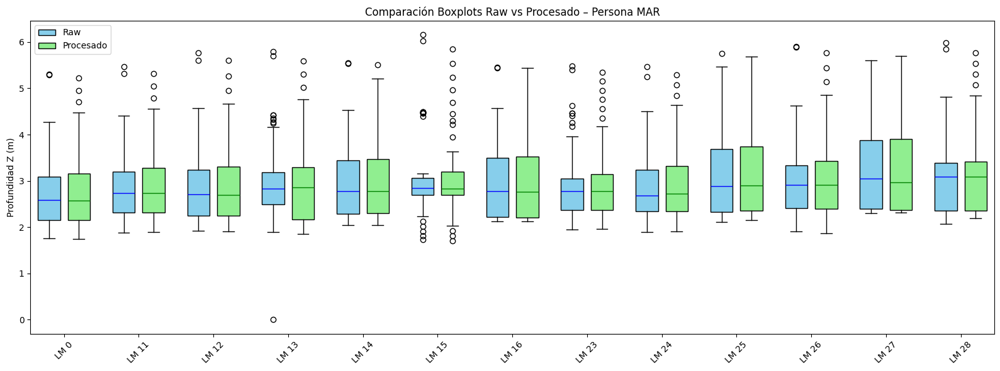


==== Persona: MIN ====

### Estadísticas Raw – Persona MIN ###
LM 0 -> Media: 2.716, Mediana: 2.691, Std: 0.502
LM 11 -> Media: 2.867, Mediana: 2.820, Std: 0.508
LM 12 -> Media: 2.845, Mediana: 2.824, Std: 0.517
LM 13 -> Media: 2.921, Mediana: 2.875, Std: 0.498
LM 14 -> Media: 2.908, Mediana: 2.908, Std: 0.524
LM 15 -> Media: 2.777, Mediana: 2.820, Std: 0.833
LM 16 -> Media: 2.900, Mediana: 2.925, Std: 0.530
LM 23 -> Media: 2.923, Mediana: 2.887, Std: 0.512
LM 24 -> Media: 2.801, Mediana: 2.814, Std: 0.629
LM 25 -> Media: 3.004, Mediana: 2.921, Std: 0.526
LM 26 -> Media: 2.966, Mediana: 2.875, Std: 0.522
LM 27 -> Media: 2.946, Mediana: 3.071, Std: 0.883
LM 28 -> Media: 2.978, Mediana: 3.073, Std: 0.634

### Estadísticas Procesado – Persona MIN ###
LM 0 -> Media: 2.716, Mediana: 2.690, Std: 0.502
LM 11 -> Media: 2.867, Mediana: 2.824, Std: 0.507
LM 12 -> Media: 2.845, Mediana: 2.834, Std: 0.516
LM 13 -> Media: 2.921, Mediana: 2.873, Std: 0.497
LM 14 -> Media: 2.908, Mediana: 2.920, Std

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


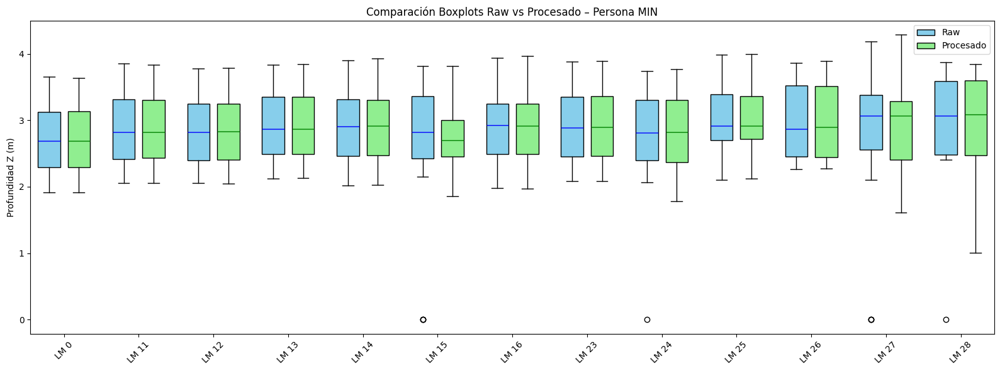


### Estadísticas Raw – Persona MIN ###
LM 0 -> Media: 2.838, Mediana: 2.764, Std: 0.656
LM 11 -> Media: 2.974, Mediana: 2.900, Std: 0.649
LM 12 -> Media: 2.969, Mediana: 2.917, Std: 0.622
LM 13 -> Media: 3.045, Mediana: 2.960, Std: 0.649
LM 14 -> Media: 3.049, Mediana: 2.982, Std: 0.646
LM 15 -> Media: 2.844, Mediana: 2.962, Std: 1.061
LM 16 -> Media: 3.033, Mediana: 3.000, Std: 0.636
LM 23 -> Media: 3.069, Mediana: 2.955, Std: 0.637
LM 24 -> Media: 2.986, Mediana: 2.873, Std: 0.648
LM 25 -> Media: 3.102, Mediana: 3.090, Std: 0.657
LM 26 -> Media: 3.077, Mediana: 2.978, Std: 0.786
LM 27 -> Media: 3.086, Mediana: 3.222, Std: 0.924
LM 28 -> Media: 3.151, Mediana: 3.039, Std: 0.666

### Estadísticas Procesado – Persona MIN ###
LM 0 -> Media: 2.845, Mediana: 2.757, Std: 0.622
LM 11 -> Media: 2.980, Mediana: 2.907, Std: 0.619
LM 12 -> Media: 2.974, Mediana: 2.911, Std: 0.599
LM 13 -> Media: 3.051, Mediana: 2.973, Std: 0.620
LM 14 -> Media: 3.055, Mediana: 2.989, Std: 0.617
LM 15 -> Media: 

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


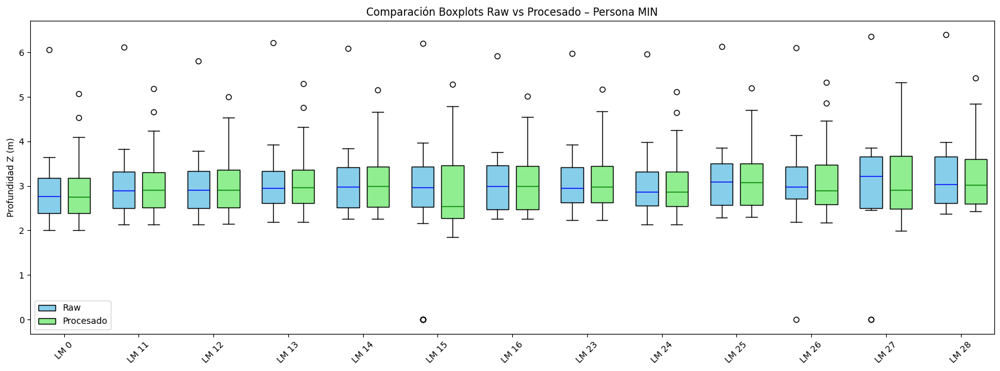


### Estadísticas Raw – Persona MIN ###
LM 0 -> Media: 2.802, Mediana: 2.797, Std: 0.475
LM 11 -> Media: 2.941, Mediana: 2.937, Std: 0.477
LM 12 -> Media: 2.926, Mediana: 2.908, Std: 0.476
LM 13 -> Media: 3.017, Mediana: 3.007, Std: 0.482
LM 14 -> Media: 2.996, Mediana: 3.060, Std: 0.487
LM 15 -> Media: 2.892, Mediana: 2.971, Std: 0.889
LM 16 -> Media: 2.961, Mediana: 2.982, Std: 0.474
LM 23 -> Media: 3.053, Mediana: 3.081, Std: 0.501
LM 24 -> Media: 2.954, Mediana: 2.883, Std: 0.496
LM 25 -> Media: 3.074, Mediana: 3.161, Std: 0.492
LM 26 -> Media: 3.095, Mediana: 3.022, Std: 0.487
LM 27 -> Media: 3.109, Mediana: 3.420, Std: 0.686
LM 28 -> Media: 3.084, Mediana: 2.936, Std: 0.660

### Estadísticas Procesado – Persona MIN ###
LM 0 -> Media: 2.802, Mediana: 2.792, Std: 0.475
LM 11 -> Media: 2.941, Mediana: 2.937, Std: 0.477
LM 12 -> Media: 2.926, Mediana: 2.921, Std: 0.476
LM 13 -> Media: 3.017, Mediana: 2.997, Std: 0.481
LM 14 -> Media: 2.997, Mediana: 3.054, Std: 0.487
LM 15 -> Media: 

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


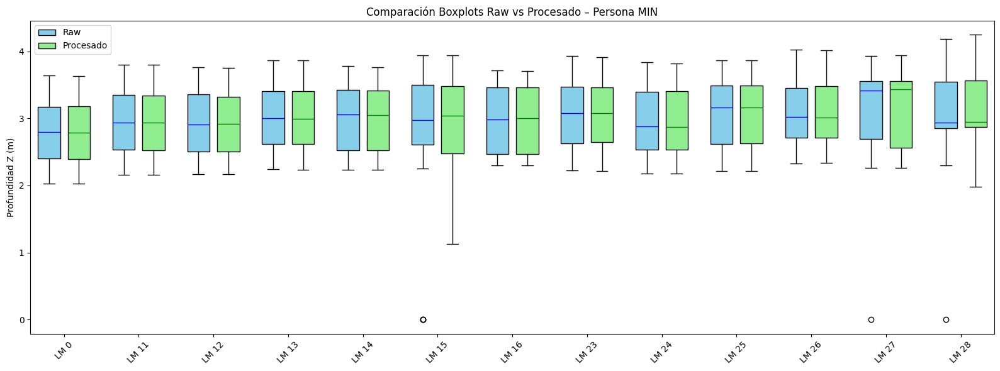


### Estadísticas Raw – Persona MIN ###
LM 0 -> Media: 2.773, Mediana: 2.760, Std: 0.771
LM 11 -> Media: 2.976, Mediana: 2.902, Std: 0.668
LM 12 -> Media: 2.952, Mediana: 2.898, Std: 0.665
LM 13 -> Media: 3.035, Mediana: 2.984, Std: 0.696
LM 14 -> Media: 3.040, Mediana: 2.908, Std: 0.685
LM 15 -> Media: 3.012, Mediana: 2.991, Std: 0.833
LM 16 -> Media: 3.037, Mediana: 2.900, Std: 0.674
LM 23 -> Media: 3.069, Mediana: 3.002, Std: 0.707
LM 24 -> Media: 2.971, Mediana: 2.914, Std: 0.707
LM 25 -> Media: 3.120, Mediana: 2.980, Std: 0.707
LM 26 -> Media: 3.080, Mediana: 3.102, Std: 0.686
LM 27 -> Media: 3.036, Mediana: 2.946, Std: 1.000
LM 28 -> Media: 3.082, Mediana: 3.186, Std: 0.813

### Estadísticas Procesado – Persona MIN ###
LM 0 -> Media: 2.779, Mediana: 2.791, Std: 0.684
LM 11 -> Media: 2.981, Mediana: 2.919, Std: 0.646
LM 12 -> Media: 2.958, Mediana: 2.895, Std: 0.645
LM 13 -> Media: 3.042, Mediana: 2.993, Std: 0.667
LM 14 -> Media: 3.045, Mediana: 2.915, Std: 0.658
LM 15 -> Media: 

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


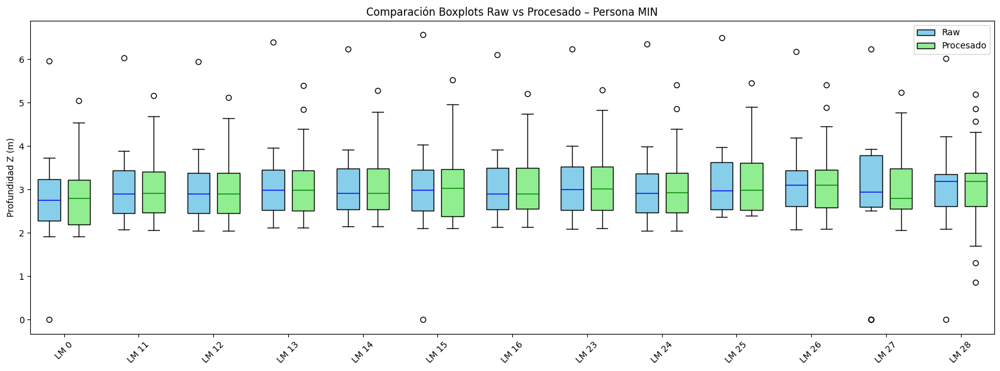


==== Persona: NOR ====

### Estadísticas Raw – Persona NOR ###
LM 0 -> Media: 3.591, Mediana: 3.310, Std: 1.569
LM 11 -> Media: 3.580, Mediana: 3.409, Std: 1.629
LM 12 -> Media: 3.683, Mediana: 3.423, Std: 1.502
LM 13 -> Media: 3.852, Mediana: 3.675, Std: 1.674
LM 14 -> Media: 3.764, Mediana: 3.397, Std: 1.595
LM 15 -> Media: 3.870, Mediana: 3.800, Std: 1.637
LM 16 -> Media: 3.770, Mediana: 3.346, Std: 1.597
LM 23 -> Media: 3.804, Mediana: 3.598, Std: 1.563
LM 24 -> Media: 3.669, Mediana: 3.470, Std: 1.519
LM 25 -> Media: 3.891, Mediana: 3.483, Std: 1.684
LM 26 -> Media: 3.940, Mediana: 3.751, Std: 1.593
LM 27 -> Media: 3.972, Mediana: 3.664, Std: 1.945
LM 28 -> Media: 4.062, Mediana: 3.736, Std: 1.703

### Estadísticas Procesado – Persona NOR ###
LM 0 -> Media: 3.589, Mediana: 3.316, Std: 1.556
LM 11 -> Media: 3.577, Mediana: 3.325, Std: 1.397
LM 12 -> Media: 3.680, Mediana: 3.414, Std: 1.486
LM 13 -> Media: 3.849, Mediana: 3.339, Std: 1.623
LM 14 -> Media: 3.762, Mediana: 3.410, Std

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


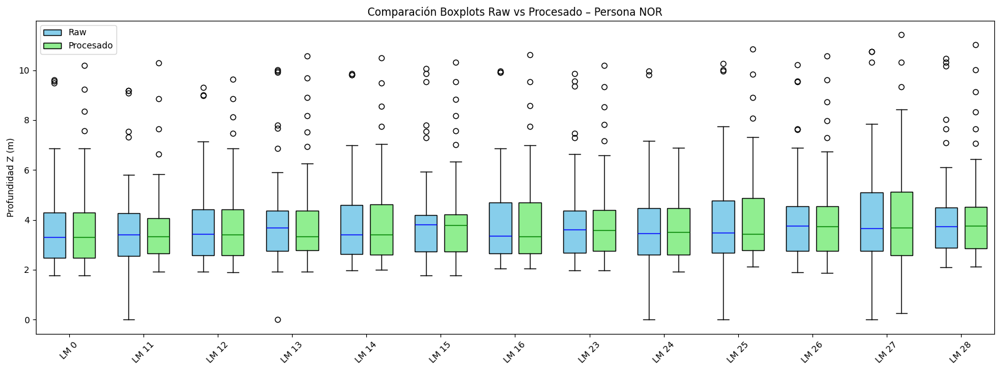


### Estadísticas Raw – Persona NOR ###
LM 0 -> Media: 3.847, Mediana: 3.391, Std: 1.968
LM 11 -> Media: 4.007, Mediana: 3.569, Std: 2.017
LM 12 -> Media: 3.924, Mediana: 3.456, Std: 2.014
LM 13 -> Media: 4.015, Mediana: 3.764, Std: 1.902
LM 14 -> Media: 4.007, Mediana: 3.435, Std: 1.951
LM 15 -> Media: 4.116, Mediana: 3.946, Std: 1.998
LM 16 -> Media: 4.023, Mediana: 3.343, Std: 2.001
LM 23 -> Media: 4.029, Mediana: 3.709, Std: 1.988
LM 24 -> Media: 4.030, Mediana: 3.599, Std: 1.987
LM 25 -> Media: 4.164, Mediana: 3.695, Std: 2.090
LM 26 -> Media: 4.209, Mediana: 3.815, Std: 2.011
LM 27 -> Media: 4.321, Mediana: 3.602, Std: 2.120
LM 28 -> Media: 4.225, Mediana: 3.919, Std: 2.077

### Estadísticas Procesado – Persona NOR ###
LM 0 -> Media: 3.852, Mediana: 3.384, Std: 1.955
LM 11 -> Media: 4.011, Mediana: 3.572, Std: 2.001
LM 12 -> Media: 3.927, Mediana: 3.300, Std: 1.965
LM 13 -> Media: 4.009, Mediana: 3.797, Std: 1.742
LM 14 -> Media: 4.012, Mediana: 3.437, Std: 1.940
LM 15 -> Media: 

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


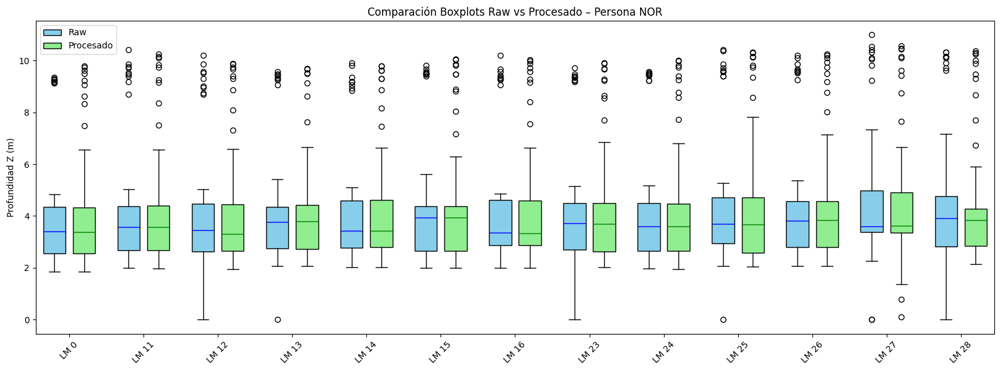


### Estadísticas Raw – Persona NOR ###
LM 0 -> Media: 4.821, Mediana: 3.782, Std: 2.749
LM 11 -> Media: 4.793, Mediana: 3.719, Std: 3.221
LM 12 -> Media: 5.089, Mediana: 3.866, Std: 3.053
LM 13 -> Media: 5.061, Mediana: 4.151, Std: 2.720
LM 14 -> Media: 4.804, Mediana: 3.786, Std: 2.792
LM 15 -> Media: 5.068, Mediana: 4.331, Std: 2.780
LM 16 -> Media: 4.785, Mediana: 3.671, Std: 2.846
LM 23 -> Media: 5.020, Mediana: 4.034, Std: 2.762
LM 24 -> Media: 5.005, Mediana: 4.013, Std: 2.772
LM 25 -> Media: 5.182, Mediana: 4.050, Std: 2.788
LM 26 -> Media: 5.179, Mediana: 4.165, Std: 2.814
LM 27 -> Media: 5.275, Mediana: 4.054, Std: 2.620
LM 28 -> Media: 5.129, Mediana: 4.164, Std: 2.712

### Estadísticas Procesado – Persona NOR ###
LM 0 -> Media: 4.821, Mediana: 3.783, Std: 2.737
LM 11 -> Media: 4.781, Mediana: 3.389, Std: 2.998
LM 12 -> Media: 5.090, Mediana: 3.909, Std: 3.010
LM 13 -> Media: 5.062, Mediana: 4.148, Std: 2.703
LM 14 -> Media: 4.804, Mediana: 3.860, Std: 2.442
LM 15 -> Media: 

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


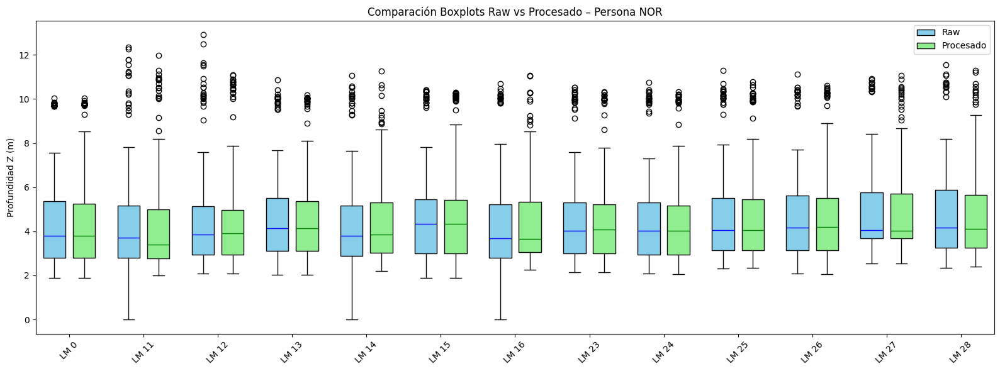


### Estadísticas Raw – Persona NOR ###
LM 0 -> Media: 2.893, Mediana: 2.858, Std: 0.632
LM 11 -> Media: 2.987, Mediana: 2.959, Std: 0.746
LM 12 -> Media: 3.010, Mediana: 3.004, Std: 0.634
LM 13 -> Media: 3.176, Mediana: 3.031, Std: 0.634
LM 14 -> Media: 3.050, Mediana: 3.097, Std: 0.663
LM 15 -> Media: 3.177, Mediana: 2.955, Std: 0.695
LM 16 -> Media: 3.029, Mediana: 3.211, Std: 0.666
LM 23 -> Media: 3.093, Mediana: 2.925, Std: 0.638
LM 24 -> Media: 3.067, Mediana: 2.946, Std: 0.645
LM 25 -> Media: 3.232, Mediana: 3.408, Std: 0.666
LM 26 -> Media: 3.218, Mediana: 3.146, Std: 0.682
LM 27 -> Media: 3.458, Mediana: 3.862, Std: 0.703
LM 28 -> Media: 3.281, Mediana: 3.206, Std: 0.686

### Estadísticas Procesado – Persona NOR ###
LM 0 -> Media: 2.893, Mediana: 2.859, Std: 0.632
LM 11 -> Media: 2.987, Mediana: 2.934, Std: 0.650
LM 12 -> Media: 3.010, Mediana: 3.013, Std: 0.632
LM 13 -> Media: 3.176, Mediana: 3.023, Std: 0.633
LM 14 -> Media: 3.050, Mediana: 3.091, Std: 0.661
LM 15 -> Media: 

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


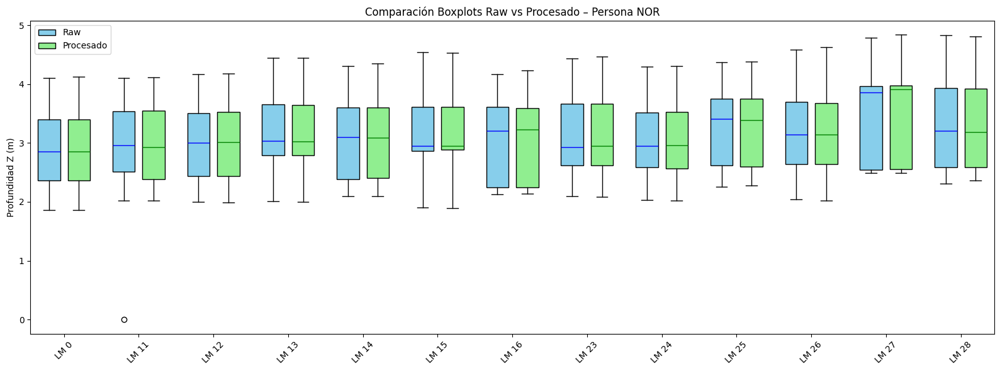


==== Persona: TON ====

### Estadísticas Raw – Persona TON ###
LM 0 -> Media: 5.499, Mediana: 5.137, Std: 2.490
LM 11 -> Media: 5.365, Mediana: 4.916, Std: 2.699
LM 12 -> Media: 5.485, Mediana: 5.066, Std: 2.549
LM 13 -> Media: 5.974, Mediana: 5.286, Std: 3.419
LM 14 -> Media: 5.693, Mediana: 5.072, Std: 2.932
LM 15 -> Media: 5.681, Mediana: 5.534, Std: 2.612
LM 16 -> Media: 5.599, Mediana: 4.952, Std: 2.604
LM 23 -> Media: 5.669, Mediana: 5.314, Std: 2.485
LM 24 -> Media: 5.494, Mediana: 5.079, Std: 2.641
LM 25 -> Media: 5.940, Mediana: 5.392, Std: 2.643
LM 26 -> Media: 5.842, Mediana: 5.409, Std: 2.646
LM 27 -> Media: 5.985, Mediana: 5.392, Std: 2.590
LM 28 -> Media: 5.879, Mediana: 5.604, Std: 2.525

### Estadísticas Procesado – Persona TON ###
LM 0 -> Media: 5.500, Mediana: 5.117, Std: 2.482
LM 11 -> Media: 5.370, Mediana: 4.858, Std: 2.352
LM 12 -> Media: 5.486, Mediana: 4.985, Std: 2.500
LM 13 -> Media: 5.984, Mediana: 5.283, Std: 3.356
LM 14 -> Media: 5.708, Mediana: 5.060, Std

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


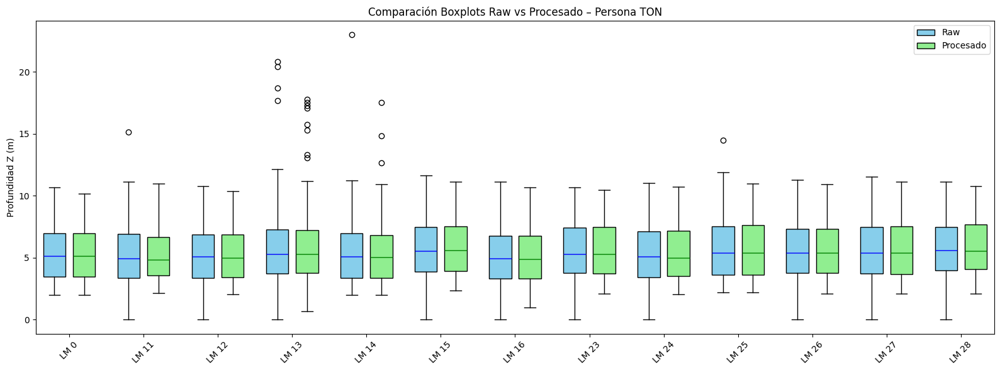


### Estadísticas Raw – Persona TON ###
LM 0 -> Media: 4.090, Mediana: 3.923, Std: 1.473
LM 11 -> Media: 4.136, Mediana: 3.993, Std: 1.431
LM 12 -> Media: 4.140, Mediana: 3.938, Std: 1.475
LM 13 -> Media: 4.310, Mediana: 4.194, Std: 1.402
LM 14 -> Media: 4.129, Mediana: 3.877, Std: 1.601
LM 15 -> Media: 4.314, Mediana: 4.436, Std: 1.452
LM 16 -> Media: 4.190, Mediana: 3.825, Std: 1.706
LM 23 -> Media: 4.268, Mediana: 4.168, Std: 1.462
LM 24 -> Media: 4.137, Mediana: 4.033, Std: 1.441
LM 25 -> Media: 4.426, Mediana: 4.091, Std: 1.624
LM 26 -> Media: 4.296, Mediana: 4.108, Std: 1.555
LM 27 -> Media: 4.643, Mediana: 4.248, Std: 1.541
LM 28 -> Media: 4.528, Mediana: 4.248, Std: 1.653

### Estadísticas Procesado – Persona TON ###
LM 0 -> Media: 4.096, Mediana: 3.934, Std: 1.463
LM 11 -> Media: 4.142, Mediana: 3.985, Std: 1.419
LM 12 -> Media: 4.145, Mediana: 3.995, Std: 1.465
LM 13 -> Media: 4.314, Mediana: 4.237, Std: 1.395
LM 14 -> Media: 4.132, Mediana: 3.939, Std: 1.450
LM 15 -> Media: 

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


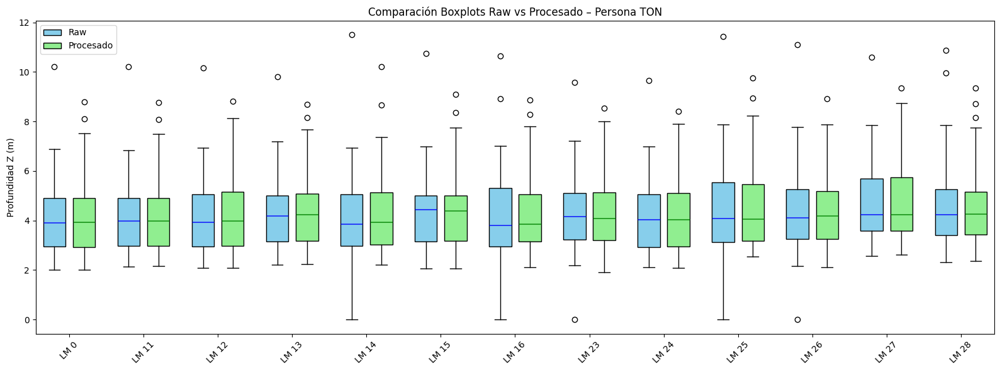


### Estadísticas Raw – Persona TON ###
LM 0 -> Media: 5.189, Mediana: 4.427, Std: 2.714
LM 11 -> Media: 5.309, Mediana: 4.516, Std: 2.674
LM 12 -> Media: 5.248, Mediana: 4.461, Std: 2.617
LM 13 -> Media: 5.567, Mediana: 4.685, Std: 2.952
LM 14 -> Media: 5.456, Mediana: 4.517, Std: 2.967
LM 15 -> Media: 5.455, Mediana: 4.815, Std: 2.583
LM 16 -> Media: 5.372, Mediana: 4.502, Std: 2.906
LM 23 -> Media: 5.417, Mediana: 4.664, Std: 2.608
LM 24 -> Media: 5.172, Mediana: 4.451, Std: 2.744
LM 25 -> Media: 5.579, Mediana: 4.719, Std: 2.658
LM 26 -> Media: 5.515, Mediana: 4.781, Std: 2.663
LM 27 -> Media: 5.789, Mediana: 4.910, Std: 2.833
LM 28 -> Media: 5.679, Mediana: 5.046, Std: 2.817

### Estadísticas Procesado – Persona TON ###
LM 0 -> Media: 5.190, Mediana: 4.463, Std: 2.576
LM 11 -> Media: 5.307, Mediana: 4.501, Std: 2.658
LM 12 -> Media: 5.249, Mediana: 4.467, Std: 2.611
LM 13 -> Media: 5.559, Mediana: 4.698, Std: 2.860
LM 14 -> Media: 5.449, Mediana: 4.544, Std: 2.869
LM 15 -> Media: 

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


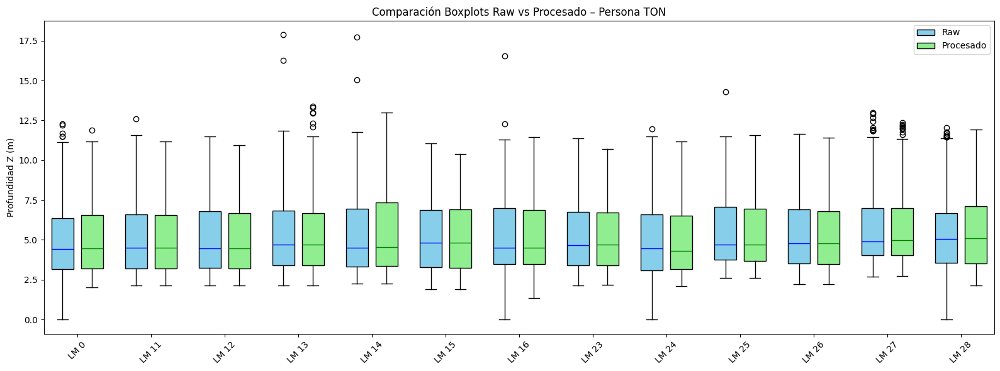


### Estadísticas Raw – Persona TON ###
LM 0 -> Media: 6.249, Mediana: 6.156, Std: 2.650
LM 11 -> Media: 6.396, Mediana: 6.194, Std: 2.770
LM 12 -> Media: 6.318, Mediana: 6.081, Std: 2.689
LM 13 -> Media: 6.484, Mediana: 6.392, Std: 2.750
LM 14 -> Media: 6.509, Mediana: 5.954, Std: 3.188
LM 15 -> Media: 6.496, Mediana: 6.517, Std: 2.802
LM 16 -> Media: 6.368, Mediana: 6.156, Std: 2.680
LM 23 -> Media: 6.499, Mediana: 6.311, Std: 2.653
LM 24 -> Media: 6.362, Mediana: 6.175, Std: 2.685
LM 25 -> Media: 6.776, Mediana: 6.782, Std: 2.792
LM 26 -> Media: 6.499, Mediana: 6.603, Std: 2.738
LM 27 -> Media: 6.825, Mediana: 6.559, Std: 2.878
LM 28 -> Media: 6.771, Mediana: 6.669, Std: 2.869

### Estadísticas Procesado – Persona TON ###
LM 0 -> Media: 6.249, Mediana: 6.158, Std: 2.641
LM 11 -> Media: 6.395, Mediana: 6.190, Std: 2.759
LM 12 -> Media: 6.318, Mediana: 6.070, Std: 2.680
LM 13 -> Media: 6.483, Mediana: 6.424, Std: 2.655
LM 14 -> Media: 6.507, Mediana: 6.004, Std: 2.918
LM 15 -> Media: 

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


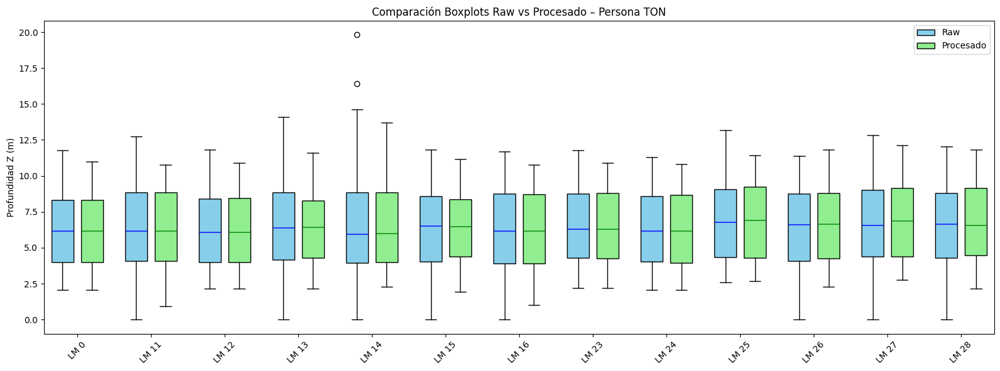


==== Persona: ZAR ====

### Estadísticas Raw – Persona ZAR ###
LM 0 -> Media: 4.666, Mediana: 3.712, Std: 2.585
LM 11 -> Media: 4.608, Mediana: 3.682, Std: 2.497
LM 12 -> Media: 4.863, Mediana: 3.787, Std: 2.986
LM 13 -> Media: 4.819, Mediana: 3.809, Std: 2.584
LM 14 -> Media: 4.715, Mediana: 3.851, Std: 2.713
LM 15 -> Media: 4.845, Mediana: 3.908, Std: 2.563
LM 16 -> Media: 4.661, Mediana: 3.874, Std: 2.477
LM 23 -> Media: 4.913, Mediana: 3.985, Std: 2.607
LM 24 -> Media: 4.940, Mediana: 3.859, Std: 2.819
LM 25 -> Media: 5.088, Mediana: 4.100, Std: 2.758
LM 26 -> Media: 4.981, Mediana: 4.002, Std: 2.517
LM 27 -> Media: 5.116, Mediana: 4.257, Std: 2.446
LM 28 -> Media: 5.095, Mediana: 4.294, Std: 2.466

### Estadísticas Procesado – Persona ZAR ###
LM 0 -> Media: 4.666, Mediana: 3.705, Std: 2.559
LM 11 -> Media: 4.604, Mediana: 3.792, Std: 2.283
LM 12 -> Media: 4.861, Mediana: 3.776, Std: 2.838
LM 13 -> Media: 4.819, Mediana: 3.882, Std: 2.478
LM 14 -> Media: 4.712, Mediana: 3.819, Std

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


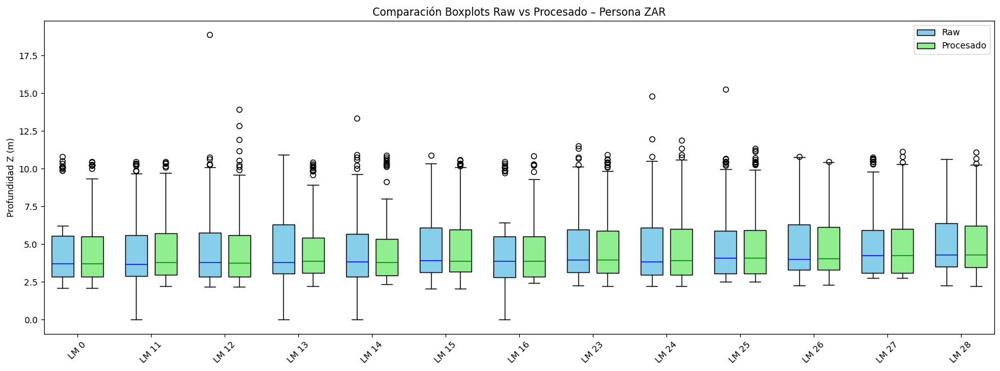


### Estadísticas Raw – Persona ZAR ###
LM 0 -> Media: 3.674, Mediana: 3.073, Std: 1.784
LM 11 -> Media: 3.819, Mediana: 3.194, Std: 1.846
LM 12 -> Media: 3.780, Mediana: 3.133, Std: 1.822
LM 13 -> Media: 3.693, Mediana: 3.107, Std: 1.917
LM 14 -> Media: 3.722, Mediana: 3.267, Std: 1.933
LM 15 -> Media: 3.905, Mediana: 3.120, Std: 1.854
LM 16 -> Media: 3.763, Mediana: 3.343, Std: 1.877
LM 23 -> Media: 3.979, Mediana: 3.245, Std: 2.172
LM 24 -> Media: 3.853, Mediana: 3.144, Std: 1.882
LM 25 -> Media: 4.021, Mediana: 3.566, Std: 1.799
LM 26 -> Media: 4.020, Mediana: 3.286, Std: 1.804
LM 27 -> Media: 4.124, Mediana: 3.746, Std: 1.729
LM 28 -> Media: 4.103, Mediana: 3.348, Std: 1.710

### Estadísticas Procesado – Persona ZAR ###
LM 0 -> Media: 3.676, Mediana: 3.056, Std: 1.773
LM 11 -> Media: 3.821, Mediana: 3.164, Std: 1.830
LM 12 -> Media: 3.780, Mediana: 3.124, Std: 1.811
LM 13 -> Media: 3.706, Mediana: 3.176, Std: 1.742
LM 14 -> Media: 3.728, Mediana: 3.116, Std: 1.767
LM 15 -> Media: 

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


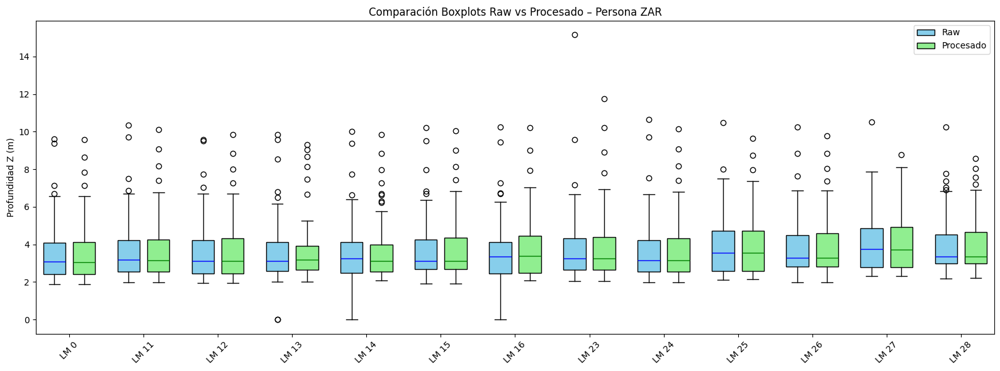


### Estadísticas Raw – Persona ZAR ###
LM 0 -> Media: 3.821, Mediana: 3.235, Std: 1.381
LM 11 -> Media: 3.954, Mediana: 3.308, Std: 1.408
LM 12 -> Media: 3.660, Mediana: 3.235, Std: 1.476
LM 13 -> Media: 3.221, Mediana: 3.037, Std: 1.779
LM 14 -> Media: 3.911, Mediana: 3.429, Std: 1.637
LM 15 -> Media: 3.547, Mediana: 3.124, Std: 1.977
LM 16 -> Media: 3.993, Mediana: 3.513, Std: 1.449
LM 23 -> Media: 4.011, Mediana: 3.401, Std: 1.360
LM 24 -> Media: 4.041, Mediana: 3.404, Std: 1.490
LM 25 -> Media: 4.330, Mediana: 3.815, Std: 1.608
LM 26 -> Media: 4.239, Mediana: 3.519, Std: 1.436
LM 27 -> Media: 4.365, Mediana: 3.870, Std: 1.486
LM 28 -> Media: 4.310, Mediana: 3.544, Std: 1.402

### Estadísticas Procesado – Persona ZAR ###
LM 0 -> Media: 3.826, Mediana: 3.292, Std: 1.383
LM 11 -> Media: 3.959, Mediana: 3.412, Std: 1.398
LM 12 -> Media: 3.691, Mediana: 3.385, Std: 1.120
LM 13 -> Media: 3.262, Mediana: 3.015, Std: 0.783
LM 14 -> Media: 3.915, Mediana: 3.110, Std: 1.498
LM 15 -> Media: 

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


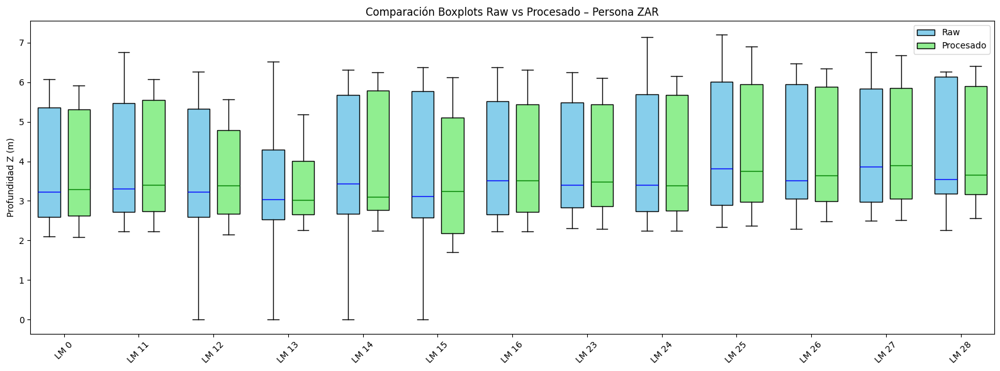


### Estadísticas Raw – Persona ZAR ###
LM 0 -> Media: 3.682, Mediana: 3.007, Std: 1.643
LM 11 -> Media: 3.832, Mediana: 3.166, Std: 1.689
LM 12 -> Media: 3.810, Mediana: 3.052, Std: 1.781
LM 13 -> Media: 3.548, Mediana: 3.132, Std: 1.890
LM 14 -> Media: 3.847, Mediana: 3.184, Std: 2.022
LM 15 -> Media: 3.923, Mediana: 3.230, Std: 1.704
LM 16 -> Media: 3.997, Mediana: 3.243, Std: 2.276
LM 23 -> Media: 3.940, Mediana: 3.251, Std: 1.707
LM 24 -> Media: 3.699, Mediana: 3.048, Std: 1.728
LM 25 -> Media: 3.881, Mediana: 3.235, Std: 1.769
LM 26 -> Media: 4.055, Mediana: 3.290, Std: 1.735
LM 27 -> Media: 4.156, Mediana: 3.775, Std: 1.723
LM 28 -> Media: 4.103, Mediana: 3.423, Std: 1.821

### Estadísticas Procesado – Persona ZAR ###
LM 0 -> Media: 3.699, Mediana: 3.000, Std: 1.615
LM 11 -> Media: 3.848, Mediana: 3.146, Std: 1.666
LM 12 -> Media: 3.829, Mediana: 3.043, Std: 1.738
LM 13 -> Media: 3.591, Mediana: 3.151, Std: 1.326
LM 14 -> Media: 3.856, Mediana: 3.240, Std: 1.784
LM 15 -> Media: 

/tmp/ipykernel_4724/2591058779.py:39: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,


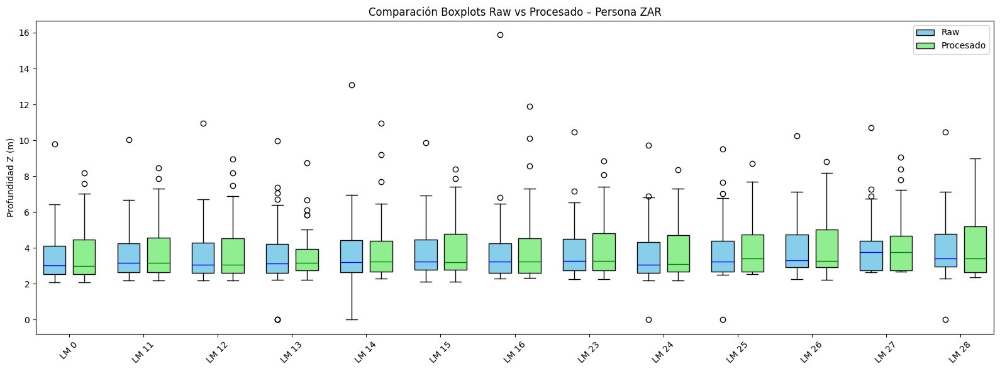

In [32]:
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
import numpy as np

# ---------------- CONFIGURACIÓN ----------------
RAW_DIR = Path("annotations")             
PROCESSED_DIR = Path("annotations_processed")  
LANDMARK_IDS = [0, 11, 12, 13, 14, 15, 16, 23, 24, 25, 26, 27, 28]

# Agregamos la columna "persona" a qc_df
qc_df["persona"] = qc_df["etiqueta"].str.split("_").str[0]

# Tomamos el primer archivo por persona
rep_files = (
    qc_df
    .sort_values("archivo")
    .groupby("persona")
    .first()
    .reset_index()
)

# ---------------- FUNCIONES ----------------
def plot_box_comparison(df_raw, df_proc, persona):
    """
    Boxplots comparativos por landmark antes (raw) y después (procesado)
    """
    z_raw = [df_raw[f"z{lm}"].dropna() for lm in LANDMARK_IDS]
    z_proc = [df_proc[f"z{lm}"].dropna() for lm in LANDMARK_IDS]
    
    labels = [f"LM {lm}" for lm in LANDMARK_IDS]
    
    plt.figure(figsize=(16,6))
    # Posiciones para raw vs proc
    positions_raw = np.arange(len(LANDMARK_IDS))*2.0
    positions_proc = positions_raw + 0.8
    
    # Boxplots
    bp1 = plt.boxplot(z_raw, positions=positions_raw, widths=0.6, patch_artist=True,
                      boxprops=dict(facecolor="skyblue"), medianprops=dict(color="blue"),
                      labels=labels)
    
    bp2 = plt.boxplot(z_proc, positions=positions_proc, widths=0.6, patch_artist=True,
                      boxprops=dict(facecolor="lightgreen"), medianprops=dict(color="green"))
    
    plt.xticks(positions_raw + 0.4, labels, rotation=45)
    plt.ylabel("Profundidad Z (m)")
    plt.title(f"Comparación Boxplots Raw vs Procesado – Persona {persona}")
    plt.legend([bp1["boxes"][0], bp2["boxes"][0]], ["Raw", "Procesado"])
    plt.tight_layout()
    plt.show()
    
def print_stats(df, persona, tag="Raw"):
    print(f"\n### Estadísticas {tag} – Persona {persona} ###")
    for lm in LANDMARK_IDS:
        data = df[f"z{lm}"].dropna()
        print(f"LM {lm} -> Media: {np.mean(data):.3f}, Mediana: {np.median(data):.3f}, Std: {np.std(data):.3f}")

# ---------------- ITERAR POR PERSONA ----------------
for persona in rep_files["persona"]:
    print(f"\n==== Persona: {persona} ====")
    
    archivos_persona = qc_df[qc_df["persona"] == persona]["archivo"]
    
    for archivo in archivos_persona:
        raw_path = RAW_DIR / archivo
        proc_path = PROCESSED_DIR / archivo
        
        df_raw = pd.read_csv(raw_path)
        df_proc = pd.read_csv(proc_path)
        
        # Mostrar estadísticas antes y después
        print_stats(df_raw, persona, "Raw")
        print_stats(df_proc, persona, "Procesado")
        
        # Boxplots comparativos
        plot_box_comparison(df_raw, df_proc, persona)


# Normalización Antropométrica (Espacial)

Para eliminar la dependencia del tamaño del sujeto, se calcula la distancia media entre los hombros izquierdo y derecho (x11, y11, z11 y x12, y12, z12) como referencia. Todos los landmarks se escalan dividiendo sus coordenadas por esta distancia, de manera que las proporciones relativas del cuerpo se mantengan consistentes entre participantes.

Cada serie temporal de cada coordenada (x, y, z) de los landmarks se re-muestrea a un número fijo de puntos (N_POINTS = 101). Esto permite comparar ciclos completos de movimiento entre diferentes grabaciones y participantes, independientemente de la duración de cada grabación.

Las series se estrandarizan usando Z-score (media = 0, desviación estándar = 1). Esto centra los datos y los escala según su variabilidad, ayudando a que los modelos se concentren en la dinámica relativa del movimiento y no en los valores absolutos.

In [34]:
import pandas as pd
import numpy as np
from scipy.interpolate import interp1d
from pathlib import Path
from sklearn.preprocessing import StandardScaler


RAW_DIR = Path("annotations_processed")  # CSV ya filtrados
NORMALIZED_DIR = Path("annotations_normalized")
NORMALIZED_DIR.mkdir(exist_ok=True)

LANDMARK_IDS = [0, 11, 12, 13, 14, 15, 16, 23, 24, 25, 26, 27, 28]
N_POINTS = 101  # Para normalización temporal

def normalize_landmarks(df, lm_ids, ref_lms=(11,12), n_points=N_POINTS, zscore=True):
    df_norm = pd.DataFrame()
    
    # Referencia hombros
    dist_ref = np.sqrt(
        (df["x11"] - df["x12"])**2 + 
        (df["y11"] - df["y12"])**2 + 
        (df["z11"] - df["z12"])**2
    ).mean()
    
    for lm in lm_ids:
        for axis in ["x","y","z"]:
            col = f"{axis}{lm}"
            series = df[col] / dist_ref  # antropométrica
            f = interp1d(np.linspace(0,1,len(series)), series)
            series_resampled = f(np.linspace(0,1,n_points))  # temporal
            
            # Escalar Z-score si se desea
            if zscore:
                scaler = StandardScaler()
                series_resampled = scaler.fit_transform(series_resampled.reshape(-1,1)).flatten()
            
            df_norm[col] = series_resampled
    
    return df_norm

# ---------------- PROCESAR TODOS LOS ARCHIVOS ----------------
for csv_file in RAW_DIR.glob("*.csv"):
    df = pd.read_csv(csv_file)
    df_norm = normalize_landmarks(df, LANDMARK_IDS)
    
    out_file = NORMALIZED_DIR / csv_file.name
    df_norm.to_csv(out_file, index=False)

print(f"Normalización completa. Archivos guardados en: {NORMALIZED_DIR}")


Normalización completa. Archivos guardados en: annotations_normalized


Este proceso asegura que los landmarks de todos los sujetos estén en un mismo sistema de referencia espacial y temporal, listo para análisis estadístico, extracción de características o entrada a modelos de aprendizaje automático.

### Persona: DIA ###


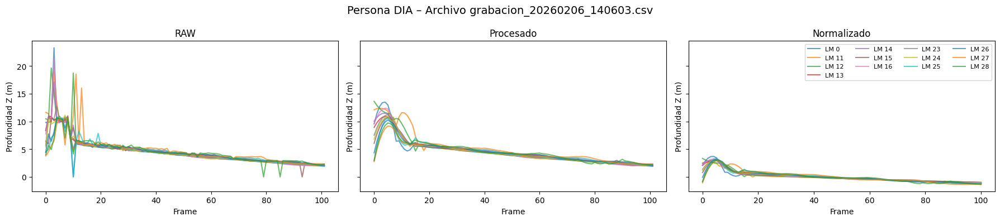

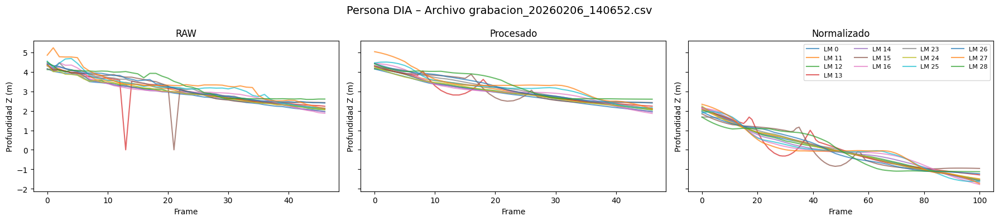

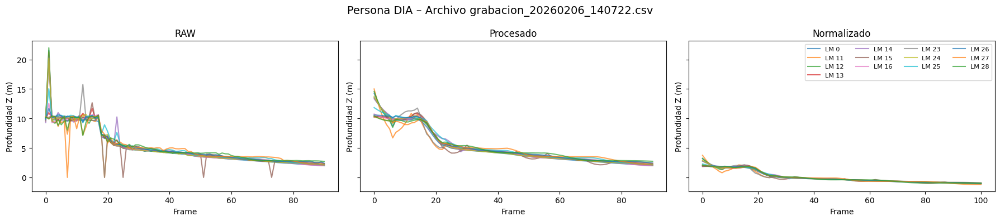

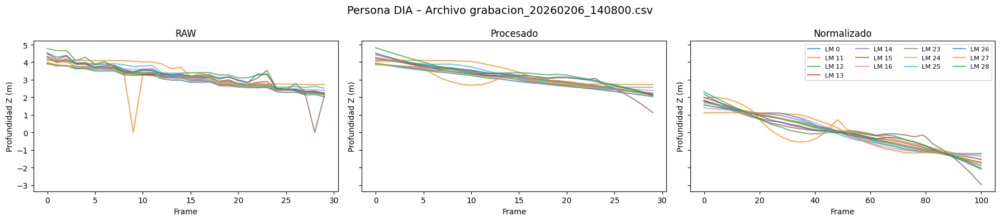

### Persona: EDG ###


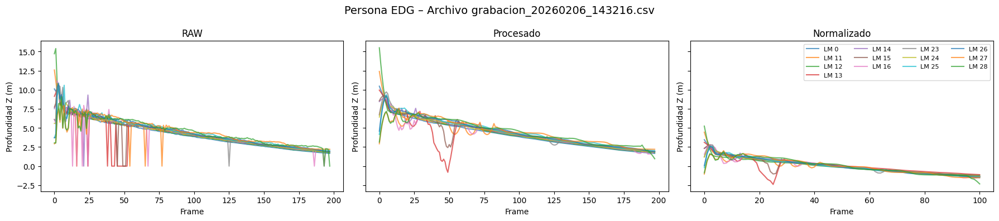

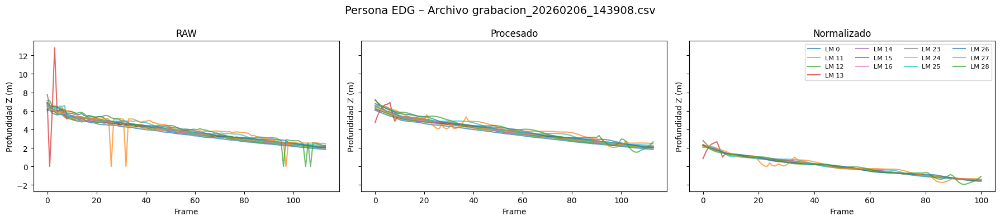

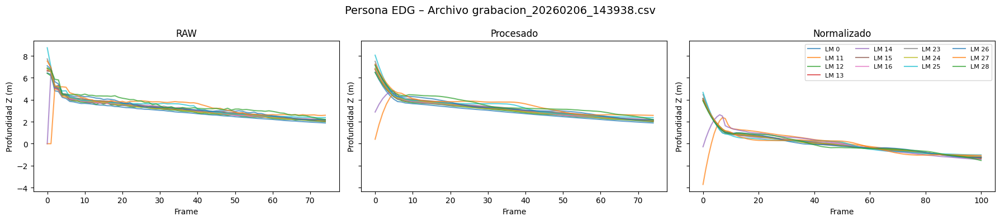

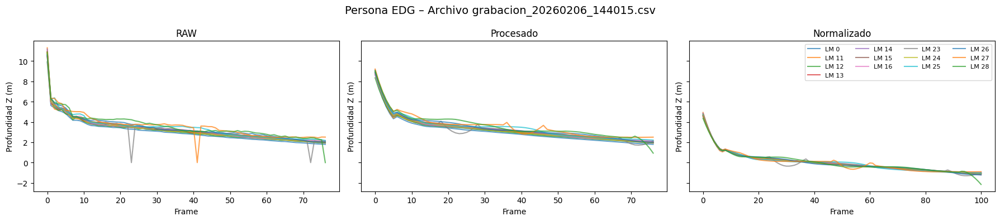

In [36]:
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
from scipy.interpolate import interp1d
from sklearn.preprocessing import StandardScaler

# ---------------- CONFIGURACIÓN ----------------
RAW_DIR = Path("annotations")             
PROCESSED_DIR = Path("annotations_processed")
NORMALIZED_DIR = Path("annotations_normalized")  # suponiendo que ya guardaste aquí
LANDMARK_IDS = [0, 11, 12, 13, 14, 15, 16, 23, 24, 25, 26, 27, 28]
N_POINTS = 101  # puntos para normalización temporal

# ---------------- FUNCIONES ----------------
def normalize_landmarks(df, lm_ids, ref_lms=(11,12), n_points=N_POINTS, zscore=True):
    df_norm = pd.DataFrame()
    dist_ref = np.sqrt(
        (df["x11"] - df["x12"])**2 + 
        (df["y11"] - df["y12"])**2 + 
        (df["z11"] - df["z12"])**2
    ).mean()
    
    for lm in lm_ids:
        for axis in ["x","y","z"]:
            col = f"{axis}{lm}"
            series = df[col] / dist_ref
            f = interp1d(np.linspace(0,1,len(series)), series)
            series_resampled = f(np.linspace(0,1,n_points))
            if zscore:
                series_resampled = StandardScaler().fit_transform(series_resampled.reshape(-1,1)).flatten()
            df_norm[col] = series_resampled
    return df_norm

def plot_landmarks_three(df_raw, df_proc, df_norm, persona, archivo):
    fig, axes = plt.subplots(1,3, figsize=(18,4), sharey=True)
    
    for lm in LANDMARK_IDS:
        axes[0].plot(df_raw[f"z{lm}"], label=f"LM {lm}", alpha=0.7)
        axes[1].plot(df_proc[f"z{lm}"], label=f"LM {lm}", alpha=0.7)
        axes[2].plot(df_norm[f"z{lm}"], label=f"LM {lm}", alpha=0.7)
    
    axes[0].set_title("RAW")
    axes[1].set_title("Procesado")
    axes[2].set_title("Normalizado")
    
    for ax in axes:
        ax.set_xlabel("Frame")
        ax.set_ylabel("Profundidad Z (m)")
    
    axes[2].legend(ncol=4, fontsize=8)
    fig.suptitle(f"Persona {persona} – Archivo {archivo}", fontsize=14)
    plt.tight_layout()
    plt.show()

# ---------------- SELECCIÓN DE 2 EJEMPLOS ----------------
qc_df["persona"] = qc_df["etiqueta"].str.split("_").str[0]
rep_files = qc_df.sort_values("archivo").groupby("persona").first().reset_index()
ejemplos = rep_files["persona"].tolist()[:2]  # los 2 primeros IDs

# ---------------- PLOTEO ----------------
for persona in ejemplos:
    print(f"### Persona: {persona} ###")
    archivos_persona = qc_df[qc_df["persona"] == persona]["archivo"]
    
    for archivo in archivos_persona:
        raw_path = RAW_DIR / archivo
        proc_path = PROCESSED_DIR / archivo
        
        # Leer CSV
        df_raw = pd.read_csv(raw_path)
        df_proc = pd.read_csv(proc_path)
        df_norm = normalize_landmarks(df_proc, LANDMARK_IDS)
        
        # ---------------- PLOTEO en fila de 3 ----------------
        plot_landmarks_three(df_raw, df_proc, df_norm, persona, archivo)


### Persona: DIA ###


/tmp/ipykernel_4724/1340434622.py:40: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[0].boxplot(raw_data, labels=[f"LM {lm}" for lm in LANDMARK_IDS], showfliers=True)
/tmp/ipykernel_4724/1340434622.py:41: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[1].boxplot(proc_data, labels=[f"LM {lm}" for lm in LANDMARK_IDS], showfliers=True)
/tmp/ipykernel_4724/1340434622.py:42: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[2].boxplot(norm_data, labels=[f"LM {lm}" for lm in LANDMARK_IDS], showfliers=True)


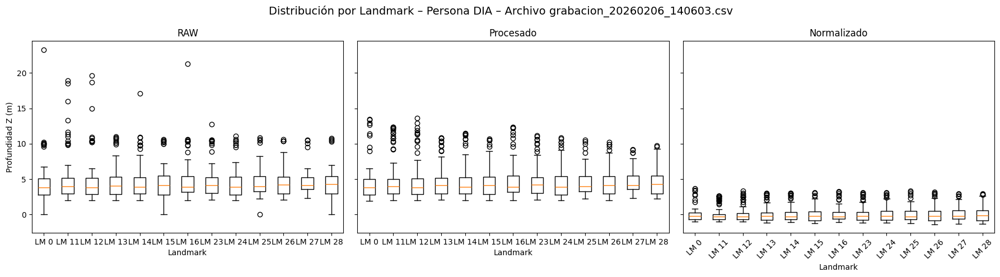

/tmp/ipykernel_4724/1340434622.py:40: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[0].boxplot(raw_data, labels=[f"LM {lm}" for lm in LANDMARK_IDS], showfliers=True)
/tmp/ipykernel_4724/1340434622.py:41: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[1].boxplot(proc_data, labels=[f"LM {lm}" for lm in LANDMARK_IDS], showfliers=True)
/tmp/ipykernel_4724/1340434622.py:42: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[2].boxplot(norm_data, labels=[f"LM {lm}" for lm in LANDMARK_IDS], showfliers=True)


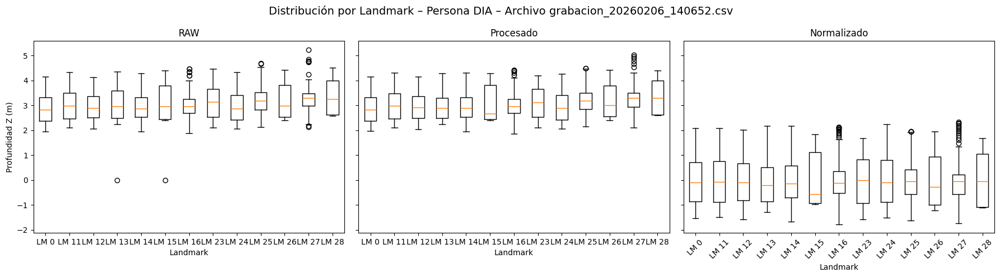

/tmp/ipykernel_4724/1340434622.py:40: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[0].boxplot(raw_data, labels=[f"LM {lm}" for lm in LANDMARK_IDS], showfliers=True)
/tmp/ipykernel_4724/1340434622.py:41: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[1].boxplot(proc_data, labels=[f"LM {lm}" for lm in LANDMARK_IDS], showfliers=True)
/tmp/ipykernel_4724/1340434622.py:42: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[2].boxplot(norm_data, labels=[f"LM {lm}" for lm in LANDMARK_IDS], showfliers=True)


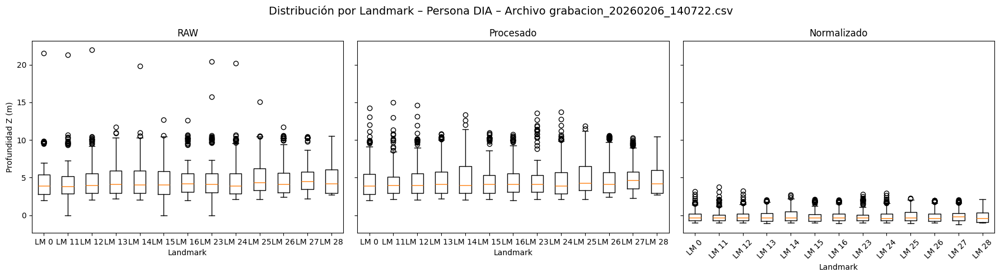

/tmp/ipykernel_4724/1340434622.py:40: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[0].boxplot(raw_data, labels=[f"LM {lm}" for lm in LANDMARK_IDS], showfliers=True)
/tmp/ipykernel_4724/1340434622.py:41: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[1].boxplot(proc_data, labels=[f"LM {lm}" for lm in LANDMARK_IDS], showfliers=True)
/tmp/ipykernel_4724/1340434622.py:42: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[2].boxplot(norm_data, labels=[f"LM {lm}" for lm in LANDMARK_IDS], showfliers=True)


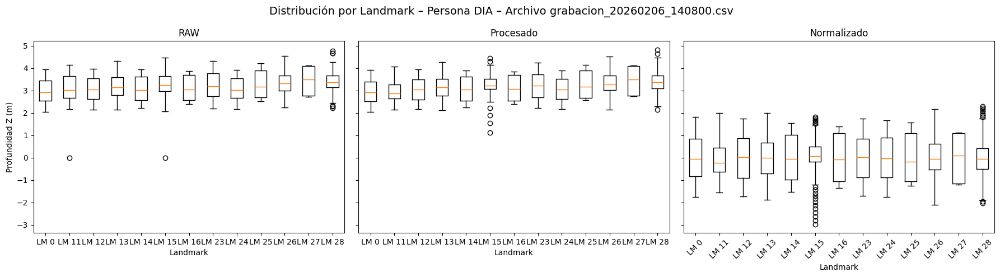

### Persona: EDG ###


/tmp/ipykernel_4724/1340434622.py:40: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[0].boxplot(raw_data, labels=[f"LM {lm}" for lm in LANDMARK_IDS], showfliers=True)
/tmp/ipykernel_4724/1340434622.py:41: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[1].boxplot(proc_data, labels=[f"LM {lm}" for lm in LANDMARK_IDS], showfliers=True)
/tmp/ipykernel_4724/1340434622.py:42: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[2].boxplot(norm_data, labels=[f"LM {lm}" for lm in LANDMARK_IDS], showfliers=True)


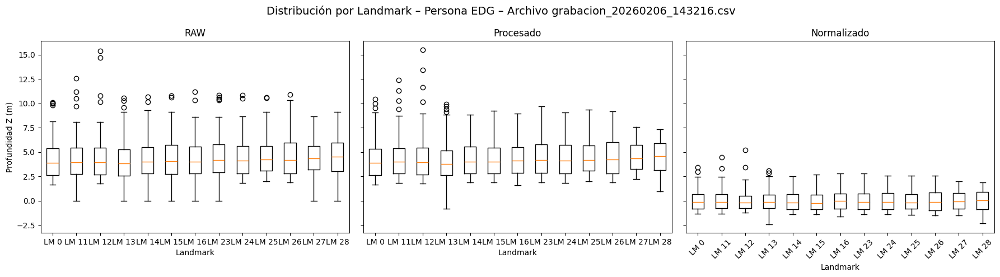

/tmp/ipykernel_4724/1340434622.py:40: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[0].boxplot(raw_data, labels=[f"LM {lm}" for lm in LANDMARK_IDS], showfliers=True)
/tmp/ipykernel_4724/1340434622.py:41: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[1].boxplot(proc_data, labels=[f"LM {lm}" for lm in LANDMARK_IDS], showfliers=True)
/tmp/ipykernel_4724/1340434622.py:42: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[2].boxplot(norm_data, labels=[f"LM {lm}" for lm in LANDMARK_IDS], showfliers=True)


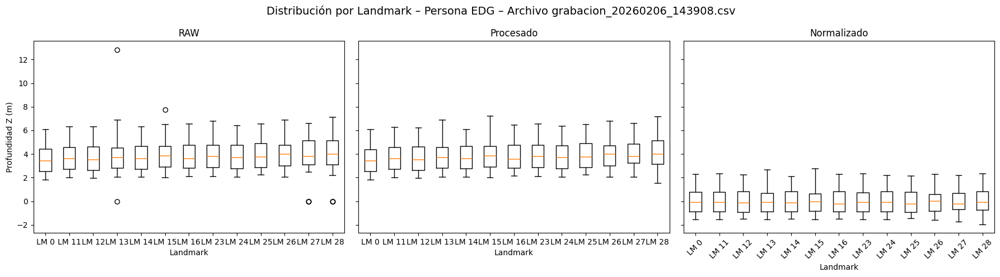

/tmp/ipykernel_4724/1340434622.py:40: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[0].boxplot(raw_data, labels=[f"LM {lm}" for lm in LANDMARK_IDS], showfliers=True)
/tmp/ipykernel_4724/1340434622.py:41: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[1].boxplot(proc_data, labels=[f"LM {lm}" for lm in LANDMARK_IDS], showfliers=True)
/tmp/ipykernel_4724/1340434622.py:42: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[2].boxplot(norm_data, labels=[f"LM {lm}" for lm in LANDMARK_IDS], showfliers=True)


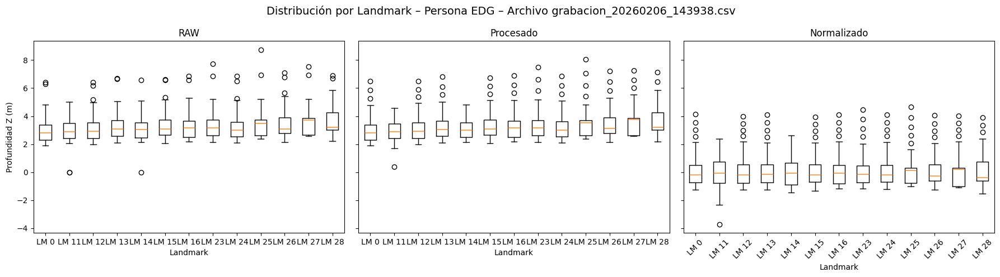

/tmp/ipykernel_4724/1340434622.py:40: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[0].boxplot(raw_data, labels=[f"LM {lm}" for lm in LANDMARK_IDS], showfliers=True)
/tmp/ipykernel_4724/1340434622.py:41: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[1].boxplot(proc_data, labels=[f"LM {lm}" for lm in LANDMARK_IDS], showfliers=True)
/tmp/ipykernel_4724/1340434622.py:42: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[2].boxplot(norm_data, labels=[f"LM {lm}" for lm in LANDMARK_IDS], showfliers=True)


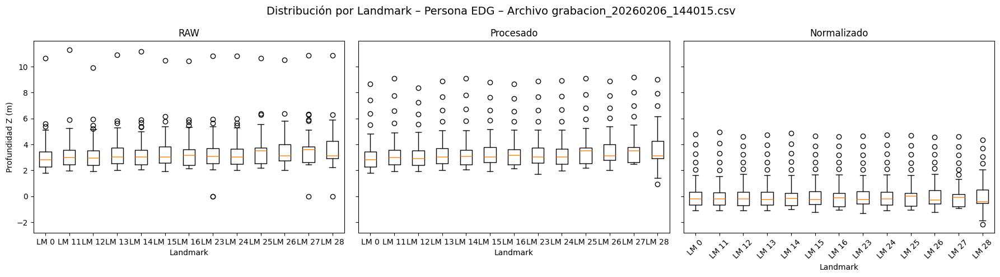

In [37]:
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
from scipy.interpolate import interp1d
from sklearn.preprocessing import StandardScaler

# ---------------- CONFIGURACIÓN ----------------
RAW_DIR = Path("annotations")             
PROCESSED_DIR = Path("annotations_processed")
NORMALIZED_DIR = Path("annotations_normalized")  
LANDMARK_IDS = [0, 11, 12, 13, 14, 15, 16, 23, 24, 25, 26, 27, 28]
N_POINTS = 101  # puntos para normalización temporal

# ---------------- FUNCIONES ----------------
def normalize_landmarks(df, lm_ids, ref_lms=(11,12), n_points=N_POINTS, zscore=True):
    df_norm = pd.DataFrame()
    dist_ref = ((df["x11"] - df["x12"])**2 + (df["y11"] - df["y12"])**2 + (df["z11"] - df["z12"])**2)**0.5
    dist_ref = dist_ref.mean()
    
    for lm in lm_ids:
        for axis in ["x","y","z"]:
            col = f"{axis}{lm}"
            series = df[col] / dist_ref
            f = interp1d(np.linspace(0,1,len(series)), series)
            series_resampled = f(np.linspace(0,1,n_points))
            if zscore:
                series_resampled = StandardScaler().fit_transform(series_resampled.reshape(-1,1)).flatten()
            df_norm[col] = series_resampled
    return df_norm

def plot_boxplots_three(df_raw, df_proc, df_norm, persona, archivo):
    fig, axes = plt.subplots(1,3, figsize=(18,5), sharey=True)
    
    # Preparar los datos
    raw_data = [df_raw[f"z{lm}"].dropna() for lm in LANDMARK_IDS]
    proc_data = [df_proc[f"z{lm}"].dropna() for lm in LANDMARK_IDS]
    norm_data = [df_norm[f"z{lm}"].dropna() for lm in LANDMARK_IDS]
    
    # Graficar boxplots
    axes[0].boxplot(raw_data, labels=[f"LM {lm}" for lm in LANDMARK_IDS], showfliers=True)
    axes[1].boxplot(proc_data, labels=[f"LM {lm}" for lm in LANDMARK_IDS], showfliers=True)
    axes[2].boxplot(norm_data, labels=[f"LM {lm}" for lm in LANDMARK_IDS], showfliers=True)
    
    # Títulos y etiquetas
    axes[0].set_title("RAW")
    axes[1].set_title("Procesado")
    axes[2].set_title("Normalizado")
    for ax in axes:
        ax.set_xlabel("Landmark")
    axes[0].set_ylabel("Profundidad Z (m)")
    
    plt.suptitle(f"Distribución por Landmark – Persona {persona} – Archivo {archivo}", fontsize=14)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# ---------------- SELECCIÓN DE 2 EJEMPLOS ----------------
qc_df["persona"] = qc_df["etiqueta"].str.split("_").str[0]
rep_files = qc_df.sort_values("archivo").groupby("persona").first().reset_index()
ejemplos = rep_files["persona"].tolist()[:2]  # los 2 primeros IDs

# ---------------- PLOTEO ----------------
for persona in ejemplos:
    print(f"### Persona: {persona} ###")
    archivos_persona = qc_df[qc_df["persona"] == persona]["archivo"]
    
    for archivo in archivos_persona:
        raw_path = RAW_DIR / archivo
        proc_path = PROCESSED_DIR / archivo
        
        # Leer CSV
        df_raw = pd.read_csv(raw_path)
        df_proc = pd.read_csv(proc_path)
        df_norm = normalize_landmarks(df_proc, LANDMARK_IDS)
        
        # ---------------- BOXPLOTS en fila de 3 ----------------
        plot_boxplots_three(df_raw, df_proc, df_norm, persona, archivo)


# 3. Extracción de características

### Ángulos (7)

    Rodilla izq/dcha (cadera-rodilla-tobillo)

    Cadera izq/dcha (hombro-cadera-rodilla)

    Pendiente hombros

    Pendiente caderas

    Inclinación tronco

### Paso (3)

    Ancho de paso

    Longitud paso izq/dcha


### Estabilidad (2)

    Variación lateral COM

    Variación vertical COM

In [38]:
import pandas as pd
import numpy as np
from pathlib import Path
from scipy.spatial.distance import euclidean
from math import acos, degrees

# ---------------- CONFIGURACIÓN ----------------
NORMALIZED_DIR = Path("annotations_normalized")
FEATURES_DIR = Path("features")
FEATURES_DIR.mkdir(exist_ok=True)

LANDMARK_IDS = [0, 11, 12, 13, 14, 15, 16, 23, 24, 25, 26, 27, 28]

# ---------------- FUNCIONES AUXILIARES ----------------
def angle_3d(a, b, c):
    """Calcula ángulo en grados en el vértice b definido por a-b-c"""
    ba = np.array(a) - np.array(b)
    bc = np.array(c) - np.array(b)
    cos_angle = np.dot(ba, bc) / (np.linalg.norm(ba)*np.linalg.norm(bc) + 1e-8)
    cos_angle = np.clip(cos_angle, -1.0, 1.0)
    return degrees(acos(cos_angle))

def step_length(z_series):
    """Longitud de paso aproximada: distancia Z entre apoyos consecutivos"""
    return np.max(z_series) - np.min(z_series)

def step_width(x_left, x_right):
    """Ancho de paso: distancia horizontal máxima entre tobillos"""
    return np.max(np.abs(x_left - x_right))

def com_midpoint(df, lm_ids):
    """Centro de masa lateral y vertical como promedio de caderas"""
    x = df[f"x{lm_ids[0]}"].values
    y = df[f"y{lm_ids[0]}"].values
    z = df[f"z{lm_ids[0]}"].values
    x2 = df[f"x{lm_ids[1]}"].values
    y2 = df[f"y{lm_ids[1]}"].values
    z2 = df[f"z{lm_ids[1]}"].values
    return np.vstack([ (x+x2)/2, (y+y2)/2, (z+z2)/2 ]).T

# ---------------- PROCESAMIENTO ----------------
features_list = []

for csv_file in NORMALIZED_DIR.glob("*.csv"):
    persona = csv_file.stem.split("_")[0]  # Nombre persona
    df = pd.read_csv(csv_file)
    
    # Tomar solo filas donde los tobillos y rodillas estén presentes
    valid_idx = df[[f"x27","x28","x25","x26"]].notnull().all(axis=1)
    df = df[valid_idx]
    
    if len(df) < 10:  # evitar videos con muy poca info
        continue
    
    feat = {"persona": persona, "archivo": csv_file.name}
    
    # ---------------- ÁNGULOS ----------------
    # Rodilla izquierda (hip-knee-ankle: 23-25-27)
    feat["angle_knee_left"] = np.mean([angle_3d(
        [df.at[i,"x23"],df.at[i,"y23"],df.at[i,"z23"]],
        [df.at[i,"x25"],df.at[i,"y25"],df.at[i,"z25"]],
        [df.at[i,"x27"],df.at[i,"y27"],df.at[i,"z27"]]
    ) for i in df.index])
    
    # Rodilla derecha (24-26-28)
    feat["angle_knee_right"] = np.mean([angle_3d(
        [df.at[i,"x24"],df.at[i,"y24"],df.at[i,"z24"]],
        [df.at[i,"x26"],df.at[i,"y26"],df.at[i,"z26"]],
        [df.at[i,"x28"],df.at[i,"y28"],df.at[i,"z28"]]
    ) for i in df.index])
    
    # Cadera izquierda (shoulder-hip-knee 11-23-25)
    feat["angle_hip_left"] = np.mean([angle_3d(
        [df.at[i,"x11"],df.at[i,"y11"],df.at[i,"z11"]],
        [df.at[i,"x23"],df.at[i,"y23"],df.at[i,"z23"]],
        [df.at[i,"x25"],df.at[i,"y25"],df.at[i,"z25"]]
    ) for i in df.index])
    
    # Cadera derecha (12-24-26)
    feat["angle_hip_right"] = np.mean([angle_3d(
        [df.at[i,"x12"],df.at[i,"y12"],df.at[i,"z12"]],
        [df.at[i,"x24"],df.at[i,"y24"],df.at[i,"z24"]],
        [df.at[i,"x26"],df.at[i,"y26"],df.at[i,"z26"]]
    ) for i in df.index])
    
    # Pendiente hombros (11-12)
    feat["slope_shoulders"] = np.mean((df["y11"] - df["y12"])/(df["x11"] - df["x12"] + 1e-8))
    
    # Pendiente caderas (23-24)
    feat["slope_hips"] = np.mean((df["y23"] - df["y24"])/(df["x23"] - df["x24"] + 1e-8))
    
    # Inclinación tronco (0-nasas pelvis)
    pelvis_center = np.vstack([ (df["x23"]+df["x24"])/2, (df["y23"]+df["y24"])/2, (df["z23"]+df["z24"])/2 ]).T
    feat["trunk_inclination"] = np.mean([angle_3d(
        [df.at[i,"x0"],df.at[i,"y0"],df.at[i,"z0"]],
        pelvis_center[i],
        [pelvis_center[i,0], pelvis_center[i,1]-1, pelvis_center[i,2]]  # eje vertical aproximado
    ) for i in range(len(df))])
    
    # ---------------- ESPACIO-TEMPORALES ----------------
    feat["step_width"] = step_width(df["x27"], df["x28"])
    feat["step_length_left"] = step_length(df["z27"])
    feat["step_length_right"] = step_length(df["z28"])
    
    # ---------------- SIMETRÍA Y COM ----------------
    com = com_midpoint(df, (23,24))
    feat["com_lat_var"] = np.std(com[:,0])
    feat["com_vert_var"] = np.std(com[:,1])
    
    features_list.append(feat)

# ---------------- GUARDAR CSV ----------------
df_features = pd.DataFrame(features_list)
df_features.to_csv(FEATURES_DIR / "features_cinematica.csv", index=False)
print(f"Extracción completa. CSV de características guardado en: {FEATURES_DIR}")


Extracción completa. CSV de características guardado en: features


Ahora cada frame genere un vector de características para cada uno de los videos

In [39]:
import pandas as pd
import numpy as np
from pathlib import Path

# ---------------- CONFIGURACIÓN ----------------
NORMALIZED_DIR = Path("annotations_normalized")    # CSV normalizados
FEATURES_DIR = Path("annotations_features_per_frame")  # Nueva carpeta
FEATURES_DIR.mkdir(exist_ok=True)

LANDMARK_IDS = [0, 11, 12, 13, 14, 15, 16, 23, 24, 25, 26, 27, 28]

# ---------------- FUNCIONES DE FEATURES ----------------
def compute_features_per_frame(df):
    """
    Calcula features por frame:
    - Ángulos de rodilla y cadera (3D)
    - Pendiente hombros/caderas
    - Inclinación del tronco
    - Ancho y longitud de paso
    - Posición del COM (centro de caderas) y oscilación
    - Simetría entre extremidades
    """
    features = pd.DataFrame()
    
    # Asegurarse que no haya NaN en los landmarks que se usan
    df_valid = df.dropna(subset=[f"{axis}{lm}" for lm in LANDMARK_IDS for axis in "xyz"])
    
    if len(df_valid) == 0:
        return features  # no hay frames válidos
    
    # Centro de caderas
    hip_x = (df_valid["x23"] + df_valid["x24"]) / 2
    hip_y = (df_valid["y23"] + df_valid["y24"]) / 2
    hip_z = (df_valid["z23"] + df_valid["z24"]) / 2
    
    # Vector tronco: nariz (0) -> centro caderas
    trunk_x = df_valid["x0"] - hip_x
    trunk_y = df_valid["y0"] - hip_y
    trunk_z = df_valid["z0"] - hip_z
    trunk_angle = np.arctan2(trunk_y, trunk_z)  # ángulo en YZ
    
    # Pendiente hombros y caderas
    shoulder_slope = (df_valid["y12"] - df_valid["y11"]) / (df_valid["x12"] - df_valid["x11"] + 1e-6)
    hip_slope = (df_valid["y24"] - df_valid["y23"]) / (df_valid["x24"] - df_valid["x23"] + 1e-6)
    
    # Ángulos de rodilla y cadera (flexión)
    def angle_3pts(a, b, c):
        """Devuelve el ángulo en b formado por a-b-c en 3D"""
        ba = a - b
        bc = c - b
        cos_angle = np.sum(ba*bc, axis=1) / (np.linalg.norm(ba, axis=1)*np.linalg.norm(bc, axis=1) + 1e-6)
        return np.arccos(np.clip(cos_angle, -1, 1))
    
    # Coordenadas arrays
    left_hip = df_valid[["x23","y23","z23"]].to_numpy()
    left_knee = df_valid[["x25","y25","z25"]].to_numpy()
    left_ankle = df_valid[["x27","y27","z27"]].to_numpy()
    
    right_hip = df_valid[["x24","y24","z24"]].to_numpy()
    right_knee = df_valid[["x26","y26","z26"]].to_numpy()
    right_ankle = df_valid[["x28","y28","z28"]].to_numpy()
    
    knee_angle_left = angle_3pts(left_hip, left_knee, left_ankle)
    knee_angle_right = angle_3pts(right_hip, right_knee, right_ankle)
    hip_angle_left = angle_3pts(left_shoulder := df_valid[["x11","y11","z11"]].to_numpy(), left_hip, left_knee)
    hip_angle_right = angle_3pts(right_shoulder := df_valid[["x12","y12","z12"]].to_numpy(), right_hip, right_knee)
    
    # Ancho y longitud de paso
    step_width = np.abs(df_valid["x27"] - df_valid["x28"])
    step_length = np.abs(df_valid["z27"] - df_valid["z28"])
    
    # Centro de masa (COM) lateral
    com_y = hip_y
    
    # Simetría entre extremidades
    wrist_diff = np.abs(df_valid["x15"] - df_valid["x16"])  # ejemplo
    
    # Construir DataFrame
    features["knee_left"] = knee_angle_left
    features["knee_right"] = knee_angle_right
    features["hip_left"] = hip_angle_left
    features["hip_right"] = hip_angle_right
    features["trunk_angle"] = trunk_angle
    features["shoulder_slope"] = shoulder_slope
    features["hip_slope"] = hip_slope
    features["step_width"] = step_width
    features["step_length"] = step_length
    features["com_y"] = com_y
    features["wrist_diff"] = wrist_diff
    
    return features

# ---------------- ITERAR ARCHIVOS ----------------
for csv_file in NORMALIZED_DIR.glob("*.csv"):
    df_norm = pd.read_csv(csv_file)
    
    features_df = compute_features_per_frame(df_norm)
    
    out_file = FEATURES_DIR / csv_file.name
    features_df.to_csv(out_file, index=False)
    
print(f"Extracción de features por frame completa. Archivos guardados en: {FEATURES_DIR}")


Extracción de features por frame completa. Archivos guardados en: annotations_features_per_frame


# 4. Construcción y evaluación de modelos

Los hiperparámetros de cada clasificador fueron optimizados mediante búsqueda exhaustiva utilizando validación cruzada estratificada de cuatro pliegues. El rendimiento se evaluó empleando F1-score macro del mejor modelo.

In [99]:
#load headers of a file csv in the folder "annotations_features_per_frame"
FEATURES_DIR = Path("annotations_features_per_frame")
sample_file = next(FEATURES_DIR.glob("*.csv"))
df_sample = pd.read_csv(sample_file)
#print 1 row of the sample file
print("Primera fila del archivo de features por frame:")
print(df_sample.iloc[0])

print(f"Archivo de ejemplo de annotations_features_per_frame: {sample_file.name}")
print(df_sample.columns.tolist())


#print headers from etiquetas.csv
etiquetas_df = pd.read_csv("etiquetas.csv")

#show 1 row of etiquetas.csv
print("Primera fila de etiquetas.csv:")
print(etiquetas_df.iloc[0])
print("Headers de etiquetas.csv:")
print(etiquetas_df.columns.tolist())

Primera fila del archivo de features por frame:
knee_left         0.759446
knee_right        2.299598
hip_left          2.688827
hip_right         1.478655
trunk_angle       1.312063
shoulder_slope    0.043108
hip_slope         0.030538
step_width        3.728546
step_length       0.657713
com_y            -2.064318
wrist_diff        5.707933
Name: 0, dtype: float64
Archivo de ejemplo de annotations_features_per_frame: grabacion_20260206_140652.csv
['knee_left', 'knee_right', 'hip_left', 'hip_right', 'trunk_angle', 'shoulder_slope', 'hip_slope', 'step_width', 'step_length', 'com_y', 'wrist_diff']
Primera fila de etiquetas.csv:
archivo_original    grabacion_20260206_140603.bag
etiqueta                                  DIA_01 
Name: 0, dtype: object
Headers de etiquetas.csv:
['archivo_original', 'etiqueta']


In [54]:
import pandas as pd
import numpy as np
from pathlib import Path
from sklearn.model_selection import StratifiedKFold, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import make_scorer, f1_score

# ---------------- CONFIGURACIÓN ----------------
FEATURES_DIR = Path("annotations_features_per_frame")
LABELS_CSV = Path("etiquetas.csv")

subjects = [
    "DIA", "ZAR", "JAV", "ERI", "EDG", "MIN",
    "IAN", "MAR", "JOS", "NOR", "JOA", "TON", "HUS"
]

# ---------------- LEER ETIQUETAS ----------------
labels_df = pd.read_csv(LABELS_CSV)
labels_df["persona"] = labels_df["etiqueta"].str.split("_").str[0]

# Mapear personas a clases numéricas 1-13
persona_to_class = {name: i+1 for i, name in enumerate(subjects)}
class_to_persona = {v: k for k, v in persona_to_class.items()}

# ---------------- ARMAR DATASET ----------------
X_list = []
y_list = []

for csv_file in FEATURES_DIR.glob("*.csv"):
    df = pd.read_csv(csv_file)
    features_mean = df.mean(axis=0).values  # promedio por grabación
    X_list.append(features_mean)
    
    archivo_name = csv_file.stem + ".bag"
    persona = labels_df.loc[labels_df["archivo_original"] == archivo_name, "persona"].values[0]
    y_list.append(persona_to_class[persona])

X = np.array(X_list)
y = np.array(y_list)

print("Shape X:", X.shape, "Shape y:", y.shape)
print("Mapping persona -> clase:", persona_to_class)

Shape X: (52, 11) Shape y: (52,)
Mapping persona -> clase: {'DIA': 1, 'ZAR': 2, 'JAV': 3, 'ERI': 4, 'EDG': 5, 'MIN': 6, 'IAN': 7, 'MAR': 8, 'JOS': 9, 'NOR': 10, 'JOA': 11, 'TON': 12, 'HUS': 13}


In [55]:

# ---------------- MODELOS Y PARÁMETROS ----------------
models = {
    "RandomForest": RandomForestClassifier(random_state=42),
    "GradientBoosting": GradientBoostingClassifier(random_state=42),
    "KNN": KNeighborsClassifier(),
    "SVM": SVC(probability=True, random_state=42)
}


In [65]:
param_grids = {

    "RandomForest": {
        "classifier__n_estimators": [200, 500, 1000],
        "classifier__max_depth": [None, 10, 20, 50],
        "classifier__min_samples_split": [2, 5, 10],
        "classifier__min_samples_leaf": [1, 2, 4],
        "classifier__max_features": ["sqrt", "log2"],
        "classifier__bootstrap": [True, False]
    },

    "GradientBoosting": {
        "classifier__n_estimators": [100, 200, 500],
        "classifier__learning_rate": [0.01, 0.05, 0.1, 0.2],
        "classifier__max_depth": [3, 5, 7],
        "classifier__min_samples_split": [2, 5, 10],
        "classifier__min_samples_leaf": [1, 2, 4],
        "classifier__subsample": [0.6, 0.8, 1.0]
    },

    "KNN": {
        "classifier__n_neighbors": [3, 5, 7, 9, 11, 15],
        "classifier__weights": ["uniform", "distance"],
        "classifier__p": [1, 2],  # Manhattan vs Euclidean
        "classifier__metric": ["minkowski"]
    },

    "SVM": {
        "classifier__C": [0.01, 0.1, 1, 10, 100],
        "classifier__kernel": ["linear", "rbf"],
        "classifier__gamma": ["scale", "auto"]
    }
}


In [66]:
import warnings

# ---------------- OPCIONES ----------------
warnings.filterwarnings("ignore")  # suprimir warnings
plt.rcParams.update({'figure.max_open_warning': 0})  # evitar warning de matplotlib


In [72]:
import warnings
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
warnings.filterwarnings("ignore")


# ---------------- VALIDACIÓN CRUZADA ----------------
skf = StratifiedKFold(n_splits=4, shuffle=True, random_state=42)
scorer = make_scorer(f1_score, average="macro")

# ---------------- RESULTADOS ----------------
results = {}
best_models = {}     # guardar modelos entrenados
best_params_all = {} # guardar parámetros

# ---------------- GRID SEARCH ----------------
for name, model in models.items():
    print(f"\n--- Modelo: {name} ---")
    
    pipe = Pipeline([
        ("scaler", StandardScaler()),
        ("classifier", model)
    ])
    
    grid = GridSearchCV(
        estimator=pipe,
        param_grid=param_grids[name],
        cv=skf,
        scoring=scorer,
        n_jobs=-1
    )
    
    grid.fit(X, y)
    
    # Guardar
    results[name] = {
        "f1_mean": grid.best_score_
    }
    best_models[name] = grid.best_estimator_
    best_params_all[name] = grid.best_params_
    
    print(f"F1-score (mean CV): {grid.best_score_:.3f}")
    print(f"Mejores parámetros: {grid.best_params_}")



--- Modelo: RandomForest ---


/home/jabonsote/miniconda3/envs/speechbrain/lib/python3.10/multiprocessing/queues.py:122: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  return _ForkingPickler.loads(res)
/home/jabonsote/miniconda3/envs/speechbrain/lib/python3.10/multiprocessing/queues.py:122: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  return _ForkingPickler.loads(res)
/home/jabonsote/miniconda3/envs/speechbrain/lib/python3.10/multiprocessing/queues.py:122: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2

F1-score (mean CV): 0.481
Mejores parámetros: {'classifier__bootstrap': True, 'classifier__max_depth': None, 'classifier__max_features': 'sqrt', 'classifier__min_samples_leaf': 4, 'classifier__min_samples_split': 10, 'classifier__n_estimators': 1000}

--- Modelo: GradientBoosting ---
F1-score (mean CV): 0.401
Mejores parámetros: {'classifier__learning_rate': 0.05, 'classifier__max_depth': 3, 'classifier__min_samples_leaf': 4, 'classifier__min_samples_split': 10, 'classifier__n_estimators': 500, 'classifier__subsample': 0.6}

--- Modelo: KNN ---
F1-score (mean CV): 0.484
Mejores parámetros: {'classifier__metric': 'minkowski', 'classifier__n_neighbors': 3, 'classifier__p': 2, 'classifier__weights': 'distance'}

--- Modelo: SVM ---
F1-score (mean CV): 0.494
Mejores parámetros: {'classifier__C': 1, 'classifier__gamma': 'scale', 'classifier__kernel': 'linear'}


In [73]:
results_df = pd.DataFrame(results).T
results_df = results_df.sort_values("f1_mean", ascending=False)
print("\n=== RESULTADOS FINALES ===")
display(results_df)



=== RESULTADOS FINALES ===


,f1_mean
SVM,0.493590
KNN,0.483974
RandomForest,0.480769
GradientBoosting,0.400641


In [75]:
#save results_df to a csv file
results_df.to_csv("model_comparison_results.csv", index=True)
print("Resultados guardados en model_comparison_results.csv")

Resultados guardados en model_comparison_results.csv


In [84]:
from sklearn.model_selection import cross_val_predict
from sklearn.base import clone
from sklearn.metrics import f1_score
# ---------------- OPCIONES ----------------
warnings.filterwarnings("ignore")  # suprimir warnings


f1_stats = {}

for name, model in best_models.items():
    f1_folds = []
    
    for train_idx, test_idx in skf.split(X, y):
        X_train, X_test = X[train_idx], X[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]
        
        clf = clone(model)
        clf.fit(X_train, y_train)
        y_pred = clf.predict(X_test)
        
        f1_fold = f1_score(y_test, y_pred, average="macro")
        f1_folds.append(f1_fold)
    
    f1_folds = np.array(f1_folds)
    
    f1_stats[name] = {
        "f1_mean": f1_folds.mean(),
        "f1_std": f1_folds.std()
    }
    
    print(
        f"{name} → F1 macro: "
        f"{f1_folds.mean():.3f} ± {f1_folds.std():.3f}"
    )

RandomForest → F1 macro: 0.481 ± 0.090
GradientBoosting → F1 macro: 0.401 ± 0.121
KNN → F1 macro: 0.484 ± 0.083
SVM → F1 macro: 0.494 ± 0.177


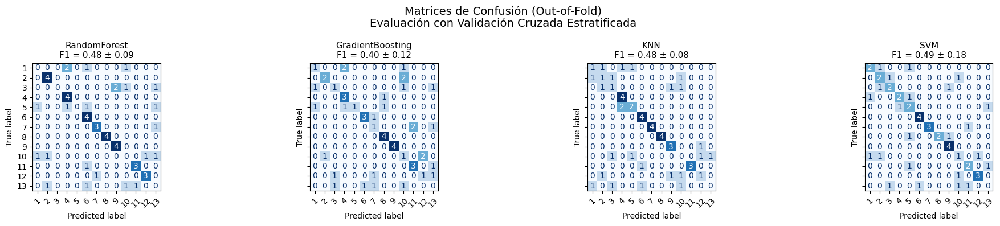

In [85]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import numpy as np
import matplotlib.pyplot as plt

warnings.filterwarnings("ignore")  # suprimir warnings

fig, axes = plt.subplots(
    1, 
    len(best_models), 
    figsize=(5 * len(best_models), 4), 
    sharey=True
)

if len(best_models) == 1:
    axes = [axes]

for ax, (name, model) in zip(axes, best_models.items()):
    
    # Predicciones OOF
    y_pred_oof = cross_val_predict(
        model,
        X,
        y,
        cv=skf,
        n_jobs=-1
    )
    
    cm = confusion_matrix(
        y, 
        y_pred_oof, 
        labels=np.unique(y)
    )
    
    disp = ConfusionMatrixDisplay(
        confusion_matrix=cm,
        display_labels=np.unique(y)
    )
    
    disp.plot(
        ax=ax,
        cmap="Blues",
        colorbar=False,
        xticks_rotation=45
    )
    
    # F1 mean ± std
    f1_mean = f1_stats[name]["f1_mean"]
    f1_std = f1_stats[name]["f1_std"]
    
    ax.set_title(
        f"{name}\nF1 = {f1_mean:.2f} ± {f1_std:.2f}",
        fontsize=11
    )

plt.suptitle(
    "Matrices de Confusión (Out-of-Fold)\nEvaluación con Validación Cruzada Estratificada",
    fontsize=14
)
plt.tight_layout()
plt.show()



---

| Modelo            | F1 macro (OOF)      |
| ----------------- | ------------------- |
| Gradient Boosting | **0.40**           |
| Random Forest     | **0.480**           |
| KNN               | **0.48**           |
| **SVM**           | **⭐ 0.49** |



El desempeño de los modelos fue evaluado mediante validación cruzada estratificada con predicciones out-of-fold (OOF).

Los modelos basados en geometría del espacio de características, como SVM y KNN, tienden a comportarse mejor que los métodos basados en árboles, los cuales requieren una mayor cantidad de datos para estimar particiones robustas, pero siguen siendo bajos o poco practicos

Las características utilizadas corresponden a descriptores cinemáticos continuos como ángulos articulares, oscilación,etc. Este tipo de información favorece a modelos que operan directamente sobre distancias y márgenes en espacios continuos, en contraste con modelos que dependen de decisiones discretas jerárquicas.

Asimismo, la desviación estándar en el caso de SVM, refleja la sensibilidad del modelo a la partición de los datos, lo cual es esperable en escenarios de identificación multiclase con pocas muestras por sujeto.

---


## LSTM

In [7]:
import numpy as np, tensorflow as tf, random

np.random.seed(42)
tf.random.set_seed(42)
random.seed(42)


In [8]:
import numpy as np
import pandas as pd
from pathlib import Path

from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import f1_score

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import (
    Conv1D, MaxPooling1D, LSTM,
    Dense, Dropout, BatchNormalization
)
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping


In [9]:
FEATURES_DIR = Path("annotations_features_per_frame")
LABELS_CSV = Path("etiquetas.csv")

MAX_TIMESTEPS = 300     # ajusta si quieres
RANDOM_SEED = 42


In [10]:
labels_df = pd.read_csv(LABELS_CSV)

labels_df["persona"] = labels_df["etiqueta"].str.split("_").str[0]
labels_df["base_name"] = labels_df["archivo_original"].str.replace(".bag", "", regex=False)


In [11]:
X_sequences = []
y_labels = []

for csv_file in FEATURES_DIR.glob("*.csv"):
    df = pd.read_csv(csv_file)

    # solo columnas numéricas
    df = df.select_dtypes(include=[np.number])

    seq = df.values  # (timesteps, features)

    # padding / truncado
    if seq.shape[0] > MAX_TIMESTEPS:
        seq = seq[:MAX_TIMESTEPS]
    else:
        pad = np.zeros((MAX_TIMESTEPS - seq.shape[0], seq.shape[1]))
        seq = np.vstack([seq, pad])

    X_sequences.append(seq)

    base_name = csv_file.stem

    match = labels_df.loc[
        labels_df["base_name"] == base_name,
        "persona"
    ]

    if match.empty:
        raise ValueError(f"No hay etiqueta para {base_name}")

    y_labels.append(match.values[0])


In [12]:
X = np.array(X_sequences)
y = np.array(y_labels)

print("X shape:", X.shape)  # (samples, timesteps, features)
print("y shape:", y.shape)

encoder = LabelEncoder()
y_enc = encoder.fit_transform(y)
y_cat = to_categorical(y_enc)

NUM_CLASSES = y_cat.shape[1]
NUM_FEATURES = X.shape[2]


X shape: (52, 300, 11)
y shape: (52,)


In [13]:
import pandas as pd
import numpy as np
from pathlib import Path
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import StratifiedKFold
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Masking
from tensorflow.keras.utils import to_categorical


In [11]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import (
    Masking, LSTM, Dense, Dropout, BatchNormalization
)
from tensorflow.keras.optimizers import Adam

model = Sequential([
    Masking(mask_value=0.0, input_shape=(MAX_TIMESTEPS, NUM_FEATURES)),

    LSTM(
        96,
        return_sequences=False,
        dropout=0.25,
        recurrent_dropout=0.25
    ),

    BatchNormalization(),

    Dense(64, activation="relu"),
    Dropout(0.3),

    Dense(NUM_CLASSES, activation="softmax")
])

optimizer = Adam(
    learning_rate=1e-3,
    clipnorm=1.0
)

model.compile(
    optimizer=optimizer,
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

model.summary()


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ masking_1 (Masking)             │ (None, 300, 11)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 96)             │        41,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 96)             │           384 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 64)             │         6,208 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 13)             │           845 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 48,909 (191.05 KB)

 Trainable params: 48,717 (190.30 KB)

 Non-trainable params: 192 (768.00 B)

In [12]:
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical

early_stop = EarlyStopping(
    monitor="val_loss",
    patience=100,
    restore_best_weights=True
)

X_train, X_test, y_train, y_test = train_test_split(
    X,
    y_enc,              # etiquetas ENTERAS
    test_size=0.3,
    stratify=y_enc,
    random_state=42
)

NUM_CLASSES = len(np.unique(y_enc))

y_train_cat = to_categorical(y_train, num_classes=NUM_CLASSES)
y_test_cat = to_categorical(y_test, num_classes=NUM_CLASSES)


In [13]:
history = model.fit(
    X_train,
    y_train_cat,
    epochs=500,
    batch_size=8,
    validation_split=0.2,
    shuffle=True,
    callbacks=[early_stop]
)


Epoch 1/500


4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 492ms/step - accuracy: 0.0000e+00 - loss: 3.2090 - val_accuracy: 0.1250 - val_loss: 2.5462
Epoch 2/500
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 407ms/step - accuracy: 0.2143 - loss: 2.8242 - val_accuracy: 0.1250 - val_loss: 2.5360
Epoch 3/500
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 406ms/step - accuracy: 0.1786 - loss: 2.6939 - val_accuracy: 0.1250 - val_loss: 2.5311
Epoch 4/500
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 405ms/step - accuracy: 0.1071 - loss: 2.7602 - val_accuracy: 0.1250 - val_loss: 2.5292
Epoch 5/500
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 408ms/step - accuracy: 0.2500 - loss: 2.5476 - val_accuracy: 0.1250 - val_loss: 2.5269
Epoch 6/500
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 408ms/step - accuracy: 0.1071 - loss: 2.4982 - val_accuracy: 0.1250 - val_loss: 2.5219
Epoch 7/500
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 402ms/step - accuracy: 0.2857 - loss: 2.3895 - val_accuracy: 0.1250 - val_loss: 2.5281
Epoch 8/500
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 404ms/step - accuracy: 0.2143 - loss: 2.3892 - val_accuracy: 0.1250 - val_loss:

In [14]:
y_pred_prob = model.predict(X_test)
y_pred = np.argmax(y_pred_prob, axis=1)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


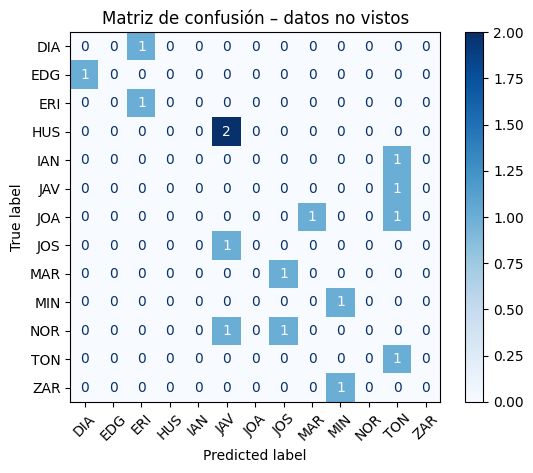

F1-score: 0.133


In [15]:
from sklearn.metrics import (
    confusion_matrix,
    ConfusionMatrixDisplay,
    f1_score
)
import matplotlib.pyplot as plt

# --- Matriz de confusión ---
cm = confusion_matrix(y_test, y_pred)

disp = ConfusionMatrixDisplay(
    confusion_matrix=cm,
    display_labels=encoder.classes_
)

disp.plot(cmap="Blues", xticks_rotation=45)
plt.title("Matriz de confusión – datos no vistos")
plt.show()

# --- F1 score ---
f1_macro = f1_score(y_test, y_pred, average="macro")

print(f"F1-score: {f1_macro:.3f}")
                                                                                  

Durante la fase experimental se implementó una arquitectura baseline basada en **LSTM simple** para modelar las secuencias temporales de la marcha. Sin embargo, los resultados obtenidos fueron **decepcionantes** y evidenciaron las limitaciones de este enfoque para la tarea planteada.

Al evaluar el modelo con una muestra del **propio conjunto de entrenamiento que no había sido utilizada durante la fase de ajuste**, se observó que:

- El modelo presentaba alta varianza en las predicciones
- No lograba capturar transiciones suaves entre fases de la marcha
- La representación latente aprendida era pobre y poco discriminativa

Dado el pobre desempeño del LSTM simple, en la siguiente sección se optará por implementar arquitecturas más avanzadas

# Pipeline Completo

Dado que las métricas F1 no mostraban consistencia ni alcanzaban un punto mínimo de generalización, se optó por rediseñar el procesamiento con el objetivo de evaluar si la eliminación del ruido al inicio y final de las grabaciones para observar si podría mejorar el rendimiento.

Esto por:

- Inicio de la grabación: MediaPipe no logra una detección precisa en los primeros segundos, ya que el sujeto suele encontrarse a una distancia lejana, lo que genera estimaciones ruidosas o inestables.

- Final de la grabación: Hacia el término de algunas tomas, algunas veces salen parcial o totalmente del cuadro, provocando pérdida de información clave sobre su posición.

Adicionalmente, se identificaron errores en la captura de videos de la clase JAV, donde fallas durante la grabación resultaron en información incompleta.

Se implementó un recorte de los extremos temporales de cada secuencia siempre que fuera permitido. Se espera que esta corrección, junto con la incorporación de nuevas características derivadas del movimiento, contribuya a mejorar la calidad de los datos y, consecuentemente, la estabilidad y capacidad de generalización del modelo.

In [6]:
from pathlib import Path
import numpy as np
import pandas as pd
import cv2
import pyrealsense2 as rs
import mediapipe as mp
from mediapipe.tasks import python
from mediapipe.tasks.python import vision
from scipy.signal import savgol_filter


# ================= CONFIG =================

TRAIN_DIR = Path("raw_data")
TEST_DIR = Path("test")

TRAIN_OUT = Path("train_processed")
TEST_OUT = Path("test_processed")

MODEL_PATH = "pose_landmarker_heavy.task"

LANDMARK_IDS = [
    0,
    11, 12,
    13, 14,
    15, 16,
    23, 24,
    25, 26,
    27, 28
]

WINDOW_LENGTH = 7
POLY_ORDER = 2


# ================= UTILIDADES =================

def create_output_structure(base_path):
    raw_dir = base_path / "annotations_raw"
    norm_dir = base_path / "annotations_normalized"
    feat_dir = base_path / "annotations_features_per_frame"

    raw_dir.mkdir(parents=True, exist_ok=True)
    norm_dir.mkdir(parents=True, exist_ok=True)
    feat_dir.mkdir(parents=True, exist_ok=True)

    return raw_dir, norm_dir, feat_dir


def interpolate_and_smooth(df):
    df = df.interpolate(limit_direction="both")
    df = df.bfill().ffill()

    for col in df.columns:
        if col != "frame":
            if len(df[col]) > WINDOW_LENGTH:
                df[col] = savgol_filter(df[col], WINDOW_LENGTH, POLY_ORDER)

    return df


def normalize_landmarks(df):

    df_norm = df.copy()

    hip_left = 23
    hip_right = 24
    shoulder_left = 11
    shoulder_right = 12

    # Centro pelvis
    pelvis_x = (df[f"x{hip_left}"] + df[f"x{hip_right}"]) / 2
    pelvis_y = (df[f"y{hip_left}"] + df[f"y{hip_right}"]) / 2

    for idx in LANDMARK_IDS:
        df_norm[f"x{idx}"] -= pelvis_x
        df_norm[f"y{idx}"] -= pelvis_y

    # Escalado por ancho de hombros
    shoulder_width = np.sqrt(
        (df[f"x{shoulder_left}"] - df[f"x{shoulder_right}"])**2 +
        (df[f"y{shoulder_left}"] - df[f"y{shoulder_right}"])**2
    )

    shoulder_width = shoulder_width.replace(0, 1e-6)

    for idx in LANDMARK_IDS:
        df_norm[f"x{idx}"] /= shoulder_width
        df_norm[f"y{idx}"] /= shoulder_width
        df_norm[f"z{idx}"] /= shoulder_width

    return df_norm


def angle(a, b, c):
    ba = a - b
    bc = c - b
    cos_angle = np.sum(ba * bc, axis=1) / (
        np.linalg.norm(ba, axis=1) *
        np.linalg.norm(bc, axis=1) + 1e-6
    )
    return np.degrees(np.arccos(np.clip(cos_angle, -1.0, 1.0)))


def compute_features(df):

    feat = pd.DataFrame()
    feat["frame"] = df["frame"]

    # Espaciales básicas
    feat["step_width"] = abs(df["x27"] - df["x28"])
    feat["step_length"] = abs(df["z27"] - df["z28"])
    feat["hip_sway"] = df["x23"] - df["x24"]
    feat["shoulder_slope"] = df["y11"] - df["y12"]
    feat["trunk_lean"] = df["x0"] - ((df["x23"] + df["x24"]) / 2)

    # Velocidades
    for col in df.columns:
        if col.startswith("x") or col.startswith("y"):
            feat[f"{col}_vel"] = df[col].diff().fillna(0)

    # Aceleraciones
    for col in df.columns:
        if col.startswith("x") or col.startswith("y"):
            feat[f"{col}_acc"] = df[col].diff().diff().fillna(0)

    # Ángulos rodilla izquierda
    a = df[["x23", "y23"]].values
    b = df[["x25", "y25"]].values
    c = df[["x27", "y27"]].values
    feat["knee_angle_left"] = angle(a, b, c)

    # Ángulos rodilla derecha
    a = df[["x24", "y24"]].values
    b = df[["x26", "y26"]].values
    c = df[["x28", "y28"]].values
    feat["knee_angle_right"] = angle(a, b, c)

    return feat


# ================= PROCESAMIENTO =================

def process_folder(input_dir, output_base):

    raw_out, norm_out, feat_out = create_output_structure(output_base)

    for bag_path in sorted(input_dir.glob("*.bag")):

        print("Procesando:", bag_path.name)

        raw_csv = raw_out / bag_path.with_suffix(".csv").name
        norm_csv = norm_out / bag_path.with_suffix(".csv").name
        feat_csv = feat_out / bag_path.with_suffix(".csv").name

        base_options = python.BaseOptions(model_asset_path=MODEL_PATH)
        options = vision.PoseLandmarkerOptions(
            base_options=base_options,
            running_mode=vision.RunningMode.IMAGE,
            num_poses=1
        )

        pose_landmarker = vision.PoseLandmarker.create_from_options(options)

        pipeline = rs.pipeline()
        config = rs.config()
        rs.config.enable_device_from_file(config, str(bag_path))
        config.enable_stream(rs.stream.depth)
        config.enable_stream(rs.stream.color)

        profile = pipeline.start(config)
        playback = profile.get_device().as_playback()
        playback.set_real_time(False)

        color_stream = profile.get_stream(rs.stream.color)
        fps = color_stream.as_video_stream_profile().fps()

        align = rs.align(rs.stream.color)

        rows = []
        frame_idx = 0

        try:
            while True:
                frames = pipeline.wait_for_frames()
                aligned = align.process(frames)

                depth_frame = aligned.get_depth_frame()
                color_frame = aligned.get_color_frame()
                if not depth_frame or not color_frame:
                    break

                color_img = np.asanyarray(color_frame.get_data())
                rgb = cv2.cvtColor(color_img, cv2.COLOR_BGR2RGB)

                mp_image = mp.Image(
                    image_format=mp.ImageFormat.SRGB,
                    data=rgb
                )

                result = pose_landmarker.detect(mp_image)

                if result.pose_landmarks:
                    lmks = result.pose_landmarks[0]
                    row = [frame_idx]

                    h, w, _ = color_img.shape

                    for idx in LANDMARK_IDS:
                        lm = lmks[idx]
                        px = int(lm.x * w)
                        py = int(lm.y * h)
                        z = depth_frame.get_distance(px, py)

                        row.extend([lm.x, lm.y, z])

                    rows.append(row)

                frame_idx += 1

        except RuntimeError:
            pass

        pipeline.stop()
        pose_landmarker.close()

        if not rows:
            continue

        header = ["frame"]
        for i in LANDMARK_IDS:
            header += [f"x{i}", f"y{i}", f"z{i}"]

        df_raw = pd.DataFrame(rows, columns=header)

        # ================= RECORTE TEMPORAL =================

        total_frames = len(df_raw)
        duration_sec = total_frames / fps

        if duration_sec > 3:
            start_cut = int(1.0 * fps)
            end_cut = int(0.5 * fps)
            df_raw = df_raw.iloc[start_cut: total_frames - end_cut].reset_index(drop=True)
            print("Recorte aplicado")

        df_raw.to_csv(raw_csv, index=False)

        # ================= POSTPROCESO =================

        df_clean = interpolate_and_smooth(df_raw)
        df_norm = normalize_landmarks(df_clean)
        df_feat = compute_features(df_norm)

        df_norm.to_csv(norm_csv, index=False)
        df_feat.to_csv(feat_csv, index=False)

        print("Guardado:", bag_path.name)




In [7]:
print("Procesando TEST")
process_folder(TEST_DIR, TEST_OUT)


print("Procesando TRAIN")
process_folder(TRAIN_DIR, TRAIN_OUT)


Procesando TEST
Procesando: grabacion_20260206_163238.bag


W0000 00:00:1770870904.676377   15853 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770870904.752915   15850 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Guardado: grabacion_20260206_163238.bag
Procesando: grabacion_20260206_163329.bag


W0000 00:00:1770870911.997007   15877 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770870912.055027   15877 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Guardado: grabacion_20260206_163329.bag
Procesando: grabacion_20260206_163516.bag


W0000 00:00:1770870918.193808   15907 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770870918.250115   15916 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Guardado: grabacion_20260206_163516.bag
Procesando: grabacion_20260206_163718.bag


W0000 00:00:1770870926.548475   15934 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770870926.607212   15934 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Guardado: grabacion_20260206_163718.bag
Procesando: grabacion_20260206_163749.bag


W0000 00:00:1770870933.473459   15963 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770870933.524615   15972 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Guardado: grabacion_20260206_163749.bag
Procesando: grabacion_20260206_163827.bag


W0000 00:00:1770870938.805905   15996 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770870938.864126   15999 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Recorte aplicado
Guardado: grabacion_20260206_163827.bag
Procesando: grabacion_20260206_163934.bag


W0000 00:00:1770870951.848921   16026 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770870951.884553   16026 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Guardado: grabacion_20260206_163934.bag
Procesando: grabacion_20260206_164008.bag


W0000 00:00:1770870961.289728   16058 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770870961.347614   16061 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Guardado: grabacion_20260206_164008.bag
Procesando: grabacion_20260206_164123.bag


W0000 00:00:1770870969.799158   16085 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770870969.858133   16085 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Guardado: grabacion_20260206_164123.bag
Procesando: grabacion_20260206_164209.bag


W0000 00:00:1770870978.709147   16117 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770870978.742674   16114 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Guardado: grabacion_20260206_164209.bag
Procesando: grabacion_20260206_164242.bag


W0000 00:00:1770870986.862348   16144 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770870986.908649   16144 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Guardado: grabacion_20260206_164242.bag
Procesando: grabacion_20260206_164315.bag


W0000 00:00:1770870993.013606   16168 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770870993.064303   16166 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Recorte aplicado
Guardado: grabacion_20260206_164315.bag
Procesando TRAIN
Procesando: grabacion_20260206_140603.bag


W0000 00:00:1770871006.334060   16201 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871006.384944   16208 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Recorte aplicado
Guardado: grabacion_20260206_140603.bag
Procesando: grabacion_20260206_140652.bag


W0000 00:00:1770871016.764789   16229 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871016.816238   16239 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Guardado: grabacion_20260206_140652.bag
Procesando: grabacion_20260206_140722.bag


W0000 00:00:1770871022.590025   16260 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871022.626028   16270 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Recorte aplicado
Guardado: grabacion_20260206_140722.bag
Procesando: grabacion_20260206_140800.bag


W0000 00:00:1770871032.146137   16286 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871032.203314   16286 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Guardado: grabacion_20260206_140800.bag
Procesando: grabacion_20260206_140924.bag


W0000 00:00:1770871036.687242   16319 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871036.722855   16325 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Guardado: grabacion_20260206_140924.bag
Procesando: grabacion_20260206_140957.bag


W0000 00:00:1770871044.912569   16344 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871044.967820   16345 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Guardado: grabacion_20260206_140957.bag
Procesando: grabacion_20260206_141027.bag


W0000 00:00:1770871051.442115   16372 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871051.476555   16373 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Guardado: grabacion_20260206_141027.bag
Procesando: grabacion_20260206_141104.bag


W0000 00:00:1770871055.643965   16402 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871055.690700   16407 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Guardado: grabacion_20260206_141104.bag
Procesando: grabacion_20260206_141202.bag


W0000 00:00:1770871061.825865   16429 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871061.882470   16429 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Recorte aplicado
Guardado: grabacion_20260206_141202.bag
Procesando: grabacion_20260206_141348.bag


W0000 00:00:1770871074.192168   16458 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871074.239624   16456 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Guardado: grabacion_20260206_141348.bag
Procesando: grabacion_20260206_141436.bag


W0000 00:00:1770871076.910232   16488 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871076.944695   16496 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Guardado: grabacion_20260206_141436.bag
Procesando: grabacion_20260206_141536.bag


W0000 00:00:1770871079.278835   16513 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871079.331077   16514 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Recorte aplicado
Guardado: grabacion_20260206_141536.bag
Procesando: grabacion_20260206_141750.bag


W0000 00:00:1770871088.763292   16538 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871088.805300   16538 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Recorte aplicado
Guardado: grabacion_20260206_141750.bag
Procesando: grabacion_20260206_141828.bag


W0000 00:00:1770871102.275503   16567 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871102.327397   16576 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Recorte aplicado
Guardado: grabacion_20260206_141828.bag
Procesando: grabacion_20260206_142748.bag


W0000 00:00:1770871115.536268   16600 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871115.562178   16610 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Recorte aplicado
Guardado: grabacion_20260206_142748.bag
Procesando: grabacion_20260206_142901.bag


W0000 00:00:1770871130.960983   16635 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871131.009733   16637 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Recorte aplicado
Guardado: grabacion_20260206_142901.bag
Procesando: grabacion_20260206_143216.bag


W0000 00:00:1770871144.978171   16663 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871145.035117   16663 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Recorte aplicado
Guardado: grabacion_20260206_143216.bag
Procesando: grabacion_20260206_143908.bag


W0000 00:00:1770871162.332663   16697 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871162.380451   16698 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Recorte aplicado
Guardado: grabacion_20260206_143908.bag
Procesando: grabacion_20260206_143938.bag


W0000 00:00:1770871173.244028   16727 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871173.276737   16728 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Guardado: grabacion_20260206_143938.bag
Procesando: grabacion_20260206_144015.bag


W0000 00:00:1770871182.026598   16759 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871182.062562   16761 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Guardado: grabacion_20260206_144015.bag
Procesando: grabacion_20260206_144141.bag


W0000 00:00:1770871191.206183   16792 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871191.251171   16801 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Guardado: grabacion_20260206_144141.bag
Procesando: grabacion_20260206_144302.bag


W0000 00:00:1770871198.522361   16820 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871198.564721   16820 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Guardado: grabacion_20260206_144302.bag
Procesando: grabacion_20260206_144331.bag


W0000 00:00:1770871204.738046   16851 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871204.794021   16851 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Guardado: grabacion_20260206_144331.bag
Procesando: grabacion_20260206_144403.bag


W0000 00:00:1770871210.711003   16878 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871210.742661   16888 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Guardado: grabacion_20260206_144403.bag
Procesando: grabacion_20260206_144604.bag


W0000 00:00:1770871217.580852   16911 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871217.638076   16911 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Guardado: grabacion_20260206_144604.bag
Procesando: grabacion_20260206_144703.bag


W0000 00:00:1770871224.762452   16938 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871224.788483   16945 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Guardado: grabacion_20260206_144703.bag
Procesando: grabacion_20260206_144732.bag


W0000 00:00:1770871230.784807   16969 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871230.830481   16969 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Guardado: grabacion_20260206_144732.bag
Procesando: grabacion_20260206_144808.bag


W0000 00:00:1770871237.770861   16997 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871237.806954   16997 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Guardado: grabacion_20260206_144808.bag
Procesando: grabacion_20260206_144855.bag


W0000 00:00:1770871244.473157   17025 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871244.498822   17034 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Guardado: grabacion_20260206_144855.bag
Procesando: grabacion_20260206_144925.bag


W0000 00:00:1770871249.772631   17052 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871249.807329   17059 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Guardado: grabacion_20260206_144925.bag
Procesando: grabacion_20260206_144951.bag


W0000 00:00:1770871254.673851   17082 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871254.699492   17082 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Guardado: grabacion_20260206_144951.bag
Procesando: grabacion_20260206_145050.bag


W0000 00:00:1770871260.359712   17106 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871260.385542   17116 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Guardado: grabacion_20260206_145050.bag
Procesando: grabacion_20260206_145215.bag


W0000 00:00:1770871265.980420   17137 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871266.016881   17137 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Recorte aplicado
Guardado: grabacion_20260206_145215.bag
Procesando: grabacion_20260206_145240.bag


W0000 00:00:1770871276.233862   17163 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871276.279422   17167 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Recorte aplicado
Guardado: grabacion_20260206_145240.bag
Procesando: grabacion_20260206_145312.bag


W0000 00:00:1770871286.385089   17193 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871286.421534   17203 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Recorte aplicado
Guardado: grabacion_20260206_145312.bag
Procesando: grabacion_20260206_145337.bag


W0000 00:00:1770871296.495752   17225 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871296.530710   17235 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Recorte aplicado
Guardado: grabacion_20260206_145337.bag
Procesando: grabacion_20260206_145450.bag


W0000 00:00:1770871307.029081   17251 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871307.054884   17257 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Recorte aplicado
Guardado: grabacion_20260206_145450.bag
Procesando: grabacion_20260206_145535.bag


W0000 00:00:1770871315.223761   17284 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871315.250255   17292 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Recorte aplicado
Guardado: grabacion_20260206_145535.bag
Procesando: grabacion_20260206_145607.bag


W0000 00:00:1770871323.581124   17306 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871323.617183   17317 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Recorte aplicado
Guardado: grabacion_20260206_145607.bag
Procesando: grabacion_20260206_145723.bag


W0000 00:00:1770871332.342096   17339 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871332.389496   17340 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Guardado: grabacion_20260206_145723.bag
Procesando: grabacion_20260206_150744.bag


W0000 00:00:1770871338.539619   17369 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871338.566403   17375 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Recorte aplicado
Guardado: grabacion_20260206_150744.bag
Procesando: grabacion_20260206_150811.bag


W0000 00:00:1770871347.990681   17395 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871348.029142   17395 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Guardado: grabacion_20260206_150811.bag
Procesando: grabacion_20260206_150845.bag


W0000 00:00:1770871355.380269   17424 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871355.418117   17424 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Guardado: grabacion_20260206_150845.bag
Procesando: grabacion_20260206_150917.bag


W0000 00:00:1770871361.255077   17456 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871361.280990   17454 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Guardado: grabacion_20260206_150917.bag
Procesando: grabacion_20260206_151013.bag


W0000 00:00:1770871368.762446   17486 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871368.798552   17485 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Recorte aplicado
Guardado: grabacion_20260206_151013.bag
Procesando: grabacion_20260206_151037.bag


W0000 00:00:1770871380.686608   17509 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871380.729666   17509 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Guardado: grabacion_20260206_151037.bag
Procesando: grabacion_20260206_151104.bag


W0000 00:00:1770871389.681612   17539 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871389.730299   17544 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Recorte aplicado
Guardado: grabacion_20260206_151104.bag
Procesando: grabacion_20260206_151132.bag


W0000 00:00:1770871401.013560   17572 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871401.039793   17581 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Recorte aplicado
Guardado: grabacion_20260206_151132.bag
Procesando: grabacion_20260206_151222.bag


W0000 00:00:1770871414.406653   17601 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871414.441896   17605 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Guardado: grabacion_20260206_151222.bag
Procesando: grabacion_20260206_151254.bag


W0000 00:00:1770871422.829210   17632 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871422.862243   17643 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Recorte aplicado
Guardado: grabacion_20260206_151254.bag
Procesando: grabacion_20260206_151333.bag


W0000 00:00:1770871432.043382   17668 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871432.078566   17666 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Guardado: grabacion_20260206_151333.bag
Procesando: grabacion_20260206_151401.bag


W0000 00:00:1770871440.996518   17692 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1770871441.032348   17700 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


Guardado: grabacion_20260206_151401.bag


In [10]:
# ver columas de features por frame
sample_feat_file = next((TEST_OUT / "annotations_features_per_frame").glob("*.csv"))
df_sample_feat = pd.read_csv(sample_feat_file)
print("Columnas del CSV de features por frame:")
print(df_sample_feat.columns.tolist())

Columnas del CSV de features por frame:
['frame', 'step_width', 'step_length', 'hip_sway', 'shoulder_slope', 'trunk_lean', 'x0_vel', 'y0_vel', 'x11_vel', 'y11_vel', 'x12_vel', 'y12_vel', 'x13_vel', 'y13_vel', 'x14_vel', 'y14_vel', 'x15_vel', 'y15_vel', 'x16_vel', 'y16_vel', 'x23_vel', 'y23_vel', 'x24_vel', 'y24_vel', 'x25_vel', 'y25_vel', 'x26_vel', 'y26_vel', 'x27_vel', 'y27_vel', 'x28_vel', 'y28_vel', 'x0_acc', 'y0_acc', 'x11_acc', 'y11_acc', 'x12_acc', 'y12_acc', 'x13_acc', 'y13_acc', 'x14_acc', 'y14_acc', 'x15_acc', 'y15_acc', 'x16_acc', 'y16_acc', 'x23_acc', 'y23_acc', 'x24_acc', 'y24_acc', 'x25_acc', 'y25_acc', 'x26_acc', 'y26_acc', 'x27_acc', 'y27_acc', 'x28_acc', 'y28_acc', 'knee_angle_left', 'knee_angle_right']


# 5. Validación Externa

Entrenando modelos con validación cruzada...


======= RESULTADOS VALIDACIÓN CRUZADA =======

SVM - F1 Macro CV: 0.3782
KNN - F1 Macro CV: 0.3237
RandomForest - F1 Macro CV: 0.3462

Mejor modelo: SVM (F1=0.3782)

======= TRAIN COMPLETO =======

F1 Macro Train: 0.8096070596070596

Reporte clasificación:

              precision    recall  f1-score   support

       DIANA       1.00      1.00      1.00         4
       ZARIF       1.00      0.75      0.86         4
      JAVIER       1.00      0.50      0.67         4
        ERIC       0.50      1.00      0.67         4
       EDGAR       1.00      0.50      0.67         4
     MINERVA       0.75      0.75      0.75         4
         IAN       1.00      0.75      0.86         4
      MARIEL       1.00      1.00      1.00         4
        JOSE       1.00      1.00      1.00         4
      NORMAN       0.57      1.00      0.73         4
        JOAN       1.00      0.50      0.67         4
        TONY       1.00      1.00      1.00   

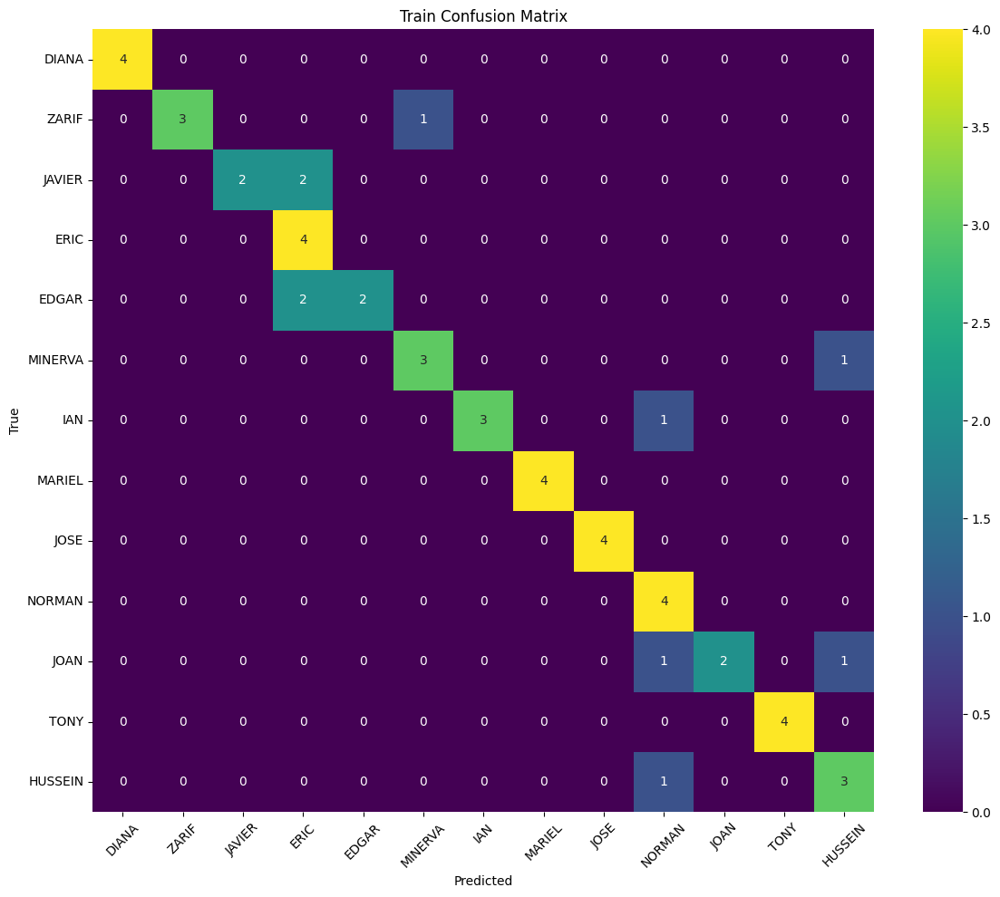


======= TEST EXTERNO =======

grabacion_20260206_163238.csv  →  TONY
grabacion_20260206_163329.csv  →  MINERVA
grabacion_20260206_163516.csv  →  DIANA
grabacion_20260206_163718.csv  →  JOAN
grabacion_20260206_163749.csv  →  MARIEL
grabacion_20260206_163827.csv  →  TONY
grabacion_20260206_163934.csv  →  MINERVA
grabacion_20260206_164008.csv  →  MINERVA
grabacion_20260206_164123.csv  →  MINERVA
grabacion_20260206_164209.csv  →  HUSSEIN
grabacion_20260206_164242.csv  →  MINERVA
grabacion_20260206_164315.csv  →  DIANA

Predicciones guardadas en test_predictions.csv


In [19]:
from pathlib import Path
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import StratifiedKFold, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import (
    f1_score,
    classification_report,
    confusion_matrix
)
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier


# ================= CONFIG =================

TRAIN_FEATURES_DIR = Path("train_processed/annotations_features_per_frame")
TEST_FEATURES_DIR = Path("test_processed/annotations_features_per_frame")

N_SPLITS = 4
RANDOM_STATE = 42


CLASS_NAMES = [
    "DIANA", "ZARIF", "JAVIER", "ERIC", "EDGAR",
    "MINERVA", "IAN", "MARIEL", "JOSE", "NORMAN",
    "JOAN", "TONY", "HUSSEIN"
]

CLASS_TO_LABEL = {name: idx for idx, name in enumerate(CLASS_NAMES)}
LABEL_TO_CLASS = {idx: name for name, idx in CLASS_TO_LABEL.items()}


# ================= UTILIDADES =================

def extract_number_from_filename(filename):
    match = re.search(r"20260206_(\d+)", filename)
    if match:
        return int(match.group(1))
    return 0


def assign_train_labels():

    files = sorted(
        TRAIN_FEATURES_DIR.glob("*.csv"),
        key=lambda x: extract_number_from_filename(x.name)
    )

    labeled_data = []
    person_idx = 0
    video_counter = 0

    for file in files:
        labeled_data.append((file, person_idx))

        video_counter += 1
        if video_counter == 4:
            video_counter = 0
            person_idx += 1

    return labeled_data


def load_dataset(labeled_files):

    X, y = [], []

    for file, label in labeled_files:
        df = pd.read_csv(file)
        feature_vector = df.drop(columns=["frame"]).mean().values
        X.append(feature_vector)
        y.append(label)

    return np.array(X), np.array(y)


# ================= MATRIZ DE CONFUSIÓN COLOR =================

def plot_confusion_matrix(y_true, y_pred, title="Confusion Matrix"):

    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(12, 10))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        cmap="viridis",
        xticklabels=CLASS_NAMES,
        yticklabels=CLASS_NAMES
    )

    plt.title(title)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.tight_layout()

    plt.show()


# ================= MODELOS ROBUSTOS =================

def train_models(X, y):

    models = {}

    # ----- SVM -----
    svm_pipeline = Pipeline([
        ("scaler", StandardScaler()),
        ("clf", SVC())
    ])

    svm_param_grid = {
        "clf__C": [0.01, 0.1, 1, 10, 100],
        "clf__kernel": ["linear", "rbf", "poly"],
        "clf__gamma": ["scale", "auto"],
        "clf__degree": [2, 3]
    }

    svm_grid = GridSearchCV(
        svm_pipeline,
        svm_param_grid,
        cv=StratifiedKFold(n_splits=N_SPLITS, shuffle=True, random_state=RANDOM_STATE),
        scoring="f1_macro",
        n_jobs=-1
    )

    svm_grid.fit(X, y)
    models["SVM"] = (svm_grid.best_estimator_, svm_grid.best_score_)

    # ----- KNN -----
    knn_pipeline = Pipeline([
        ("scaler", StandardScaler()),
        ("clf", KNeighborsClassifier())
    ])

    knn_param_grid = {
        "clf__n_neighbors": [3, 5, 7, 9, 11],
        "clf__weights": ["uniform", "distance"],
        "clf__metric": ["euclidean", "manhattan"]
    }

    knn_grid = GridSearchCV(
        knn_pipeline,
        knn_param_grid,
        cv=StratifiedKFold(n_splits=N_SPLITS, shuffle=True, random_state=RANDOM_STATE),
        scoring="f1_macro",
        n_jobs=-1
    )

    knn_grid.fit(X, y)
    models["KNN"] = (knn_grid.best_estimator_, knn_grid.best_score_)

    # ----- Random Forest -----
    rf_model = RandomForestClassifier(random_state=RANDOM_STATE)

    rf_param_grid = {
        "n_estimators": [200, 400],
        "max_depth": [None, 10, 20, 40],
        "min_samples_split": [2, 5],
        "min_samples_leaf": [1, 2]
    }

    rf_grid = GridSearchCV(
        rf_model,
        rf_param_grid,
        cv=StratifiedKFold(n_splits=N_SPLITS, shuffle=True, random_state=RANDOM_STATE),
        scoring="f1_macro",
        n_jobs=-1
    )

    rf_grid.fit(X, y)
    models["RandomForest"] = (rf_grid.best_estimator_, rf_grid.best_score_)

    return models


# ================= TEST EXTERNO =================

def evaluate_external_test(model):

    files = sorted(
        TEST_FEATURES_DIR.glob("*.csv"),
        key=lambda x: extract_number_from_filename(x.name)
    )

    predictions = []

    print("\n======= TEST EXTERNO =======\n")

    for file in files:

        df = pd.read_csv(file)
        X_test = df.drop(columns=["frame"]).mean().values.reshape(1, -1)

        pred = model.predict(X_test)[0]
        predicted_name = LABEL_TO_CLASS[pred]

        print(f"{file.name}  →  {predicted_name}")

        predictions.append({
            "filename": file.name,
            "predicted_label": pred,
            "predicted_name": predicted_name
        })

    pd.DataFrame(predictions).to_csv("test_predictions.csv", index=False)
    print("\nPredicciones guardadas en test_predictions.csv")


# ================= MAIN =================

def main():

    labeled_files = assign_train_labels()
    X, y = load_dataset(labeled_files)

    print("Entrenando modelos con validación cruzada...\n")

    models = train_models(X, y)

    print("\n======= RESULTADOS VALIDACIÓN CRUZADA =======\n")

    for name, (model, score) in models.items():
        print(f"{name} - F1 Macro CV: {score:.4f}")

    # Elegir mejor modelo
    best_model_name = max(models, key=lambda k: models[k][1])
    best_model, best_score = models[best_model_name]

    print(f"\nMejor modelo: {best_model_name} (F1={best_score:.4f})")

    # Reentrenar con TODO el train
    best_model.fit(X, y)

    # Evaluación interna (confusión train completa)
    y_pred_train = best_model.predict(X)

    print("\n======= TRAIN COMPLETO =======\n")
    print("F1 Macro Train:", f1_score(y, y_pred_train, average="macro"))
    print("\nReporte clasificación:\n")
    print(classification_report(y, y_pred_train, target_names=CLASS_NAMES))

    plot_confusion_matrix(y, y_pred_train, "Train Confusion Matrix")

    # Test externo
    evaluate_external_test(best_model)


if __name__ == "__main__":
    main()


# ANÁLISIS DE RESULTADOS: TEST EXTERNO Y GENERALIZACIÓN

## Configuración del test externo

| Grupo | Videos | Predicciones | Clase |
|-------|--------|--------|-------------|
| 1-3 | grabacion_20260206_163238 al 163516 | TONY, MINERVA, DIANA | Chica no perteneciente a ninguna clase |
| 4-6 | grabacion_20260206_163718 al 163827 | JOAN, MARIEL, TONY | Joan |
| 7-9 | grabacion_20260206_163934 al 164123 | MINERVA, MINERVA, MINERVA | Chico no perteneciente a ninguna clase |
| 10-12 | grabacion_20260206_164209 al 164315 | HUSSEIN, MINERVA, DIANA | Tony |

---

## Conclusiones 

**El modelo no generaliza.**

A pesar de haber incorporado nuevas características derivadas del movimiento y haber realizado un procesamiento más cuidadoso de los extremos temporales, el desempeño en el test externo fue deficiente. El mejor clasificador clásico mostró una marcada incapacidad para transferir el conocimiento aprendido hacia nuevas condiciones de captura.

### Posibles Factores que explican el fracaso

1. **Cambios en las condiciones de grabación**  
   Aunque mínimos, los cambios en iluminación, fondo o posición relativa de la cámara fueron suficientes para degradar severamente la precisión del modelo por el uso de mediapipe para extraer keypoints.

2. **Nuevos sujetos, nuevas morfologías**  
   El modelo no logró abstraer el patrón de marcha independientemente del individuo. En su lugar, parece haber aprendido características asociadas a rasgos físicos (altura, anchura de hombros, longitud de extremidades) que operan como *firmas biométricas* de cada persona. (no el objetivo, que es la marcha)

3. **Confusión entre identidad y movimiento**  
   Al clasificar correctamente a algunos sujetos vistos durante el entrenamiento pero fallar viedos un poco diferentes con sujetos nuevos, se evidencia que el modelo está resolviendo un problema de **identificación de personas** y no de **clasificación de patrones de marcha**.

---

## Lecciones aprendidas y limitaciones metodológicas

La principal limitación radica en el diseño de la captura: **no basta con más características, se necesita mayor diversidad intra-sujeto**.

Con pocas tomas por persona y ángulo fijo, el modelo carece de ejemplos que representen la variabilidad natural de la marcha de un mismo individuo. Esto lo empuja a buscar atajos basados en rasgos estáticos (proporciones corporales) en lugar de dinámicos (coordinación, fases del paso, simetría).

No se trata de que las características propuestas sean insuficientes; el problema es que, ante la falta de variabilidad intra-clase, el modelo explota cualquier señal estable que le permita diferenciar clases, aunque dicha señal no corresponda al fenómeno de interés.

---

## Propuesta de mejora:

Para que el modelo aprenda genuinamente patrones de marcha y no identidades, se requiere:

1. **Múltiples tomas por persona**  
   - Diferentes distancias a la cámara  
   - Variaciones en el ángulo (perfil, frontal, oblicuo)  
   - Distintas sesiones de grabación (días, vestimenta, calzado)

2. **Inclusión de una clase "nula" o "desconocida"**  
   - Incorporar grabaciones de personas totalmente ajenas al estudio  
   - El modelo debe aprender a reconocer que no todo patrón de marcha pertenece necesariamente a una clase predefinida  
   - Esto permitiría evaluar con mayor rigor la capacidad de generalización

3. **Aumento sustancial del volumen de datos**  
   - Más sujetos, más repeticiones, más condiciones ambientales  
   - Solo con una base rica en variabilidad intra-clase el modelo podrá abstraer lo invariante del movimiento

---

## Conclusión

Con la metodología actual no fue posible alcanzar un modelo generalizable. Si bien las mejoras en procesamiento y extracción de características fueron técnicamente correctas, no atacaban la raíz del problema: **la falta de diversidad en los datos de entrenamiento**.

El camino a seguir implica rediseñar la etapa de captura. No se trata de refinar el procesamiento, sino de generar un corpus que refleje la variabilidad natural de la marcha humana. Sólo así el modelo podrá dejar de identificar personas y comenzar a identificar formas de caminar, y no a clasificar personas por otro tipo de razones.

## LSTM

In [37]:
from pathlib import Path
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf

from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import f1_score, classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.utils.class_weight import compute_class_weight


# ================= CONFIG =================

TRAIN_FEATURES_DIR = Path("train_processed/annotations_features_per_frame")
TEST_FEATURES_DIR = Path("test_processed/annotations_features_per_frame")

WINDOW_SIZE = 20
STEP_SIZE = 5
EPOCHS = 60
BATCH_SIZE = 16
N_SPLITS = 4
RANDOM_STATE = 42

CLASS_NAMES = [
    "DIANA", "ZARIF", "JAVIER", "ERIC", "EDGAR",
    "MINERVA", "IAN", "MARIEL", "JOSE", "NORMAN",
    "JOAN", "TONY", "HUSSEIN"
]

CLASS_TO_LABEL = {name: idx for idx, name in enumerate(CLASS_NAMES)}
LABEL_TO_CLASS = {idx: name for name, idx in CLASS_TO_LABEL.items()}


# ================= UTIL =================

def extract_number(filename):
    match = re.search(r"20260206_(\d+)", filename)
    return int(match.group(1)) if match else 0


def sliding_window(sequence, window=20, step=5):
    windows = []
    for i in range(0, len(sequence) - window + 1, step):
        windows.append(sequence[i:i+window])
    return np.array(windows)


def load_train_sequences():

    files = sorted(TRAIN_FEATURES_DIR.glob("*.csv"),
                   key=lambda x: extract_number(x.name))

    X, y = [], []
    person_idx = 0
    video_counter = 0

    for file in files:

        df = pd.read_csv(file)
        seq = df.drop(columns=["frame"]).values

        windows = sliding_window(seq, WINDOW_SIZE, STEP_SIZE)

        X.extend(windows)
        y.extend([person_idx]*len(windows))

        video_counter += 1
        if video_counter == 4:
            video_counter = 0
            person_idx += 1

    return np.array(X), np.array(y)


# ================= MODELO LSTM AVANZADO =================

def build_model(input_shape, num_classes):

    inputs = tf.keras.Input(shape=input_shape)

    x = tf.keras.layers.Bidirectional(
        tf.keras.layers.LSTM(128, return_sequences=True,
                             kernel_regularizer=tf.keras.regularizers.l2(1e-4))
    )(inputs)

    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Dropout(0.4)(x)

    x = tf.keras.layers.Bidirectional(
        tf.keras.layers.LSTM(64,
                             kernel_regularizer=tf.keras.regularizers.l2(1e-4))
    )(x)

    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Dropout(0.4)(x)

    x = tf.keras.layers.Dense(64, activation="relu",
                              kernel_regularizer=tf.keras.regularizers.l2(1e-4))(x)

    outputs = tf.keras.layers.Dense(num_classes, activation="softmax")(x)

    model = tf.keras.Model(inputs, outputs)

    model.compile(
        optimizer=tf.keras.optimizers.Adam(1e-3),
        loss="sparse_categorical_crossentropy",
        metrics=["accuracy"]
    )

    return model


# ================= CARGAR DATOS =================

X, y = load_train_sequences()

print("Shape ventanas:", X.shape)

scaler = StandardScaler()
X_reshaped = X.reshape(-1, X.shape[-1])
X_scaled = scaler.fit_transform(X_reshaped)
X = X_scaled.reshape(X.shape)

input_shape = (X.shape[1], X.shape[2])
num_classes = len(CLASS_NAMES)


# ================= 4-FOLD CV =================

skf = StratifiedKFold(n_splits=4, shuffle=True, random_state=RANDOM_STATE)

f1_scores = []

for fold, (train_idx, val_idx) in enumerate(skf.split(X, y)):

    print(f"\n===== FOLD {fold+1} =====")

    model = build_model(input_shape, num_classes)

    callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=8, restore_best_weights=True),
        tf.keras.callbacks.ReduceLROnPlateau(patience=4)
    ]

    model.fit(
        X[train_idx], y[train_idx],
        validation_data=(X[val_idx], y[val_idx]),
        epochs=EPOCHS,
        batch_size=BATCH_SIZE,
        verbose=0,
        callbacks=callbacks
    )

    y_pred = np.argmax(model.predict(X[val_idx]), axis=1)

    f1 = f1_score(y[val_idx], y_pred, average="macro")
    f1_scores.append(f1)

    print("F1 Fold:", round(f1,4))

print("\nF1 Macro CV promedio:", round(np.mean(f1_scores),4))


# ================= ENTRENAR FINAL CON TODO =================

model = build_model(input_shape, num_classes)

model.fit(X, y,
          epochs=EPOCHS,
          batch_size=BATCH_SIZE,
          verbose=1)

# ================= TEST EXTERNO =================

files = sorted(TEST_FEATURES_DIR.glob("*.csv"),
               key=lambda x: extract_number(x.name))

print("\n======= TEST EXTERNO =======\n")

for file in files:

    df = pd.read_csv(file)
    seq = df.drop(columns=["frame"]).values

    windows = sliding_window(seq, WINDOW_SIZE, STEP_SIZE)

    windows_scaled = scaler.transform(
        windows.reshape(-1, windows.shape[-1])
    ).reshape(windows.shape)

    probs = model.predict(windows_scaled)
    mean_prob = probs.mean(axis=0)

    pred_class = np.argmax(mean_prob)
    pred_name = LABEL_TO_CLASS[pred_class]

    print(f"{file.name}")
    print("Probabilidades promedio:")
    for i, p in enumerate(mean_prob):
        print(f"   {LABEL_TO_CLASS[i]}: {p:.4f}")

    print("→ Predicción final:", pred_name)
    print("--------------------------------------------------")


Shape ventanas: (502, 20, 59)

===== FOLD 1 =====
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
F1 Fold: 0.8895

===== FOLD 2 =====
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
F1 Fold: 0.8885

===== FOLD 3 =====
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
F1 Fold: 0.854

===== FOLD 4 =====
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
F1 Fold: 0.8987

F1 Macro CV promedio: 0.8827
Epoch 1/60
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.2151 - loss: 2.5181
Epoch 2/60
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.4462 - loss: 1.7272
Epoch 3/60
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.5558 - loss: 1.3296
Epoch 4/60
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.6155 - loss: 1.2020
Epoch 5/60
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.7072 - loss: 0.9686
Epoch 6/60
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.7351 - loss: 0.8699
Epoch 7/60
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.7550 - loss: 0.7723
Epoch 8/60
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accu


---

### Mejoras clave respecto al LSTM simple

| Componente | LSTM Simple | Nueva Arquitectura | Beneficio |
|-----------|------------|-------------------|-----------|
| **Direccionalidad** | Unidireccional | **Bidireccional** | Captura contexto pasado Y futuro del movimiento |
| **Profundidad** | 1 capa LSTM | **2 capas LSTM** | Mayor capacidad de abstracción jerárquica |
| **Regularización** | Ninguna | L2 + Dropout (40%) + BatchNorm | Reduce sobreajuste, mejora generalización |
| **Optimización** | Adam fijo | Adam + ReduceLROnPlateau | Ajusta tasa de aprendizaje dinámicamente |
| **Validación** | Hold-out simple | **4-Fold Stratified CV** | Evaluación más robusta y confiable |
| **Early stopping** | No | Sí (patience=8) | Evita sobreentrenamiento |

---

### Explicación simple de cada componente

**1. LSTM Bidireccional**  
No solo ve lo que pasó antes, sino también lo que viene después. Para analizar la marcha, es fundamental: el movimiento del pie izquierdo cobra sentido cuando sabes lo que hará el derecho.

**2. Dos capas apiladas**  
La primera capa aprende patrones locales (ej: cómo se dobla la rodilla). La segunda capa combina esos patrones en movimientos completos (ej: la fase de balanceo).

**3. BatchNormalization**  
Estabiliza el entrenamiento. Cada capa recibe datos con media 0 y desviación 1, acelerando la convergencia.

**4. Dropout al 40%**  
Apaga aleatoriamente el 40% de las neuronas durante entrenamiento. Obliga al modelo a no depender de una sola ruta y encontrar representaciones más robustas.

**5. Regularización L2**  
Penaliza pesos muy grandes. Evita que el modelo memorice y lo fuerza a generalizar.

**6. ReduceLROnPlateau**  
Cuando el modelo se estanca, reduce la tasa de aprendizaje para hacer ajustes más finos.

**7. 4-Fold Cross Validation**  
Entrena 4 veces, cada vez con una partición diferente como validación. La métrica final es el promedio, mucho más confiable que una sola partición.


---

## RESULTADOS: VALIDACIÓN CRUZADA VS TEST EXTERNO

### Entrenamiento (4-Fold Stratified CV)
- F1 Macro Fold 1: 0.8895
- F1 Macro Fold 2: 0.8885  
- F1 Macro Fold 3: 0.8540
- F1 Macro Fold 4: 0.8987
- **F1 Macro Promedio: 0.8827**

### Test Externo por Grupos

| Grupo | Videos | Sujeto Real | Predicción | Acierto |
|-------|--------|-------------|------------|---------|
| **1-3** | 163238 | Chica (desconocida) | HUSSEIN |- |
| | 163329 | Chica (desconocida) | HUSSEIN | - |
| | 163516 | Chica (desconocida) | HUSSEIN | - |
| **4-6** | 163718 | JOAN | JOAN | SI |
| | 163749 | JOAN | JOAN | SI |
| | 163827 | JOAN | MINERVA | NO |
| **7-9** | 163934 | Chico (desconocido) | HUSSEIN | - |
| | 164008 | Chico (desconocido) | HUSSEIN | - |
| | 164123 | Chico (desconocido) | JOSE | - |
| **10-12**| 164209 | TONY | TONY | SI |
| | 164242 | TONY | TONY | SI |
| | 164315 | TONY | TONY | SI |

---

### Métricas de Desempeño

| Conjunto | Aciertos / Total | Precisión | F1 Macro |
|----------|-----------------|-----------|----------|
| Validación Cruzada (train) | - | - | **0.8827** |
| Sujetos conocidos (JOAN, TONY) | 5/6 | 83.3% | - |
| Sujetos desconocidos | 0/6 | 0.0% | - |


---

## CONCLUSIÓN 

El nuevo modelo **mejoró significativamente** respecto al anterior.

**Lo bueno**: Aprendió correctamente la marcha de JOAN y TONY (5/6 aciertos). Esto demuestra que la arquitectura LSTM bidireccional profunda sí es capaz de capturar patrones de marcha.

**Lo malo**: Con personas desconocidas falla siempre (0/6). Era esperado porque no existe una clase "nula" o "desconocido" que le permita abstenerse, aunque si hay una consistencia en asignar siempre al Doctor Hussein.

**Balance**: El modelo funciona para sujetos vistos durante entrenamiento. El problema no es capacidad de aprendizaje, sino cobertura de datos. Necesitamos más variabilidad por persona y una clase para desconocidos.
